<a href="https://colab.research.google.com/github/dolmani38/Summary2/blob/main/ko_multi-discriminator%20GAN%200926.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Korean Multi-Discriminator GAN


ABSTRACT

----


#4. Implementation


## 4.1 기본 설정...

In [1]:
if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#!pip install keybert
!pip3 install transformers
!pip3 install sentence-transformers

#!pip install sentence-transformers

     |████████████████████████████████| 2.8 MB 2.7 MB/s 
     |████████████████████████████████| 636 kB 55.0 MB/s 
     |████████████████████████████████| 52 kB 1.7 MB/s 
     |████████████████████████████████| 3.3 MB 62.7 MB/s 
     |████████████████████████████████| 895 kB 53.2 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
     |████████████████████████████████| 85 kB 2.6 MB/s 
     |████████████████████████████████| 1.2 MB 13.5 MB/s 
  Created wheel for sentence-transformers: filename=sentence_transformers-2.0.0-py3-none-any.whl size=126710 sha256=09f87103ae8f2263877725c4368977a399b6fe46cab3de9d525d1b3a7e406008
  Stored in directory: /root/.cache/pip/wheels/d1/c1/0f/faafd427f705c4b012274ba60d9a91d75830306811e1355293
Successfully built sentence-transformers


In [3]:
import matplotlib.pyplot as plt
# set seeds for reproducability
from numpy.random import seed
#seed(1)

import pandas as pd
import numpy as np
import string, os 

import urllib.request
import nltk
nltk.download('punkt')

import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [4]:
import torch

# If there's a GPU available...
if torch.cuda.is_available():    

    # Tell PyTorch to use the GPU.    
    device = torch.device("cuda")

    print('There are %d GPU(s) available.' % torch.cuda.device_count())

    print('We will use the GPU:', torch.cuda.get_device_name(0))

# If not...
else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

logout = True

There are 1 GPU(s) available.
We will use the GPU: Tesla T4


In [5]:
# Print iterations progress
class ProgressBar:

    def __init__(self,total=20, prefix = '', suffix = '', decimals = 1, length = 20, fill = '|', printEnd = "\r"):
        self.total = total
        self.prefix = prefix
        self.suffix = suffix
        self.decimals = decimals
        self.length = length
        self.fill = fill
        self.printEnd = printEnd
        self.ite = 0
        self.back_filledLength = 0

    def printProgress(self,iteration, text):
        self.ite += iteration
        percent = ("{0:." + str(self.decimals) + "f}").format(100 * (self.ite / float(self.total)))
        filledLength = int(self.length * self.ite // self.total)
        bar = self.fill * filledLength + '.' * (self.length - filledLength)
        if filledLength > self.back_filledLength or percent == 100:
            if logout:
                print(f'\r{self.prefix} |{bar}| {percent}% {self.suffix}  {text}', end="", flush=True)
            # Print New Line on Complete
            if self.ite == self.total: 
                if logout:
                    print()
        self.back_filledLength = filledLength    

In [6]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms

##4.2 Grammar Discriminator Class

In [7]:
from transformers import BertTokenizer, BertTokenizerFast,AutoTokenizer, BertForSequenceClassification, AdamW, BertConfig, get_linear_schedule_with_warmup
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler, TensorDataset, random_split

import time
import random
import datetime
import pickle

# 간단한 전처리
def clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    txt = txt.replace('=','')
    txt = txt.replace('\"','')   
    txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    txt = txt.replace('..','')
    txt = txt.replace('...','')
    txt = txt.replace(' .','.')
    txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def shuffling(txt):
    txt_list = txt.split(' ')
    random.shuffle(txt_list)
    return ' '.join(txt_list)

def collect_training_dataset_for_grammar_discriminator(sentences_dataset):

    sentences = []
    labels = []

    for txtss in sentences_dataset:
        txtss = clean_text(txtss)
        txts = txtss.strip().split('.')
        for txt in txts:  
            txt = txt.strip()
            if len(txt) > 10:
                #ko_grammar_dataset.append([txt,1])
                txt = txt.replace('.','')
                tf = random.choice([True,False])
                # 정상 또는 비정상 둘중에 하나만 데이터셋에 추가
                if (tf):
                    sentences.append(txt) # '.'의 위치를 보고 True, False를 판단 하기 땜에...
                    labels.append(1)
                else:
                    sentences.append(shuffling(txt))
                    labels.append(0)

    return sentences,labels

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

def format_time(elapsed):
    '''
    Takes a time in seconds and returns a string hh:mm:ss
    '''
    # Round to the nearest second.
    elapsed_rounded = int(round((elapsed)))
    
    # Format as hh:mm:ss
    return str(datetime.timedelta(seconds=elapsed_rounded))

class Grammar_Discriminator:


    def __init__(self, pretraoned_kobert_model_name='bert-base-v2', input_dir=None):

        if input_dir is None:
            self.tokenizer = BertTokenizerFast.from_pretrained(pretraoned_kobert_model_name)
            self.discriminator = BertForSequenceClassification.from_pretrained(
                                    pretraoned_kobert_model_name, # Use the 12-layer BERT model, with an uncased vocab.
                                    num_labels = 2, # The number of output labels--2 for binary classification.
                                                    # You can increase this for multi-class tasks.   
                                    output_attentions = False, # Whether the model returns attentions weights.
                                    output_hidden_states = False, # Whether the model returns all hidden-states.
                                )            
        else:
            self.__load_model(input_dir)




    def set_dataset(self, sentences,labels):
        # Print the original sentence.
        print(' Original: ', sentences[0])

        # Tokenize all of the sentences and map the tokens to thier word IDs.
        input_ids = []
        attention_masks = []

        # For every sentence...
        for i, sent in enumerate(sentences):
            print(f'\r Tokenize {i+1}/{len(sentences)}', end="", flush=True)            
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])
            
            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])

        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0)
        attention_masks = torch.cat(attention_masks, dim=0)
        labels = torch.tensor(labels)

        # Print sentence 0, now as a list of IDs.
        print('Original: ', sentences[0])
        print('Token IDs:', input_ids[0])

        # Training & Validation Split
        # Divide up our training set to use 90% for training and 10% for validation.

        # Combine the training inputs into a TensorDataset.
        dataset = TensorDataset(input_ids, attention_masks, labels)

        # Create a 90-10 train-validation split.

        # Calculate the number of samples to include in each set.
        train_size = int(0.9 * len(dataset))
        val_size = len(dataset) - train_size

        # Divide the dataset by randomly selecting samples.
        train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

        print('{:>5,} training samples'.format(train_size))
        print('{:>5,} validation samples'.format(val_size))

        # The DataLoader needs to know our batch size for training, so we specify it 
        # here. For fine-tuning BERT on a specific task, the authors recommend a batch 
        # size of 16 or 32.
        self.batch_size = 32

        # Create the DataLoaders for our training and validation sets.
        # We'll take training samples in random order. 
        self.train_dataloader = DataLoader(
                    train_dataset,  # The training samples.
                    sampler = RandomSampler(train_dataset), # Select batches randomly
                    batch_size = self.batch_size # Trains with this batch size.
                )

        # For validation the order doesn't matter, so we'll just read them sequentially.
        self.validation_dataloader = DataLoader(
                    val_dataset, # The validation samples.
                    sampler = SequentialSampler(val_dataset), # Pull out batches sequentially.
                    batch_size = self.batch_size # Evaluate with this batch size.
                )        


    def train(self,epochs=4):
        # Tell pytorch to run this model on the GPU.
        self.discriminator.cuda()

        # Get all of the model's parameters as a list of tuples.
        params = list(self.discriminator.named_parameters())

        print('The BERT model has {:} different named parameters.\n'.format(len(params)))

        print('==== Embedding Layer ====\n')

        for p in params[0:5]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== First Transformer ====\n')

        for p in params[5:21]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))

        print('\n==== Output Layer ====\n')

        for p in params[-4:]:
            print("{:<55} {:>12}".format(p[0], str(tuple(p[1].size()))))  

        # Note: AdamW is a class from the huggingface library (as opposed to pytorch) 
        # I believe the 'W' stands for 'Weight Decay fix"
        self.optimizer = AdamW(self.discriminator.parameters(),
                        lr = 2e-5, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )

        # Number of training epochs. The BERT authors recommend between 2 and 4. 
        # We chose to run for 4, but we'll see later that this may be over-fitting the
        # training data.
        #epochs = 2

        # Total number of training steps is [number of batches] x [number of epochs]. 
        # (Note that this is not the same as the number of training samples).
        total_steps = len(self.train_dataloader) * epochs

        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(self.optimizer, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = total_steps)
            
        # This training code is based on the `run_glue.py` script here:
        # https://github.com/huggingface/transformers/blob/5bfcd0485ece086ebcbed2d008813037968a9e58/examples/run_glue.py#L128

        # Set the seed value all over the place to make this reproducible.
        seed_val = 42

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)

        # We'll store a number of quantities such as training and validation loss, 
        # validation accuracy, and timings.
        training_stats = []

        # Measure the total training time for the whole run.
        total_t0 = time.time()

        # For each epoch...
        for epoch_i in range(0, epochs):
            
            # ========================================
            #               Training
            # ========================================
            
            # Perform one full pass over the training set.

            print("")
            print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
            print('Training...')

            # Measure how long the training epoch takes.
            t0 = time.time()

            # Reset the total loss for this epoch.
            total_train_loss = 0

            # Put the model into training mode. Don't be mislead--the call to 
            # `train` just changes the *mode*, it doesn't *perform* the training.
            # `dropout` and `batchnorm` layers behave differently during training
            # vs. test (source: https://stackoverflow.com/questions/51433378/what-does-model-train-do-in-pytorch)
            self.discriminator.train()

            # For each batch of training data...
            for step, batch in enumerate(self.train_dataloader):

                # Progress update every 40 batches.
                if step % 40 == 0 and not step == 0:
                    # Calculate elapsed time in minutes.
                    elapsed = format_time(time.time() - t0)
                    
                    # Report progress.
                    print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(self.train_dataloader), elapsed))

                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using the 
                # `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)

                # Always clear any previously calculated gradients before performing a
                # backward pass. PyTorch doesn't do this automatically because 
                # accumulating the gradients is "convenient while training RNNs". 
                # (source: https://stackoverflow.com/questions/48001598/why-do-we-need-to-call-zero-grad-in-pytorch)
                self.discriminator.zero_grad()        

                # Perform a forward pass (evaluate the model on this training batch).
                # The documentation for this `model` function is here: 
                # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                # It returns different numbers of parameters depending on what arguments
                # arge given and what flags are set. For our useage here, it returns
                # the loss (because we provided labels) and the "logits"--the model
                # outputs prior to activation.
                outputs = self.discriminator(b_input_ids, 
                                    token_type_ids=None, 
                                    attention_mask=b_input_mask, 
                                    labels=b_labels)
                loss, logits = outputs.loss, outputs.logits
                # Accumulate the training loss over all of the batches so that we can
                # calculate the average loss at the end. `loss` is a Tensor containing a
                # single value; the `.item()` function just returns the Python value 
                # from the tensor.
                total_train_loss += loss.item()

                # Perform a backward pass to calculate the gradients.
                loss.backward()

                # Clip the norm of the gradients to 1.0.
                # This is to help prevent the "exploding gradients" problem.
                torch.nn.utils.clip_grad_norm_(self.discriminator.parameters(), 1.0)

                # Update parameters and take a step using the computed gradient.
                # The optimizer dictates the "update rule"--how the parameters are
                # modified based on their gradients, the learning rate, etc.
                self.optimizer.step()

                # Update the learning rate.
                scheduler.step()

            # Calculate the average loss over all of the batches.
            avg_train_loss = total_train_loss / len(self.train_dataloader)            
            
            # Measure how long this epoch took.
            training_time = format_time(time.time() - t0)

            print("")
            print("  Average training loss: {0:.2f}".format(avg_train_loss))
            print("  Training epcoh took: {:}".format(training_time))
                
            # ========================================
            #               Validation
            # ========================================
            # After the completion of each training epoch, measure our performance on
            # our validation set.

            print("")
            print("Running Validation...")

            t0 = time.time()

            # Put the model in evaluation mode--the dropout layers behave differently
            # during evaluation.
            self.discriminator.eval()

            # Tracking variables 
            total_eval_accuracy = 0
            total_eval_loss = 0
            nb_eval_steps = 0

            # Evaluate data for one epoch
            for batch in self.validation_dataloader:
                
                # Unpack this training batch from our dataloader. 
                #
                # As we unpack the batch, we'll also copy each tensor to the GPU using 
                # the `to` method.
                #
                # `batch` contains three pytorch tensors:
                #   [0]: input ids 
                #   [1]: attention masks
                #   [2]: labels 
                b_input_ids = batch[0].to(device)
                b_input_mask = batch[1].to(device)
                b_labels = batch[2].to(device)
                
                # Tell pytorch not to bother with constructing the compute graph during
                # the forward pass, since this is only needed for backprop (training).
                with torch.no_grad():        

                    # Forward pass, calculate logit predictions.
                    # token_type_ids is the same as the "segment ids", which 
                    # differentiates sentence 1 and 2 in 2-sentence tasks.
                    # The documentation for this `model` function is here: 
                    # https://huggingface.co/transformers/v2.2.0/model_doc/bert.html#transformers.BertForSequenceClassification
                    # Get the "logits" output by the model. The "logits" are the output
                    # values prior to applying an activation function like the softmax.
                    outputs = self.discriminator(b_input_ids, 
                                        token_type_ids=None, 
                                        attention_mask=b_input_mask,
                                        labels=b_labels)
                loss, logits = outputs.loss, outputs.logits
                # Accumulate the validation loss.
                total_eval_loss += loss.item()

                # Move logits and labels to CPU
                logits = logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()

                # Calculate the accuracy for this batch of test sentences, and
                # accumulate it over all batches.
                total_eval_accuracy += flat_accuracy(logits, label_ids)
                

            # Report the final accuracy for this validation run.
            avg_val_accuracy = total_eval_accuracy / len(self.validation_dataloader)
            print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

            # Calculate the average loss over all of the batches.
            avg_val_loss = total_eval_loss / len(self.validation_dataloader)
            
            # Measure how long the validation run took.
            validation_time = format_time(time.time() - t0)
            
            print("  Validation Loss: {0:.2f}".format(avg_val_loss))
            print("  Validation took: {:}".format(validation_time))

            # Record all statistics from this epoch.
            training_stats.append(
                {
                    'epoch': epoch_i + 1,
                    'Training Loss': avg_train_loss,
                    'Valid. Loss': avg_val_loss,
                    'Valid. Accur.': avg_val_accuracy,
                    'Training Time': training_time,
                    'Validation Time': validation_time
                }
            )

        print("")
        print("Training complete!")

        print("Total training took {:} (h:mm:ss)".format(format_time(time.time()-total_t0)))
            

        return training_stats

    def save_model(self, output_dir = './model_save/'):
        # Create output directory if needed
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)

        print("Saving model to %s" % output_dir)

        # Save a trained model, configuration and tokenizer using `save_pretrained()`.
        # They can then be reloaded using `from_pretrained()`
        model_to_save = self.discriminator.module if hasattr(self.discriminator, 'module') else self.discriminator  # Take care of distributed/parallel training
        model_to_save.save_pretrained(output_dir)
        self.tokenizer.save_pretrained(output_dir)

        # Good practice: save your training arguments together with the trained model
        # torch.save(args, os.path.join(output_dir, 'training_args.bin'))

    def __load_model(self, input_dir = './drive/MyDrive/Colab Notebooks/summary/en_grammar_check_model'):
        print('Loading BERT tokenizer...')
        self.tokenizer = BertTokenizerFast.from_pretrained(input_dir)
        self.discriminator = BertForSequenceClassification.from_pretrained(input_dir)

    def transfer_learning(self, sentences, train_for = True):
        
        input_ids = []
        attention_masks = []

        # For every sentence...
        for sent in sentences:
            # `encode_plus` will:
            #   (1) Tokenize the sentence.
            #   (2) Prepend the `[CLS]` token to the start.
            #   (3) Append the `[SEP]` token to the end.
            #   (4) Map tokens to their IDs.
            #   (5) Pad or truncate the sentence to `max_length`
            #   (6) Create attention masks for [PAD] tokens.
            encoded_dict = self.tokenizer.encode_plus(
                                sent,                      # Sentence to encode.
                                add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                                max_length = 64,           # Pad & truncate all sentences.
                                pad_to_max_length = True,
                                return_attention_mask = True,   # Construct attn. masks.
                                return_tensors = 'pt',     # Return pytorch tensors.
                                truncation = True,
                        )
            # Add the encoded sentence to the list.    
            input_ids.append(encoded_dict['input_ids'])

            # And its attention mask (simply differentiates padding from non-padding).
            attention_masks.append(encoded_dict['attention_mask'])
        
        if train_for:
            b_labels = torch.ones(len(sentences),dtype=torch.long).to(device)
        else:
            b_labels = torch.zeros(len(sentences),dtype=torch.long).to(device)
        #print(b_labels)
        # Convert the lists into tensors.
        input_ids = torch.cat(input_ids, dim=0).to(device)
        attention_masks = torch.cat(attention_masks, dim=0).to(device)    
        #if str(discriminator1.device) == 'cpu':
        #    pass
        #else:
        #    input_ids = input_ids.to(device)
        #    attention_masks = attention_masks.to(device)        

        outputs = self.discriminator(input_ids, 
                            token_type_ids=None, 
                            attention_mask=attention_masks, 
                                labels=b_labels)

        #print(outputs)
        #return torch.sigmoid(outputs[0][:,1])
        #return outputs[0][:,1]
        return outputs['loss'], outputs['logits']


# 문법 discriminator 활용

In [8]:
g_discriminator = Grammar_Discriminator(input_dir = '/content/drive/MyDrive/Colab Notebooks/summary/ko_grammar_model4')

Loading BERT tokenizer...


In [9]:
txt = ['최근 날씨가 포근해지면서 산을 찾는 사람들도 늘고 있는데요','서비스를 음원 플랫폼 스포티파이가 국내 론칭한다']
g_discriminator.discriminator.to(device)
g_discriminator.transfer_learning(txt)

(tensor(4.3705, device='cuda:0', grad_fn=<NllLossBackward>),
 tensor([[-4.8017,  5.1989],
         [ 4.3898, -4.3509]], device='cuda:0', grad_fn=<AddmmBackward>))

##4.3 Static similarity discriminator class

In [10]:
from sentence_transformers import SentenceTransformer
from transformers import BertTokenizer
from scipy.signal import find_peaks
import matplotlib.pyplot as plt
from scipy.misc import electrocardiogram
import scipy


class Similarity_Discriminator:
    '''
    _instance = None
    _embedder = None
    def __new__(cls,pre_trained_model_name='stsb-roberta-large'):
        if cls._instance is None:
            print('Creating Similarity_Discriminator object')
            cls._instance = super(Similarity_Discriminator, cls).__new__(cls)
            # Put any initialization here.
            cls._embedder = SentenceTransformer(pre_trained_model_name)
        return cls._instance

    '''

    def __init__(self,pre_trained_model_name='stsb-roberta-large'): #'roberta-large-nli-stsb-mean-tokens'):
        print('Creating Similarity_Discriminator object')
        # Put any initialization here.
        self._embedder = SentenceTransformer(pre_trained_model_name,device=device)  
        #self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

    def encode(self,texts):
        return self._embedder.encode(texts,show_progress_bar=False)

    def similarity(self, query_text, org_text_emb):
        queries = nltk.sent_tokenize(query_text)
        query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #query_embeddings = self._embedder.encode(queries,show_progress_bar=False)
        #print(queries)
        #print(org_text_emb)
        
        if len(query_embeddings) == 0:
            return 0.0

        cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_text_emb, "cosine")
        similarity_score = 1.0 - np.min(np.max(cos_scores,axis=1))
        '''
        for query, query_embedding in zip(queries, query_embeddings):
            distances = scipy.spatial.distance.cdist([query_embedding], [org_text_emb], "cosine")[0]
            results = zip(range(len(distances)), distances)
            for idx, distance in results:
                scores.append(1-distance)
        '''
        return similarity_score  
 

###4.3.1 한국어 문장 유사도 pre-trained model 적용

In [11]:
#del s_discriminator

s_discriminator = Similarity_Discriminator(pre_trained_model_name='roberta-large-nli-stsb-mean-tokens')
#s_discriminator = Similarity_Discriminator()

Creating Similarity_Discriminator object


Downloading:   0%|          | 0.00/748 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.00k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/2.00 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/690 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/122 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/456k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/229 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.42G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/239 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/335 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/798k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/191 [00:00<?, ?B/s]

# ExtactiveSummarizer

In [12]:
import nltk
from nltk.corpus import stopwords
from nltk.cluster.util import cosine_distance
from nltk.tokenize import sent_tokenize
import numpy as np
import networkx as nx
import re
import torch
from torch import nn
from transformers import BertTokenizer, BertModel

In [13]:

class ExtactiveSummarizer:
    # 한국어의 경우, 'kykim/bert-kor-base'
    def __init__(self,model_name='bert-base-uncased'):

        #nltk.download('stopwords')
        nltk.download('punkt')

        self.tokenizer = BertTokenizer.from_pretrained(model_name)
        self.model = BertModel.from_pretrained(model_name, return_dict=True, output_attentions=True)
        self.cos = nn.CosineSimilarity(dim=1, eps=1e-6)

        # If there's a GPU available...
        if torch.cuda.is_available():    
            # Tell PyTorch to use the GPU.    
            self.device = torch.device("cuda")
        # If not...
        else:
            self.device = torch.device("cpu")

        self.model.to(self.device)
        self.cos.to(self.device)
        
    def read_article(self,text):        
        sentences =[]        
        sentences = sent_tokenize(text)    
        for sentence in sentences:        
            sentence.replace("[^a-zA-Z0-9]"," ")     
        return sentences

    def sentence_similarity(self,sent1,sent2):
        tok_sent1 = self.tokenizer(sent1, return_tensors="pt")
        tok_sent2 = self.tokenizer(sent2, return_tensors="pt")
        tok_sent1.to(self.device)
        tok_sent2.to(self.device)
        outputs = self.model(**tok_sent1)
        sent_1_pooler_output = outputs.pooler_output

        outputs = self.model(**tok_sent2)
        sent_2_pooler_output = outputs.pooler_output
        return self.cos(sent_1_pooler_output, sent_2_pooler_output).cpu().detach().numpy()

    def get_self_attention_weight(self,sentence):
        tok_sent = self.tokenizer(sentence, return_tensors="pt")
        tok_sent.to(self.device)
        outputs = self.model(**tok_sent)
        
        attentions = torch.stack(outputs.attentions)
        #attention = outputs[-1]  # Output includes attention weights when output_attentions=True
        last_attentions = attentions[11][0][11]
        #print(last_attentions.shape)
        tokens = [self.tokenizer.convert_ids_to_tokens(s) for s in tok_sent['input_ids'].tolist()[0]]
        #print(tokens)
        attention_map = []
        for i,token in enumerate(tokens):
            attention_map.append((i,token,torch.sum(last_attentions[:,i]).item()))
        return attention_map

    # Create similarity matrix among all sentences
    def build_similarity_matrix(self,sentences):
        #create an empty similarity matrix
        similarity_matrix = np.zeros((len(sentences),len(sentences)))
        
        for idx1 in range(len(sentences)):
            for idx2 in range(len(sentences)):
                if idx1!=idx2:
                    similarity_matrix[idx1][idx2] = self.sentence_similarity(sentences[idx1],sentences[idx2])
                    
        return similarity_matrix

    # Generate and return text summary
    def generate_summary(self,text,top_n,min_length=30):
        
        ft = []
        org_sentences = np.array(nltk.sent_tokenize(text))
        for txt in org_sentences:
            if len(txt) > min_length:
                ft.append(txt)
        text = ' '.join(ft)

        #stop_words = stopwords.words('english')
        summarize_text = []
        
        # Step1: read text and tokenize
        sentences = self.read_article(text)
        
        # Steo2: generate similarity matrix across sentences
        sentence_similarity_matrix = self.build_similarity_matrix(sentences)
        
        # Step3: Rank sentences in similarirty matrix
        sentence_similarity_graph = nx.from_numpy_array(sentence_similarity_matrix)
        scores = nx.pagerank(sentence_similarity_graph)
        '''
        #Step4: sort the rank and place top sentences
        ranked_sentences = sorted(((scores[i],s) for i,s in enumerate(sentences)),reverse=True)
        
        #print(ranked_sentences)
        # Step 5: get the top n number of sentences based on rank    
        for i in range(top_n if top_n < len(ranked_sentences) else len(ranked_sentences)):
            summarize_text.append(ranked_sentences[i][1])
        '''
        orderd = [(o,s) for o,s in enumerate(scores)]
        orderd.sort(key=lambda e: e[1],reverse=True)
        top_n = top_n if len(orderd) > top_n else len(orderd)
        a = [orderd[i][0] for i in range(0,top_n)]
        a.sort()
        summ_text = " ".join([sentences[i] for i in a])
        
        # Step 6 : outpur the summarized version
        return summ_text,len(sentences)   # " ".join(summarize_text), len(sentences)  #

In [14]:
es = ExtactiveSummarizer(model_name='kykim/bert-kor-base')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Downloading:   0%|          | 0.00/344k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/80.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/725 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/476M [00:00<?, ?B/s]

Some weights of the model checkpoint at kykim/bert-kor-base were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [15]:
es.sentence_similarity('검사 건수가 줄어드는 주말이지만, 전날 3273명에 이어 역대 두 번째로 높은 수치를 기록했습니다.','검사 줄어드는 주말이지만, 전날 3273명에 이어 건수가 역대 두 번째로 높은 수치를 기록했습니다.')

array([0.96269804], dtype=float32)

In [16]:
es.get_self_attention_weight('검사 건수가 줄어드는 주말이지만, 전날 3273명에 이어 역대 두 번째로 높은 수치를 기록했습니다.')

[(0, '[CLS]', 0.898577868938446),
 (1, '검사', 0.5013380646705627),
 (2, '건', 0.5563266277313232),
 (3, '##수가', 0.8456023335456848),
 (4, '줄어드는', 0.8770961761474609),
 (5, '주말', 0.6293195486068726),
 (6, '##이지만', 1.2746742963790894),
 (7, ',', 0.7676283717155457),
 (8, '전날', 0.22542327642440796),
 (9, '32', 0.03144492208957672),
 (10, '##73', 0.6037900447845459),
 (11, '##명에', 0.2867104411125183),
 (12, '이어', 1.0958592891693115),
 (13, '역대', 1.2786242961883545),
 (14, '두', 0.5708819627761841),
 (15, '번째로', 2.155564785003662),
 (16, '높은', 0.6527972221374512),
 (17, '수치를', 0.4519978165626526),
 (18, '기록', 0.7711131572723389),
 (19, '##했습니다', 0.9891842603683472),
 (20, '.', 5.295561790466309),
 (21, '[SEP]', 1.2404837608337402)]

# 4.4 Document source class

## 한국어 Sample data 수집

In [17]:
import json  
import zipfile  

if False:
    data_1 = None  
    data = None  
    with zipfile.ZipFile("/content/drive/MyDrive/Colab Notebooks/summary/data/사설잡지_2.train_original.json.zip", "r") as z:
        with z.open('train_original.json') as f:  
            data = f.read()  
            data_1 = json.loads(data.decode("utf-8"))

In [18]:
if False:
    data_2 = None  
    data = None  
    with zipfile.ZipFile("/content/drive/MyDrive/Colab Notebooks/summary/data/신문기사_2.train_original.json.zip", "r") as z:
        with z.open('train_original.json') as f:  
            data = f.read()  
            data_2 = json.loads(data.decode("utf-8"))

In [19]:
if False:
    random.shuffle(data_1)
    random.shuffle(data_2)

In [20]:
if False:
    sentences_dataset = []
    gold_summary = []
    for i in range(len(data_2)):
        sentences_dataset.append(' '.join(data_2[i]['article_original']))
        gold_summary.append(data_2[i]['abstractive'])

    for i in range(len(data_1)):
        sentences_dataset.append(' '.join(data_1[i]['article_original']))
        gold_summary.append(data_1[i]['abstractive'])

In [21]:
import pickle
if False:
    with open("/content/drive/MyDrive/Colab Notebooks/summary/data/ko_ai_hub_sample.bin", "wb") as fp:
        pickle.dump([sentences_dataset,gold_summary],fp)

In [22]:
import pickle
if True:
    with open("/content/drive/MyDrive/Colab Notebooks/summary/data/ko_ai_hub_sample.bin", "rb") as fp:
        dt = pickle.load(fp)
    sentences_dataset = dt[0]
    gold_summary = dt[1]

## 4.4.2 source class 구현

In [23]:
# 간단한 전처리
def __clean_text(txt):
    txt = txt.replace('\n',' ')
    txt = txt.replace('\r',' ')    
    #txt = txt.replace('=','')
    #txt = txt.replace('\"','')   
    #txt = txt.replace('\'','')
    #txt = txt.replace(',','')
    #txt = txt.replace('..','')
    #txt = txt.replace('...','')
    txt = txt.replace('.',' ')
    #txt = txt.replace('.','. ')
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')           
    txt = txt.replace('  ',' ')
    txt = txt.replace('  ',' ')    
    txt = txt.replace('  ',' ')   
    txt = txt.replace('  ',' ')             
    return txt.strip()

def get_prepared_doc(txt):
    docs = []
    sentences = np.array(nltk.sent_tokenize(txt))
    for sen in sentences:
        docs.append(__clean_text(sen) +'.')
    return (' '.join(docs)).strip()

In [24]:

combine_matching_table = {}
combine_matching_table['다.'] = '고'
conjunction_table = ['그러던','그래서','그러나','그런데','그리고','그랬더니','그러니까','하지만','그래서']


In [25]:
def combine_sentence(txt):
    for c in combine_matching_table.keys():
        if txt.endswith(c):
            txt = txt.replace(c,combine_matching_table[c])
    return txt

In [26]:


class Source:

    def __init__(self,full_text,org_text,delete_ending = False,attendtion_rate=0.3):
        self.full_text = full_text
        self.org_text = org_text
        self.delete_ending = delete_ending
        self.attendtion_rate = attendtion_rate

    def __crean_text(self, txt):
        txt = txt.replace('\n',' ')
        txt = txt.replace('\r',' ')    
        txt = txt.replace('=','')
        txt = txt.replace('\"','')   
        txt = txt.replace('\'','')
        txt = txt.replace(',','')
        txt = txt.replace('..','')
        txt = txt.replace('...','')
        txt = txt.replace(' .','.')
        txt = txt.replace('.','. ')
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        txt = txt.replace('  ',' ')
        txt = txt.replace('  ',' ')    
        txt = txt.replace('  ',' ')   
        txt = txt.replace('  ',' ')           
        return txt.strip()

    def set_key_rate(self,s_discriminator):
        # full_text에 대한 처리...
        self.full_text = self.__crean_text(self.full_text.strip())
        self.full_sentences = np.array(nltk.sent_tokenize(self.full_text))
        self.s_discriminator = s_discriminator
        self.full_text_emb = self.s_discriminator.encode(self.full_sentences)   

        # original sentance, 즉 source sentence에 대한 처리
        self.org_text = self.__crean_text(self.org_text.strip())
        if logout:
            print('-'*50)
            print(self.org_text)
            print('-'*50)  

        # 두장 이상의 문장이 있는 경우, '그리고' 등의 연결문을 삭제 한다.
        # 그래야 grammar dicsriminator의 성능이 나온다.
        self.org_sentences = np.array(nltk.sent_tokenize(self.org_text))
        self.org_text_emb = self.s_discriminator.encode(self.org_sentences)
        for i,sents in enumerate(self.org_sentences):
            for cj in conjunction_table: 
                if sents.startswith(cj):
                    self.org_sentences[i] = sents[len(cj):].strip()

        #print(s)
        #print(self.org_sentences)
        # 하나의 문장을 token 단위로 잘라서 {index:token} dict을 만든다.
        # 또한, 각 token의 attention을 설정한다.
        self.org_term_set = (' '.join(self.org_sentences)).strip().split(' ')
        self.org_source_length = len(self.org_term_set)
        self.term_table = {}

        self.seps = []
        self.bias_table = {}
        #morp_table = {}
        aw = 0.0
        attentions = []
        self_attentions = es.get_self_attention_weight(self.org_text)
        self_attentions_max = 0
        self_attentions_map = {}
        for index, word in enumerate(self.org_term_set):
            self.term_table[index] = word
            #attention = cosine_similarity(self.full_text,word)
            #attentions.append(attention)
            sa = 0
            for u in range(index,len(self_attentions)):
                if word.lower().replace('.','') == self_attentions[u][1]:
                    sa = self_attentions[u][2]
                    if sa > self_attentions_max:
                        self_attentions_max = sa

            self_attentions_map[index] = sa
            #print(f'{word} \t\t {attention:.4f} {sa:.4f}')
            
        #print('self_attentions_max',self_attentions_max)
        attentions = list(self_attentions_map.values())
        attentions.sort(reverse=True)
        #문장 전체 token의 30%에 attention을 준다.
        trs = attentions[int(len(attentions)*self.attendtion_rate + 0.5)]

        for index, word in enumerate(self.org_term_set):
            self.term_table[index] = word
            self.bias_table[index] = self_attentions_map[index] - trs #self_attentions_max
            #attention = self_attentions_map[index] #cosine_similarity(self.full_text,word)
            self.bias_table[index] = (0.0 if self.bias_table[index] > 0 else -1.0)
            #self.bias_table[index] = (self.bias_table[index] if self.bias_table[index] > 0 else -1.0)
            if len(self.org_term_set) - 1 == index:
                    self.bias_table[index] = 0.1
            '''
            if attention >= trs or index == len(self.org_term_set)-1:
                self.bias_table[index] = self_attentions_map[index] - trs #0.0 #attention
            else:
                self.bias_table[index] = -1.0 #attention #-cosine_similarity(self.full_text,word)
            '''
            
            if word.endswith(('.','?')):
                self.seps.append(index)
                if self.org_source_length - 1 == index:
                    pass
                else:
                    self.term_table[index] = combine_sentence(word)
        #print(self.term_table)
        #print(list(self.bias_table.values()))
        # 또 다른 token 단위의 {index:token} dict을 만드는데, 이는 generator의 조합이
        # 문법적으로 부실할 경우, corrector가 보정할때 '~~고'의 중간 연결문을 
        # 부드럽게 만들기 위해 중간 문장의 '~다.'를 삭제한 dict에 해당한다.
        self.combination_table = {}
        for index, word in enumerate(self.org_term_set):
            self.combination_table[index] = word
            if index < len(self.org_term_set)-1: #중간 문장의 '~다.'를 삭제한다.
                if self.org_term_set[index].endswith('다.'):
                    self.combination_table[index] = word[0:len(word)-2]
        if logout:
            print('Length ------------------------------------|',len(self.term_table))
            print(self.bias_table)
        #print(self.combination_table)
        if len(self.term_table) > 128:
            raise Exception("Too much sentence length.")

    def get_org_sample(self, num):
        return self.org_sentences[np.random.choice(len(self.org_sentences), num)]

    def get_source_embedded_code(self):
        return self.org_text_emb

    def get_random_text(self,rate=0.5):
        cnt = int(len(self.term_table) * rate)
        a = list(self.term_table.keys())
        b = np.random.choice(a, cnt)
        c = [fruit for fruit in a if fruit not in b]
        txt = []
        for i in c:
            txt.append(self.term_table[i])
        return ' '.join(txt).strip(), hash(tuple(b))

## N-Gram Similarity Comparison

https://gist.github.com/gaulinmp/da5825de975ed0ea6a24186434c24fe4

In [27]:
# Get Tuple algorithms 
import re
import math
import numpy as np
from itertools import chain
from collections import Counter
import nltk
from nltk.util import ngrams # This is the ngram magic.
from textblob import TextBlob

NGRAM = 4

re_sent_ends_naive = re.compile(r'[.\n]')
re_stripper_alpha = re.compile('[^a-zA-Z]+')
re_stripper_naive = re.compile('[^a-zA-Z\.\n]')

splitter_naive = lambda x: re_sent_ends_naive.split(re_stripper_naive.sub(' ', x))

sent_detector = nltk.data.load('tokenizers/punkt/english.pickle')

def get_tuples_nosentences(txt):
    """Get tuples that ignores all punctuation (including sentences)."""
    if not txt: return None
    #ng = ngrams(re_stripper_alpha.sub(' ', txt).split(), NGRAM)
    ng = ngrams(txt, NGRAM)
    return list(ng)

def get_tuples_manual_sentences(txt):
    """Naive get tuples that uses periods or newlines to denote sentences."""
    if not txt: return None
    sentences = (x.split() for x in splitter_naive(txt) if x)
    ng = (ngrams(x, NGRAM) for x in sentences if len(x) >= NGRAM)
    return list(chain(*ng))

def get_tuples_nltk_punkt_sentences(txt):
    """Get tuples that doesn't use textblob."""
    if not txt: return None
    sentences = (re_stripper_alpha.split(x) for x in sent_detector.tokenize(txt) if x)
    # Need to filter X because of empty 'words' from punctuation split
    ng = (ngrams(filter(None, x), NGRAM) for x in sentences if len(x) >= NGRAM)
    return list(chain(*ng))

def get_tuples_textblob_sentences(txt):
    """New get_tuples that does use textblob."""
    if not txt: return None
    tb = TextBlob(txt)
    ng = (ngrams(x.words, NGRAM) for x in tb.sentences if len(x.words) > NGRAM)
    return [item for sublist in ng for item in sublist]

def jaccard_distance(a, b):
    """Calculate the jaccard distance between sets A and B"""
    a = set(a)
    b = set(b)
    return 1.0 * len(a&b)/len(a|b)

def cosine_similarity_ngrams(a, b):
    vec1 = Counter(a)
    vec2 = Counter(b)
    
    intersection = set(vec1.keys()) & set(vec2.keys())
    numerator = sum([vec1[x] * vec2[x] for x in intersection])

    sum1 = sum([vec1[x]**2 for x in vec1.keys()])
    sum2 = sum([vec2[x]**2 for x in vec2.keys()])
    denominator = math.sqrt(sum1) * math.sqrt(sum2)

    if not denominator:
        return 0.0
    return float(numerator) / denominator


def test():
    paragraph = """It was the best of times, it was the worst of times.
               It was the age of wisdom? It was the age of foolishness!
               I first met Dr. Frankenstein in Munich; his monster was, presumably, at home."""
    print(paragraph)
    _ = get_tuples_nosentences(paragraph);print("Number of N-grams (no sentences):", len(_));_

    _ = get_tuples_manual_sentences(paragraph);print("Number of N-grams (naive sentences):", len(_));_

    _ = get_tuples_nltk_punkt_sentences(paragraph);print("Number of N-grams (nltk sentences):", len(_));_

    _ = get_tuples_textblob_sentences(paragraph);print("Number of N-grams (TextBlob sentences):", len(_));_

    a = get_tuples_nosentences("It was the best of times.")
    b = get_tuples_nosentences("It was the worst of times.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))

    a = get_tuples_nosentences("Above is a bad example of four-gram similarity.")
    b = get_tuples_nosentences("This is a better example of four-gram similarity.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))

    a = get_tuples_nosentences("Jaccard Index ignores repetition repetition repetition repetition repetition.")
    b = get_tuples_nosentences("Cosine similarity weighs repetition repetition repetition repetition repetition.")
    print("Jaccard: {}   Cosine: {}".format(jaccard_distance(a,b), cosine_similarity_ngrams(a,b)))
test()

It was the best of times, it was the worst of times.
               It was the age of wisdom? It was the age of foolishness!
               I first met Dr. Frankenstein in Munich; his monster was, presumably, at home.
Number of N-grams (no sentences): 214
Number of N-grams (naive sentences): 25
Number of N-grams (nltk sentences): 25
Number of N-grams (TextBlob sentences): 25
Jaccard: 0.6071428571428571   Cosine: 0.755742181606458
Jaccard: 0.6071428571428571   Cosine: 0.755742181606458
Jaccard: 0.23214285714285715   Cosine: 0.9208243668497166


In [28]:
def cosine_similarity(src_txt,trg_txt):
    try:
        if src_txt == None or src_txt.strip() == '':
            return 0.0
        if trg_txt == None or trg_txt.strip() == '':
            return 0.0

        a = get_tuples_nosentences(src_txt)
        b = get_tuples_nosentences(trg_txt)
        return cosine_similarity_ngrams(a,b)
    except Exception as ex:
        #print(src_txt,trg_txt)
        return 0.0

In [29]:
txt = """
The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth, Isle of Wight, on October 11, 2013.
His phone records showed he was also texting around the time of the crash.
"""
s = Source(txt,txt)
s.set_key_rate(s_discriminator)


--------------------------------------------------
The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth Isle of Wight on October 11 2013. His phone records showed he was also texting around the time of the crash.
--------------------------------------------------
Length ------------------------------------| 51
{0: -1.0, 1: -1.0, 2: -1.0, 3: 0.0, 4: -1.0, 5: 0.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: 0.0, 11: -1.0, 12: -1.0, 13: 0.0, 14: -1.0, 15: 0.0, 16: -1.0, 17: 0.0, 18: -1.0, 19: -1.0, 20: -1.0, 21: -1.0, 22: 0.0, 23: -1.0, 24: -1.0, 25: 0.0, 26: 0.0, 27: -1.0, 28: -1.0, 29: -1.0, 30: -1.0, 31: 0.0, 32: -1.0, 33: 0.0, 34: -1.0, 35: 0.0, 36: 0.0, 37: -1.0, 38: -1.0, 39: -1.0, 40: -1.0, 41: -1.0, 42: -1.0, 43: -1.0, 44: -1.0, 45: -1.0, 46: -1.0, 47: 0.0, 48: 0.0, 49: -1.0, 50: 0.1}


In [30]:
def besm(full_text,top_rank=2):
    '''
    ft = []
    org_sentences = np.array(nltk.sent_tokenize(full_text))
    for txt in org_sentences:
        if len(txt) > 30:
            ft.append(txt)
    full_text = ' '.join(ft)
    '''
    queries = nltk.sent_tokenize(full_text)
    src_sentences = nltk.sent_tokenize(full_text)
    query_embeddings = s_discriminator._embedder.encode(queries,show_progress_bar=False)
    full_text_embeddings = s_discriminator._embedder.encode(src_sentences,show_progress_bar=False)
    #print(queries)
    #print(org_text_emb)
    
    if len(query_embeddings) == 0:
        return 0.0

    cos_scores = scipy.spatial.distance.cdist(query_embeddings, full_text_embeddings, "cosine")
    scores = np.max(cos_scores,axis=1)
    orderd = [(o,s) for o,s in enumerate(scores)]
    orderd.sort(key=lambda e: e[1],reverse=True)
    top_rank = top_rank if len(orderd) > top_rank else len(orderd)
    a = [orderd[i][0] for i in range(0,top_rank)]
    a.sort()
    summ_text = " ".join([queries[i] for i in a])

    return summ_text

In [31]:
full_text = get_prepared_doc(sentences_dataset[0])
org_sentences = np.array(nltk.sent_tokenize(full_text))
for txt in org_sentences:
    print(txt)
print()

org_sentences = np.array(nltk.sent_tokenize(besm(full_text,top_rank=6)))
for txt in org_sentences:
    print(txt)

구리·남양주시가 타 시·군과 차별화된 미세먼지 저감 대책을 세웠다.
7일 구리시에 따르면 2022년까지 미세먼지 농도를 현재 24㎍/㎥에서 19㎍/㎥로 낮추겠다는 목표로 단기 및 중장기 대책을 마련했다.
먼저 버스정류장 저감 시스템을 설치한다.
시는 한국철도기술연구원과 함께 버스 정류장에 사물인터넷(IoT)을 기반으로 한 미세먼지 집진 모듈을 설치하는 기술을 개발하고 있다.
올해부터 3년간 총 10억원의 예산을 들여 관내 버스 중앙 차로 버스정류장에 시스템을 설치할 계획이다.
지난해 말부터는 미세먼지 취약계층 이용시설에 휴대용 미세먼지 측정기를 보급하고 있다.
올해까지 시립어린이집 12개소와 지역아동센터 15개소에 미세먼지 측정기 설치를 완료할 예정이다.
또한 미세먼지 농도에 따라 구리타워의 조명 색상을 파랑(좋음), 녹색(보통), 노랑(나쁨), 빨강(매우 나쁨) 등으로 바꿔 시민들이 대기질을 즉시 알 수 있도록 했다.
시 관계자는 "현재 관내 미세먼지 취약계층이 상주하는 경로당, 어린이집 등 시설에 공기청정기 898개를 보급하고, 미세먼지 저감을 위한 계획과 실행 방법 등을 담은 소통형 스마트폰 앱(App)을 개발하는 등 미세먼지 대응에 총력을 다하고 있다"고 말했다.
남양주시 역시 미세먼지 측정망 운영 등 미세먼지 저감 10대 중점과제 등 맞춤형 미세먼지 종합대책을 마련해 시행 중이다.
특히 미세먼지 피해가 큰 어린이·노인 등 민감 계층에게 나쁨 단계부터 미세먼지 예보를 문자로 알리는 맞춤형 예·경보제가 주목을 받고 있다.
찾아가는 미세먼지 시민강좌 역시 호평 속에 운영 중이다.
연간 300회 실시되는 이 강좌는 10인 이상 신청 단체에게 미세먼지 위해성과 고농도 미세먼지 발생시 행동요령 등을 알려준다.
또한 교육시설에는 미세먼지 알림 시스템을 구축해 운영하고 있다.
관내 어린이집, 유치원, 초중학교 등 교육시설 700개소에 남양주시 자체 대기오염 측정소에서 측정된 해당 지역의 실시간 미세먼지 정보를 제공하고 있다.
시 관계자는 "미세먼지 저감은 단기적인 

In [32]:
sum1 = es.generate_summary(full_text,top_n=9,min_length=0)[0]
org_sentences = np.array(nltk.sent_tokenize(sum1))
for txt in org_sentences:
    print(txt)

또한 미세먼지 농도에 따라 구리타워의 조명 색상을 파랑(좋음), 녹색(보통), 노랑(나쁨), 빨강(매우 나쁨) 등으로 바꿔 시민들이 대기질을 즉시 알 수 있도록 했다.
시 관계자는 "현재 관내 미세먼지 취약계층이 상주하는 경로당, 어린이집 등 시설에 공기청정기 898개를 보급하고, 미세먼지 저감을 위한 계획과 실행 방법 등을 담은 소통형 스마트폰 앱(App)을 개발하는 등 미세먼지 대응에 총력을 다하고 있다"고 말했다.
남양주시 역시 미세먼지 측정망 운영 등 미세먼지 저감 10대 중점과제 등 맞춤형 미세먼지 종합대책을 마련해 시행 중이다.
특히 미세먼지 피해가 큰 어린이·노인 등 민감 계층에게 나쁨 단계부터 미세먼지 예보를 문자로 알리는 맞춤형 예·경보제가 주목을 받고 있다.
찾아가는 미세먼지 시민강좌 역시 호평 속에 운영 중이다.
연간 300회 실시되는 이 강좌는 10인 이상 신청 단체에게 미세먼지 위해성과 고농도 미세먼지 발생시 행동요령 등을 알려준다.
또한 교육시설에는 미세먼지 알림 시스템을 구축해 운영하고 있다.
관내 어린이집, 유치원, 초중학교 등 교육시설 700개소에 남양주시 자체 대기오염 측정소에서 측정된 해당 지역의 실시간 미세먼지 정보를 제공하고 있다.
시 관계자는 "미세먼지 저감은 단기적인 계획이나 한두 가지 정책만으로 효과를 볼 수 없다"며 "종합적인 대책 마련은 물론이고 시민들의 피부에 와 닿는 정책을 마련하기 위해 애쓰고 있다"고 말했다.


In [33]:

def besm2(full_text,text,top_rank=2):
    scores = []
    queries = nltk.sent_tokenize(text)
    for sen in queries:
        s = cosine_similarity(sen,full_text)
        scores.append(s)
        #print(s,sen)
    orderd = [(o,s) for o,s in enumerate(scores)]
    orderd.sort(key=lambda e: e[1],reverse=True)
    a = [orderd[i][0] for i in range(0,top_rank)]
    a.sort()
    summ_text = " ".join([queries[i] for i in a])

    return summ_text

# 4.5 Generator class

In [34]:
from functools import reduce


# custom weights initialization called on netG and netD

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Linear') != -1:
        m.weight.data.normal_(0.02, 0.08)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(0.0, 0.05)
        m.bias.data.fill_(0)

class Generator(nn.Module):
    """
        Simple Generator w/ MLP
    """
    '''
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*2),
            nn.BatchNorm1d(input_size*2),
            nn.ReLU(True),
            nn.Linear(input_size*2, input_size*3),
            nn.BatchNorm1d(input_size*3),
            nn.ReLU(True),
            nn.Linear(input_size*3, input_size*3),
            nn.BatchNorm1d(input_size*3),
            nn.ReLU(True),            
            nn.Linear(input_size*3, input_size*2),
            nn.BatchNorm1d(input_size*2),
            nn.ReLU(True),
            nn.Linear(input_size*2, input_size),
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )

    
    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        l1 = nn.Linear(input_size, input_size*4)
        l1.weight.data.normal_(0.0, 0.01)
        bn = nn.BatchNorm1d(input_size*4)
        bn.weight.data.normal_(0.0, 0.01)
        bn.bias.data.fill_(0)        
        l2 = nn.Linear(input_size*4, input_size)
        l2.weight.data.normal_(0.05, 0.01)
        self.layer = nn.Sequential(
            l1,
            bn,
            nn.ReLU(True), #nn.LeakyReLU(0.2),
            l2,
            #nn.BatchNorm1d(term_length*4),
            nn.Tanh() # -1 ~ 1
        )
    '''

    def __init__(self, input_size=1024):
        super(Generator, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, input_size*4),
            nn.BatchNorm1d(input_size*4),
            nn.ReLU(True), #nn.LeakyReLU(0.2),
            nn.Linear(input_size*4, input_size),
            #nn.BatchNorm1d(input_size*4),
            #nn.ReLU(True), #nn.LeakyReLU(0.2),            
            #nn.Linear(input_size*4, input_size),
            #nn.BatchNorm1d(input_size),
            #nn.ReLU(True), #nn.LeakyReLU(0.2),
            nn.Tanh() # -1 ~ 1
        )

    def forward(self, x, bias):
        #biased_noise = torch.randn(N,_NOISE_DIM)
        # stroy peak에 해당하는 term에게 평균값에 해당하는 bias를 추가 한다.
                 
        y_ = self.layer(x)
        y = torch.add(y_,bias)
        #y = nn.Sigmoid()(y)

        return y, y_

# SAM_Summarizer 학습기...

In [35]:
import random
import math
import numpy as np
from scipy.special import expit
from transformers import get_linear_schedule_with_warmup
import torch.nn.functional as F

class SAM_Summarizer:

    def __init__(self,g_discriminator,s_discriminator):
        self.g_discriminator = g_discriminator
        #self.c_discriminator = c_discriminator
        self.s_discriminator = s_discriminator
        self.m = nn.Sigmoid()
        self.with_bias = True

    def ready(self,source):
        self.source = source  
        #self.source.analysis_frame_terms(self.s_discriminator)
        self.generator = Generator(input_size=self.source.org_source_length)
        self.generator.apply(weights_init)
        return self

    def summarize(self,epochs=10,batch_size=1,learning_rate=2e-4, display = False,comp_rate=1.0):
        history = self.__train(epochs,batch_size,learning_rate,display,comp_rate)

        if display and history is not None:
            plt.figure(figsize=(12, 6))
            plt.plot(history['gen_g_loss'],label='grammar loss')
            plt.plot(history['gen_l_loss'],label='compression loss')
            plt.plot(history['gen_s_loss'],label='n-gram similarity loss')
            #plt.plot(history['gen_c_loss'],label='context similarity loss')
            #plt.plot(history['total loss'],label='total loss')
            plt.plot(history['losses std'],label='standard deviation of losses')
            
            #if 'dis_loss' in history:
            #    plt.plot(history['dis_loss'],label='discriminator grammar loss')
            plt.legend()
            plt.show()

        return history

    # text의 생성 for torch
    def __text_gen2(self, p_txt, gen_length):
        gtext = []
        sorted_noise, i = torch.sort(p_txt, descending=True)
        order, i = torch.sort(i[:gen_length], descending=False)
        #print(len(order))
        #print(gen_length)
        assert len(order) == gen_length
        order = order.cpu().detach().numpy()
        for k in order:
            gtext.append((self.source.term_table[k],k))
        return gtext

    def __text_gen3(self, p_txt):
        gtext = []

        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext.append(self.source.term_table[order])
        return gtext

    def __text_gen5(self, p_txt):
        gtext = []

        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext.append(self.source.combination_table[order])
        return gtext

    def __text_hash(self, p_txt):
        b = []
        #hash(tuple(b))
        for order,p in enumerate(p_txt):
            if p > 0.0:
                b.append(order)
        return hash(tuple(b))

    def __text_gen4(self, p_txt):
        gtext = ""
        indexs = []
        for order,p in enumerate(p_txt):
            if p > 0.0:
                gtext += self.source.term_table[order] + ' '
                indexs.append(order)
        return gtext.strip(),indexs

    def __train(self, epochs=10,batch_size=10,learning_rate=2e-4,display = False,comp_rate=1.0):
        # In the Deepmind paper they use RMSProp however then Adam optimizer
        # improves training time
        #generator_optimizer = tf.keras.optimizers.Adam(1e-4)
        # This method returns a helper function to compute cross entropy loss
        #cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

        # Set the seed value all over the place to make this reproducible.
        seed_val = int(random.random()*100)

        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)
        
        criterion = nn.MSELoss()
        #D_opt = torch.optim.Adam(D.parameters(), lr=0.0002, betas=(0.5, 0.999))
        G_opt = AdamW(self.generator.parameters(),
                        lr = 2e-3, # args.learning_rate - default is 5e-5, our notebook had 2e-5
                        eps = 1e-8 # args.adam_epsilon  - default is 1e-8.
                        )
        # Create the learning rate scheduler.
        scheduler = get_linear_schedule_with_warmup(G_opt, 
                                                    num_warmup_steps = 0, # Default value in run_glue.py
                                                    num_training_steps = epochs)
        
        #gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        pb = ProgressBar(epochs,prefix='Train...')
        gen_gmr_loss_history = []
        gen_len_loss_history = []
        gen_sim_loss_history = []
        #gen_cos_loss_history = []
        dis_loss_history = []    
        total_loss_history = []
        losses_std_history = []

        #model 들은 cuda로 보낸다.
        self.g_discriminator.discriminator.to(device)
        self.g_discriminator.discriminator.eval() # 학습하지 않는다...
        #self.c_discriminator.discriminator.to(device)
        #self.c_discriminator.discriminator.eval() # 학습하지 않는다...

        self.generator.to(device)       
        self.generator.train()

        #self.bias_w = init_bias
        initial_bias = 0
        #G_s_loss = torch.tensor(0)
        #G_c_loss = torch.tensor(0)
        #G_g_loss = torch.tensor(0)

        '''
        epsilon = 1 # Epsilon-greedy algorithm in initialized at 1 meaning every step is random at the start
        max_epsilon = 1 # You can't explore more than 100% of the time
        min_epsilon = 0.001 # At a minimum, we'll always explore 1% of the time
        decay = 10/epochs
        '''

        dfs = torch.tensor([ 1.0, similarity, comp_rate], device=device, dtype=torch.float, requires_grad=True)
        target = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)],dtype=torch.float).to(device)
        #print(target)
        #noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
        #a_w = 1.0
        for i in range(epochs):
   
            if True:
                noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
                '''
                random_number = np.random.rand()
                # 2. Explore using the Epsilon Greedy Exploration Strategy
                if random_number <= epsilon:
                    # Explore
                    bias = torch.randn(batch_size,self.source.org_source_length).to(device) * epsilon
                    #b = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)]).to(device)
                    #bias = torch.add(a,b)
                    #noise = torch.randn(batch_size,self.source.org_source_length).to(device) 
                else:
                    #bias = torch.tensor([list(self.source.bias_table.values()) for u in range(batch_size)]).to(device)
                    bias = torch.zeros_like(noise).to(device)
                '''
                bias = torch.zeros_like(noise).to(device)


                #if self.with_bias:
                #    bias[:,noise.shape[1]-1] = 0.1
                #bias[:,noise.shape[1]-1] = 0.5
                #if i < epochs/4:
                #bias = torch.randn(batch_size,self.source.org_source_length).to(device) / 4                 
                #bias = torch.randn(batch_size,self.source.org_source_length).to(device) 

                sw, sw0 = self.generator(noise,bias)
                # sw를 복제하고 gradient 안되도록 detach 시키고... cpu에서 작업
                sw_relu = F.relu(sw.clone().detach().cpu())
                sw_relu_indexs = (sw_relu > 0).nonzero()
                grammar_filter = torch.where(sw > 0.0, 1.0, 0.0)
                similar_filter = torch.where(sw > 0.0, 1.0, 0.0)
                for j in range(sw.shape[0]): # batch size
                    tm1 = [v[1].item() for v in sw_relu_indexs if v[0]==j]
                    text = ' '.join([self.source.term_table[x] for x in tm1])
                    #print('text',text)
                    # 문법성에 대해서...
                    loss, out=self.g_discriminator.transfer_learning([text],train_for = False)
                    grammar_rate = out[0,1].item()
                    #print('grammar_rate',grammar_rate)               
                    grammar_filter[j] = grammar_filter[j] * np.tanh(grammar_rate)
                    # 유사성에 대해서...
                    sim_rate = cosine_similarity(self.source.full_text,text)  
                    similar_filter[j] = similar_filter[j] * sim_rate
                #print('grammar_filter',grammar_filter)  
                G_g_loss = -torch.mean(sw*grammar_filter)
                #print('G_g_loss',G_g_loss)  
                G_s_loss = -torch.mean(sw*similar_filter)
                G_l_loss = (criterion(sw,target) - 1)
                '''
                #print(sw)
                with torch.no_grad():                
                    fake_gmr_out, fake_sim_out, fake_cos_out, fake_len_out = self.__discrete_gradient(sw)

                #print(fake_len_out)
                #print(fake_gmr_out)
                sw2 = sw * fake_gmr_out
                #print(sw2)
                G_g_loss = -torch.mean(sw2)
                #print(G_g_loss)
                sw1 = sw * fake_sim_out
                G_s_loss = -torch.mean(sw1)

                sw4 = sw * fake_cos_out
                G_c_loss = -torch.mean(sw4) 

                #sw3 = sw * fake_len_out
                #G_l_loss = -torch.mean(sw3)

                G_l_loss = (criterion(sw,target) - 1) #* (1-epsilon)
                '''

                dsc_loss = torch.stack([G_g_loss,G_s_loss,G_l_loss])

                G_loss = torch.dot(dfs,dsc_loss) + torch.std(dsc_loss)*std_factor
                #G_loss =  G_g_loss  + G_s_loss + G_l_loss * comp_rate
                #G_loss = G_l_loss

                #print(G_loss)
                
                self.generator.zero_grad()
                G_loss.backward()
                #print('backward:')
                G_opt.step()
                scheduler.step()
                '''
                learning_rate = 0.02
                with torch.no_grad():
                    dfs += learning_rate * dfs.grad
                    dfs.grad = None                    
                    dfs[dfs < 0] = 0.1                
                '''
                #if G_g_loss == 0:# or (i > 100 and G_g_loss > 0):
                #    return None

                #if G_g_loss > 0:
                #    a_w += 0.4
            
            gen_gmr_loss_history.append(G_g_loss.item())
            #gen_cos_loss_history.append(G_c_loss.cpu().detach().numpy())
            gen_sim_loss_history.append(G_s_loss.item())
            #dis_loss_history.append(D_loss.cpu().detach().numpy())
            gen_len_loss_history.append(G_l_loss.item())

            #pb.printProgress(+1,f'{i+1}/{epochs} epochs, beta:{dfs} Generator / grammar loss:{G_g_loss}  similarity loss:{G_s_loss}') #,   Discriminator grammar_loss:{D_loss}        ')
            #pb.printProgress(+1,'{}/{} epochs, beta:{}, grammar loss:{:.4f}  similarity loss:{:.4f} length loss:{:.4f}'.format(i+1,epochs,dfs,G_g_loss,G_s_loss,G_l_loss)) #,   Discriminator grammar_loss:{D_loss}        ')
            pb.printProgress(+1,'{}/{} epochs, gl:{:.8f}  sl:{:.4f} ll:{:.4f}'.format(i+1,epochs, G_g_loss,G_s_loss,G_l_loss)) #,   Discriminator grammar_loss:{D_loss}        ')
            
            total_loss_history.append(torch.sum(dsc_loss).item())
            losses_std_history.append(torch.std(dsc_loss).item())

            #epsilon = min_epsilon + (max_epsilon - min_epsilon) * np.exp(-decay * i)
            
            del G_g_loss
            del G_s_loss
            del G_l_loss

        self.generator.eval()

        if np.min(gen_gmr_loss_history[-10:]) > -0.10:
            return None
        #self.g_discriminator.discriminator.eval()

        if display:
            plt.figure(figsize=(12, 6))
            xs = np.arange(self.source.org_source_length)
            #plt.bar(xs+0.0,sw0[0].cpu().detach().numpy(),label='before activation weights',width=0.2)
            plt.bar(xs+0.0,sw[0].cpu().detach().numpy(),label='generated value',width=0.2)
            plt.bar(xs+0.2,list(self.source.bias_table.values()),label='-self_attention',width=0.2)         
            plt.legend()        
            plt.show()

        return  {'gen_g_loss':gen_gmr_loss_history,'gen_s_loss':gen_sim_loss_history,'gen_l_loss':gen_len_loss_history,'total loss':total_loss_history,'losses std':losses_std_history} #,'dis_loss':dis_loss_history }
    '''
    def get_summary(self, count):
        #texts = []
        self.generator.cpu()
        self.generator.eval()
        #gen_length = len(self.source.story_peaks) + int(len(self.source.story_peaks)*self.frame_expansion_ratio)
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        if self.with_bias:
            bias[:,noise.shape[1]-1] = 1
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
            #sw,sw0 = self.generator(noise)

        max_score = 0
        max_sim = 0
        comp_rate = 0
        best_text = ""

        for p_txt in sw:
            gtext = self.__text_gen3(p_txt)
            text = ' '.join(gtext)
            
            #print('>>',text)
            sim_score = self.s_discriminator.similarity(text,self.source.full_text_emb)
            if sim_score > max_sim:
                best_text = text.strip()
                loss, out=self.g_discriminator.transfer_learning([text],train_for = False)
                max_score = out[0,1].item()
                comp_rate = 1 - len(best_text)/len(self.source.org_text)
                max_sim = sim_score
            #texts.append([text.strip(),out,sim_score])
        return best_text, max_score, max_sim, comp_rate
    '''
    def get_samples(self,count):
        self.generator.cpu()
        self.generator.eval()
        noise = torch.randn(count,self.source.org_source_length)
        bias = torch.zeros_like(noise)
        #if self.with_bias:
        #    bias[:,noise.shape[1]-1] = 1
        with torch.no_grad():
            sw,sw0 = self.generator(noise,bias)
        #samples = []
        best_p_txt = None
        best_text = ""
        best_grammar_rate = 0
        best_sim_rate = 0
        best_comp_rate = 0
        max_score = 0
       
        hash_list = []
        for p_txt in sw:
            gtext = self.__text_gen3(p_txt)
            h = self.__text_hash(p_txt)
            if h in hash_list:
                pass
            else:
                hash_list.append(h)
                text = (' '.join(gtext).strip())
                loss, out=self.g_discriminator.transfer_learning([text],train_for = False)
                grammar_rate = out[0,1].item()
                #sim_score = self.s_discriminator.similarity(text,self.source.org_text_emb)
                sim_rate = es.sentence_similarity(self.source.org_text,text)[0]    
                comp_rate = 1 - len(text)/len(self.source.org_text)

                #samples.append((text,out[0,1].item(),sim_score,comp_rate))
                #score = out[0,1].item() + sim_score + comp_rate*2
                score = grammar_rate/6 + sim_rate + (1- np.abs(0.5 - comp_rate))
                if logout:
                    print('g {:.4f} \ts {:.4f} \tc {:.4f}, score {:.4f}, [{}]'.format(grammar_rate,sim_rate,comp_rate,score,text))
                if max_score < score and (comp_rate > 0.4 and comp_rate < 0.6):
                    best_p_txt = p_txt
                    max_score = score
                    best_text = text
                    best_grammar_rate = grammar_rate
                    best_sim_rate = sim_rate
                    best_comp_rate = comp_rate

        if best_text.endswith('.'):
            pass
        else:
            best_text += '.'
            
        if logout:
            print(f'요약률 {best_comp_rate:.4f} 유사성 {best_sim_rate:.4f} 문법성 {best_grammar_rate:.4f} 요약 [{best_text}]')             
        
        correct_best_text = sentence_correct(' '.join(self.__text_gen5(best_p_txt)))
        #return [best_text for i in range(count)], max_score
        '''
        correct_best_text = sentence_correct(' '.join(self.__text_gen5(best_p_txt))) #' '.join(self.__text_gen5(best_p_txt))
        loss, out=self.g_discriminator.transfer_learning([best_text],train_for = False)
        best_grammar_score = out[0,1].item()
        loss, out=self.g_discriminator.transfer_learning([correct_best_text],train_for = False)
        correct_best_grammar_score = out[0,1].item()
        if best_grammar_score < 5.0 and correct_best_grammar_score > best_grammar_score:
            if logout:
                print('correct_grammar_score:{:.4f} best_grammar_score:{:.4f}'.format(correct_best_grammar_score,best_grammar_score))
                print(best_text)
                print(correct_best_text)
            best_text = correct_best_text
            best_grammar_score = correct_best_grammar_score
        '''
        return (best_text,correct_best_text), max_score, best_grammar_rate


#5. Experiment

In [36]:
txt = """
금융위는 폐업하는 37곳 중 거래 내역이 확인되는 14곳에 예치된 투자금은 지난 21일 기준 41억8000만원으로 추산한다. 지난 4월 2600억원을 웃돌았던 것과 비교하면 급감했다.
"""

source = Source(txt,txt)
source.set_key_rate(s_discriminator)

--------------------------------------------------
금융위는 폐업하는 37곳 중 거래 내역이 확인되는 14곳에 예치된 투자금은 지난 21일 기준 41억8000만원으로 추산한다. 지난 4월 2600억원을 웃돌았던 것과 비교하면 급감했다.
--------------------------------------------------
Length ------------------------------------| 22
{0: -1.0, 1: -1.0, 2: -1.0, 3: 0.0, 4: 0.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: 0.0, 12: 0.0, 13: -1.0, 14: -1.0, 15: -1.0, 16: 0.0, 17: -1.0, 18: -1.0, 19: 0.0, 20: 0.0, 21: 0.1}


# sam_wgan4

In [37]:
def sam_wgan4(full_text,text, epochs=50, batch_size=100,display=False, retry = True, retry_count = 0,comp_rate=1.0):
    if retry_count > 30:
        raise Exception("Can't summarize the text")
    if len(text) < 10:
        return None
    source = Source(full_text,text,delete_ending = False,attendtion_rate=atten_rate)
    source.set_key_rate(s_discriminator)
    summarizer = SAM_Summarizer(g_discriminator,s_discriminator)
    summarizer.ready(source)
    hist = summarizer.summarize(epochs,batch_size=2,learning_rate=5e-3,display=display,comp_rate=comp_rate)
    if retry and hist == None and retry_count < 10:
        print('\n')
        return sam_wgan4(full_text,text, epochs+10, batch_size,display=display,retry_count=retry_count+1)
    (sum_text,corrected_text), max_score, best_grammar_rate = summarizer.get_samples(batch_size)
    #print(samples)
    
    if retry and best_grammar_rate < (3.0 - retry_count*0.1):
        if logout:
            print('재시도 max score:{} grammar:{} text:{}'.format(max_score,best_grammar_rate,sum_text))
        return sam_wgan4(full_text,text, epochs+10, batch_size,display=display,retry_count=retry_count+1)
    
    return (sum_text,corrected_text), max_score, best_grammar_rate

# Sentence Corrector (EncoderDecoderModel)

In [38]:
from transformers import EncoderDecoderModel, BertTokenizerFast
import torch

pre_trained_kobert_model_name='kykim/bert-kor-base'

tokenizer = BertTokenizerFast.from_pretrained(pre_trained_kobert_model_name)

In [39]:
from transformers import EncoderDecoderModel, BertTokenizerFast
try:
    del model
    print('delete model')
except Exception as ex:
    pass
model = EncoderDecoderModel.from_pretrained("/content/drive/MyDrive/GAN_ENDE/sentence_complete_model")

In [40]:
def sentence_correct(text):
    text = text.strip().lower()
    text = text.replace('!','')
    text = text.replace('?','')
    w = text.split(' ')
    last_token = w[-1]
    if last_token.endswith(('.')):
        last_token = w[-1][:-1]

    last_character = w[len(w)-1][:-1]
    inputs = tokenizer(text, padding="max_length", truncation=True, max_length=128, return_tensors="pt")
    input_ids = inputs.input_ids.to(device)
    attention_mask = inputs.attention_mask.to(device)
    '''
    v = torch.sum(attention_mask[0]).item()
    c = random.sample([i for i in range(v)],int(v/2))
    print(c)
    #input_ids[0][c] = 0
    attention_mask[0][c] = 0 #random.random()
    attention_mask[0][0] = 1
    attention_mask[0][v-1] = 1
    
    print(input_ids)    
    print(attention_mask)
    '''
    model.to(device)
    model.eval()
    outputs = model.generate(input_ids, attention_mask=attention_mask).cpu().detach().numpy()[0]
    o=[]
    for token in outputs:
        if token == tokenizer.pad_token_id:
            break
        o.append(token)
    output_str = tokenizer.batch_decode([o], skip_special_tokens=True)[0]
    output_str = output_str.replace(' ’ ',"'") #' - '
    output_str = output_str.replace(' - ',"-") #' - '
    #if logout:
    #    print('raw:',output_str)
    vb = [output_str.find('.'),output_str.find('?'),output_str.find('!')]
    for v in range(len(vb)):
        vb[v] = vb[v] if vb[v] >= 0 else 1000
    eos = np.min(vb)
    real_eos =  eos
    if len(last_token) >= 3:
        eos2 = output_str.find(last_token) 
        if eos2 > 0 and eos2 < eos:
            real_eos = eos2 + len(last_token) 
            tmp = output_str[0:real_eos] + '.'
            # 적어도 5어절 이상은 되어야 인정해 준다.
            if len(tmp.split(' ')) > 5:
                output_str = tmp              
    else:
        output_str = output_str[0:real_eos] + '.'

    if output_str.endswith('.'):
        pass
    else:
        output_str += '.'
    return output_str

In [41]:
txt = '아기가 태어났 아버지는 홀로 걱정되었 새어머니를 맞이했 새어머니와 언니들은 성질이 아주 심술쟁이들이었 이번에는 아버지마저 돌아가셨 왕궁에서 무도회가 열렸다.'
#txt = 'Cynthia human factors researcher Federal Aviation that it tests on how quickly passengers can leave a plane two seats from a seat on the seat behind it is the pitch crowding to more serious issues than fighting space in crashing elbows seat.'
#txt = 'spin-off the E!'
sentence_correct(txt)

'아기가 태어났고, 아버지는 홀로 살다가 걱정되었던 새어머니를 맞이했는데, 그 때 새어 어머니와 언니들은 성질이 아주 급한 심술쟁이들이었고, 이번에는 아버지마저 돌아가셨고, 결국 왕궁에서 무도회가 열렸다.'

In [43]:

def similarity3(full_text,org_text):
    sentences = nltk.sent_tokenize(full_text)
    #print("Num sentences:", len(sentences))
    querys = nltk.sent_tokenize(org_text)
    #print("Num querys:", len(querys))

    #Compute the sentence embeddings
    org_embeddings = s_discriminator._embedder.encode(sentences,show_progress_bar=False)
    query_embeddings = s_discriminator._embedder.encode(querys,show_progress_bar=False)

    #Compute the pair-wise cosine similarities
    cos_scores = scipy.spatial.distance.cdist(query_embeddings, org_embeddings, "cosine")
    similarity_score = 1.0 - np.mean(np.min(cos_scores,axis=0))

    return similarity_score

In [44]:
def grammar3(full_text,org_text):
    querys = nltk.sent_tokenize(org_text)
    g = []
    for txt in querys:
        loss, out=g_discriminator.transfer_learning([txt],train_for = False)
        g.append(out[0,1].item())
    return np.tanh(np.mean(g))

# 실험 준비

In [45]:
def summary(ft,text,steps=4,top_rank=2,comp_rate=1.0):
    org_sentences = np.array(nltk.sent_tokenize(text.strip()))
    summary_text = []
    corrected_summary_text = []
    g = []
    sm = []
    for i in range(0,len(org_sentences),steps):
        txt = ''
        cnt = 0
        for s in range(i,i+steps):
            if s < len(org_sentences):
                txt +=  ' ' + org_sentences[s]
                cnt +=1
        #print(cnt,top_rank)
        txt = txt.strip()
        if cnt > top_rank:
            txt = besm2(ft,txt,top_rank=top_rank)

        (t,ct),score, grammar = sam_wgan4(ft,txt.strip(),epochs=300,display=logout,comp_rate=comp_rate)
        if logout:
            print('-'*50)
            print(t,score,grammar)
        #t = sentence_correct(t)
        #print(t)
        summary_text.append(t)
        corrected_summary_text.append(ct)
        g.append(grammar)
        sm.append(similarity3(ft,t))

    return (' '.join(summary_text).strip(),' '.join(corrected_summary_text).strip()),np.tanh(np.mean(g)),np.mean(sm)

## Main 실험

In [ ]:
full_text = get_prepared_doc(sentences_dataset[0])
full_text

'구리·남양주시가 타 시·군과 차별화된 미세먼지 저감 대책을 세웠다. 7일 구리시에 따르면 2022년까지 미세먼지 농도를 현재 24㎍/㎥에서 19㎍/㎥로 낮추겠다는 목표로 단기 및 중장기 대책을 마련했다. 먼저 버스정류장 저감 시스템을 설치한다. 시는 한국철도기술연구원과 함께 버스 정류장에 사물인터넷(IoT)을 기반으로 한 미세먼지 집진 모듈을 설치하는 기술을 개발하고 있다. 올해부터 3년간 총 10억원의 예산을 들여 관내 버스 중앙 차로 버스정류장에 시스템을 설치할 계획이다. 지난해 말부터는 미세먼지 취약계층 이용시설에 휴대용 미세먼지 측정기를 보급하고 있다. 올해까지 시립어린이집 12개소와 지역아동센터 15개소에 미세먼지 측정기 설치를 완료할 예정이다. 또한 미세먼지 농도에 따라 구리타워의 조명 색상을 파랑(좋음), 녹색(보통), 노랑(나쁨), 빨강(매우 나쁨) 등으로 바꿔 시민들이 대기질을 즉시 알 수 있도록 했다. 시 관계자는 "현재 관내 미세먼지 취약계층이 상주하는 경로당, 어린이집 등 시설에 공기청정기 898개를 보급하고, 미세먼지 저감을 위한 계획과 실행 방법 등을 담은 소통형 스마트폰 앱(App)을 개발하는 등 미세먼지 대응에 총력을 다하고 있다"고 말했다. 남양주시 역시 미세먼지 측정망 운영 등 미세먼지 저감 10대 중점과제 등 맞춤형 미세먼지 종합대책을 마련해 시행 중이다. 특히 미세먼지 피해가 큰 어린이·노인 등 민감 계층에게 나쁨 단계부터 미세먼지 예보를 문자로 알리는 맞춤형 예·경보제가 주목을 받고 있다. 찾아가는 미세먼지 시민강좌 역시 호평 속에 운영 중이다. 연간 300회 실시되는 이 강좌는 10인 이상 신청 단체에게 미세먼지 위해성과 고농도 미세먼지 발생시 행동요령 등을 알려준다. 또한 교육시설에는 미세먼지 알림 시스템을 구축해 운영하고 있다. 관내 어린이집, 유치원, 초중학교 등 교육시설 700개소에 남양주시 자체 대기오염 측정소에서 측정된 해당 지역의 실시간 미세먼지 정보를 제공하고 있다. 시 관계자는 "미세먼지 저감은 단기적인

--------------------------------------------------
특히 미세먼지 피해가 큰 어린이·노인 등 민감 계층에게 나쁨 단계부터 미세먼지 예보를 문자로 알리는 맞춤형 예·경보제가 주목을 받고 있다. 찾아가는 미세먼지 시민강좌 역시 호평 속에 운영 중이다. 연간 300회 실시되는 이 강좌는 10인 이상 신청 단체에게 미세먼지 위해성과 고농도 미세먼지 발생시 행동요령 등을 알려준다.
--------------------------------------------------
Length ------------------------------------| 44
{0: -1.0, 1: -1.0, 2: 0.0, 3: 0.0, 4: -1.0, 5: 0.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: -1.0, 13: 0.0, 14: -1.0, 15: -1.0, 16: 0.0, 17: -1.0, 18: -1.0, 19: -1.0, 20: -1.0, 21: -1.0, 22: -1.0, 23: -1.0, 24: 0.0, 25: 0.0, 26: -1.0, 27: -1.0, 28: -1.0, 29: -1.0, 30: -1.0, 31: -1.0, 32: -1.0, 33: 0.0, 34: 0.0, 35: -1.0, 36: -1.0, 37: -1.0, 38: -1.0, 39: -1.0, 40: -1.0, 41: -1.0, 42: -1.0, 43: 0.1}
Train... |||||||||||||||||||||| 100.0%   300/300 epochs, gl:-0.29230765  sl:-0.0800 ll:-0.3243


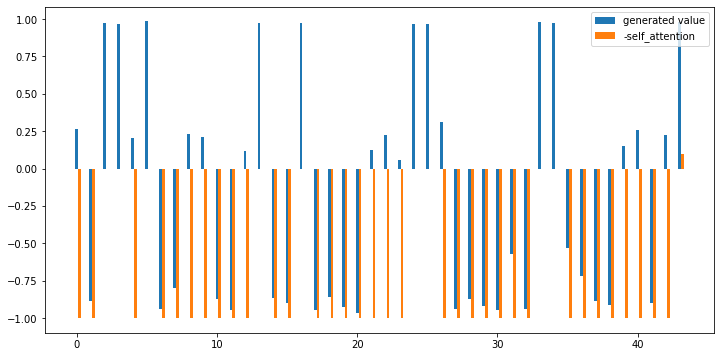

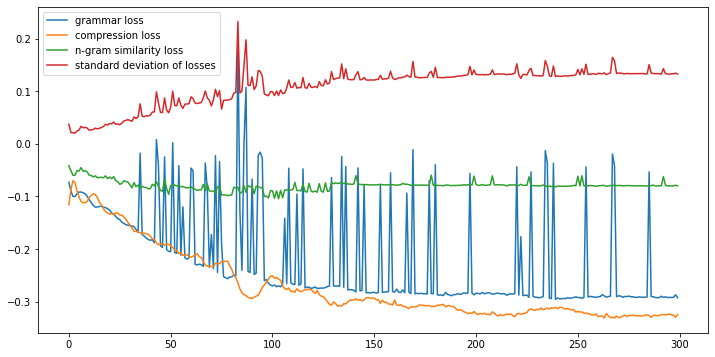

g 3.1984 	s -0.1126 	c 0.5444, score 1.3760, [특히 피해가 큰 어린이·노인 등 나쁨 단계부터 문자로 알리는 주목을 시민강좌 역시 호평 속에 운영 중이고 이상 신청 미세먼지 발생시 등을 알려준다.]
g 2.3138 	s -0.0715 	c 0.5611, score 1.2530, [특히 피해가 큰 어린이·노인 등 나쁨 단계부터 문자로 알리는 주목을 시민강좌 역시 호평 속에 운영 중이고 이상 신청 미세먼지 발생시 알려준다.]
g 2.8772 	s -0.1055 	c 0.5667, score 1.3074, [특히 피해가 큰 어린이·노인 등 나쁨 단계부터 문자로 알리는 주목을 시민강좌 역시 호평 속에 운영 이상 신청 미세먼지 발생시 등을 알려준다.]
g 2.6967 	s -0.0654 	c 0.5667, score 1.3174, [특히 피해가 큰 어린이·노인 등 나쁨 단계부터 문자로 알리는 주목을 시민강좌 역시 호평 속에 운영 중이고 이상 신청 미세먼지 등을 알려준다.]
g -1.7773 	s -0.0962 	c 0.5722, score 0.5354, [특히 피해가 큰 어린이·노인 등 나쁨 문자로 알리는 주목을 시민강좌 역시 호평 속에 운영 중이고 이상 신청 미세먼지 발생시 등을 알려준다.]
g -0.9565 	s -0.1482 	c 0.5611, score 0.6312, [특히 피해가 큰 어린이·노인 등 단계부터 문자로 알리는 주목을 시민강좌 역시 호평 속에 운영 중이고 이상 신청 미세먼지 발생시 등을 알려준다.]
g 4.2812 	s -0.0801 	c 0.5722, score 1.5613, [특히 피해가 큰 어린이·노인 등 나쁨 단계부터 문자로 알리는 주목을 역시 호평 속에 운영 중이고 이상 신청 미세먼지 발생시 등을 알려준다.]
g -1.6347 	s -0.0951 	c 0.5889, score 0.5436, [특히 피해가 큰 어린이·노인 등 나쁨 단계부터 문자로 알리는 주목을 시민강좌 역시 속에 운영 중이고 이상 신청 발생시

('특히 피해가 큰 어린이·노인 등 나쁨 단계부터 문자로 알리는 주목을 역시 호평 속에 운영 중이고 이상 신청 미세먼지 발생시 등을 알려준다.',
 '특히 피해가 큰 어린이 노인 등 미세먼지 나쁨 단계부터 문자로 알리는 알림서비스가 주목을 받았으며, 이 역시 호평 속에 운영 중이고, 6개월 이상 신청 시 미세먼지 비상저감조치와 미세먼지 발생시 경보 등을 알려준다.',
 1.5612659535474247,
 4.281235218048096)

In [ ]:
logout = True
atten_rate = 0.2
similarity = 1.0
std_factor = 3.0
txt = """
특히 미세먼지 피해가 큰 어린이·노인 등 민감 계층에게 나쁨 단계부터 미세먼지 예보를 문자로 알리는 맞춤형 예·경보제가 주목을 받고 있다. 찾아가는 미세먼지 시민강좌 역시 호평 속에 운영 중이다. 연간 300회 실시되는 이 강좌는 10인 이상 신청 단체에게 미세먼지 위해성과 고농도 미세먼지 발생시 행동요령 등을 알려준다.
"""
#The diocese says he contracted the infection through contaminated food while attending a conference for newly ordained bishops in Italy last month. Symptoms of hepatitis A include fever, tiredness, loss of appetite, nausea and abdominal discomfort. Fargo Catholic Diocese in North Dakota (pictured) is where the bishop is located.
#The judge agreed with police that he would have been over the limit at the time his red Citroen hit Miss Titley’s blue Daihatsu Cuore on a road near Yarmouth, Isle of Wight, on October 11, 2013. His phone records showed he was also texting around the time of the crash.

sam_wgan4(get_prepared_doc(sentences_dataset[0]),txt,epochs=300,display= True,retry = False,comp_rate= 1.5)

# 측정 도구...

# 한국어 rouge score...

In [46]:
!pip install rouge-score

In [47]:
import re
import six

from nltk.stem import porter
import six
from six.moves import map
from six.moves import range
from rouge_score import scoring
#from rouge_score import tokenize

def tokenize(text, stemmer):
  """Tokenize input text into a list of tokens.

  This approach aims to replicate the approach taken by Chin-Yew Lin in
  the original ROUGE implementation.

  Args:
    text: A text blob to tokenize.
    stemmer: An optional stemmer.

  Returns:
    A list of string tokens extracted from input text.
  """

  # Convert everything to lowercase.
  text = text.lower()
  # Replace any non-alpha-numeric characters with spaces.
  text =  six.ensure_str(text) #re.sub(r"[^a-z0-9]+", " ", six.ensure_str(text))

  tokens = re.split(r"\s+", text)
  if stemmer:
    # Only stem words more than 3 characters long.
    tokens = [stemmer.stem(x) if len(x) > 3 else x for x in tokens]

  # One final check to drop any empty or invalid tokens.
  #tokens = [x for x in tokens if re.match(r"^[a-z0-9]+$", six.ensure_str(x))]

  return tokens

class RougeScorer(scoring.BaseScorer):
  """Calculate rouges scores between two blobs of text.

  Sample usage:
    scorer = RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
    scores = scorer.score('The quick brown fox jumps over the lazy dog',
                          'The quick brown dog jumps on the log.')
  """

  def __init__(self, rouge_types, use_stemmer=False):
    """Initializes a new RougeScorer.

    Valid rouge types that can be computed are:
      rougen (e.g. rouge1, rouge2): n-gram based scoring.
      rougeL: Longest common subsequence based scoring.

    Args:
      rouge_types: A list of rouge types to calculate.
      use_stemmer: Bool indicating whether Porter stemmer should be used to
        strip word suffixes to improve matching.
    Returns:
      A dict mapping rouge types to Score tuples.
    """

    self.rouge_types = rouge_types
    self._stemmer = porter.PorterStemmer() if use_stemmer else None

  def score(self, target, prediction):
    """Calculates rouge scores between the target and prediction.

    Args:
      target: Text containing the target (ground truth) text.
      prediction: Text containing the predicted text.
    Returns:
      A dict mapping each rouge type to a Score object.
    Raises:
      ValueError: If an invalid rouge type is encountered.
    """

    target_tokens = tokenize(target, self._stemmer)
    prediction_tokens = tokenize(prediction, self._stemmer)
    result = {}

    for rouge_type in self.rouge_types:
      if rouge_type == "rougeL":
        # Rouge from longest common subsequences.
        scores = _score_lcs(target_tokens, prediction_tokens)
      elif rouge_type == "rougeLsum":
        # Note: Does not support multi-line text.
        def get_sents(text):
          # Assume sentences are separated by newline.
          sents = six.ensure_str(text).split("\n")
          sents = [x for x in sents if len(x)]
          return sents

        target_tokens_list = [
            tokenize(s, self._stemmer) for s in get_sents(target)]
        prediction_tokens_list = [
            tokenize(s, self._stemmer) for s in get_sents(prediction)]
        scores = _summary_level_lcs(target_tokens_list,
                                    prediction_tokens_list)
      elif re.match(r"rouge[0-9]$", six.ensure_str(rouge_type)):
        # Rouge from n-grams.
        n = int(rouge_type[5:])
        if n <= 0:
          raise ValueError("rougen requires positive n: %s" % rouge_type)
        target_ngrams = _create_ngrams(target_tokens, n)
        prediction_ngrams = _create_ngrams(prediction_tokens, n)
        scores = _score_ngrams(target_ngrams, prediction_ngrams)
      else:
        raise ValueError("Invalid rouge type: %s" % rouge_type)
      result[rouge_type] = scores

    return result


def _create_ngrams(tokens, n):
  """Creates ngrams from the given list of tokens.

  Args:
    tokens: A list of tokens from which ngrams are created.
    n: Number of tokens to use, e.g. 2 for bigrams.
  Returns:
    A dictionary mapping each bigram to the number of occurrences.
  """

  ngrams = Counter()
  for ngram in (tuple(tokens[i:i + n]) for i in range(len(tokens) - n + 1)):
    ngrams[ngram] += 1
  return ngrams


def _score_lcs(target_tokens, prediction_tokens):
  """Computes LCS (Longest Common Subsequence) rouge scores.

  Args:
    target_tokens: Tokens from the target text.
    prediction_tokens: Tokens from the predicted text.
  Returns:
    A Score object containing computed scores.
  """

  if not target_tokens or not prediction_tokens:
    return scoring.Score(precision=0, recall=0, fmeasure=0)

  # Compute length of LCS from the bottom up in a table (DP appproach).
  lcs_table = _lcs_table(target_tokens, prediction_tokens)
  lcs_length = lcs_table[-1][-1]

  precision = lcs_length / len(prediction_tokens)
  recall = lcs_length / len(target_tokens)
  fmeasure = scoring.fmeasure(precision, recall)

  return scoring.Score(precision=precision, recall=recall, fmeasure=fmeasure)


def _lcs_table(ref, can):
  """Create 2-d LCS score table."""
  rows = len(ref)
  cols = len(can)
  lcs_table = [[0] * (cols + 1) for _ in range(rows + 1)]
  for i in range(1, rows + 1):
    for j in range(1, cols + 1):
      if ref[i - 1] == can[j - 1]:
        lcs_table[i][j] = lcs_table[i - 1][j - 1] + 1
      else:
        lcs_table[i][j] = max(lcs_table[i - 1][j], lcs_table[i][j - 1])
  return lcs_table


def _backtrack_norec(t, ref, can):
  """Read out LCS."""
  i = len(ref)
  j = len(can)
  lcs = []
  while i > 0 and j > 0:
    if ref[i - 1] == can[j - 1]:
      lcs.insert(0, i-1)
      i -= 1
      j -= 1
    elif t[i][j - 1] > t[i - 1][j]:
      j -= 1
    else:
      i -= 1
  return lcs


def _summary_level_lcs(ref_sent, can_sent):
  """ROUGE: Summary-level LCS, section 3.2 in ROUGE paper.

  Args:
    ref_sent: list of tokenized reference sentences
    can_sent: list of tokenized candidate sentences

  Returns:
    summary level ROUGE score
  """
  if not ref_sent or not can_sent:
    return scoring.Score(precision=0, recall=0, fmeasure=0)

  m = sum(map(len, ref_sent))
  n = sum(map(len, can_sent))
  if not n or not m:
    return scoring.Score(precision=0, recall=0, fmeasure=0)

  # get token counts to prevent double counting
  token_cnts_r = collections.Counter()
  token_cnts_c = collections.Counter()
  for s in ref_sent:
    # s is a list of tokens
    token_cnts_r.update(s)
  for s in can_sent:
    token_cnts_c.update(s)

  hits = 0
  for r in ref_sent:
    lcs = _union_lcs(r, can_sent)
    # Prevent double-counting:
    # The paper describes just computing hits += len(_union_lcs()),
    # but the implementation prevents double counting. We also
    # implement this as in version 1.5.5.
    for t in lcs:
      if token_cnts_c[t] > 0 and token_cnts_r[t] > 0:
        hits += 1
        token_cnts_c[t] -= 1
        token_cnts_r[t] -= 1

  recall = hits / m
  precision = hits / n
  fmeasure = scoring.fmeasure(precision, recall)
  return scoring.Score(precision=precision, recall=recall, fmeasure=fmeasure)


def _union_lcs(ref, c_list):
  """Find union LCS between a ref sentence and list of candidate sentences.

  Args:
    ref: list of tokens
    c_list: list of list of indices for LCS into reference summary

  Returns:
    List of tokens in ref representing union LCS.
  """
  lcs_list = [lcs_ind(ref, c) for c in c_list]
  return [ref[i] for i in _find_union(lcs_list)]


def _find_union(lcs_list):
  """Finds union LCS given a list of LCS."""
  return sorted(list(set().union(*lcs_list)))


def lcs_ind(ref, can):
  """Returns one of the longest lcs."""
  t = _lcs_table(ref, can)
  return _backtrack_norec(t, ref, can)


def _score_ngrams(target_ngrams, prediction_ngrams):
  """Compute n-gram based rouge scores.

  Args:
    target_ngrams: A Counter object mapping each ngram to number of
      occurrences for the target text.
    prediction_ngrams: A Counter object mapping each ngram to number of
      occurrences for the prediction text.
  Returns:
    A Score object containing computed scores.
  """

  intersection_ngrams_count = 0
  for ngram in six.iterkeys(target_ngrams):
    intersection_ngrams_count += min(target_ngrams[ngram],
                                     prediction_ngrams[ngram])
  target_ngrams_count = sum(target_ngrams.values())
  prediction_ngrams_count = sum(prediction_ngrams.values())

  precision = intersection_ngrams_count / max(prediction_ngrams_count, 1)
  recall = intersection_ngrams_count / max(target_ngrams_count, 1)
  fmeasure = scoring.fmeasure(precision, recall)

  return scoring.Score(precision=precision, recall=recall, fmeasure=fmeasure)  

In [48]:

scorer = RougeScorer(['rouge1','rouge2', 'rougeL'], use_stemmer=True)

# 종합 Test

In [ ]:
@@@

SyntaxError: ignored

In [ ]:
import io

result_data = {}

result_data['ID'] = []
result_data['Original'] = []
result_data['Step1'] = []
result_data['Step2'] = []
result_data['Step3'] = []
result_data['Ground Truth'] = []

result_data['S1.R1'] = []
result_data['S1.R2'] = []
result_data['S1.RL'] = []
result_data['S1.Similarity'] = []
result_data['S1.Grammar'] = []

result_data['S2.R1'] = []
result_data['S2.R2'] = []
result_data['S2.RL'] = []
result_data['S2.Similarity'] = []
result_data['S2.Grammar'] = []

result_data['S3.R1'] = []
result_data['S3.R2'] = []
result_data['S3.RL'] = []
result_data['S3.Similarity'] = []
result_data['S3.Grammar'] = []

statistics_columns = ['S1.R1','S1.R2','S1.RL','S1.Similarity','S1.Grammar','S2.R1','S2.R2','S2.RL','S2.Similarity','S2.Grammar','S3.R1','S3.R2','S3.RL','S3.Similarity','S3.Grammar']

atten_rate = 0.2
similarity = 1.0
std_factor = 3.0

#es = ExtactiveSummarizer()

pd.set_option('display.max_columns', 100)

logout = False
for rate in range(0,1):
    comp_rate=1.5
    #result_data['comp_rate'].append(comp_rate)
    for try_count in range(100):
        
        full_text = get_prepared_doc(sentences_dataset[try_count])
        '''
        try:
            del model
            print('delete model')
        except Exception as ex:
            pass
        model = EncoderDecoderModel.from_pretrained("/content/drive/MyDrive/GAN_ENDE/en_sentence_complete_model")
        '''
        try:

            #org_text = besm(full_text,num_sentences=9)
            step1 = es.generate_summary(full_text,top_n=6,min_length=0)[0]
            
            org_sentences = np.array(nltk.sent_tokenize(step1.strip()))
            if logout:
                print('BESM Summary sentance length:',len(org_sentences))
            (step2,step3),grammar,simil = summary(full_text,step1,steps=2,top_rank=2,comp_rate=comp_rate)
            '''
            tmp = []
            for txt in np.array(nltk.sent_tokenize(step2.strip())):
                tmp.append(sentence_correct(txt))         
            step3 = ' '.join(tmp)
            '''

            ground_trouth = gold_summary[try_count]
            
            print('='*50 + ' Original Document ' + str(try_count) + '='*50)
            for txt in np.array(nltk.sent_tokenize(full_text)):
                print(txt)
            print('-'*50 + ' Step1 ' + str(try_count) + '-'*50)
            for txt in np.array(nltk.sent_tokenize(step1.strip())):
                print(txt)                
            print('-'*50 + ' Step2 ' + str(try_count) + '-'*50)
            for txt in np.array(nltk.sent_tokenize(step2.strip())):
                print(txt)
            print('-'*50 + ' Step3 ' + str(try_count) + '-'*50)
            for txt in np.array(nltk.sent_tokenize(step3.strip())):
                print(txt)                
            print('-'*50 + ' Ground truth' + '-'*50)
            print(ground_trouth)
            print('-'*120)

            #with io.open('/content/drive/MyDrive/GAN_ENDE/CNN_Daily_summary_result.txt','a',encoding='utf8') as f:
            #    f.write(org_text + '\r\n\r\n')
            s1_rouge = scorer.score(ground_trouth,step1)
            s2_rouge = scorer.score(ground_trouth,step2)
            s3_rouge = scorer.score(ground_trouth,step3)
            s1_simil = similarity3(full_text,step1)
            s2_simil = similarity3(full_text,step2)
            s3_simil = similarity3(full_text,step3)
            s1_gramm = grammar3(full_text,step1)
            s2_gramm = grammar3(full_text,step2) 
            s3_gramm = grammar3(full_text,step3)  
            #print(scores['rouge1'].fmeasure)
            #if s2_rouge['rouge1'].fmeasure > 0.1:

            result_data['ID'].append('CNN/DM-'+str(try_count))
            result_data['Original'].append(full_text)
            result_data['Step1'].append(step1)
            result_data['Step2'].append(step2)
            result_data['Step3'].append(step3)
            result_data['Ground Truth'].append(ground_trouth)

            result_data['S1.R1'].append(s1_rouge['rouge1'].fmeasure)
            result_data['S1.R2'].append(s1_rouge['rouge2'].fmeasure)
            result_data['S1.RL'].append(s1_rouge['rougeL'].fmeasure)
            result_data['S1.Similarity'].append(s1_simil)
            result_data['S1.Grammar'].append(s1_gramm)

            result_data['S2.R1'].append(s2_rouge['rouge1'].fmeasure)
            result_data['S2.R2'].append(s2_rouge['rouge2'].fmeasure)
            result_data['S2.RL'].append(s2_rouge['rougeL'].fmeasure)
            result_data['S2.Similarity'].append(s2_simil)
            result_data['S2.Grammar'].append(s2_gramm)

            result_data['S3.R1'].append(s3_rouge['rouge1'].fmeasure)
            result_data['S3.R2'].append(s3_rouge['rouge2'].fmeasure)
            result_data['S3.RL'].append(s3_rouge['rougeL'].fmeasure)
            result_data['S3.Similarity'].append(s3_simil)
            result_data['S3.Grammar'].append(s3_gramm)

            print()
            df_result_data = pd.DataFrame(result_data)
            print(df_result_data[statistics_columns].iloc[-1])
            print()
            df_mean = df_result_data[statistics_columns].mean()
            print('** Mean result **')
            print(df_mean)
            del df_mean
            del df_result_data
        except Exception as ex:
            print(ex)

print('** Total mean result **')
df_result_data = pd.DataFrame(result_data)
df_mean = df_result_data[statistics_columns].mean()
print(df_mean)
df_result_data.to_pickle("/content/drive/MyDrive/GAN_ENDE/df_result_93.pkl")

df_result_data[['ID']+statistics_columns]

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.

** Mean result **
S1.R1            0.156256
S1.R2            0.082135
S1.RL            0.127975
S1.Similarity    0.828828
S1.Grammar       0.999918
S2.R1            0.133986
S2.R2            0.040103
S2.RL            0.109067
S2.Similarity    0.829459
S2.Grammar       0.999834
S3.R1            0.124759
S3.R2            0.036304
S3.RL            0.097330
S3.Similarity    0.828411
S3.Grammar       0.999944
dtype: float64




'NoneType' object is not iterable
================================================== Original Document 16==================================================
신촌세브란스, 여의도성모병원, 삼성서울병원 같은 대형 병원들이 해외 이민이나 유학 비자때 필요한 신체검사 요금을 담합했다가 공정거래위원회 시정명령을 받았다.
공정위는 캐나다, 호주, 뉴질랜드, 미국, 중국 등 5개국의 이민·유학 비자를 발급하는 과정에서 제출해야 하는 신체검사 가격을 담합한 15개 의료기관(17개 병원)에 시정명령을 내리기로 결정했다고 3일 밝혔다.
세브란스(신촌·강남), 성모병원(여의도·서울), 삼성서울병원 등 대형 병원과 각 지역 대학병원이 담합에 참여한 것으로 드러났다.
공정위에 따르면, 병원들은 2002년부터 2006년까지 총 8차례 담합에 나섰다.
캐나다 대사관 지정 의료기관인 신촌 세브란스, 삼성 서울병원 등 다섯 곳은 2002년 1월(12만원→

,ID,S1.R1,S1.R2,S1.RL,S1.Similarity,S1.Grammar,S2.R1,S2.R2,S2.RL,S2.Similarity,S2.Grammar,S3.R1,S3.R2,S3.RL,S3.Similarity,S3.Grammar
0,CNN/DM-0,0.050420,0.000000,0.050420,0.836638,0.999929,0.054054,0.000000,0.054054,0.815452,0.999760,0.084211,0.021505,0.063158,0.815364,0.999944
1,CNN/DM-1,0.329897,0.208333,0.257732,0.704151,0.999867,0.314050,0.084034,0.198347,0.694010,0.999899,0.317460,0.064516,0.190476,0.708788,0.999944
2,CNN/DM-2,0.152047,0.094675,0.152047,0.797974,0.999945,0.162162,0.055046,0.144144,0.842430,0.999903,0.106870,0.046512,0.091603,0.831632,0.999942
3,CNN/DM-3,0.035088,0.000000,0.017544,0.881309,0.999933,0.050633,0.000000,0.025316,0.903541,0.999729,0.041237,0.000000,0.020619,0.898844,0.999945
4,CNN/DM-4,0.201439,0.131387,0.172662,0.905998,0.999944,0.191489,0.086957,0.191489,0.923564,0.999768,0.152542,0.068966,0.152542,0.922433,0.999943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,CNN/DM-95,0.168539,0.068182,0.146067,0.895216,0.999943,0.152381,0.038835,0.114286,0.903772,0.999888,0.151261,0.034188,0.117647,0.900922,0.999943
82,CNN/DM-96,0.044444,0.015038,0.044444,0.796713,0.999935,0.045977,0.023529,0.045977,0.794084,0.999943,0.036036,0.018349,0.036036,0.794269,0.999942
83,CNN/DM-97,0.078431,0.000000,0.039216,0.882769,0.999908,0.032258,0.000000,0.032258,0.907622,0.999934,0.024390,0.000000,0.024390,0.900210,0.999946
84,CNN/DM-98,0.114754,0.066667,0.114754,0.871993,0.999940,0.102564,0.026316,0.102564,0.864828,0.999896,0.082474,0.021053,0.082474,0.857415,0.999943


In [50]:
txt = """
신촌세브란스, 여의도성모병원 등 15개 대형 병원.
및 지역대학병원들이 캐나다, 호주, 뉴질랜드 등
"""

txt.replace('\n',' ').split(' ')

['',
 '신촌세브란스,',
 '여의도성모병원',
 '등',
 '15개',
 '대형',
 '병원.',
 '및',
 '지역대학병원들이',
 '캐나다,',
 '호주,',
 '뉴질랜드',
 '등',
 '']

BESM Summary sentance length: 3
--------------------------------------------------
또한 교육시설에는 미세먼지 알림 시스템을 구축해 운영하고 있다. 관내 어린이집 유치원 초중학교 등 교육시설 700개소에 남양주시 자체 대기오염 측정소에서 측정된 해당 지역의 실시간 미세먼지 정보를 제공하고 있다. 시 관계자는 미세먼지 저감은 단기적인 계획이나 한두 가지 정책만으로 효과를 볼 수 없다며 종합적인 대책 마련은 물론이고 시민들의 피부에 와 닿는 정책을 마련하기 위해 애쓰고 있다고 말했다.
--------------------------------------------------
Length ------------------------------------| 54
{0: 0.0, 1: -1.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: 0.0, 13: -1.0, 14: -1.0, 15: -1.0, 16: -1.0, 17: -1.0, 18: -1.0, 19: -1.0, 20: 0.0, 21: -1.0, 22: -1.0, 23: -1.0, 24: 0.0, 25: 0.0, 26: -1.0, 27: -1.0, 28: 0.0, 29: -1.0, 30: -1.0, 31: -1.0, 32: -1.0, 33: -1.0, 34: 0.0, 35: -1.0, 36: -1.0, 37: -1.0, 38: 0.0, 39: -1.0, 40: -1.0, 41: -1.0, 42: -1.0, 43: 0.0, 44: -1.0, 45: -1.0, 46: 0.0, 47: -1.0, 48: -1.0, 49: -1.0, 50: 0.0, 51: -1.0, 52: -1.0, 53: 0.1}
Train... |||||||||||||||||||||| 100.0%   300/300 epochs, gl:-0.29602244  s

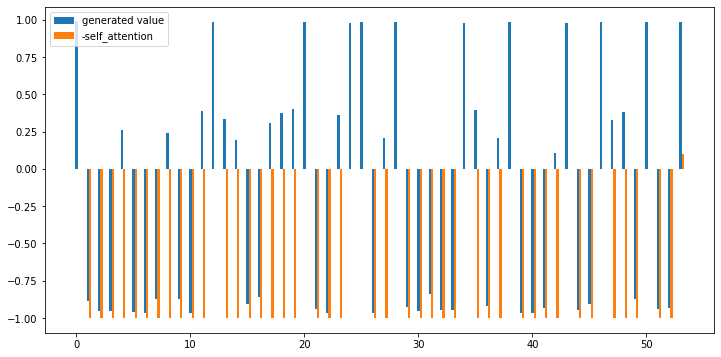

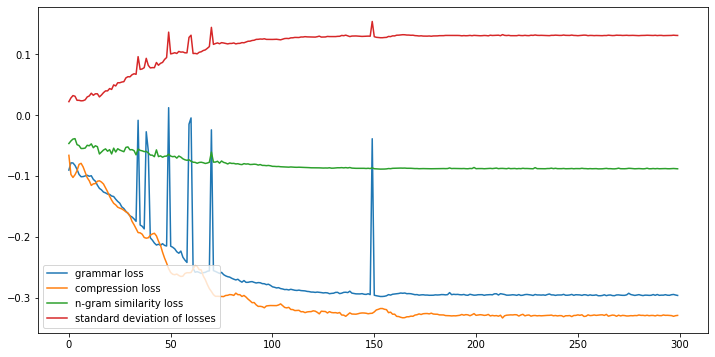

g 5.2314 	s 0.4731 	c 0.5223, score 2.3227, [또한 시스템을 관내 초중학교 등 교육시설 700개소에 대기오염 측정소에서 측정된 해당 미세먼지 정보를 제공하고 시 관계자는 가지 정책만으로 볼 수 마련은 물론이고 와 닿는 정책을 위해 말했다.]
g 5.2397 	s 0.4377 	c 0.5402, score 2.2708, [또한 시스템을 관내 초중학교 등 교육시설 700개소에 대기오염 측정소에서 해당 미세먼지 정보를 제공하고 시 관계자는 가지 정책만으로 볼 수 마련은 물론이고 와 닿는 정책을 위해 말했다.]
g 2.5368 	s 0.3383 	c 0.5402, score 1.7209, [또한 시스템을 관내 초중학교 등 교육시설 700개소에 대기오염 측정소에서 측정된 해당 미세먼지 정보를 제공하고 시 관계자는 가지 정책만으로 볼 수 물론이고 와 닿는 정책을 위해 말했다.]
g 5.2437 	s 0.4096 	c 0.5446, score 2.2389, [또한 시스템을 관내 초중학교 등 교육시설 700개소에 측정소에서 측정된 해당 미세먼지 정보를 제공하고 시 관계자는 가지 정책만으로 볼 수 마련은 물론이고 와 닿는 정책을 위해 말했다.]
요약률 0.5223 유사성 0.4731 문법성 5.2314 요약 [또한 시스템을 관내 초중학교 등 교육시설 700개소에 대기오염 측정소에서 측정된 해당 미세먼지 정보를 제공하고 시 관계자는 가지 정책만으로 볼 수 마련은 물론이고 와 닿는 정책을 위해 말했다.]
--------------------------------------------------
또한 시스템을 관내 초중학교 등 교육시설 700개소에 대기오염 측정소에서 측정된 해당 미세먼지 정보를 제공하고 시 관계자는 가지 정책만으로 볼 수 마련은 물론이고 와 닿는 정책을 위해 말했다. 2.3226561787582582 5.231410980224609
================================================== Orig

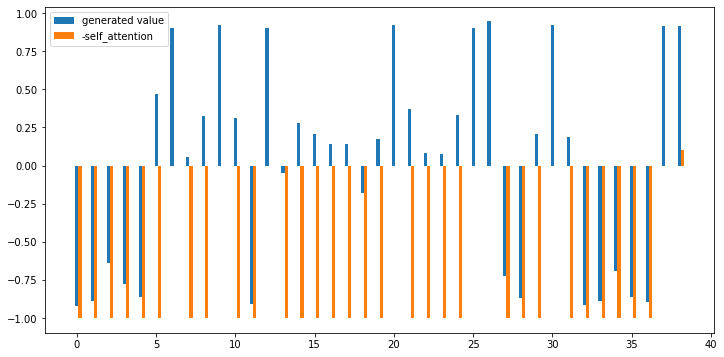

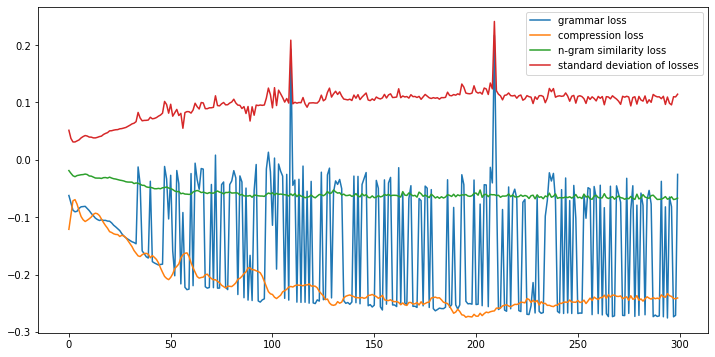

g -1.5324 	s 0.1252 	c 0.5756, score 0.7942, [15인으로 구성된 자주 임명되는 이를 최고재판소의 대법관직에 해당한고 미국 법원이 제대로 알기 어려운 사건에 대해선 소송 수 있다.]
g 4.8826 	s 0.1117 	c 0.4186, score 1.8441, [15인으로 구성된 최고재판소 재판관직에 자주 임명되는 이를 일본 최고재판소의 최고재판관은 우리나라 대법관직에 해당한고 미국 법원이 제대로 알기 어려운 사건에 대해선 소송 수 있다.]
g 4.9284 	s 0.2941 	c 0.3605, score 1.9760, [15인으로 구성된 최고재판소 재판관직에 자주 임명되는 이를 반영한고 일본 최고재판소의 최고재판관은 우리나라 대법관직에 해당한고 미국 국무부는 법원이 제대로 알기 어려운 사건에 대해선 소송 수 있다.]
g 5.1551 	s 0.2014 	c 0.3895, score 1.9501, [15인으로 구성된 최고재판소 재판관직에 자주 임명되는 이를 반영한고 일본 최고재판소의 최고재판관은 우리나라 대법관직에 해당한고 미국 법원이 제대로 알기 어려운 사건에 대해선 소송 수 있다.]
g 4.4359 	s 0.1822 	c 0.3895, score 1.8111, [15인으로 구성된 최고재판소 재판관직에 자주 임명되는 이를 일본 최고재판소의 최고재판관은 우리나라 대법관직에 해당한고 미국 국무부는 법원이 제대로 알기 어려운 사건에 대해선 소송 수 있다.]
g 3.1465 	s 0.1316 	c 0.4070, score 1.5630, [15인으로 구성된 최고재판소 재판관직에 자주 임명되는 이를 최고재판소의 최고재판관은 우리나라 대법관직에 해당한고 미국 국무부는 법원이 제대로 알기 어려운 사건에 대해선 소송 수 있다.]
g -5.3606 	s -0.1661 	c 0.6570, score -0.2165, [구성된 자주 이를 최고재판소의 대법관직에 해당한고 법원이 제대로 알기 어려운 사건에 대해선 소송 수 있다.]
g -3.0200 	s 

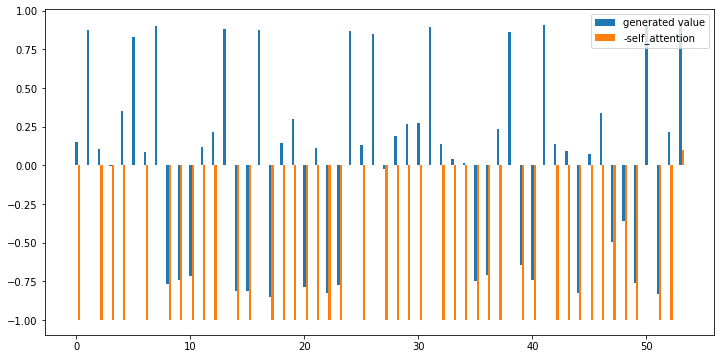

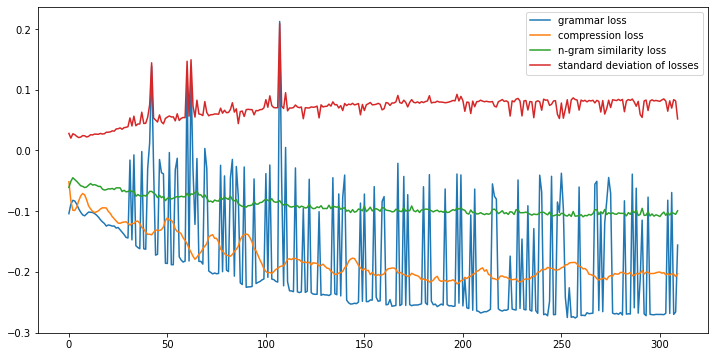

g -1.0753 	s 0.1254 	c 0.4500, score 0.8961, [미세침습수술의 경우 절개창이 작아 수술 후 통증이 적고 있고 로봇수술의 경우 비교해 담도와 있어 문합부와 관련된 수 있을 것으로 기대된고 최인석 절제로 인해 높고 장기별 정밀한 요하는 수술이라며 만한 얻었다고 말했다.]
g -5.4390 	s 0.3118 	c 0.5364, score 0.3689, [미세침습수술의 경우 절개창이 수술 후 통증이 적고 있고 로봇수술의 경우 비교해 담도와 있어 관련된 합병증을 수 것으로 교수는 인해 높고 장기별 요하는 수술이라며 만한 얻었다고 말했다.]
g -3.6941 	s 0.3613 	c 0.5727, score 0.6729, [미세침습수술의 경우 절개창이 작아 후 적고 로봇수술의 경우 비교해 및 있어 관련된 합병증을 줄일 수 있을 것으로 교수는 절제로 인해 높고 장기별 수술이라며 만한 말했다.]
g 5.2116 	s 0.0558 	c 0.3682, score 1.7925, [미세침습수술의 경우 절개창이 작아 수술 후 통증이 적고 있고 로봇수술의 경우 비교해 및 담도와 문합에 있어 문합부와 관련된 합병증을 줄일 수 있을 것으로 기대된고 최인석 교수는 절제로 인해 높고 장기별 정밀한 요하는 수술이라며 만한 얻었다고 말했다.]
g -2.3425 	s 0.0667 	c 0.4955, score 0.6717, [미세침습수술의 경우 절개창이 작아 후 통증이 적고 로봇수술의 경우 비교해 및 담도와 있어 관련된 합병증을 있을 것으로 기대된고 최인석 교수는 절제로 인해 높고 장기별 수술이라며 만한 얻었다고 말했다.]
g 2.0555 	s 0.3723 	c 0.4955, score 1.7104, [미세침습수술의 경우 절개창이 작아 수술 후 통증이 적고 있고 로봇수술의 경우 비교해 및 문합에 있어 관련된 합병증을 줄일 있을 것으로 기대된고 최인석 교수는 인해 높고 정밀한 수술이라며 만한 말했다.]
g -5.3620 	s 0.2794 	c 0.5864, score

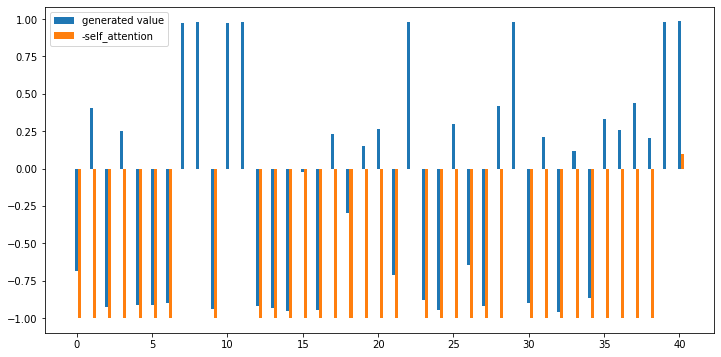

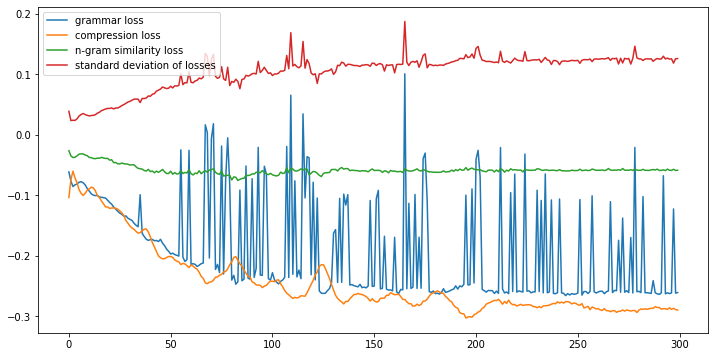

g 2.4423 	s 0.1767 	c 0.5211, score 1.5626, [전북도가 허가한 됐다고 보고 요구하고 있고 계속으로 면허가 제정된 여객자동차운수사업법 기간 위배했고 위배하고 있다고 위원회는 교통편의와 공정한 경쟁체제 조성에 나서야 한다고 주장했다.]
g 2.4804 	s 0.0956 	c 0.5634, score 1.4456, [전북도가 허가한 됐다고 보고 요구하고 있고 면허가 여객자동차운수사업법 기간 위배했고 위배하고 있다고 위원회는 교통편의와 공정한 경쟁체제 조성에 나서야 한다고 주장했다.]
g 2.7411 	s 0.1535 	c 0.5446, score 1.5657, [전북도가 허가한 됐다고 보고 요구하고 있고 면허가 제정된 여객자동차운수사업법 기간 위배했고 위배하고 있다고 위원회는 교통편의와 공정한 경쟁체제 조성에 나서야 한다고 주장했다.]
g -0.2616 	s 0.2542 	c 0.5446, score 1.1660, [전북도가 허가한 됐다고 보고 요구하고 있고 계속으로 면허가 제정된 여객자동차운수사업법 기간 위배했고 위배하고 있다고 교통편의와 공정한 경쟁체제 조성에 나서야 한다고 주장했다.]
g -0.2260 	s 0.1785 	c 0.5493, score 1.0915, [전북도가 허가한 됐다고 보고 요구하고 있고 계속으로 면허가 제정된 여객자동차운수사업법 기간 위배했고 위배하고 있다고 위원회는 공정한 경쟁체제 조성에 나서야 한다고 주장했다.]
g -0.3255 	s 0.2053 	c 0.5681, score 1.0830, [전북도가 허가한 됐다고 보고 요구하고 있고 계속으로 면허가 여객자동차운수사업법 기간 위배했고 위배하고 있다고 위원회는 공정한 경쟁체제 조성에 나서야 한다고 주장했다.]
g -2.0104 	s 0.1443 	c 0.5634, score 0.7459, [전북도가 허가한 됐다고 보고 요구하고 있고 면허가 제정된 여객자동차운수사업법 기간 위배했고 위배하고 있다고 위원회는 교통편의와 공정한 경쟁체제 나서야 한다고 주장했다

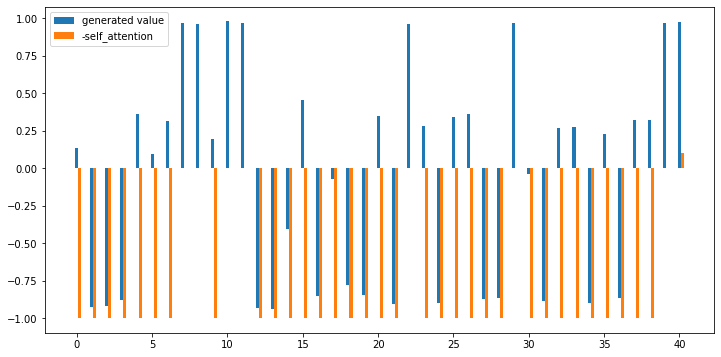

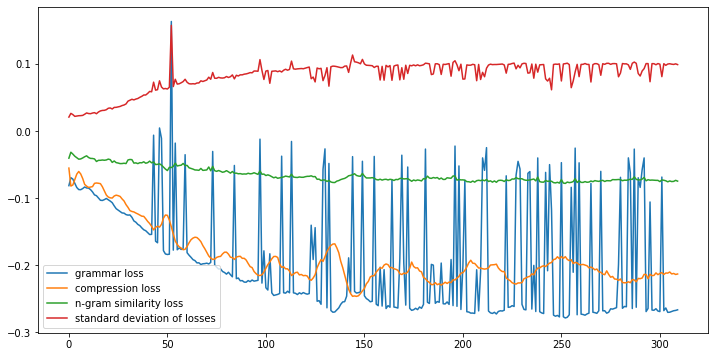

g 4.7712 	s 0.4041 	c 0.4507, score 2.1500, [도의회는 한정면허가 노선갈등의 발단이 됐다고 보고 직권취소를 요구하고 있고 계속으로 여객자동차운수사업법 기간 3년 위배했고 현행법률(6년 있다고 지적했고 업체도 교통편의와 공정한 조성에 나서야 한다고 주장했다.]
g 2.9845 	s 0.4283 	c 0.4554, score 1.8811, [도의회는 한정면허가 노선갈등의 발단이 됐다고 보고 직권취소를 요구하고 있고 계속으로 면허가 여객자동차운수사업법 기간 3년 위배했고 현행법률(6년 있다고 업체도 교통편의와 공정한 조성에 나서야 한다고 주장했다.]
g 3.6430 	s 0.4275 	c 0.4601, score 1.9947, [도의회는 한정면허가 발단이 됐다고 보고 직권취소를 요구하고 있고 계속으로 면허가 여객자동차운수사업법 기간 3년 위배했고 현행법률(6년 있다고 지적했고 업체도 교통편의와 공정한 조성에 나서야 한다고 주장했다.]
g 4.8440 	s 0.4645 	c 0.4319, score 2.2037, [도의회는 한정면허가 노선갈등의 발단이 됐다고 보고 직권취소를 요구하고 있고 계속으로 면허가 여객자동차운수사업법 기간 3년 위배했고 현행법률(6년 있다고 지적했고 업체도 교통편의와 공정한 조성에 나서야 한다고 주장했다.]
g -0.7529 	s 0.4033 	c 0.5023, score 1.2754, [도의회는 한정면허가 발단이 됐다고 보고 직권취소를 요구하고 있고 계속으로 면허가 여객자동차운수사업법 기간 3년 위배했고 현행법률(6년 있다고 업체도 교통편의와 조성에 나서야 한다고 주장했다.]
g 3.5859 	s 0.3254 	c 0.5070, score 1.9160, [도의회는 한정면허가 발단이 됐다고 보고 요구하고 있고 계속으로 여객자동차운수사업법 기간 3년 위배했고 현행법률(6년 있다고 지적했고 업체도 교통편의와 공정한 조성에 나서야 한다고 주장했다.]
g 2.4822 	s 0.3950 	c 0.4742, score 1

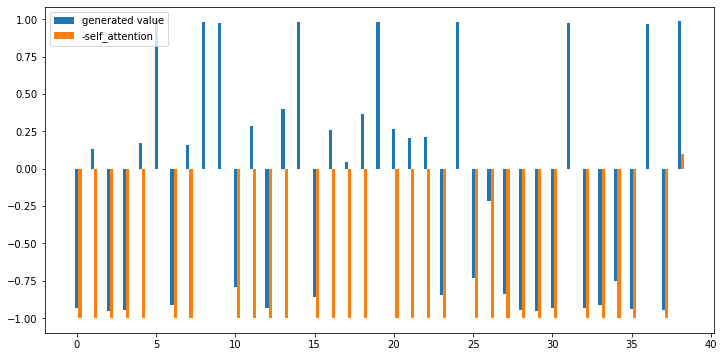

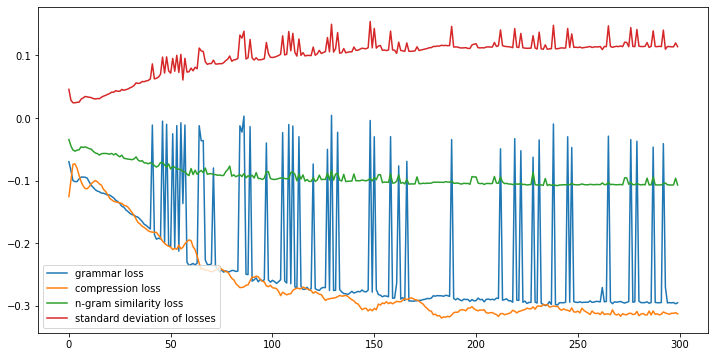

g 2.7128 	s 0.4522 	c 0.4911, score 1.8955, [협회는 제조사뿐만 아니라 제작·유통사를 포함 다양한 회원사로 나간다는 계획이고 치눅 8K 협회의 수석 운영위원은 8K 생태계 위한 것이라고 제품인 98형.]
g 2.6726 	s 0.4547 	c 0.4675, score 1.8676, [협회는 제조사뿐만 아니라 제작·유통사를 포함 다양한 회원사로 나간다는 계획이고 치눅 8K 협회의 수석 운영위원은 8K 생태계 위한 열정과 것이라고 제품인 98형.]
g -2.5216 	s 0.4560 	c 0.5207, score 1.0150, [협회는 제조사뿐만 아니라 제작·유통사를 포함 다양한 나간다는 계획이고 치눅 8K 협회의 수석 운영위원은 8K 생태계 위한 것이라고 제품인 98형.]
g -4.1316 	s 0.4756 	c 0.5680, score 0.7190, [협회는 제조사뿐만 아니라 포함 다양한 회원사로 계획이고 치눅 8K 협회의 수석 운영위원은 8K 생태계 위한 것이라고 제품인 98형.]
g 2.7124 	s 0.4503 	c 0.5148, score 1.8876, [제조사뿐만 아니라 제작·유통사를 포함 다양한 회원사로 나간다는 계획이고 치눅 8K 협회의 수석 운영위원은 8K 생태계 위한 것이라고 제품인 98형.]
g 3.3868 	s 0.4678 	c 0.5089, score 2.0234, [협회는 제조사뿐만 아니라 제작·유통사를 포함 다양한 회원사로 나간다는 계획이고 치눅 협회의 수석 운영위원은 8K 생태계 위한 것이라고 제품인 98형.]
g 4.3193 	s 0.4752 	c 0.5089, score 2.1862, [협회는 제조사뿐만 아니라 제작·유통사를 포함 다양한 회원사로 나간다는 계획이고 8K 협회의 수석 운영위원은 8K 생태계 위한 것이라고 제품인 98형.]
g -0.9656 	s 0.4903 	c 0.5266, score 1.3028, [협회는 제조사뿐만 아니라 제작·유통사를 포함 다양한 회원사로 나간다는 계획이고 치

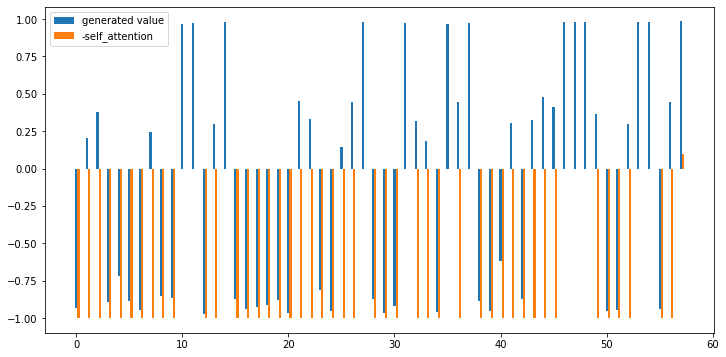

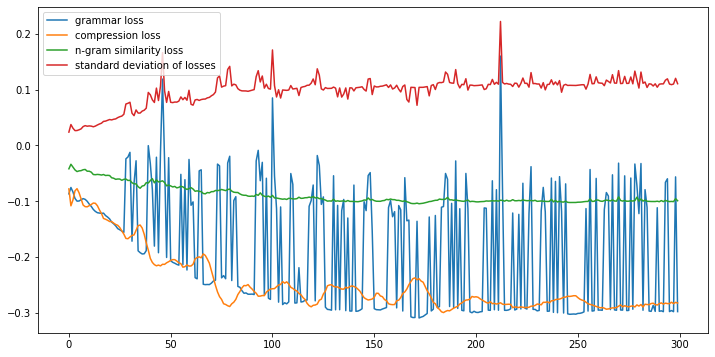

g -0.4982 	s -0.0117 	c 0.4895, score 0.8947, [처절한 목소리 감정을 더 시청자까지 함께 앞으로의 행보에 한편 박희순을 비롯하여 등이 출연하는 JTBC 세상은 학교폭력으로 인해 선 그 가족들이 아들의 이름으로 진실을 찾아가는 이야기를 매주 금 토 11시에 방송된다.]
g -0.2624 	s -0.0508 	c 0.4810, score 0.8865, [간절하고 처절한 목소리 감정을 더 시청자까지 함께 앞으로의 행보에 한편 박희순을 비롯하여 등이 출연하는 JTBC 세상은 학교폭력으로 인해 선 그 가족들이 아들의 이름으로 진실을 찾아가는 이야기를 금 토 11시에 방송된다.]
g 3.7576 	s -0.0823 	c 0.4684, score 1.5124, [간절하고 처절한 목소리 감정을 더 시청자까지 함께 앞으로의 행보에 한편 박희순을 비롯하여 등이 출연하는 JTBC 세상은 학교폭력으로 인해 선 그 가족들이 아들의 이름으로 진실을 찾아가는 이야기를 매주 금 토 11시에 방송된다.]
g -0.9663 	s 0.1020 	c 0.5232, score 0.9177, [처절한 목소리 감정을 더 시청자까지 함께 앞으로의 행보에 한편 박희순을 비롯하여 등이 출연하는 JTBC 세상은 학교폭력으로 인해 선 그 아들의 이름으로 진실을 찾아가는 이야기를 금 토 11시에 방송된다.]
g 3.4800 	s -0.0266 	c 0.4895, score 1.5429, [간절하고 처절한 목소리 감정을 더 시청자까지 함께 앞으로의 행보에 한편 박희순을 비롯하여 등이 출연하는 JTBC 세상은 학교폭력으로 인해 선 그 아들의 이름으로 진실을 찾아가는 이야기를 매주 금 토 11시에 방송된다.]
g 0.0116 	s -0.1376 	c 0.4895, score 0.8538, [간절하고 처절한 목소리 감정을 더 시청자까지 함께 앞으로의 행보에 한편 비롯하여 등이 출연하는 JTBC 세상은 학교폭력으로 인해 선 그 가족들이 아들의 이름으로 진실을 찾아가는 이야기를 매주 금

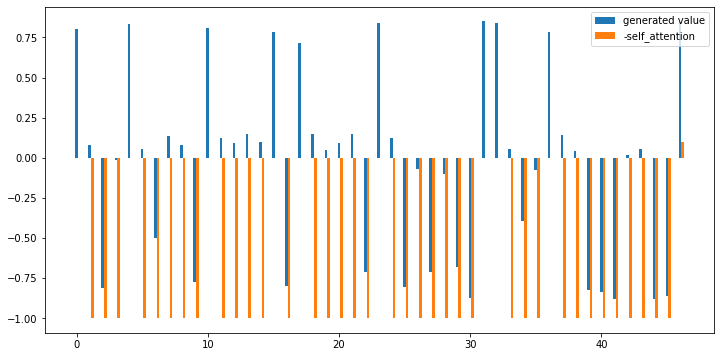

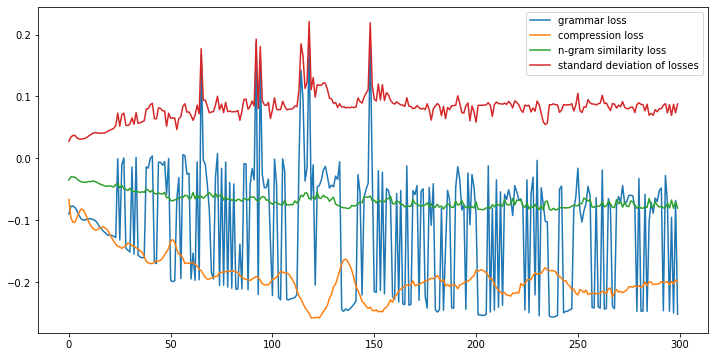

g -5.3579 	s 0.3931 	c 0.6387, score 0.3614, [다만 대학별 주의해야 발표 일정 자율적으로 정할 수 희망 대학의 잘 확인해야 꼭 대학을 진학해야하는 기회로 자신의 조언했다.]
g -5.1537 	s 0.2312 	c 0.6073, score 0.2649, [다만 대학별 주의해야 발표 일정 등을 자율적으로 정할 수 희망 추가모집 요강과 잘 도내 꼭 대학을 진학해야하는 기회로 자신의 조언했다.]
g 4.7509 	s 0.6379 	c 0.3298, score 2.2596, [다만 대학별 달라 주의해야 한고 원서접수와 전형기간 발표 일정 등을 자율적으로 정할 수 희망 대학의 추가모집 요강과 홈페이지 잘 확인해야 도내 한 꼭 대학을 진학해야하는 마지막 기회로 자신의 적성과 모집단위를 우선적으로 조언했다.]
g -5.4009 	s 0.4234 	c 0.6597, score 0.3636, [다만 달라 주의해야 발표 등을 정할 수 희망 추가모집 잘 확인해야 꼭 대학을 진학해야하는 기회로 모집단위를 조언했다.]
g 0.2336 	s 0.5126 	c 0.3613, score 1.4128, [다만 대학별 달라 주의해야 한고 전형기간 발표 일정 등을 자율적으로 정할 수 희망 대학의 추가모집 요강과 홈페이지 잘 확인해야 도내 한 꼭 대학을 진학해야하는 마지막 기회로 자신의 적성과 모집단위를 우선적으로 조언했다.]
g 5.0644 	s 0.4501 	c 0.3403, score 2.1345, [다만 대학별 달라 주의해야 한고 원서접수와 전형기간 발표 일정 등을 자율적으로 정할 수 희망 대학의 추가모집 요강과 홈페이지 잘 확인해야 도내 꼭 대학을 진학해야하는 마지막 기회로 자신의 적성과 모집단위를 우선적으로 조언했다.]
g -1.9287 	s 0.5789 	c 0.4398, score 1.1972, [다만 주의해야 한고 원서접수와 전형기간 발표 등을 자율적으로 정할 수 희망 대학의 추가모집 요강과 홈페이지 잘 도내 한 꼭 대학을 진학해야하는 마지막 

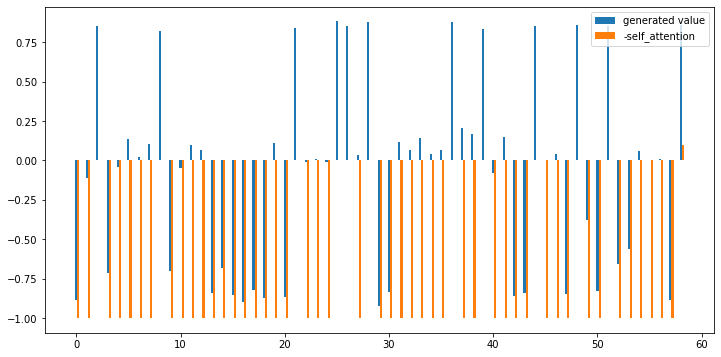

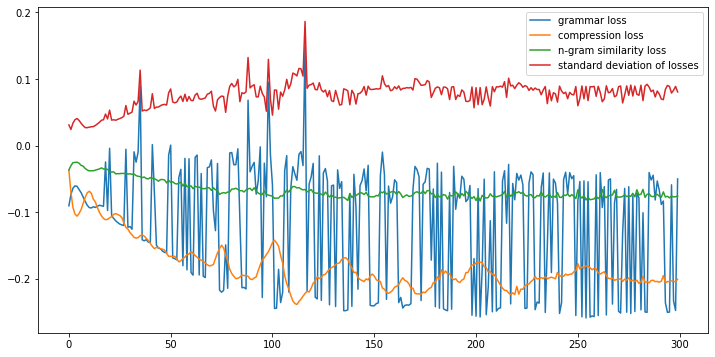

g 4.6070 	s 0.3209 	c 0.3507, score 1.9395, [민원처리 중 금융회사의 불합리하고 부당한 업무처리에 대해서는 부서(본원 감독국·검사국) 등에 검사로 예정이고 그래도 민원이 줄지 않을 경우 금융회사별로 이름을 건수와 민원 증가율 등을 공개하는 등 강경책도 도입한다는 방침이고 김용실 금감원 대한 정기적인 민원간담회를 한편 대상으로 금융 예방활동도 강화할 말했다.]
g 1.4207 	s 0.2983 	c 0.3843, score 1.4194, [민원처리 중 금융회사의 불합리하고 부당한 업무처리에 대해서는 부서(본원 등에 검사로 예정이고 그래도 민원이 줄지 않을 경우 금융회사별로 이름을 건수와 민원 증가율 등을 공개하는 등 강경책도 도입한다는 방침이고 김용실 금감원 대한 정기적인 민원간담회를 한편 대상으로 금융 예방활동도 강화할 말했다.]
g 4.5925 	s 0.3075 	c 0.3731, score 1.9460, [민원처리 중 금융회사의 부당한 업무처리에 대해서는 부서(본원 감독국·검사국) 등에 검사로 예정이고 그래도 민원이 줄지 않을 경우 금융회사별로 이름을 건수와 민원 증가율 등을 공개하는 등 강경책도 도입한다는 방침이고 김용실 금감원 대한 정기적인 민원간담회를 한편 대상으로 금융 예방활동도 강화할 말했다.]
g -1.8227 	s 0.2553 	c 0.3955, score 0.8470, [민원처리 중 불합리하고 부당한 대해서는 부서(본원 감독국·검사국) 등에 검사로 예정이고 그래도 민원이 줄지 않을 경우 금융회사별로 이름을 건수와 민원 증가율 등을 공개하는 등 강경책도 도입한다는 방침이고 김용실 금감원 대한 정기적인 민원간담회를 한편 대상으로 금융 예방활동도 강화할 말했다.]
g -5.4720 	s -0.0190 	c 0.7873, score -0.2183, [중 대해서는 등에 예정이고 그래도 않을 경우 이름을 등 도입한다는 방침이고 대한 한편 대상으로 말했다.]
g -1.0872 	s 0.2390 	c 0.3993, scor

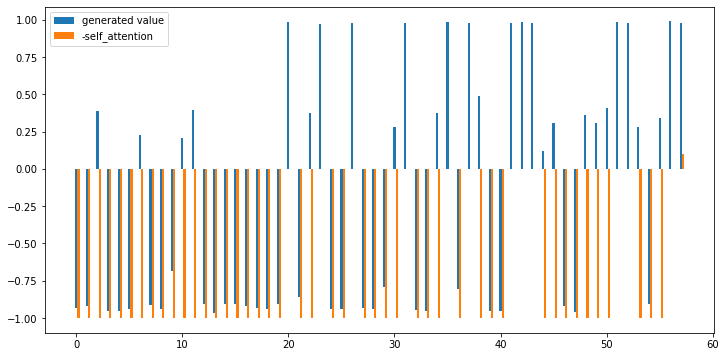

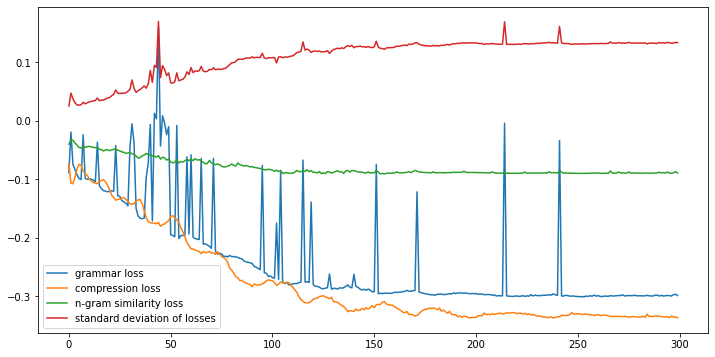

g 4.8431 	s -0.2018 	c 0.5434, score 1.5620, [안덕면 235가구 일과·안성리 700가구 등 곳곳에서 발생했고 오후 김포로 갈 LJ340편 이후로 모든 항공편이 오후 들어 모두 95편(출발 42 결항했으며 7일에도 태풍 영향으로 항공기 운항에 있을 것으로 예상된다.]
g 4.8431 	s -0.2074 	c 0.5623, score 1.5375, [안덕면 235가구 일과·안성리 700가구 등 곳곳에서 발생했고 오후 김포로 갈 LJ340편 이후로 모든 항공편이 오후 들어 모두 95편(출발 42 결항했으며 태풍 영향으로 항공기 운항에 있을 것으로 예상된다.]
g 2.6518 	s -0.2057 	c 0.5585, score 1.1778, [안덕면 235가구 일과·안성리 700가구 등 곳곳에서 발생했고 오후 갈 LJ340편 이후로 모든 항공편이 오후 들어 모두 95편(출발 42 결항했으며 7일에도 태풍 영향으로 항공기 운항에 있을 것으로 예상된다.]
g 4.6693 	s -0.1975 	c 0.5698, score 1.5109, [안덕면 235가구 일과·안성리 700가구 등 곳곳에서 발생했고 오후 김포로 갈 LJ340편 이후로 모든 항공편이 오후 들어 모두 42 결항했으며 7일에도 태풍 영향으로 항공기 운항에 있을 것으로 예상된다.]
g -2.6169 	s -0.1940 	c 0.5547, score 0.3151, [안덕면 235가구 일과·안성리 700가구 등 곳곳에서 발생했고 오후 김포로 갈 LJ340편 이후로 모든 항공편이 오후 들어 모두 95편(출발 42 결항했으며 7일에도 태풍 영향으로 항공기 운항에 것으로 예상된다.]
요약률 0.5434 유사성 -0.2018 문법성 4.8431 요약 [안덕면 235가구 일과·안성리 700가구 등 곳곳에서 발생했고 오후 김포로 갈 LJ340편 이후로 모든 항공편이 오후 들어 모두 95편(출발 42 결항했으며 7일에도 태풍 영향으로 항공기 운항에 있을 것으로 예상된다.]
------------

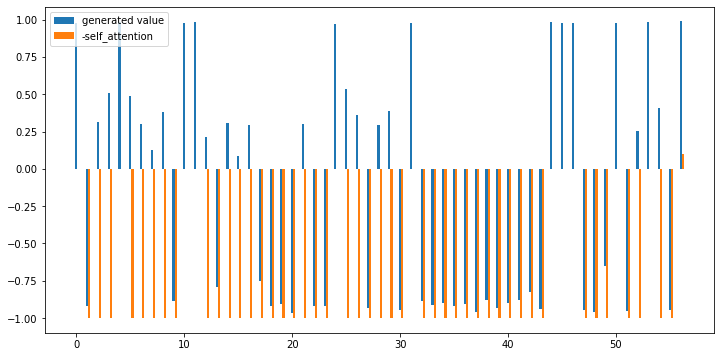

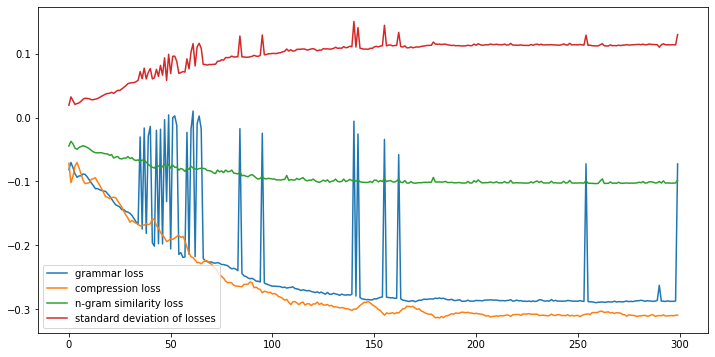

g 5.1948 	s 0.4764 	c 0.4980, score 2.3402, [아울러 그룹체제로 전환된 만큼 2~3년 이내에 비이자 비은행 비중을 각각 40% 끌어올리자는 의미로 40-40-40을 행사에서는 대상으로 그룹 핵심가치인 미래도전 정직신뢰 등 음식 지원이 가능한 등 책임을 다하는 뜻깊은 가졌다.]
g 4.5137 	s 0.5086 	c 0.5178, score 2.2431, [아울러 그룹체제로 전환된 만큼 이내에 비이자 비은행 비중을 각각 40% 끌어올리자는 의미로 40-40-40을 행사에서는 대상으로 그룹 핵심가치인 미래도전 정직신뢰 등 음식 지원이 가능한 등 책임을 다하는 뜻깊은 가졌다.]
g 4.9504 	s 0.5097 	c 0.5257, score 2.3091, [아울러 그룹체제로 전환된 만큼 2~3년 이내에 비이자 비은행 비중을 각각 40% 의미로 40-40-40을 행사에서는 대상으로 그룹 핵심가치인 미래도전 정직신뢰 등 음식 지원이 가능한 등 책임을 다하는 뜻깊은 가졌다.]
g 5.0954 	s 0.3691 	c 0.5099, score 2.2085, [아울러 그룹체제로 전환된 만큼 2~3년 이내에 비이자 비은행 비중을 각각 40% 끌어올리자는 의미로 40-40-40을 행사에서는 대상으로 핵심가치인 미래도전 정직신뢰 등 음식 지원이 가능한 등 책임을 다하는 뜻깊은 가졌다.]
g 5.0808 	s 0.4690 	c 0.5138, score 2.3019, [아울러 그룹체제로 전환된 만큼 2~3년 비이자 비은행 비중을 각각 40% 끌어올리자는 의미로 40-40-40을 행사에서는 대상으로 그룹 핵심가치인 미래도전 정직신뢰 등 음식 지원이 가능한 등 책임을 다하는 뜻깊은 가졌다.]
g 5.0789 	s 0.5034 	c 0.5217, score 2.3281, [아울러 전환된 만큼 2~3년 이내에 비이자 비은행 비중을 각각 40% 끌어올리자는 의미로 40-40-40을 행사에서는 대상으로 그룹 핵심가치인 미래도전 정직신뢰 등 음식 지원이 가능한 등

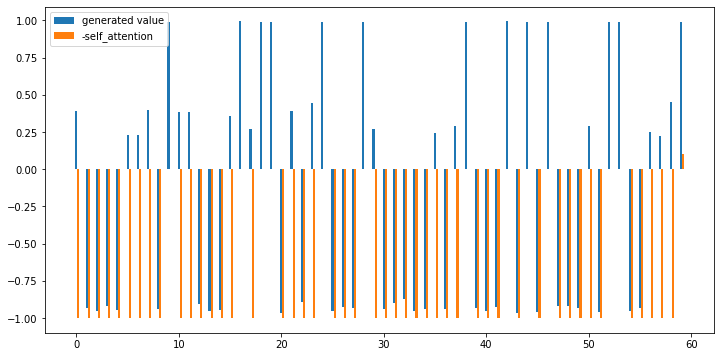

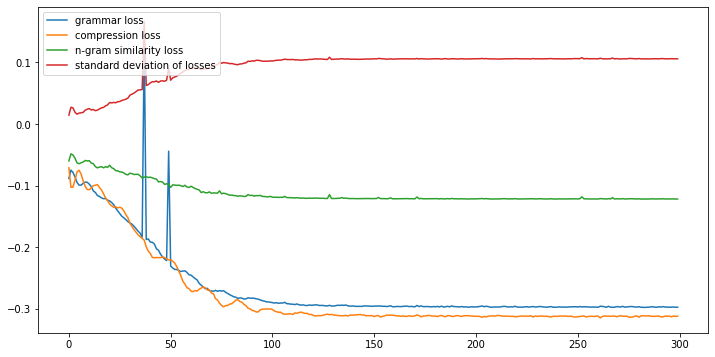

g 5.0876 	s 0.1646 	c 0.5176, score 1.9949, [장애학생체육대회로는 16개 종목으로 ▷육성종목(골볼 수영 육상 탁구) 배드민턴 볼링 역도 조정 축구 e스포츠) 3종류로 나뉘어 달리 장애청소년의 경기종목의 확대를 위해 않는고 관계자는 운동을 있는 시민 여러분의 따뜻한 격려를 부탁드린다고 말했다.]
g 4.8711 	s 0.1379 	c 0.5563, score 1.8934, [16개 종목으로 ▷육성종목(골볼 수영 육상 탁구) 배드민턴 볼링 역도 조정 축구 e스포츠) 3종류로 나뉘어 달리 장애청소년의 경기종목의 확대를 위해 않는고 관계자는 운동을 있는 시민 여러분의 따뜻한 격려를 부탁드린다고 말했다.]
g 5.2077 	s 0.1681 	c 0.5282, score 2.0079, [장애학생체육대회로는 16개 종목으로 ▷육성종목(골볼 수영 육상 탁구) 배드민턴 볼링 역도 조정 축구 e스포츠) 3종류로 나뉘어 달리 장애청소년의 경기종목의 확대를 위해 않는고 관계자는 운동을 시민 여러분의 따뜻한 격려를 부탁드린다고 말했다.]
요약률 0.5282 유사성 0.1681 문법성 5.2077 요약 [장애학생체육대회로는 16개 종목으로 ▷육성종목(골볼 수영 육상 탁구) 배드민턴 볼링 역도 조정 축구 e스포츠) 3종류로 나뉘어 달리 장애청소년의 경기종목의 확대를 위해 않는고 관계자는 운동을 시민 여러분의 따뜻한 격려를 부탁드린다고 말했다.]
--------------------------------------------------
장애학생체육대회로는 16개 종목으로 ▷육성종목(골볼 수영 육상 탁구) 배드민턴 볼링 역도 조정 축구 e스포츠) 3종류로 나뉘어 달리 장애청소년의 경기종목의 확대를 위해 않는고 관계자는 운동을 시민 여러분의 따뜻한 격려를 부탁드린다고 말했다. 2.0079140980758576 5.2077436447143555
================================================== Original Docum

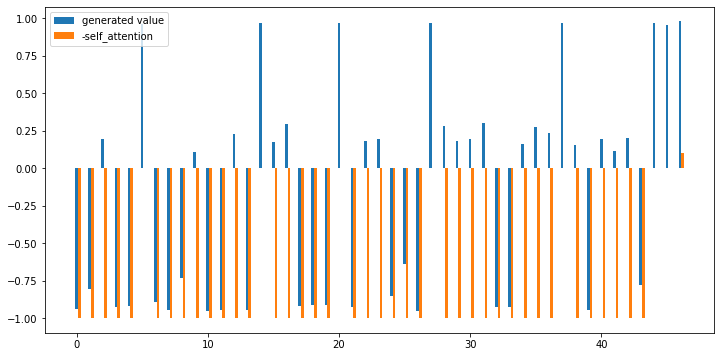

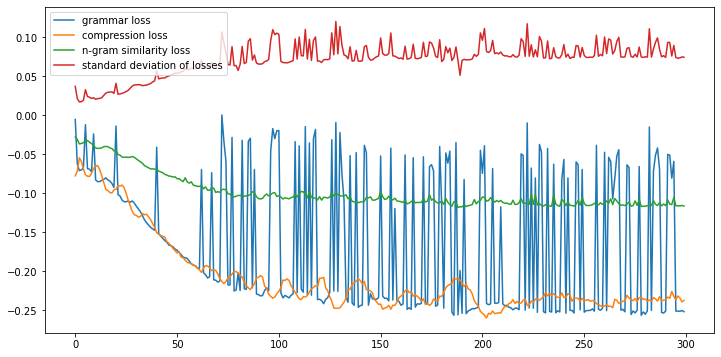

g 2.5706 	s 0.1288 	c 0.4924, score 1.5496, [5일권 선보이고 무궁화 열차를 또는 자유석으로 정해진 수 미로랑은 비엔날레 이름으로 열차 이용 3일 전부터 역 매표소에서 구입할 수 있고 예술경영지원센터 미술주간 확인할 수 있다.]
g 2.1699 	s 0.1041 	c 0.4721, score 1.4378, [5일권 선보이고 무궁화 열차를 또는 자유석으로 정해진 수 미로랑은 비엔날레 이름으로 열차 이용 3일 전부터 역 매표소에서 구입할 수 있고 내용은 예술경영지원센터 미술주간 확인할 수 있다.]
g -1.4480 	s 0.2080 	c 0.6802, score 0.7864, [선보이고 또는 자유석으로 정해진 수 미로랑은 비엔날레 이름으로 열차 3일 전부터 구입할 수 있고 확인할 수 있다.]
g -2.0312 	s 0.0513 	c 0.6041, score 0.6087, [선보이고 열차를 또는 자유석으로 정해진 수 미로랑은 비엔날레 이름으로 이용 3일 전부터 매표소에서 구입할 수 있고 미술주간 확인할 수 있다.]
g -1.7364 	s 0.0879 	c 0.5076, score 0.7909, [선보이고 무궁화 열차를 또는 자유석으로 정해진 수 미로랑은 비엔날레 이름으로 열차 3일 전부터 역 매표소에서 구입할 수 있고 내용은 예술경영지원센터 미술주간 확인할 수 있다.]
g -4.9303 	s 0.4238 	c 0.8020, score 0.3001, [선보이고 또는 자유석으로 수 비엔날레 이름으로 역 수 확인할 수 있다.]
g -0.6937 	s 0.1917 	c 0.6345, score 0.9415, [선보이고 무궁화 또는 자유석으로 정해진 수 미로랑은 비엔날레 이름으로 이용 3일 전부터 구입할 수 있고 미술주간 확인할 수 있다.]
g 2.6331 	s 0.1149 	c 0.5127, score 1.5411, [5일권 선보이고 무궁화 또는 자유석으로 정해진 수 미로랑은 비엔날레 이름으로 열차 이용 3일 역 매표소에서 구입할 수 있고

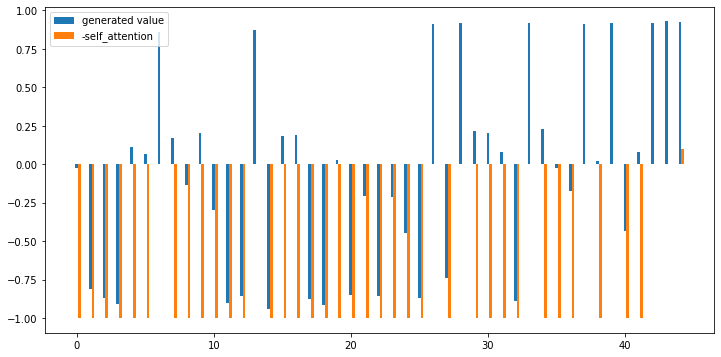

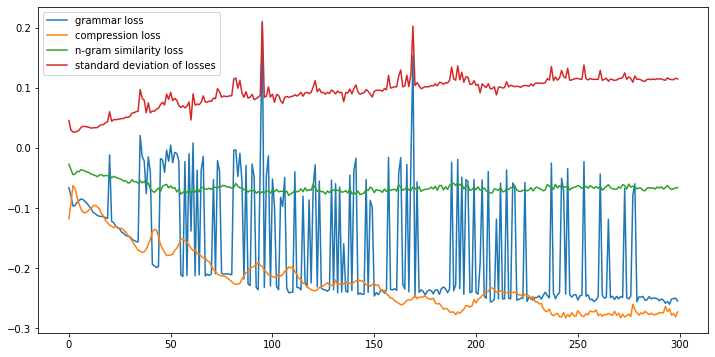

g 5.2325 	s 0.2719 	c 0.5248, score 2.1193, [점검은 지난 달 12일부터 6일까지 관할 행정처분 등을 관련 행위를 목격하거나 불량식품으로 대해서 불량식품 신고전화 ☎1399 또는 민원상담 전화 신고해 줄 것을 요청했다.]
g 5.0227 	s 0.4977 	c 0.5941, score 2.2407, [점검은 지난 달 12일부터 6일까지 관할 행정처분 등을 이내 관련 행위를 불량식품으로 대해서 불량식품 또는 민원상담 전화 신고해 줄 것을 요청했다.]
g 5.2498 	s 0.2357 	c 0.4653, score 2.0760, [위생적 점검은 지난 달 12일부터 6일까지 관할 행정처분 등을 이내 관련 행위를 목격하거나 불량식품으로 의심되는 대해서 불량식품 신고전화 ☎1399 또는 민원상담 전화 신고해 줄 것을 요청했다.]
g 5.2425 	s 0.5142 	c 0.5446, score 2.3434, [점검은 지난 달 12일부터 지난 6일까지 관할 행정처분 등을 이내 관련 행위를 목격하거나 불량식품으로 대해서 ☎1399 또는 민원상담 전화 신고해 줄 것을 요청했다.]
g 4.9515 	s 0.3446 	c 0.4356, score 2.1054, [위생적 점검은 지난 달 12일부터 6일까지 관할 행정처분 등을 이내 개선여부를 관련 행위를 목격하거나 불량식품으로 의심되는 대해서 불량식품 신고전화 ☎1399 또는 민원상담 전화 신고해 줄 것을 요청했다.]
g 5.0672 	s 0.3789 	c 0.4604, score 2.1839, [위생적 점검은 지난 달 12일부터 6일까지 관할 행정처분 등을 이내 개선여부를 관련 행위를 목격하거나 불량식품으로 대해서 불량식품 신고전화 ☎1399 또는 민원상담 전화 신고해 줄 것을 요청했다.]
g 5.0185 	s 0.4760 	c 0.5990, score 2.2134, [위생적 점검은 달 12일부터 6일까지 관할 행정처분 이내 관련 행위를 목격하거나 불량식품으로 의심되는 대해서 또는 전화 신고해 줄

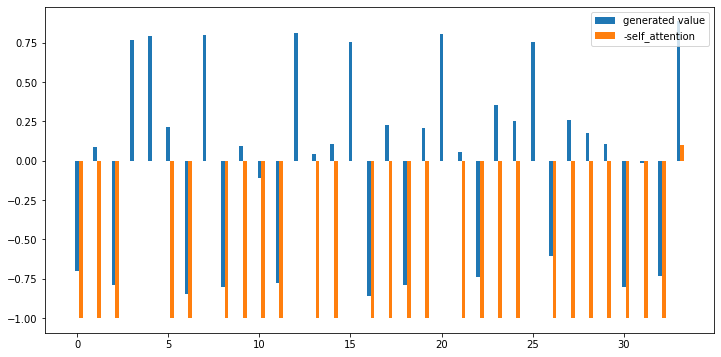

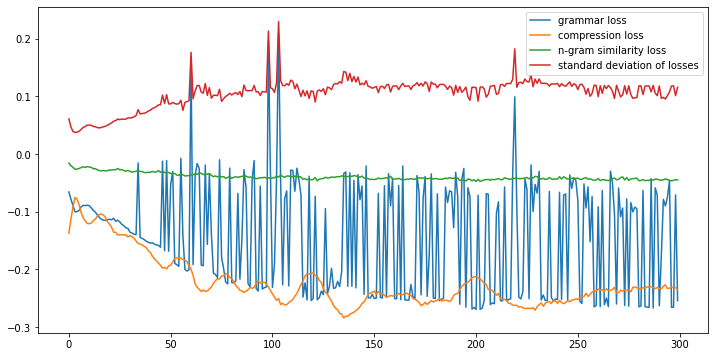

g -1.7637 	s 0.4113 	c 0.5370, score 1.0803, [인구정책 구성 이달 말쯤 등 정책 예정이고 정년 연장과 관련한 입장도 나올 것으로 홍남기 부총리 겸 장관은 정년 연장을 논의할 밝혔다.]
g -1.0363 	s 0.4064 	c 0.5802, score 1.1535, [인구정책 구성 이달 말쯤 등 예정이고 정년 관련한 입장도 나올 것으로 보인고 홍남기 부총리 겸 정년 연장을 논의할 밝혔다.]
g 2.7653 	s 0.2705 	c 0.5309, score 1.7005, [인구정책 구성 이달 말쯤 등 예정이고 정년 연장과 관련한 입장도 나올 것으로 보인고 홍남기 부총리 겸 장관은 정년 연장을 논의할 밝혔다.]
g 2.8365 	s 0.4031 	c 0.5123, score 1.8635, [인구정책 구성 이달 말쯤 등 정책 예정이고 정년 연장과 관련한 입장도 나올 것으로 보인고 홍남기 부총리 겸 장관은 정년 연장을 논의할 밝혔다.]
g 3.9402 	s 0.4001 	c 0.4877, score 2.0444, [인구정책 구성 이달 말쯤 등 정책 과제를 예정이고 정년 연장과 관련한 입장도 나올 것으로 보인고 홍남기 부총리 겸 장관은 정년 연장을 논의할 밝혔다.]
g -2.3840 	s 0.3983 	c 0.5802, score 0.9208, [인구정책 구성 이달 등 정책 예정이고 정년 연장과 관련한 입장도 나올 것으로 홍남기 겸 장관은 정년 연장을 논의할 밝혔다.]
g -3.1013 	s 0.3926 	c 0.5556, score 0.8202, [인구정책 구성 이달 말쯤 등 정책 예정이고 연장과 관련한 입장도 나올 것으로 홍남기 부총리 겸 장관은 정년 연장을 논의할 밝혔다.]
g 2.1185 	s 0.3684 	c 0.5617, score 1.6598, [인구정책 구성 이달 말쯤 등 정책 예정이고 정년 연장과 관련한 입장도 나올 것으로 홍남기 부총리 겸 장관은 정년 연장을 밝혔다.]
g -1.4025 	s 0.4239 	c 0.586

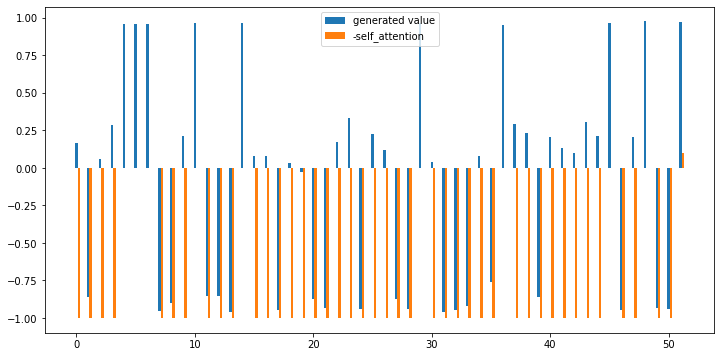

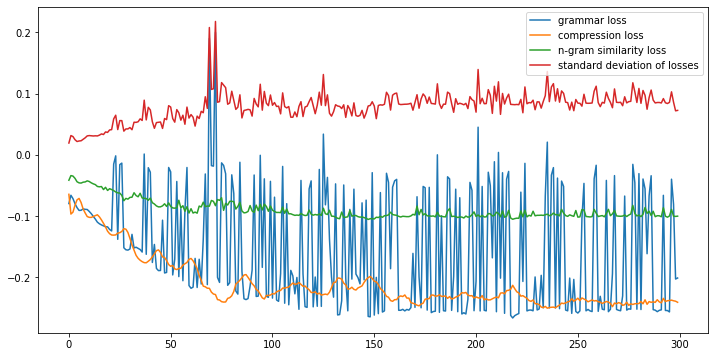

g 5.2355 	s 0.0212 	c 0.4028, score 1.7966, [삼다수 1차 단지로 그치지 않고 앞으로 분양 등을 따라 지가 상승을 수 있는 전망이 나오고 김동표 범창BID 없는 유일무이한 특수성을 곳으로 삼다수 포레스트에서만 수 있는 특권이 보장된 제주속의 천연 타운하우스로 자리매김 기대했다.]
g 5.2156 	s 0.0433 	c 0.4167, score 1.8293, [삼다수 1차 단지로 그치지 않고 앞으로 분양 등을 따라 상승을 수 있는 전망이 나오고 김동표 범창BID 없는 유일무이한 특수성을 곳으로 삼다수 포레스트에서만 수 있는 특권이 보장된 제주속의 천연 타운하우스로 자리매김 기대했다.]
g 5.0951 	s -0.0090 	c 0.4352, score 1.7754, [삼다수 1차 단지로 그치지 않고 앞으로 분양 등을 따라 수 있는 전망이 나오고 김동표 범창BID 없는 유일무이한 특수성을 곳으로 삼다수 포레스트에서만 수 있는 특권이 보장된 제주속의 천연 타운하우스로 자리매김 기대했다.]
g -4.1720 	s 0.0530 	c 0.4815, score 0.3392, [삼다수 단지로 그치지 않고 앞으로 분양 등을 따라 지가 상승을 수 있는 전망이 나오고 김동표 범창BID 없는 유일무이한 특수성을 곳으로 포레스트에서만 수 특권이 보장된 제주속의 천연 자리매김 기대했다.]
g 5.0998 	s 0.0584 	c 0.4213, score 1.8297, [삼다수 1차 단지로 그치지 않고 앞으로 분양 등을 따라 지가 상승을 수 있는 전망이 나오고 김동표 범창BID 없는 유일무이한 특수성을 곳으로 삼다수 포레스트에서만 수 있는 특권이 제주속의 천연 타운하우스로 자리매김 기대했다.]
g 5.1746 	s 0.0346 	c 0.4352, score 1.8322, [삼다수 1차 단지로 그치지 않고 앞으로 분양 등을 따라 지가 상승을 수 있는 전망이 나오고 김동표 범창BID 없는 유일무이한 특수성을 곳으로 삼다수 포레스트에서만 있는 특권이 보장된 천연

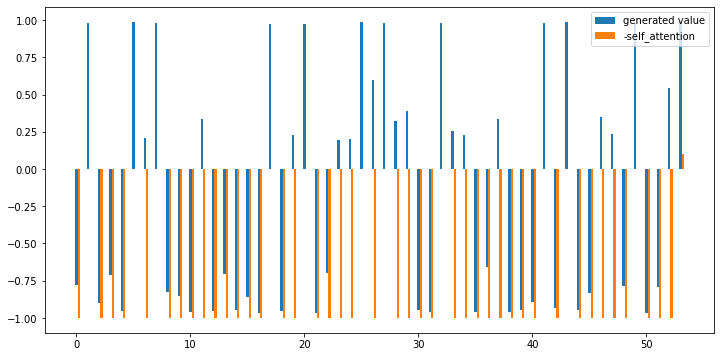

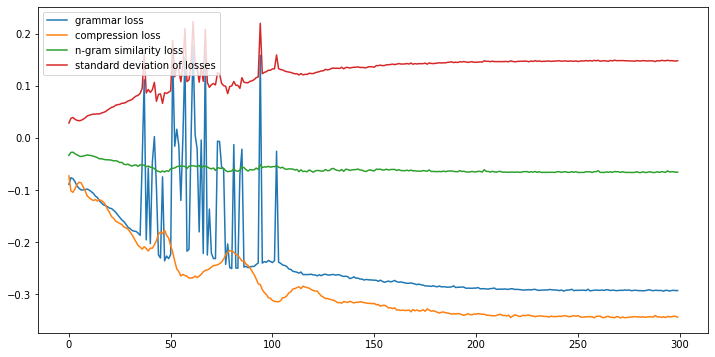

g 5.2605 	s 0.0788 	c 0.5550, score 1.9005, [이 벌인 교포 선수 결과에도 이어 2연패를 노리고 LA 오픈에 이어 2주 연속 우승에 도전한고 코치 테드 오와 고는 것처럼 좋은 코스여서 올해도 좋은 것이라고 말했다.]
g 5.2575 	s 0.1071 	c 0.5694, score 1.9139, [이 벌인 교포 선수 결과에도 이어 2연패를 노리고 오픈에 이어 2주 연속 우승에 도전한고 코치 테드 오와 고는 것처럼 좋은 코스여서 올해도 좋은 것이라고 말했다.]
g 5.2474 	s 0.0905 	c 0.5837, score 1.8813, [이 벌인 교포 선수 결과에도 이어 2연패를 노리고 오픈에 이어 2주 연속 우승에 도전한고 코치 오와 고는 것처럼 좋은 코스여서 올해도 좋은 것이라고 말했다.]
g 5.0907 	s 0.0758 	c 0.5933, score 1.8309, [이 벌인 교포 선수 결과에도 이어 노리고 LA 오픈에 이어 2주 연속 우승에 도전한고 코치 오와 고는 것처럼 좋은 코스여서 올해도 좋은 것이라고 말했다.]
g 5.2493 	s 0.1096 	c 0.5885, score 1.8959, [이 벌인 교포 선수 결과에도 이어 2연패를 노리고 오픈에 이어 2주 연속 도전한고 코치 테드 오와 고는 것처럼 좋은 코스여서 올해도 좋은 것이라고 말했다.]
요약률 0.5694 유사성 0.1071 문법성 5.2575 요약 [이 벌인 교포 선수 결과에도 이어 2연패를 노리고 오픈에 이어 2주 연속 우승에 도전한고 코치 테드 오와 고는 것처럼 좋은 코스여서 올해도 좋은 것이라고 말했다.]
--------------------------------------------------
이 벌인 교포 선수 결과에도 이어 2연패를 노리고 오픈에 이어 2주 연속 우승에 도전한고 코치 테드 오와 고는 것처럼 좋은 코스여서 올해도 좋은 것이라고 말했다. 1.9139293885568494 5.257518291473389
================

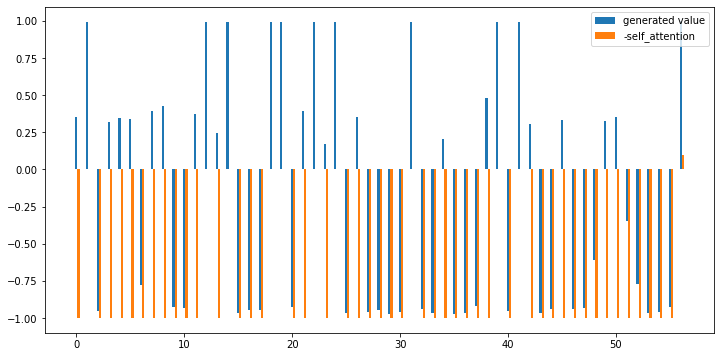

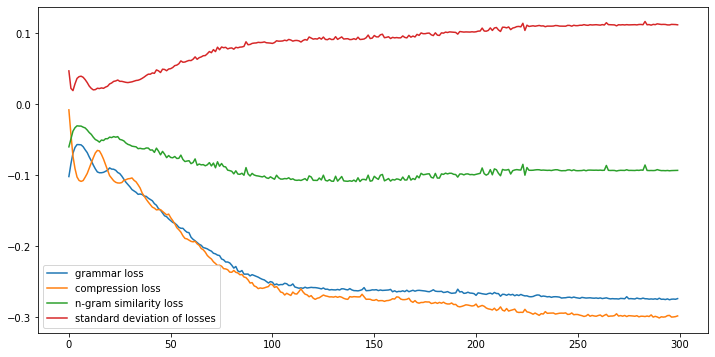

g 5.2610 	s 0.4519 	c 0.5338, score 2.2949, [‘전남권환경성질환예방관리센터’는 2018년 별에 선정된 보성 소재해 있고 녹차를 활용한 족욕 및 심리 치유 운영하고 있으며 편백나무를 활용한 찜질방 갖추고 전남도 시설 추가 계기로 기존 연계해 대표지역으로 자리매김 말했다.]
g 5.2475 	s 0.4880 	c 0.5489, score 2.3137, [‘전남권환경성질환예방관리센터’는 2018년 별에 선정된 보성 소재해 있고 녹차를 활용한 족욕 및 심리 치유 운영하고 있으며 편백나무를 활용한 찜질방 갖추고 시설 추가 계기로 기존 연계해 대표지역으로 자리매김 말했다.]
g 5.2521 	s 0.4670 	c 0.5188, score 2.3236, [‘전남권환경성질환예방관리센터’는 2018년 별에 선정된 보성 소재해 있고 녹차를 활용한 족욕 및 심리 치유 운영하고 있으며 편백나무를 활용한 찜질방 갖추고 전남도 시설 추가 계기로 기존 연계해 대표지역으로 자리매김 하도록 말했다.]
g 5.0597 	s 0.4763 	c 0.5564, score 2.2631, [‘전남권환경성질환예방관리센터’는 2018년 별에 선정된 보성 소재해 있고 녹차를 활용한 족욕 및 심리 치유 운영하고 있으며 활용한 찜질방 갖추고 전남도 시설 추가 계기로 기존 연계해 대표지역으로 자리매김 말했다.]
g 5.2638 	s 0.4168 	c 0.5451, score 2.2490, [‘전남권환경성질환예방관리센터’는 2018년 별에 선정된 보성 소재해 있고 녹차를 활용한 족욕 및 심리 치유 운영하고 있으며 편백나무를 활용한 찜질방 갖추고 전남도 시설 추가 계기로 연계해 대표지역으로 자리매김 말했다.]
요약률 0.5188 유사성 0.4670 문법성 5.2521 요약 [‘전남권환경성질환예방관리센터’는 2018년 별에 선정된 보성 소재해 있고 녹차를 활용한 족욕 및 심리 치유 운영하고 있으며 편백나무를 활용한 찜질방 갖추고 전남도 시설 추가 계기로 기존 연계해 대표지역으로 자리

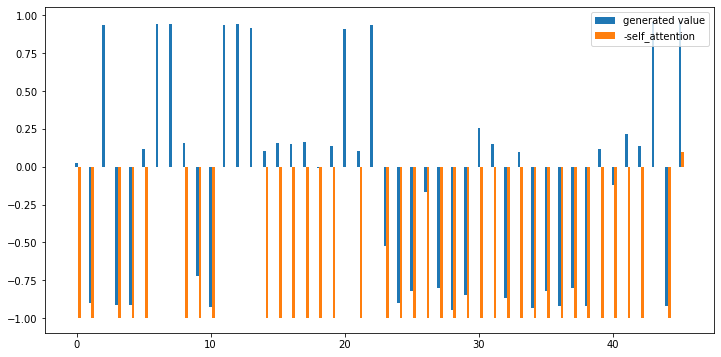

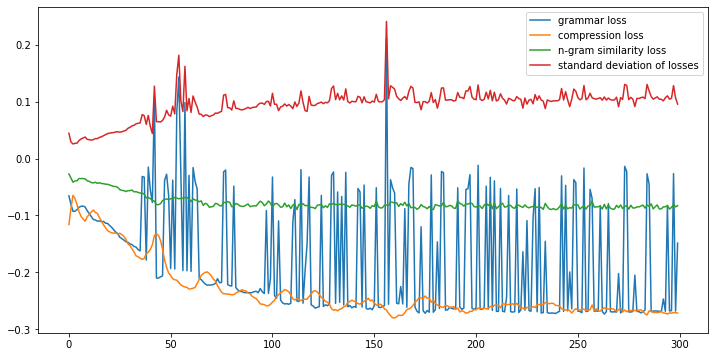

g 4.1354 	s -0.0946 	c 0.3978, score 1.4925, [본격적인 할 야수가 될 수밖에 없었던 변화를 이 변화를 그려내는 배우 윤시윤의 집중력 있는 연기를 기대하며 지켜봐 주시기 윤시윤의 집중력 열연을 녹두꽃 13~14회는 오늘(17일) 금요일 밤 방송된다.]
g -3.0609 	s 0.1592 	c 0.6290, score 0.5201, [본격적인 할 될 수밖에 없었던 변화를 이 변화를 그려내는 배우 윤시윤의 집중력 기대하며 주시기 윤시윤의 집중력 밤 방송된다.]
g 4.4789 	s -0.0410 	c 0.4355, score 1.6409, [본격적인 할 야수가 될 수밖에 없었던 변화를 이 변화를 그려내는 윤시윤의 집중력 있는 연기를 기대하며 지켜봐 주시기 윤시윤의 집중력 열연을 13~14회는 오늘(17일) 금요일 밤 방송된다.]
g 3.1684 	s -0.0640 	c 0.4409, score 1.4049, [본격적인 할 야수가 될 수밖에 없었던 변화를 이 변화를 그려내는 배우 윤시윤의 집중력 있는 연기를 기대하며 지켜봐 주시기 윤시윤의 집중력 열연을 녹두꽃 오늘(17일) 금요일 밤 방송된다.]
g -0.7409 	s -0.0630 	c 0.4624, score 0.7759, [본격적인 할 될 수밖에 없었던 변화를 이 변화를 그려내는 배우 윤시윤의 집중력 있는 연기를 기대하며 지켜봐 주시기 윤시윤의 집중력 열연을 녹두꽃 오늘(17일) 금요일 밤 방송된다.]
g 5.0352 	s -0.0283 	c 0.4785, score 1.7894, [본격적인 할 야수가 될 수밖에 없었던 변화를 이 변화를 그려내는 배우 윤시윤의 집중력 연기를 기대하며 지켜봐 주시기 윤시윤의 집중력 열연을 오늘(17일) 금요일 밤 방송된다.]
g -1.2094 	s -0.1298 	c 0.4677, score 0.6363, [본격적인 할 될 수밖에 없었던 변화를 이 변화를 그려내는 배우 윤시윤의 집중력 있는 연기를 기대하며 주시기 집중력 열연을 녹두꽃 13~14

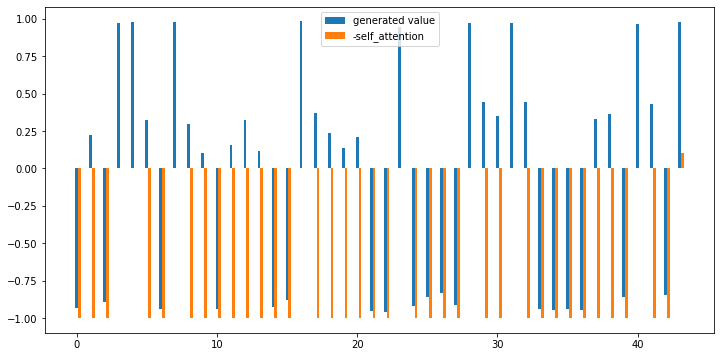

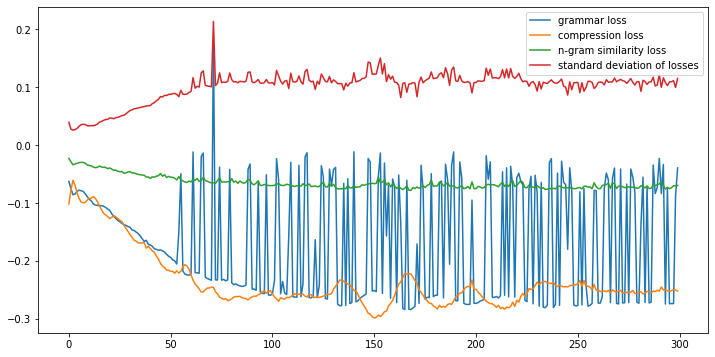

g 4.9195 	s 0.0236 	c 0.4235, score 1.7670, [탈당 완료된 만큼 제3지대 위한 행보에 속도를 계획이고 이르면 11월 목표로 하고 있고 대안정치 소속인 한 같은 사람을 찾고 있지만 없다면서도 인물 영입을) 수 있다고 말했다.]
g -4.3608 	s 0.3459 	c 0.6412, score 0.4780, [탈당 완료된 만큼 위한 계획이고 목표로 있고 소속인 한 같은 사람을 있지만 없다면서도 인물 수 있다고 말했다.]
g 4.0959 	s 0.0958 	c 0.4706, score 1.7490, [탈당 완료된 만큼 제3지대 위한 행보에 계획이고 11월 목표로 하고 있고 대안정치 소속인 한 같은 사람을 찾고 있지만 없다면서도 인물 영입을) 수 있다고 말했다.]
g 4.9228 	s 0.0009 	c 0.4471, score 1.7684, [탈당 완료된 만큼 제3지대 위한 행보에 계획이고 이르면 11월 목표로 하고 있고 대안정치 소속인 한 같은 사람을 찾고 있지만 없다면서도 인물 영입을) 수 있다고 말했다.]
g -4.8366 	s 0.1683 	c 0.5118, score 0.3504, [완료된 만큼 제3지대 위한 행보에 속도를 계획이고 이르면 목표로 하고 있고 대안정치 소속인 한 같은 사람을 있지만 없다면서도 인물 수 있다고 말했다.]
g -3.2586 	s 0.1386 	c 0.5118, score 0.5837, [완료된 만큼 제3지대 위한 행보에 계획이고 이르면 11월 목표로 하고 대안정치 소속인 한 같은 사람을 찾고 있지만 없다면서도 인물 수 있다고 말했다.]
g 3.6403 	s 0.0549 	c 0.4471, score 1.6086, [탈당 완료된 만큼 제3지대 위한 속도를 계획이고 이르면 11월 목표로 하고 있고 대안정치 소속인 한 같은 사람을 찾고 있지만 없다면서도 인물 영입을) 수 있다고 말했다.]
g -5.4482 	s 0.3076 	c 0.6941, score 0.2055, [완료된 만큼 제3지대 위한 행보에 

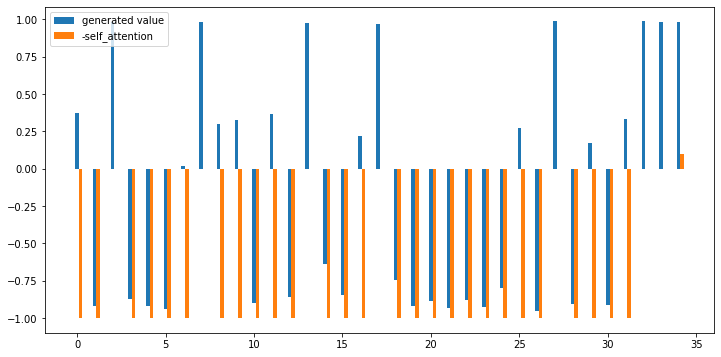

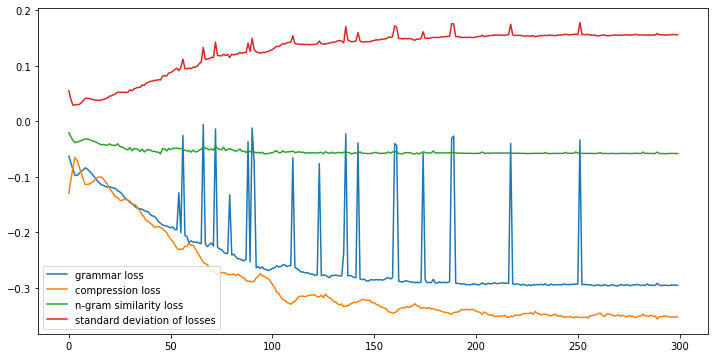

g 5.2040 	s 0.3221 	c 0.5652, score 2.1242, [1차전 경우 주민자치센터 및 용인시청 체육진흥과(문의 콜센터 등 가능하고 경기 10시부터 경기는 주경기장 티켓을 살 수 있다.]
g -1.6108 	s 0.4814 	c 0.5901, score 1.1228, [경우 주민자치센터 및 용인시청 체육진흥과(문의 콜센터 등 가능하고 경기 10시부터 경기는 주경기장 티켓을 살 수 있다.]
g 3.5939 	s 0.3547 	c 0.6087, score 1.8450, [1차전 경우 및 용인시청 체육진흥과(문의 콜센터 등 가능하고 경기 10시부터 경기는 주경기장 티켓을 살 수 있다.]
g 5.1528 	s 0.5024 	c 0.5963, score 2.2649, [1차전 경우 주민자치센터 및 용인시청 체육진흥과(문의 콜센터 등 가능하고 경기 10시부터 경기는 티켓을 살 수 있다.]
g 4.8107 	s 0.4648 	c 0.5901, score 2.1765, [1차전 경우 주민자치센터 및 용인시청 체육진흥과(문의 콜센터 등 가능하고 경기 10시부터 경기는 주경기장 살 수 있다.]
요약률 0.5963 유사성 0.5024 문법성 5.1528 요약 [1차전 경우 주민자치센터 및 용인시청 체육진흥과(문의 콜센터 등 가능하고 경기 10시부터 경기는 티켓을 살 수 있다.]
--------------------------------------------------
1차전 경우 주민자치센터 및 용인시청 체육진흥과(문의 콜센터 등 가능하고 경기 10시부터 경기는 티켓을 살 수 있다. 2.2648765754502262 5.15278434753418
================================================== Original Document 35==================================================
이종만 대표팀, 내달 6일 용인·9일 춘천서 아이슬란드와 친선 경기 여자축구대표팀이 6월 프랑스에서

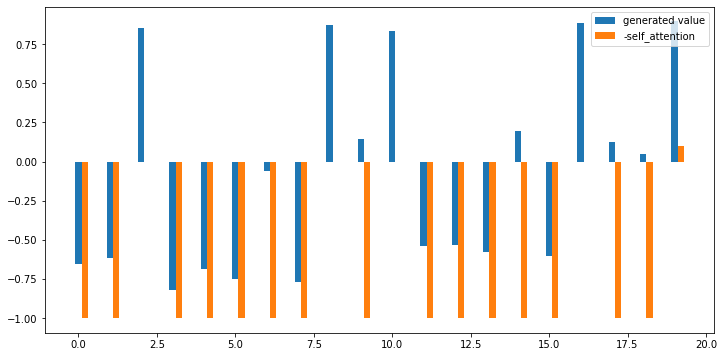

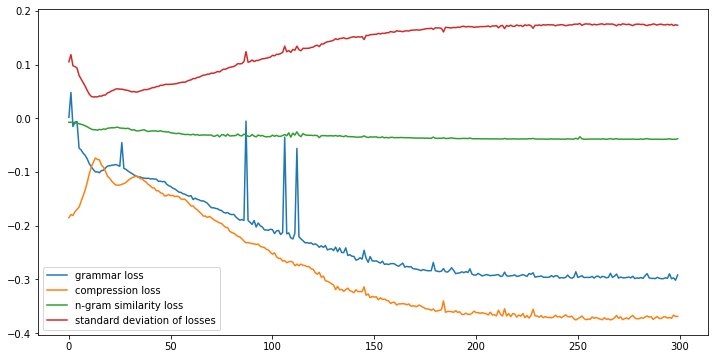

g 4.3976 	s 0.5077 	c 0.5000, score 2.2406, [시티 우나이 감독 경질 후 요법의 나타나지 않았고 8경기(6무2패)째 무승이다.]
g 3.4120 	s 0.4951 	c 0.5455, score 2.0183, [시티 감독 경질 후 요법의 나타나지 않았고 8경기(6무2패)째 무승이다.]
g 4.8847 	s 0.5063 	c 0.5455, score 2.2750, [시티 우나이 감독 경질 후 나타나지 않았고 8경기(6무2패)째 무승이다.]
요약률 0.5455 유사성 0.5063 문법성 4.8847 요약 [시티 우나이 감독 경질 후 나타나지 않았고 8경기(6무2패)째 무승이다.]
--------------------------------------------------
시티 우나이 감독 경질 후 나타나지 않았고 8경기(6무2패)째 무승이다. 2.275007025762038 4.884701728820801
================================================== Original Document 36==================================================
뉴시스 맨체스터 유나이티드의 마커스 래쉬포드가 2일(한국시간) 영국 맨체스터 올드트래포드에서 열린 2019~2020 잉글랜드 프리미어리그(EPL) 아스톤 빌라와의 경기에서 아스톤 빌라의 프레데릭 길버트의 태클을 피하고 있다.
맨체스터 유나이티드와 아스날이 좀처럼 부진에서 벗어나지 못하고 있다.
맨유는 2일(한국시간) 영국 맨체스터 올드트래포드에서 열린 2019~2020 잉글랜드 프리미어리그(EPL) 아스톤 빌라와의 경기에서 2-2로 비겼다.
지난달 25일 셰필드 유나이티드전(3-3)에 이은 리그 두 경기 연속 무승부다.
아스타나(카자흐스탄)와의 유럽축구연맹 유로파리그 1-2 패배를 포함하면 세 경기째 승리가 없다.
맨유는 전반 11분 만에 잭 그릴리시에서 선제골을 내줘 끌려갔다.
왼쪽 측면에서 공을 잡은 그릴리시는 환

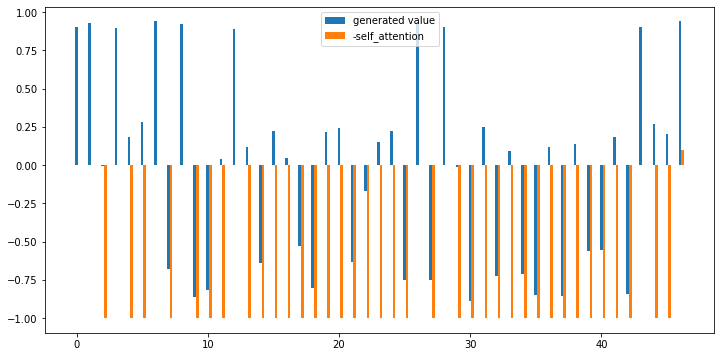

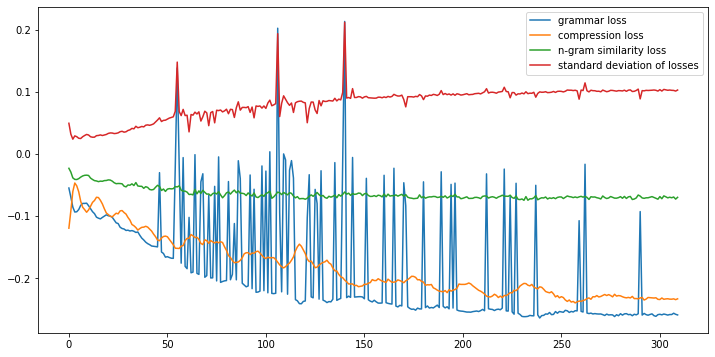

g 5.2518 	s 0.2284 	c 0.4200, score 2.0237, [실제로 통상 분양시장에서 가장 늦게까지 미분양으로 남아있는 가장 정남향 외에도 남동 분양을 마쳤고 주택사업 실장은 대형 태풍인 영향으로 급격히 위축돼 성과가 이었다면서 상호 분양 성공할 수 있었다고 설명했다.]
g 5.2494 	s 0.2238 	c 0.4750, score 2.0737, [실제로 통상 가장 늦게까지 미분양으로 남아있는 가장 외에도 남동 분양을 마쳤고 주택사업 실장은 대형 태풍인 영향으로 급격히 위축돼 성과가 이었다면서 상호 분양 성공할 수 있었다고 설명했다.]
g 5.2334 	s 0.2574 	c 0.4350, score 2.0647, [실제로 통상 가장 늦게까지 미분양으로 남아있는 가장 정남향 외에도 남동 분양을 마쳤고 주택사업 실장은 대형 태풍인 영향으로 급격히 위축돼 성과가 이었다면서 상호 연이은 분양 성공할 수 있었다고 설명했다.]
g 5.1667 	s 0.2542 	c 0.4300, score 2.0453, [실제로 통상 분양시장에서 가장 늦게까지 남아있는 가장 정남향 외에도 남동 분양을 마쳤고 주택사업 실장은 발생과 대형 태풍인 영향으로 급격히 위축돼 성과가 이었다면서 상호 분양 성공할 수 있었다고 설명했다.]
g 2.9069 	s 0.2326 	c 0.4750, score 1.6921, [실제로 통상 분양시장에서 가장 남아있는 가장 정남향 외에도 남동 분양을 마쳤고 주택사업 실장은 대형 태풍인 영향으로 급격히 위축돼 성과가 이었다면서 상호 분양 성공할 수 있었다고 설명했다.]
g 5.1840 	s 0.2592 	c 0.4000, score 2.0232, [실제로 통상 분양시장에서 가장 늦게까지 미분양으로 남아있는 가장 정남향 외에도 남동 분양을 마쳤고 주택사업 실장은 대형 태풍인 영향으로 급격히 위축돼 성과가 이었다면서 상호 연이은 분양 성공할 수 있었다고 설명했다.]
g 5.2414 	s 0.2392 	c 0.4200, score 2.0328, [

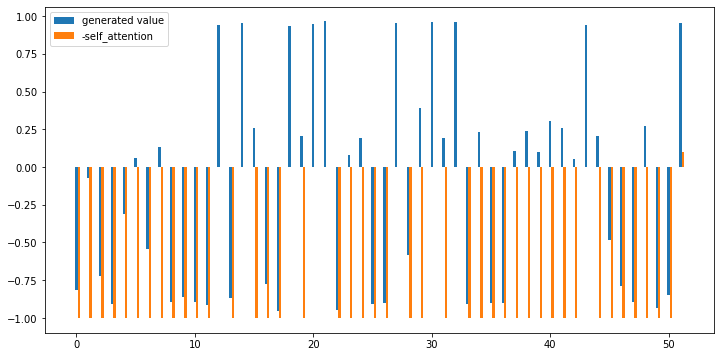

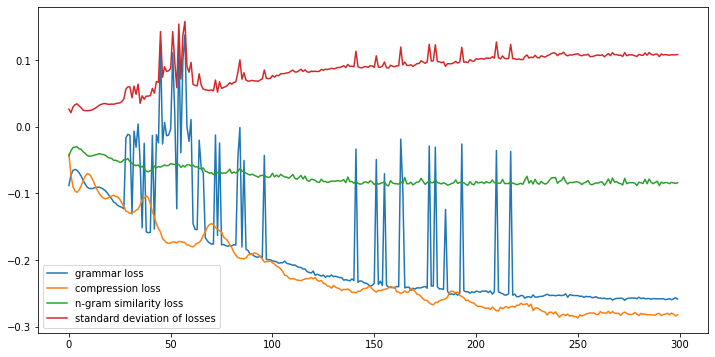

g 4.6699 	s 0.4007 	c 0.4821, score 2.1612, [게임사 e스포츠 에프이지(FEG) 등이 대상으로 콘텐츠 진행한고 게임 제작이 가능한 만화 웹툰 분야 설명회를 통해 지식재산권(IP)을 소개한고 문체부 게임 강국인 협업은 국내 게임 산업 경쟁력을 크게 말했다.]
g 4.7930 	s 0.3436 	c 0.4688, score 2.1112, [게임사 e스포츠 에프이지(FEG) 등이 대상으로 콘텐츠 진행한고 게임 제작이 가능한 만화 웹툰 분야 설명회를 통해 지식재산권(IP)을 소개한고 문체부 게임 강국인 3국 협업은 국내 게임 산업 경쟁력을 크게 말했다.]
g 4.8900 	s 0.4011 	c 0.5045, score 2.2117, [게임사 에프이지(FEG) 등이 대상으로 콘텐츠 진행한고 게임 제작이 가능한 만화 웹툰 분야 설명회를 통해 지식재산권(IP)을 소개한고 문체부 게임 강국인 협업은 국내 게임 산업 경쟁력을 크게 말했다.]
g 4.9278 	s 0.4036 	c 0.5223, score 2.2025, [게임사 에프이지(FEG) 등이 대상으로 콘텐츠 진행한고 게임 제작이 가능한 만화 웹툰 분야 설명회를 통해 지식재산권(IP)을 소개한고 문체부 게임 협업은 국내 게임 산업 경쟁력을 크게 말했다.]
g 2.2356 	s 0.2993 	c 0.5268, score 1.6451, [게임사 에프이지(FEG) 등이 대상으로 콘텐츠 진행한고 제작이 가능한 만화 웹툰 분야 통해 지식재산권(IP)을 소개한고 문체부 게임 강국인 3국 협업은 국내 게임 산업 경쟁력을 크게 말했다.]
g 5.2625 	s 0.3602 	c 0.5000, score 2.2373, [게임사 e스포츠 에프이지(FEG) 등이 대상으로 진행한고 게임 제작이 가능한 만화 웹툰 분야 설명회를 통해 지식재산권(IP)을 소개한고 문체부 게임 강국인 3국 협업은 국내 산업 경쟁력을 크게 말했다.]
g 5.0083 	s 0.3843 	c 0.5045, score 2.2146, [게임

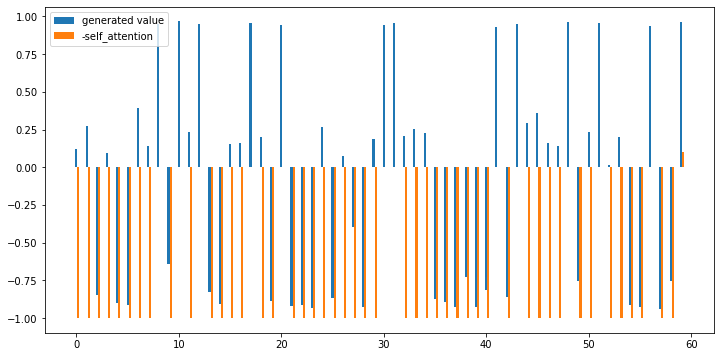

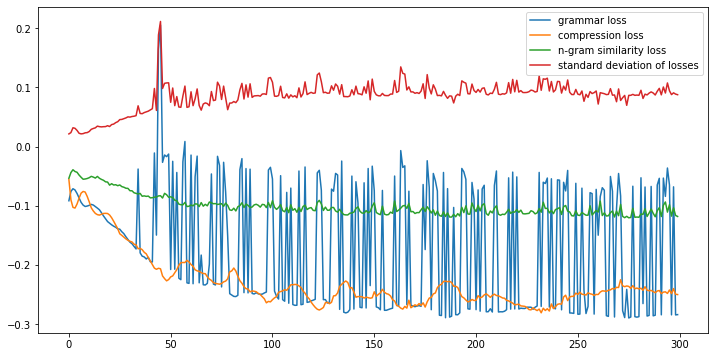

g 5.0468 	s 0.3605 	c 0.4553, score 2.1569, [유익균으로 알려진 락티스(Lactococcus 위암 발병률을 약 1로 낮추는 등 있었고 이 같은 연구 기반으로 장내 유전체 출시를 준비 중이고 테라젠이텍스 관계자는 이번 장기 점에서 신뢰도가 높다며 미생물 균총 분포 위암 발병 예측과 진단 수 말했다.]
g -5.3296 	s -0.1705 	c 0.6848, score -0.2436, [알려진 위암 약 1로 등 같은 기반으로 장내 출시를 준비 중이고 테라젠이텍스 장기 점에서 신뢰도가 높다며 미생물 분포 위암 발병 진단 수 말했다.]
g -5.1444 	s 0.3019 	c 0.6537, score 0.2908, [알려진 위암 약 1로 낮추는 등 있었고 이 같은 연구 기반으로 장내 출시를 준비 중이고 테라젠이텍스 장기 점에서 높다며 분포 위암 발병 예측과 진단 수 말했다.]
g 4.8195 	s 0.3748 	c 0.4669, score 2.1450, [유익균으로 알려진 락티스(Lactococcus 위암 발병률을 약 1로 낮추는 등 있었고 이 같은 연구 기반으로 장내 유전체 출시를 준비 중이고 테라젠이텍스 관계자는 장기 점에서 신뢰도가 높다며 미생물 균총 분포 위암 발병 예측과 진단 수 말했다.]
g -1.5799 	s 0.2932 	c 0.6498, score 0.8801, [알려진 위암 발병률을 약 1로 낮추는 등 같은 연구 기반으로 유전체 출시를 준비 중이고 테라젠이텍스 관계자는 장기 점에서 높다며 균총 분포 발병 진단 수 말했다.]
g -0.4844 	s 0.3397 	c 0.5097, score 1.2492, [락티스(Lactococcus 위암 발병률을 약 1로 낮추는 등 있었고 이 같은 연구 기반으로 장내 출시를 준비 중이고 테라젠이텍스 관계자는 이번 장기 점에서 신뢰도가 높다며 미생물 균총 분포 위암 발병 예측과 진단 수 말했다.]
g 5.0068 	s 0.3397 	c 0.4708, score 2.1450, [유익균으

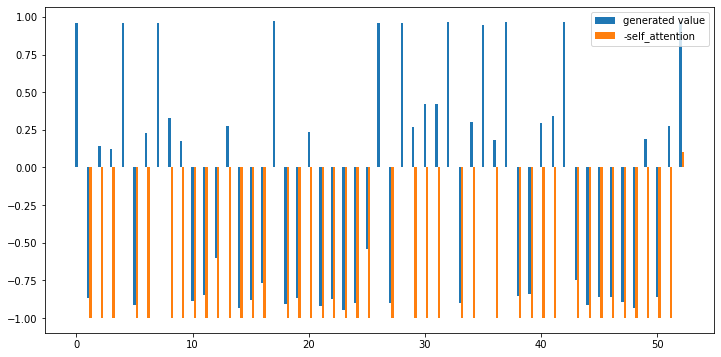

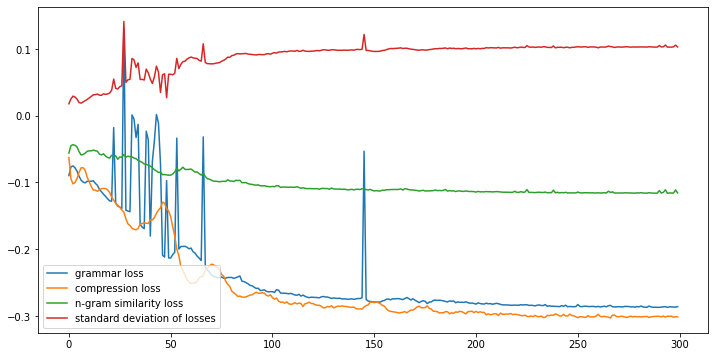

g 5.2559 	s 0.3943 	c 0.5019, score 2.2684, [특히 6월에는 벡스코에서 열린 부산국제철도산업전’을 통해 시제품으로 선보이며 공사는 내 시스템을 설치하는 본격적으로 이 시스템을 도입할 예정이고 이종국 사장은 “이번 기술은 도시철도에 특화해 적용한 사회공헌을 추진하겠다”고 말했다.]
g 5.2364 	s 0.3997 	c 0.5212, score 2.2512, [특히 6월에는 벡스코에서 열린 부산국제철도산업전’을 통해 시제품으로 공사는 내 시스템을 설치하는 본격적으로 이 시스템을 도입할 예정이고 이종국 사장은 “이번 기술은 도시철도에 특화해 적용한 사회공헌을 추진하겠다”고 말했다.]
g 5.2496 	s 0.3820 	c 0.5251, score 2.2319, [특히 6월에는 벡스코에서 열린 부산국제철도산업전’을 통해 선보이며 공사는 내 시스템을 설치하는 본격적으로 이 시스템을 도입할 예정이고 이종국 사장은 “이번 기술은 도시철도에 특화해 적용한 사회공헌을 추진하겠다”고 말했다.]
요약률 0.5019 유사성 0.3943 문법성 5.2559 요약 [특히 6월에는 벡스코에서 열린 부산국제철도산업전’을 통해 시제품으로 선보이며 공사는 내 시스템을 설치하는 본격적으로 이 시스템을 도입할 예정이고 이종국 사장은 “이번 기술은 도시철도에 특화해 적용한 사회공헌을 추진하겠다”고 말했다.]
--------------------------------------------------
특히 6월에는 벡스코에서 열린 부산국제철도산업전’을 통해 시제품으로 선보이며 공사는 내 시스템을 설치하는 본격적으로 이 시스템을 도입할 예정이고 이종국 사장은 “이번 기술은 도시철도에 특화해 적용한 사회공헌을 추진하겠다”고 말했다. 2.268387966481262 5.2559027671813965
================================================== Original Document 41==========================

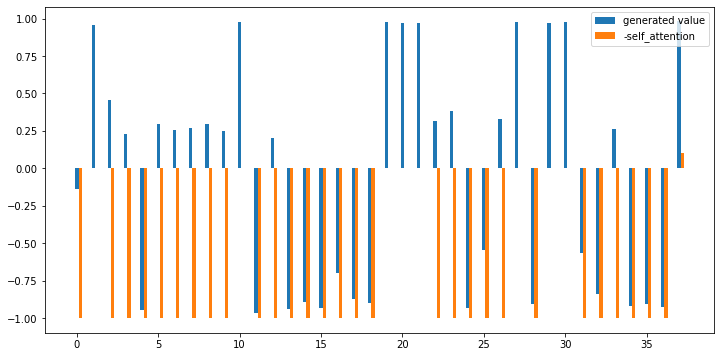

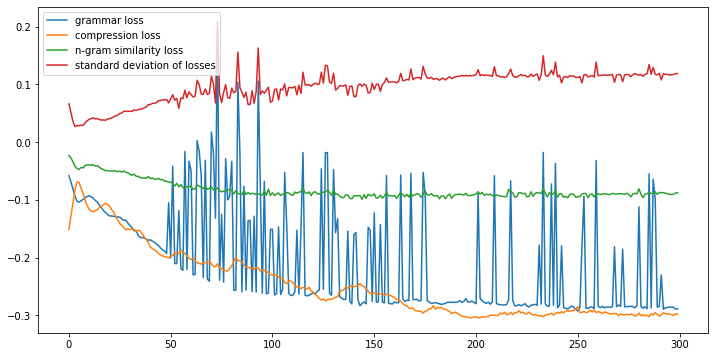

g -0.5160 	s 0.2799 	c 0.5191, score 1.1747, [관련 경제과 일자리창출팀(☏043-830-3325)이나 읍·면사무소로 문의하면 된고 괴산군 이번 사업을 통해 80여 제1단계 사업은 참여한 가운데 마무리된다.]
g 2.0985 	s 0.1151 	c 0.4536, score 1.4184, [관련 자세한 사항은 경제과 일자리창출팀(☏043-830-3325)이나 각 읍·면사무소로 문의하면 된고 괴산군 이번 사업을 통해 80여 명에게 사업은 참여한 가운데 진행 마무리된다.]
g 2.5364 	s 0.1564 	c 0.4262, score 1.5054, [관련 자세한 사항은 경제과 일자리창출팀(☏043-830-3325)이나 각 읍·면사무소로 문의하면 된고 괴산군 이번 사업을 통해 80여 명에게 제1단계 사업은 참여한 가운데 진행 마무리된다.]
g 1.9199 	s 0.0929 	c 0.5574, score 1.3555, [관련 자세한 사항은 경제과 각 읍·면사무소로 문의하면 된고 괴산군 이번 사업을 통해 80여 명에게 제1단계 사업은 참여한 가운데 진행 마무리된다.]
g 2.4116 	s 0.0877 	c 0.4481, score 1.4377, [관련 자세한 사항은 일자리창출팀(☏043-830-3325)이나 각 읍·면사무소로 문의하면 된고 괴산군 이번 사업을 통해 80여 명에게 제1단계 사업은 참여한 가운데 진행 마무리된다.]
g 1.8533 	s 0.1815 	c 0.4973, score 1.4876, [관련 사항은 경제과 일자리창출팀(☏043-830-3325)이나 읍·면사무소로 문의하면 된고 괴산군 이번 사업을 통해 명에게 제1단계 사업은 참여한 가운데 마무리된다.]
g 3.9175 	s 0.1957 	c 0.4481, score 1.7966, [관련 자세한 사항은 경제과 일자리창출팀(☏043-830-3325)이나 각 읍·면사무소로 문의하면 된고 이번 사업을 통해 80여 명에게 제1단계 사업은 참여한 가운데 진행 마무리된다.]
g 

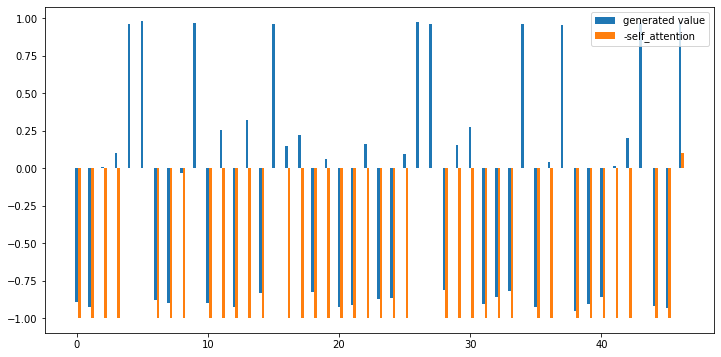

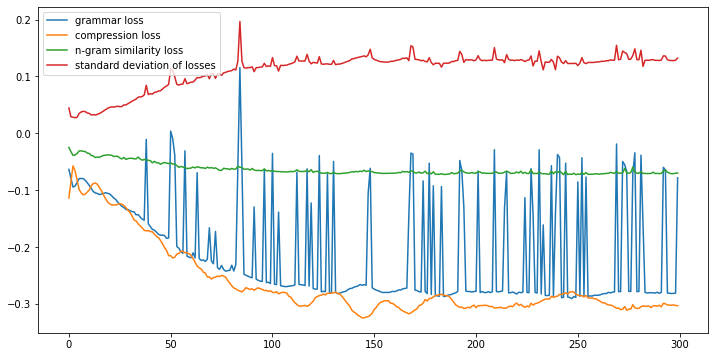

g 2.6544 	s -0.1722 	c 0.4794, score 1.2496, [기념식수 공원을 만들어 앞으로 나무의 크기 등을 결정해 따라 심을 예정이고 준공을 기념식수가 있어 장기적으로 이를 모으는 방안도 관계자는 내부로 차량 동선과 충돌하지 않도록 말했다.]
g -0.2757 	s -0.1835 	c 0.5000, score 0.7705, [기념식수 만들어 앞으로 나무의 크기 등을 결정해 따라 심을 예정이고 준공을 기념식수가 있어 장기적으로 이를 모으는 방안도 관계자는 내부로 차량 동선과 충돌하지 않도록 말했다.]
g 2.4134 	s -0.1478 	c 0.5464, score 1.2080, [기념식수 공원을 만들어 앞으로 나무의 크기 결정해 따라 심을 예정이고 준공을 있어 장기적으로 이를 모으는 방안도 관계자는 차량 동선과 충돌하지 않도록 말했다.]
g -1.2350 	s -0.1687 	c 0.5412, score 0.5842, [기념식수 만들어 앞으로 크기 등을 결정해 따라 심을 예정이고 준공을 기념식수가 있어 장기적으로 이를 모으는 방안도 관계자는 차량 동선과 충돌하지 않도록 말했다.]
g -2.0914 	s -0.1583 	c 0.5670, score 0.4261, [기념식수 공원을 만들어 앞으로 나무의 크기 결정해 따라 심을 예정이고 준공을 있어 장기적으로 이를 방안도 관계자는 차량 동선과 충돌하지 않도록 말했다.]
g 5.2149 	s -0.2057 	c 0.6701, score 1.4933, [공원을 만들어 앞으로 나무의 크기 따라 심을 예정이고 장기적으로 이를 모으는 관계자는 차량 충돌하지 않도록 말했다.]
g -5.4069 	s -0.2255 	c 0.7113, score -0.3380, [기념식수 만들어 앞으로 크기 결정해 따라 있어 장기적으로 이를 관계자는 차량 충돌하지 않도록 말했다.]
g 5.1963 	s -0.2033 	c 0.5000, score 1.6627, [기념식수 공원을 만들어 앞으로 나무의 크기 등을 결정해 따라 

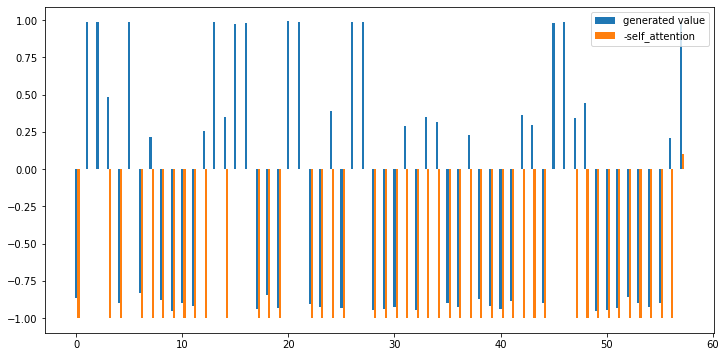

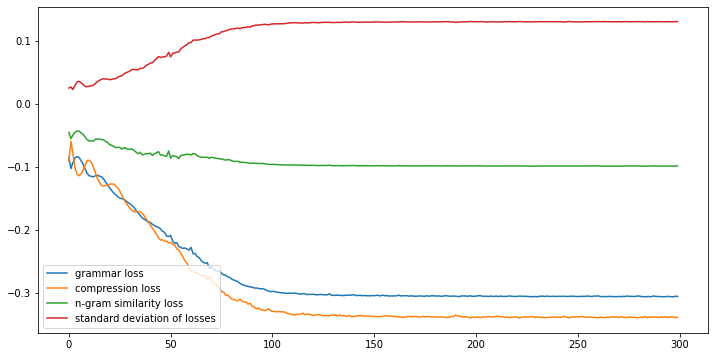

g 5.2539 	s 0.1813 	c 0.5579, score 1.9991, [더불어 기존에 영국에서 많았던 필로우 키링을 비롯해 겨울에 활용도가 높은 인 더 머그잔 소프트 인형 함께 예정이고 팝업스토어 종료되는 내년 영국 오프라인 스토어 개점도 계획 기대된다고 말했다.]
요약률 0.5579 유사성 0.1813 문법성 5.2539 요약 [더불어 기존에 영국에서 많았던 필로우 키링을 비롯해 겨울에 활용도가 높은 인 더 머그잔 소프트 인형 함께 예정이고 팝업스토어 종료되는 내년 영국 오프라인 스토어 개점도 계획 기대된다고 말했다.]
--------------------------------------------------
더불어 기존에 영국에서 많았던 필로우 키링을 비롯해 겨울에 활용도가 높은 인 더 머그잔 소프트 인형 함께 예정이고 팝업스토어 종료되는 내년 영국 오프라인 스토어 개점도 계획 기대된다고 말했다. 1.9990901702363302 5.253867149353027
================================================== Original Document 46==================================================
카카오프렌즈가 영국 런던에서 팝업스토어를 열고 유럽 캐릭터 시장에 문을 두드린다.
카카오IX는 영국 런던 하이드파크 윈터 원더랜드에 첫번째 팝업스토어를 열었다고 25일 밝혔다.
윈터 원더랜드는 영국 런던에서 가장 큰 왕립공원인 하이드파크에서 열리는 대표적인 겨울 축제로 손꼽힌다.
매년 11월 말부터 다음해 1월 초까지 약 160만㎡ 규모의 공원 전체에 크리스마스 마켓, 놀이기구, 아이스링크장 등이 설치되고 수많은 조명들이 더해져 화려한 볼거리를 자랑한다.
행사 기간 방문 규모는 약 320만명에 달한다.
카카오프렌즈는 마켓 내 단독 공간 형태로 입점해 팝업스토어를 운영한다.
판매 굿즈는 올해 출시된 멜로디 세트 인형, 쿠키 라이언, 우드 오르골, 스노우볼 등 크리스마스 에디션 

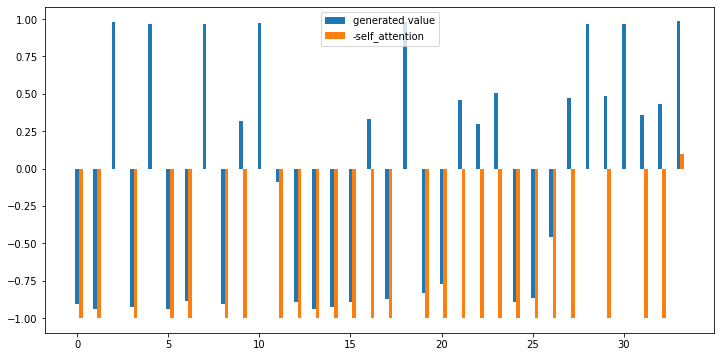

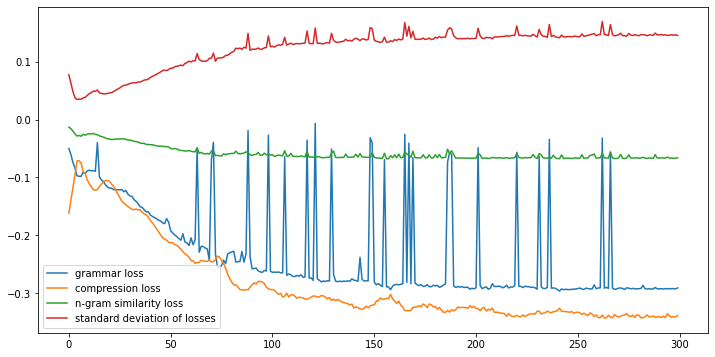

g 2.9403 	s 0.4860 	c 0.5099, score 1.9661, [대해서는 없이 되며 따라 최고 5억 신분은 의해 다가오는 제21대 국회의원선거에서 소중한 한 표를 깨끗하게 행사하기를 간절히 바란다.]
g 3.1991 	s 0.4636 	c 0.5298, score 1.9670, [대해서는 없이 되며 따라 최고 신분은 의해 다가오는 제21대 국회의원선거에서 소중한 한 표를 깨끗하게 행사하기를 간절히 바란다.]
g 2.6144 	s 0.3935 	c 0.5563, score 1.7729, [대해서는 없이 되며 따라 최고 의해 다가오는 제21대 국회의원선거에서 소중한 한 표를 깨끗하게 행사하기를 간절히 바란다.]
g 2.4175 	s 0.4632 	c 0.6159, score 1.7502, [대해서는 없이 되며 따라 최고 의해 다가오는 국회의원선거에서 소중한 한 표를 깨끗하게 행사하기를 바란다.]
g -1.5882 	s 0.3480 	c 0.5497, score 1.0336, [대해서는 없이 되며 따라 최고 신분은 의해 다가오는 제21대 국회의원선거에서 소중한 한 깨끗하게 행사하기를 간절히 바란다.]
g -1.6173 	s 0.4842 	c 0.6424, score 1.0722, [대해서는 없이 되며 최고 신분은 의해 제21대 소중한 한 표를 깨끗하게 행사하기를 간절히 바란다.]
g 2.6723 	s 0.4310 	c 0.5629, score 1.8135, [대해서는 없이 되며 따라 최고 신분은 의해 다가오는 국회의원선거에서 소중한 한 표를 깨끗하게 행사하기를 간절히 바란다.]
g 3.6458 	s 0.4561 	c 0.5497, score 2.0141, [대해서는 없이 되며 최고 신분은 의해 다가오는 제21대 국회의원선거에서 소중한 한 표를 깨끗하게 행사하기를 간절히 바란다.]
g 2.5799 	s 0.4564 	c 0.5894, score 1.7970, [대해서는 없이 되며 따라 최고 의해 다가오는 국회의원선거에서 소중한 한 표를 깨끗하게 행사하

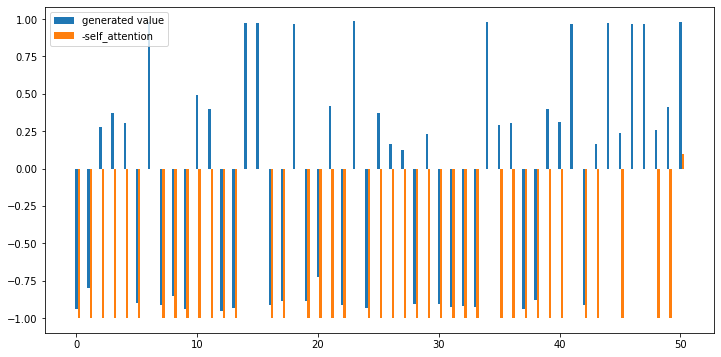

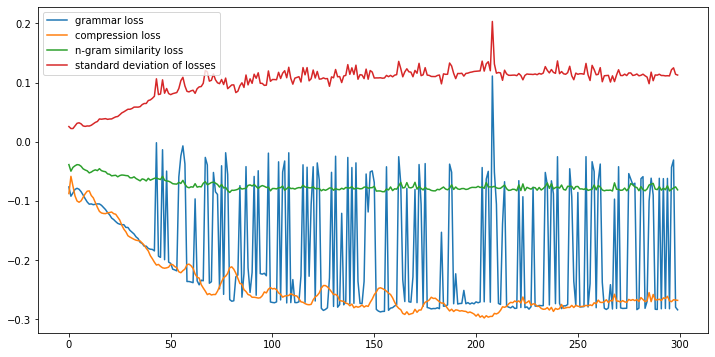

g 2.6983 	s -0.1086 	c 0.4569, score 1.2980, [착용자의 범죄 건수는 달했고 전국 207개소에 영상을 연계 대한 강화하기로 것이고 배성호 도시경제과장은 “스마트 안전망을 우선 구축할 계획”이라며 주요 범죄대상이 되는 여성에 대한 보호 수준이 한층 강화될 것”이라고 기대했다.]
g -0.5614 	s 0.1270 	c 0.6164, score 0.9170, [건수는 달했고 영상을 연계 대한 강화하기로 것이고 “스마트 안전망을 우선 구축할 계획”이라며 주요 범죄대상이 되는 대한 수준이 한층 강화될 것”이라고 기대했다.]
g 1.9582 	s -0.0621 	c 0.5603, score 1.2040, [착용자의 건수는 달했고 전국 영상을 연계 대한 강화하기로 것이고 도시경제과장은 우선 구축할 계획”이라며 주요 범죄대상이 되는 여성에 대한 보호 수준이 한층 강화될 것”이라고 기대했다.]
g -5.4203 	s 0.2369 	c 0.7198, score 0.1137, [건수는 달했고 영상을 연계 대한 강화하기로 것이고 배성호 안전망을 우선 되는 여성에 대한 보호 수준이 한층 기대했다.]
g -4.6310 	s 0.0435 	c 0.6638, score 0.1079, [착용자의 범죄 건수는 달했고 207개소에 영상을 연계 대한 것이고 배성호 안전망을 우선 구축할 되는 대한 보호 수준이 한층 강화될 기대했다.]
g 2.6924 	s -0.0680 	c 0.5043, score 1.3765, [착용자의 범죄 건수는 달했고 전국 207개소에 영상을 연계 대한 강화하기로 것이고 배성호 “스마트 안전망을 우선 구축할 계획”이라며 범죄대상이 되는 여성에 대한 보호 수준이 한층 강화될 것”이라고 기대했다.]
g -2.1409 	s -0.0578 	c 0.5733, score 0.5121, [착용자의 건수는 달했고 전국 207개소에 영상을 연계 대한 강화하기로 것이고 도시경제과장은 안전망을 우선 주요 범죄대상이 되는 대한 보호 수준이 한층 강화될 것”

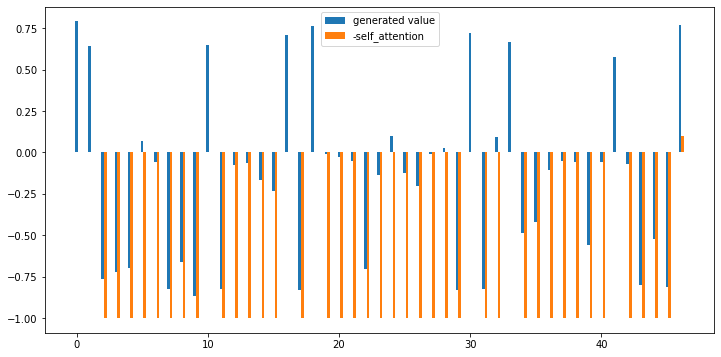

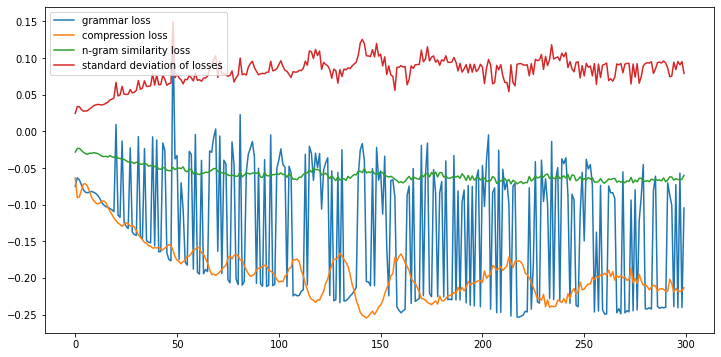

g 5.2356 	s 0.4331 	c 0.3930, score 2.1987, [전문가들은 때 활동시기가 빨라지면서 주의가 벌 쏘임 사고를 예방하기 위해서는 색의 옷을 피해야 한다고 어두운 색에 벌들이 민감하게 반응하기 때문이고 관계자는 발견했을 때 않는 것이 중요하다며 제거할 수 있도록 강조했다.]
g -0.0180 	s 0.4164 	c 0.4328, score 1.3462, [전문가들은 때 활동시기가 빨라지면서 주의가 벌 쏘임 사고를 예방하기 위해서는 색의 피해야 한다고 어두운 색에 벌들이 민감하게 반응하기 때문이고 관계자는 때 않는 것이 중요하다며 제거할 수 있도록 강조했다.]
g -2.7354 	s 0.3861 	c 0.4428, score 0.8730, [전문가들은 때 활동시기가 빨라지면서 주의가 벌 쏘임 사고를 예방하기 위해서는 색의 옷을 한다고 어두운 벌들이 민감하게 반응하기 때문이고 관계자는 발견했을 때 않는 중요하다며 제거할 수 있도록 강조했다.]
g -4.8248 	s 0.3742 	c 0.6517, score 0.4184, [전문가들은 때 주의가 쏘임 예방하기 위해서는 색의 피해야 한다고 관계자는 때 않는 것이 중요하다며 제거할 수 있도록 강조했다.]
g -5.3548 	s 0.3625 	c 0.6965, score 0.2735, [전문가들은 때 활동시기가 주의가 예방하기 위해서는 색의 색에 반응하기 때문이고 관계자는 때 것이 수 강조했다.]
g -2.1000 	s 0.0799 	c 0.4975, score 0.7274, [전문가들은 때 활동시기가 빨라지면서 주의가 벌 예방하기 위해서는 색의 옷을 피해야 한다고 어두운 색에 민감하게 반응하기 관계자는 때 않는 것이 중요하다며 제거할 수 있도록 강조했다.]
g 4.9511 	s 0.4018 	c 0.4179, score 2.1449, [전문가들은 때 활동시기가 빨라지면서 주의가 벌 쏘임 사고를 예방하기 위해서는 색의 옷을 피해야 한다고 어두운 색에 벌들이 민감하게 반응하기 관계자는 발견했을 

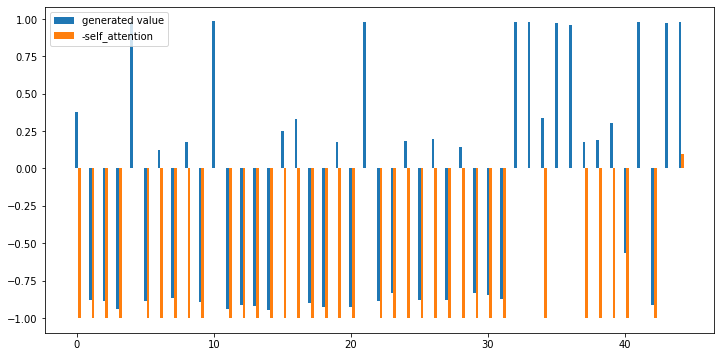

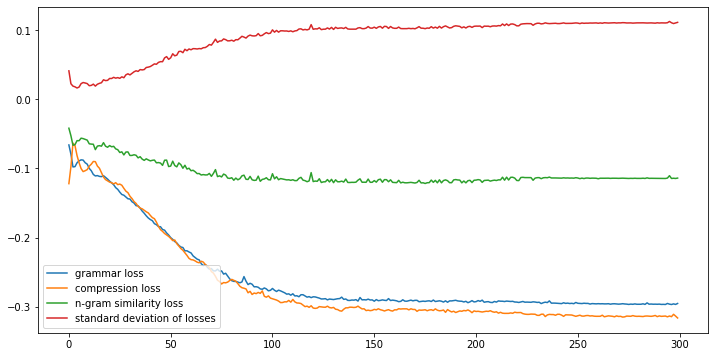

g 5.2394 	s -0.1386 	c 0.6148, score 1.6199, [SEL70350G의 오는 정식 시작한고 프리미엄 초망원 줌렌즈 F4 3 출시한고 최대 환산 지원해 전체 이미지 영역 모두 선명한 화질을 구현하며 탁월한 품질을 보장한다.]
g 5.2551 	s -0.1313 	c 0.6352, score 1.6093, [SEL70350G의 오는 정식 시작한고 프리미엄 초망원 줌렌즈 F4 3 최대 환산 지원해 전체 이미지 영역 모두 선명한 화질을 구현하며 탁월한 품질을 보장한다.]
요약률 0.0000 유사성 0.0000 문법성 0.0000 요약 [.]
'NoneType' object is not iterable
(PowerIterationFailedConvergence(...), 'power iteration failed to converge within 100 iterations')
BESM Summary sentance length: 3
--------------------------------------------------
도내 시장·군수가 공동으로 중앙정부에 제도개선을 요구하기 위한 것이다. 제천시의 제도 개선안은 화상병이 발생했을 때 해당 과수원의 과수 전체를 매몰하는 것을 발생 나무나 일정한 면적 내에 있는 인접 나무만 매몰하는 방식으로 전환하자는 것이다. 현재 과수농가가 직접 처리하는 매몰방식도 지방자치단체가 전담하는 형식으로 바꿀 것과 식물 방역체계 구축을 위한 식물방역관 등 전문인력 확충 등도 요구했다.
--------------------------------------------------
Length ------------------------------------| 52
{0: -1.0, 1: -1.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: 0.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: -1.0, 13: 0.0, 14: -1.0, 15: 

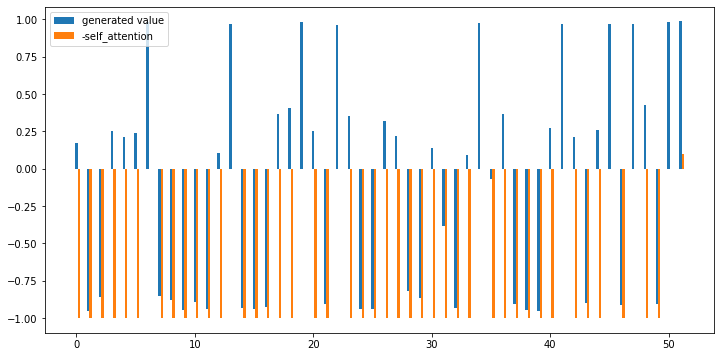

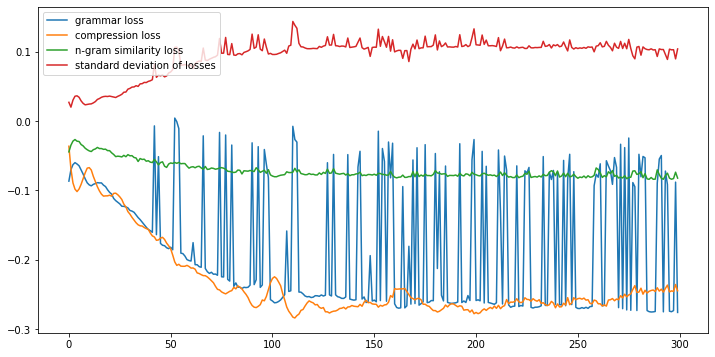

g 5.1303 	s 0.3555 	c 0.5000, score 2.2106, [도내 중앙정부에 제도개선을 요구하기 위한 발생했을 때 전체를 매몰하는 것을 발생 일정한 면적 인접 나무만 전환하자는 과수농가가 직접 매몰방식도 바꿀 것과 식물 구축을 위한 등 전문인력 등도 요구했다.]
g 5.1313 	s 0.4434 	c 0.5045, score 2.2941, [도내 중앙정부에 제도개선을 요구하기 위한 발생했을 때 전체를 매몰하는 것을 발생 일정한 면적 인접 나무만 과수농가가 직접 처리하는 매몰방식도 바꿀 것과 식물 구축을 위한 등 전문인력 등도 요구했다.]
g -0.3026 	s 0.3384 	c 0.5180, score 1.2700, [도내 중앙정부에 제도개선을 위한 발생했을 때 전체를 매몰하는 것을 발생 일정한 면적 인접 나무만 전환하자는 과수농가가 직접 처리하는 매몰방식도 바꿀 것과 식물 위한 등 전문인력 등도 요구했다.]
g 5.2316 	s 0.4008 	c 0.4775, score 2.2502, [도내 중앙정부에 제도개선을 요구하기 위한 발생했을 때 전체를 매몰하는 것을 발생 일정한 면적 인접 나무만 전환하자는 과수농가가 직접 처리하는 매몰방식도 바꿀 것과 식물 구축을 위한 등 전문인력 등도 요구했다.]
g 5.2519 	s 0.3379 	c 0.5180, score 2.1952, [도내 제도개선을 요구하기 위한 발생했을 때 전체를 매몰하는 것을 일정한 면적 인접 나무만 전환하자는 과수농가가 직접 처리하는 매몰방식도 바꿀 것과 식물 구축을 위한 등 전문인력 등도 요구했다.]
g -5.0060 	s 0.0908 	c 0.7838, score -0.0273, [위한 때 것을 일정한 인접 과수농가가 직접 것과 식물 위한 등 전문인력 등도 요구했다.]
g 5.2005 	s 0.3328 	c 0.5856, score 2.1140, [도내 제도개선을 요구하기 위한 발생했을 때 전체를 매몰하는 것을 일정한 면적 인접 과수농가가 직접 매몰방식도 바꿀 것과 식물 구

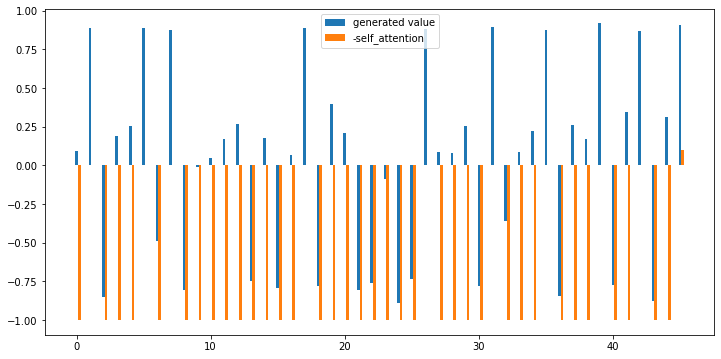

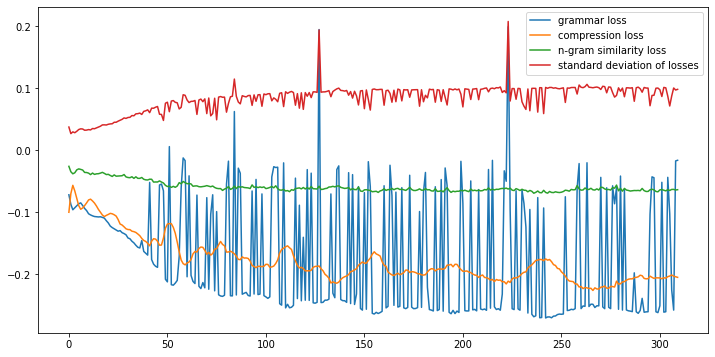

g 5.0247 	s 0.3453 	c 0.3756, score 2.0584, [한편 정부는 배출실태 점검 및 대폭 현행 470여명의 감시인력을 700여명으로 드론 분광학장비 등을 내년 5월까지 시행 중에는 현장 실행력 위한 총괄점검팀을 설치 운영하고 발전반 보호반 등 대책반을 통해 점검하기로 했다.]
g -5.3398 	s 0.2593 	c 0.5431, score 0.3262, [정부는 배출실태 및 대폭 현행 470여명의 감시인력을 드론 분광학장비 등을 내년 5월까지 시행 중에는 실행력 위한 설치 운영하고 발전반 등 통해 점검하기로 했다.]
g 4.5085 	s 0.3412 	c 0.3503, score 1.9429, [한편 정부는 배출실태 점검 및 대폭 현행 470여명의 감시인력을 700여명으로 드론 분광학장비 등을 내년 5월까지 방침이고 시행 중에는 현장 실행력 위한 총괄점검팀을 설치 운영하고 발전반 보호반 등 대책반을 통해 점검하기로 했다.]
g 4.8905 	s 0.3507 	c 0.3959, score 2.0617, [한편 정부는 배출실태 점검 및 대폭 현행 470여명의 감시인력을 700여명으로 드론 분광학장비 등을 내년 5월까지 시행 중에는 현장 실행력 위한 총괄점검팀을 설치 운영하고 보호반 등 대책반을 통해 점검하기로 했다.]
g 5.0709 	s 0.3429 	c 0.3909, score 2.0789, [한편 정부는 배출실태 점검 및 대폭 470여명의 감시인력을 700여명으로 드론 분광학장비 등을 내년 5월까지 시행 중에는 현장 실행력 위한 총괄점검팀을 설치 운영하고 발전반 보호반 등 대책반을 통해 점검하기로 했다.]
g 0.5468 	s 0.3019 	c 0.4670, score 1.3600, [한편 정부는 배출실태 점검 및 대폭 470여명의 감시인력을 드론 분광학장비 등을 내년 5월까지 시행 중에는 현장 실행력 위한 총괄점검팀을 운영하고 발전반 등 대책반을 통해 점검하기로 했다.]
g 4.7717 	s 0.3489 	c 0.4061, sc

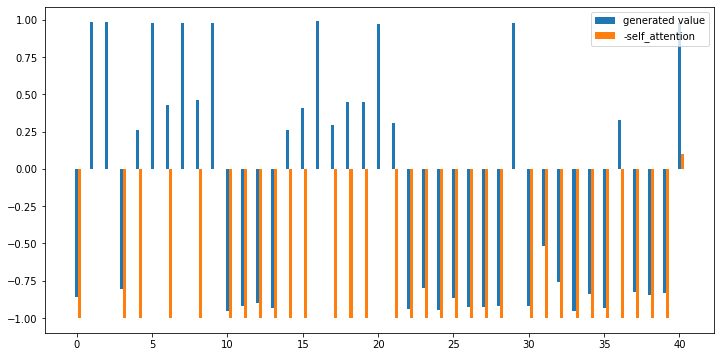

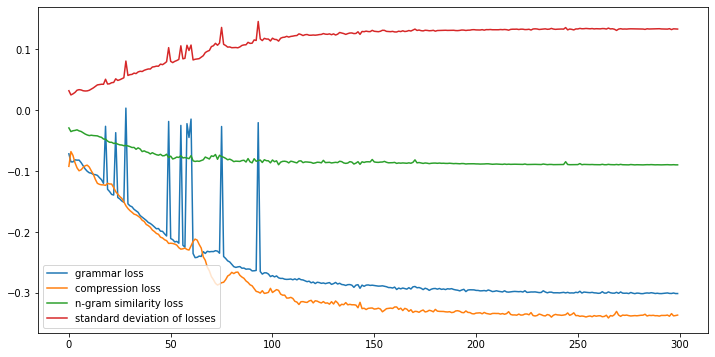

g 4.8712 	s 0.3571 	c 0.6011, score 2.0679, [또한 동대문 중심에 자리 잡아 그 수혜를 톡톡히 투자 가치 또한 높을 것이라고 밝혔고 동대문 베네스트 예정이고 종로구 위치한다.]
g -3.3752 	s 0.2811 	c 0.6292, score 0.5894, [또한 동대문 중심에 자리 잡아 그 수혜를 톡톡히 투자 가치 또한 높을 밝혔고 동대문 베네스트 예정이고 종로구 위치한다.]
요약률 0.0000 유사성 0.0000 문법성 0.0000 요약 [.]
'NoneType' object is not iterable
Too much sentence length...
Too much sentence length...
Too much sentence length...
BESM Summary sentance length: 3
--------------------------------------------------
또한 판사를 인신공격하는 것은 잘못된 것이다. 그러나 판결을 비판 할 수는 있다며 판결에 불복해 항소할 수 있듯이 판결을 비판하는 것이 삼권분립을 위반하는 것은 결코 아니다라고 강조했다. 박 의원은 마지막에 아래 사설을 쓴 논설위원은 김경수지사 판결문을 정말 읽어봤을까라고 덧붙였다.
--------------------------------------------------
Length ------------------------------------| 37
{0: -1.0, 1: -1.0, 2: -1.0, 3: 0.0, 4: -1.0, 5: -1.0, 6: -1.0, 7: -1.0, 8: 0.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: -1.0, 13: -1.0, 14: 0.0, 15: -1.0, 16: -1.0, 17: -1.0, 18: -1.0, 19: -1.0, 20: -1.0, 21: 0.0, 22: 0.0, 23: -1.0, 24: -1.0, 25: -1.0, 26: -1.0, 27: 0.0, 28: 

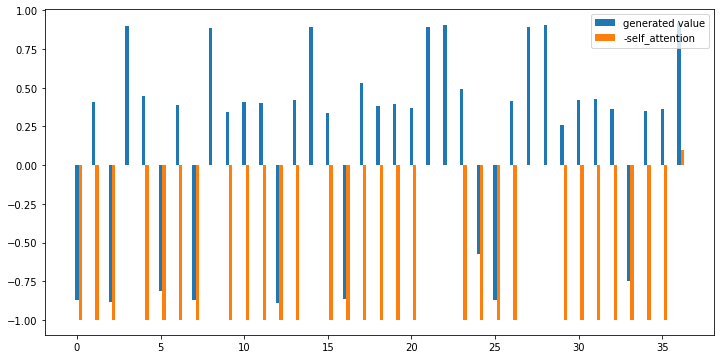

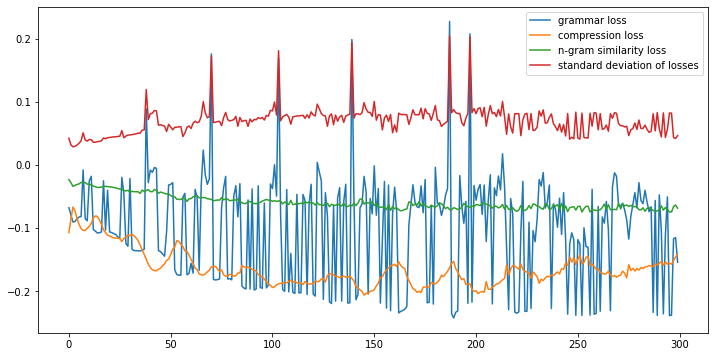

g 4.4105 	s 0.5273 	c 0.2911, score 2.0536, [판사를 것은 잘못된 판결을 할 수는 있다며 판결에 항소할 수 있듯이 비판하는 것이 삼권분립을 위반하는 것은 결코 아니다라고 의원은 마지막에 아래 사설을 쓴 논설위원은 김경수지사 읽어봤을까라고 덧붙였다.]
g 5.2299 	s 0.5588 	c 0.3101, score 2.2406, [판사를 것은 잘못된 판결을 할 수는 있다며 판결에 항소할 수 있듯이 비판하는 것이 삼권분립을 위반하는 것은 결코 아니다라고 의원은 마지막에 아래 사설을 쓴 논설위원은 정말 읽어봤을까라고 덧붙였다.]
g -5.4404 	s 0.5747 	c 0.8354, score 0.3325, [것은 할 수 것은 결코 마지막에 아래 덧붙였다.]
g 5.0571 	s 0.5384 	c 0.2722, score 2.1534, [판사를 것은 잘못된 판결을 할 수는 있다며 판결에 항소할 수 있듯이 비판하는 것이 삼권분립을 위반하는 것은 결코 아니다라고 의원은 마지막에 아래 사설을 쓴 논설위원은 김경수지사 정말 읽어봤을까라고 덧붙였다.]
g 2.4257 	s 0.5232 	c 0.3038, score 1.7313, [판사를 것은 잘못된 판결을 할 수는 있다며 판결에 항소할 수 있듯이 것이 삼권분립을 위반하는 것은 결코 아니다라고 의원은 마지막에 아래 사설을 쓴 논설위원은 김경수지사 정말 읽어봤을까라고 덧붙였다.]
g -3.7964 	s 0.5467 	c 0.3354, score 0.7494, [판사를 것은 잘못된 판결을 할 수는 있다며 판결에 항소할 수 비판하는 것이 삼권분립을 위반하는 것은 결코 아니다라고 의원은 마지막에 아래 사설을 쓴 논설위원은 정말 읽어봤을까라고 덧붙였다.]
g 4.6335 	s 0.5258 	c 0.2911, score 2.0892, [판사를 것은 잘못된 판결을 할 수는 있다며 판결에 항소할 수 있듯이 비판하는 삼권분립을 위반하는 것은 결코 아니다라고 의원은 마지막에 아래 사설을 쓴 논설위원은 김경수지

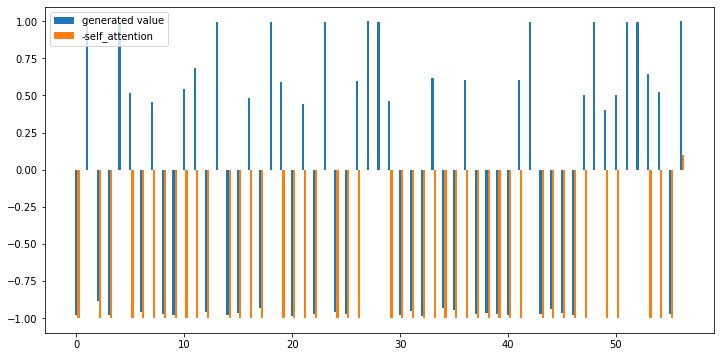

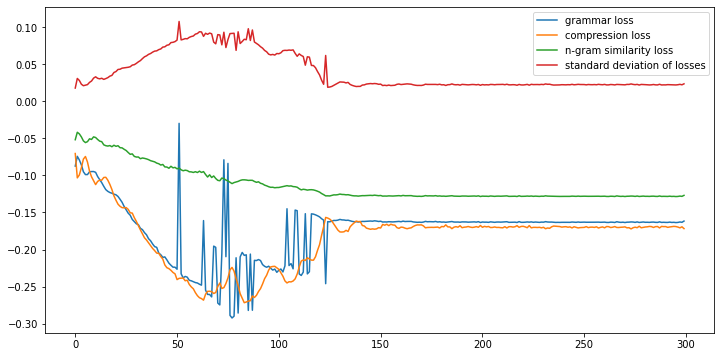

g 0.5222 	s 0.3411 	c 0.5296, score 1.3985, [쿠폰을 대여 신청자는 예약사이트(visit 쿠폰정보를 입력하고 또는 정장을 수 있고 경제기업과장은 사업이 어려움을 겪고 있는 청년들이 도움이 앞으로도 안정을 위해 정장무료 대여 사업 관련 자세한 사항은 충주시 경제기업과로 된다.]
요약률 0.5296 유사성 0.3411 문법성 0.5222 요약 [쿠폰을 대여 신청자는 예약사이트(visit 쿠폰정보를 입력하고 또는 정장을 수 있고 경제기업과장은 사업이 어려움을 겪고 있는 청년들이 도움이 앞으로도 안정을 위해 정장무료 대여 사업 관련 자세한 사항은 충주시 경제기업과로 된다.]
재시도 max score:1.398493029894652 grammar:0.5221659541130066 text:쿠폰을 대여 신청자는 예약사이트(visit 쿠폰정보를 입력하고 또는 정장을 수 있고 경제기업과장은 사업이 어려움을 겪고 있는 청년들이 도움이 앞으로도 안정을 위해 정장무료 대여 사업 관련 자세한 사항은 충주시 경제기업과로 된다.
--------------------------------------------------
무료 쿠폰을 발급받은 면접정장 대여 신청자는 정장대여 예약사이트(visit theopencloset net/coupon)에 쿠폰정보를 입력하고 방문 또는 택배수령의 방법으로 정장을 대여할 수 있다. 이상록 경제기업과장은 이번 사업이 취업난으로 경제적 어려움을 겪고 있는 청년들이 취업의 꿈을 실현하는데에 도움이 되길 바란다며 앞으로도 청년들의 사회적 참여와 경제적 안정을 위해 최선을 다하겠다고 밝혔다. 한편 정장무료 대여 사업 관련 자세한 사항은 충주시 경제기업과로 문의하면 된다.
--------------------------------------------------
Length ------------------------------------| 57
{0: -1.0, 1: 0.0, 2: -1.0, 3: -1.0, 4: 0.0, 5: 

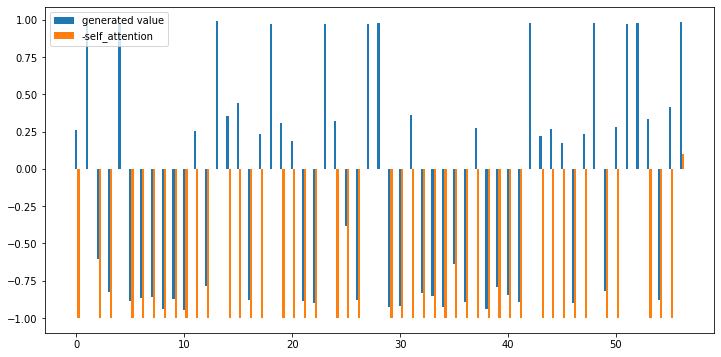

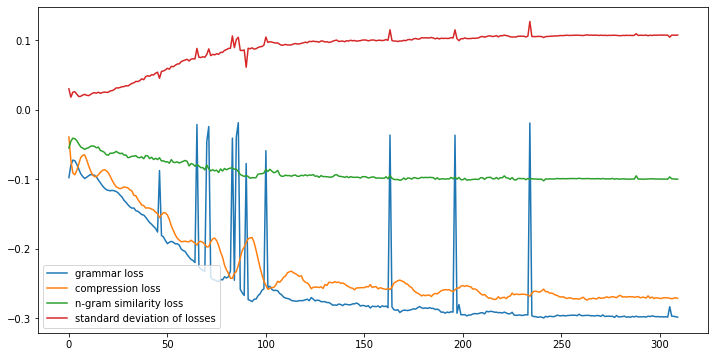

g 5.0402 	s 0.0081 	c 0.5778, score 1.7703, [무료 쿠폰을 대여 입력하고 또는 택배수령의 방법으로 대여할 수 있고 이상록 사업이 취업난으로 겪고 있는 꿈을 청년들의 위해 최선을 다하겠다고 밝혔고 정장무료 대여 관련 자세한 사항은 충주시 문의하면 된다.]
g 5.2504 	s 0.1563 	c 0.5963, score 1.9351, [무료 쿠폰을 대여 입력하고 또는 택배수령의 방법으로 대여할 수 있고 이상록 사업이 취업난으로 겪고 있는 꿈을 위해 최선을 다하겠다고 밝혔고 정장무료 대여 관련 자세한 사항은 충주시 문의하면 된다.]
g 5.2125 	s 0.1048 	c 0.5926, score 1.8809, [무료 쿠폰을 대여 입력하고 또는 택배수령의 방법으로 대여할 수 있고 사업이 취업난으로 겪고 있는 꿈을 청년들의 위해 최선을 다하겠다고 밝혔고 정장무료 대여 관련 자세한 사항은 충주시 문의하면 된다.]
g 4.8211 	s 0.1458 	c 0.6000, score 1.8493, [무료 쿠폰을 대여 입력하고 또는 택배수령의 방법으로 대여할 수 있고 이상록 사업이 취업난으로 겪고 있는 꿈을 청년들의 위해 최선을 밝혔고 정장무료 대여 관련 자세한 사항은 충주시 문의하면 된다.]
g -2.7350 	s 0.1050 	c 0.6074, score 0.5417, [무료 쿠폰을 대여 입력하고 또는 택배수령의 대여할 수 이상록 사업이 취업난으로 겪고 있는 꿈을 청년들의 위해 최선을 다하겠다고 밝혔고 정장무료 대여 관련 자세한 사항은 충주시 문의하면 된다.]
g 3.8013 	s 0.0915 	c 0.6000, score 1.6250, [무료 쿠폰을 대여 입력하고 또는 방법으로 대여할 수 있고 이상록 사업이 취업난으로 겪고 있는 꿈을 청년들의 위해 최선을 다하겠다고 밝혔고 정장무료 대여 관련 자세한 사항은 충주시 문의하면 된다.]
g 4.9787 	s -0.0341 	c 0.5926, score 1.7031, [무료 쿠폰을 대여 입력하고 또

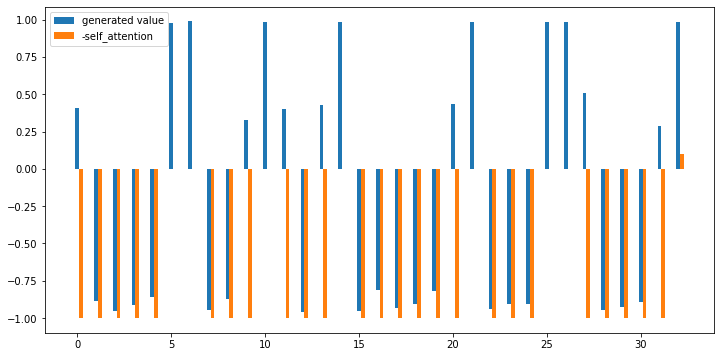

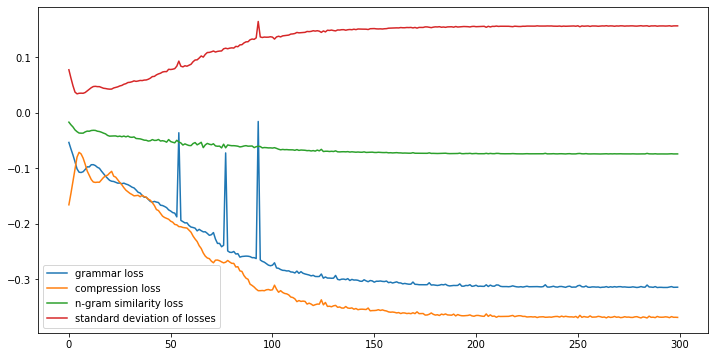

g 4.4929 	s 0.3625 	c 0.5878, score 2.0235, [법무행정 개선을 추진하는 양성평등 등 관련 경력을 가진 직위에 대한 해당 부처 홈페이지 수 있다.]
요약률 0.5878 유사성 0.3625 문법성 4.4929 요약 [법무행정 개선을 추진하는 양성평등 등 관련 경력을 가진 직위에 대한 해당 부처 홈페이지 수 있다.]
--------------------------------------------------
법무행정 개선을 추진하는 양성평등 등 관련 경력을 가진 직위에 대한 해당 부처 홈페이지 수 있다. 2.023536401698911 4.492920875549316
================================================== Original Document 72==================================================
정부가 우정사업본부장·글로벌전자정부과장 등 13개 직위를 공개모집한다.
인사혁신처는 8월 1일부터 16일까지 전문성과 역량을 갖춘 인재를 정부 실·국·과장 직위에 임용하는 '8월 중 개방형 직위 공개모집'을 실시한다.
개방형 직위는 공개모집으로 전문성이 요구되거나 효율적 정책 수립이 필요하다고 인정되는 직위에 적합한 인재를 선발할 수 있도록 지정한 직위다.
8월 공모 개방형 고위공무원단 직위 주요 업무.
공모 직위는 총 13개다.
과학기술정보통신부 우정사업본부장, 보건복지부 질병관리본부 감염병연구센터장, 경찰청 감사관 등 실·국장급 고위공무원단 6개 직위를 선발한다.
과장급 직위는 행정안전부 글로벌전자정부과장, 인사혁신처 인재정보담당관, 법무부 양성평등정책담당관 등 6개다.
보건복지부 국립정신건강센터장은 전문임기제 직위로 채용한다.
행안부 국립재난안전연구원 재난정보연구실장은 경력개방형 직위로 민간 출신만 지원할 수 있다.
과학기술정보통신부 우정사업본부장은 우정사업 분야에 대한 총괄·관리 업무를 수행하는 기관장급 고위공무원단 직위다.
우편, 보험, 금융, 물

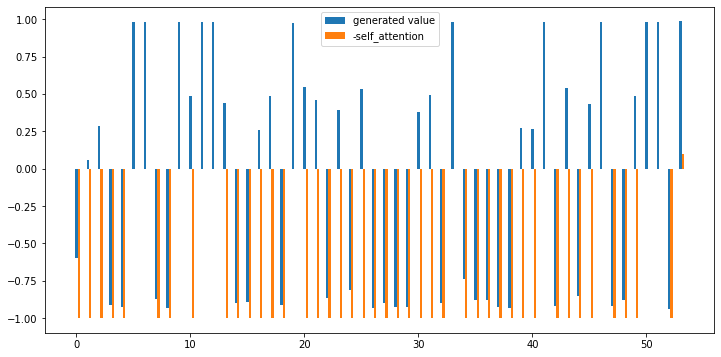

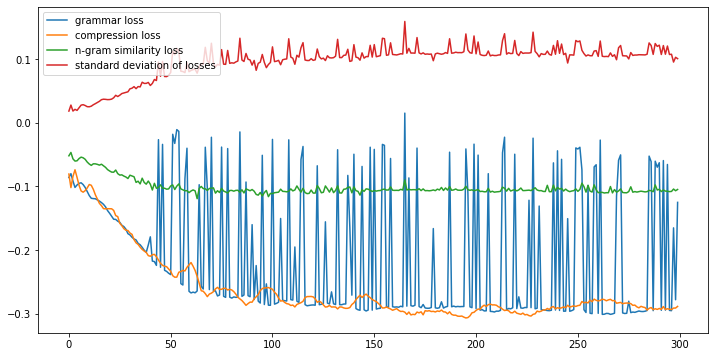

g -3.7735 	s 0.3747 	c 0.6008, score 0.6450, [메르코수르는 전제로 협상을 둘러싼 견해 차로 사실상 자이르 보우소나루 대통령은 1을 EU와 FTA 체결로 엄청난 EU의 FTA 협상 한국과 진행 중인 영향을 줄 것이라는 나온다.]
g 5.1368 	s 0.4355 	c 0.5161, score 2.2755, [메르코수르는 1999년부터 전제로 협상을 둘러싼 견해 차로 사실상 중단했다가 자이르 보우소나루 대통령은 세계 경제의 1을 EU와 FTA 체결로 엄청난 EU의 FTA 협상 한국과 진행 중인 영향을 줄 것이라는 나온다.]
g -0.1880 	s 0.4413 	c 0.5645, score 1.3455, [메르코수르는 전제로 협상을 둘러싼 견해 차로 사실상 중단했다가 자이르 보우소나루 대통령은 세계 경제의 1을 EU와 FTA 체결로 엄청난 EU의 FTA 협상 한국과 진행 중인 줄 것이라는 나온다.]
g 5.1016 	s 0.4235 	c 0.5645, score 2.2092, [메르코수르는 전제로 협상을 둘러싼 견해 차로 사실상 중단했다가 자이르 보우소나루 대통령은 세계 경제의 1을 EU와 FTA 체결로 엄청난 FTA 협상 한국과 진행 중인 영향을 줄 것이라는 나온다.]
g 5.2481 	s 0.4463 	c 0.5323, score 2.2887, [메르코수르는 1999년부터 전제로 협상을 둘러싼 견해 차로 사실상 중단했다가 자이르 보우소나루 대통령은 세계 경제의 1을 EU와 FTA 체결로 엄청난 EU의 FTA 협상 진행 중인 영향을 줄 것이라는 나온다.]
g -3.9825 	s 0.4068 	c 0.5927, score 0.6503, [메르코수르는 전제로 협상을 둘러싼 차로 사실상 중단했다가 자이르 보우소나루 대통령은 세계 1을 EU와 FTA 체결로 엄청난 EU의 협상 한국과 진행 중인 영향을 줄 것이라는 나온다.]
g -1.6907 	s 0.3983 	c 0.5685, score 1.0480, [메르코수르는 1999년부터 전제

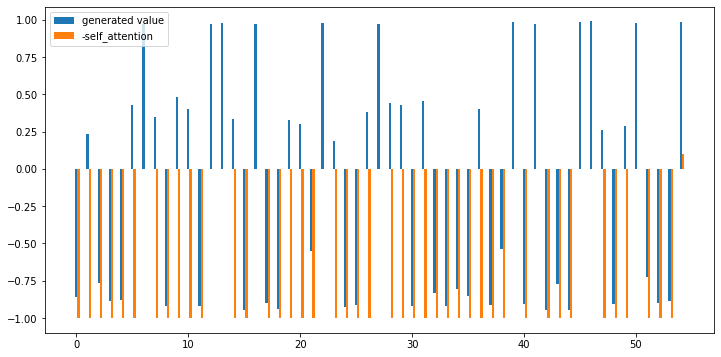

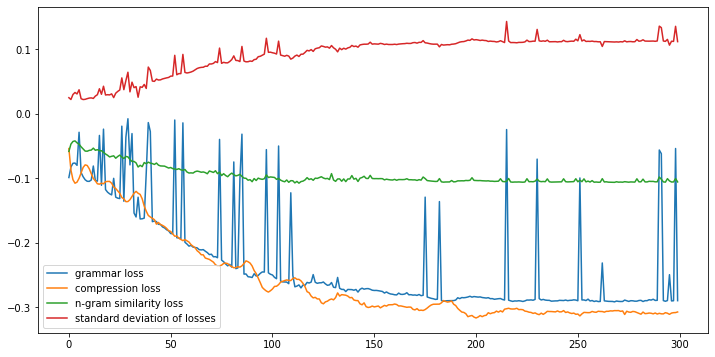

g 2.6767 	s 0.1569 	c 0.5321, score 1.5709, [모두의마블(통합) 한 팀을 클래시로얄 장애학생과 특수교사가 팀을 이뤄 출전해 호흡을 발휘했고 이번 처음 출전한 황석희 학생은 프리젠테이션 종목에서 차지해 출전한 과정 학생은 거뒀고 또한 다정초등학교 이승현 학생은 수상했다.]
g 2.6885 	s 0.1756 	c 0.5698, score 1.5539, [한 팀을 클래시로얄 장애학생과 특수교사가 팀을 이뤄 출전해 호흡을 발휘했고 이번 처음 출전한 황석희 학생은 프리젠테이션 종목에서 차지해 출전한 과정 학생은 거뒀고 또한 다정초등학교 이승현 학생은 수상했다.]
g -1.2099 	s 0.1743 	c 0.5736, score 0.8991, [모두의마블(통합) 한 팀을 클래시로얄 장애학생과 특수교사가 팀을 이뤄 호흡을 발휘했고 이번 처음 출전한 황석희 학생은 종목에서 차지해 출전한 과정 학생은 거뒀고 또한 다정초등학교 이승현 학생은 수상했다.]
g 2.6431 	s 0.1689 	c 0.5472, score 1.5622, [모두의마블(통합) 한 팀을 클래시로얄 장애학생과 특수교사가 팀을 이뤄 출전해 호흡을 발휘했고 이번 처음 출전한 황석희 학생은 프리젠테이션 종목에서 차지해 과정 학생은 거뒀고 또한 다정초등학교 이승현 학생은 수상했다.]
g -1.3016 	s 0.1654 	c 0.5925, score 0.8560, [모두의마블(통합) 한 팀을 클래시로얄 장애학생과 특수교사가 팀을 이뤄 호흡을 발휘했고 이번 처음 출전한 황석희 학생은 차지해 출전한 과정 학생은 거뒀고 또한 다정초등학교 이승현 학생은 수상했다.]
g 0.5870 	s 0.1468 	c 0.5849, score 1.1597, [한 팀을 클래시로얄 장애학생과 특수교사가 팀을 이뤄 호흡을 발휘했고 이번 처음 출전한 황석희 학생은 프리젠테이션 종목에서 차지해 출전한 과정 학생은 거뒀고 또한 다정초등학교 이승현 학생은 수상했다.]
g -3.9944 	s 0.1614 	c 0.56

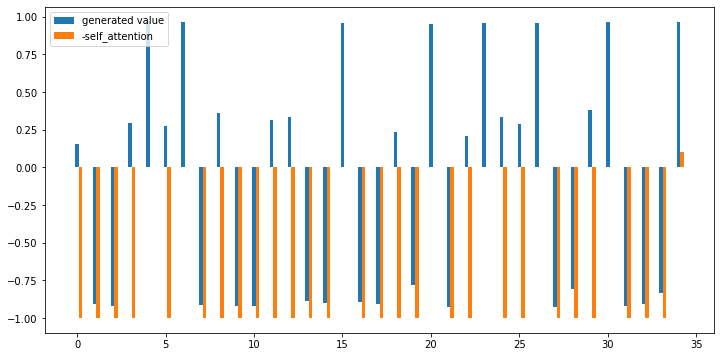

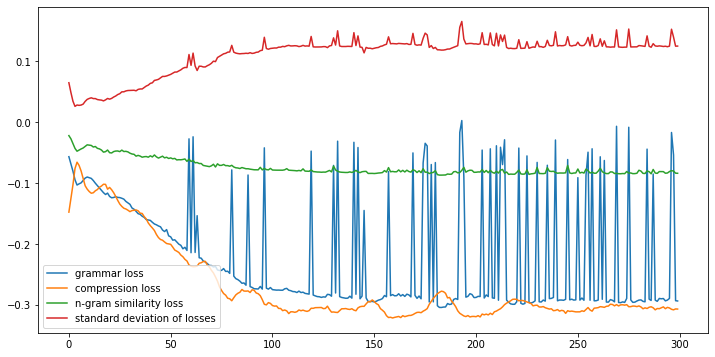

g 4.0996 	s 0.1915 	c 0.4970, score 1.8718, [에어부산은 취항 기념으로 특가 항공권 실시한고 에어부산 홈페이지(airbusan 통해 편도 기준 구매할 수 있고 이벤트 기간은 탑승 기간은 31일까지다.]
g 2.0735 	s 0.2091 	c 0.5148, score 1.5398, [에어부산은 취항 기념으로 항공권 실시한고 에어부산 홈페이지(airbusan 통해 편도 기준 구매할 수 있고 이벤트 기간은 탑승 기간은 31일까지다.]
g -5.2891 	s 0.2096 	c 0.5325, score 0.2956, [에어부산은 기념으로 특가 항공권 실시한고 에어부산 홈페이지(airbusan 통해 편도 기준 구매할 수 이벤트 기간은 탑승 기간은 31일까지다.]
g -2.7908 	s 0.4107 	c 0.5976, score 0.8480, [기념으로 항공권 에어부산 홈페이지(airbusan 통해 편도 기준 구매할 수 있고 이벤트 기간은 탑승 기간은 31일까지다.]
g -1.1958 	s 0.3048 	c 0.5148, score 1.0907, [에어부산은 기념으로 특가 항공권 실시한고 에어부산 홈페이지(airbusan 통해 편도 기준 구매할 수 있고 이벤트 기간은 탑승 기간은 31일까지다.]
g -1.8023 	s 0.2484 	c 0.5325, score 0.9155, [에어부산은 기념으로 항공권 실시한고 에어부산 홈페이지(airbusan 통해 편도 기준 구매할 수 있고 이벤트 기간은 탑승 기간은 31일까지다.]
g 2.5297 	s 0.3800 	c 0.5266, score 1.7750, [에어부산은 취항 기념으로 특가 항공권 에어부산 홈페이지(airbusan 통해 편도 기준 구매할 수 있고 이벤트 기간은 탑승 기간은 31일까지다.]
g -1.8588 	s 0.1325 	c 0.5207, score 0.8020, [에어부산은 취항 기념으로 특가 항공권 실시한고 에어부산 홈페이지(airbusan 통해 편도 기준 수 있고 이벤트 기간은

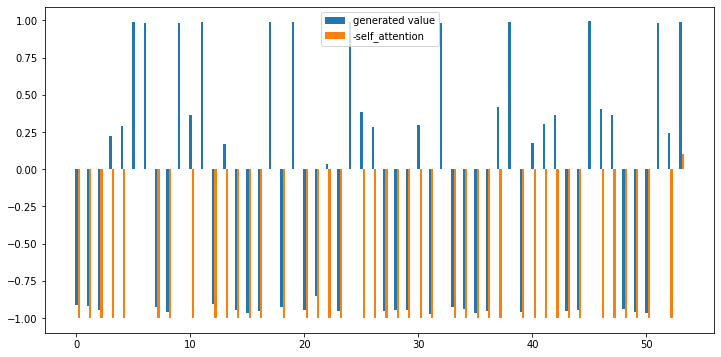

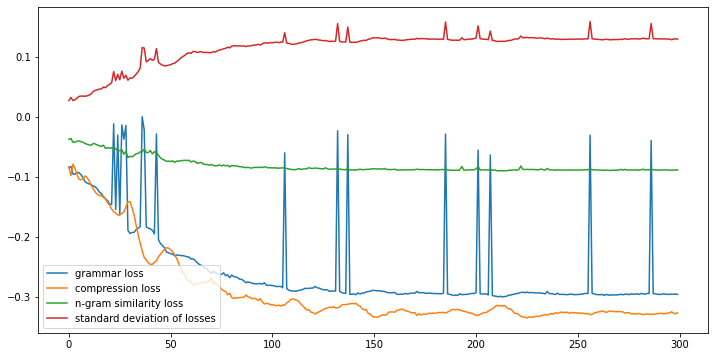

g 4.9059 	s 0.3165 	c 0.5281, score 2.1060, [내고 사회적 논란을 이유로 결정을 내린 것을 생각한다며 재판 판결을 무죄로 하는 원칙을 반한 조 측은 대한항공에 대해 경영권을 행사하겠다는 의사를 따라 대한항공이 경영권 것이라는 관측도 제기된다.]
g 4.8804 	s 0.3209 	c 0.5368, score 2.0975, [내고 사회적 논란을 이유로 결정을 내린 것을 생각한다며 재판 판결을 무죄로 하는 원칙을 반한 측은 대한항공에 대해 경영권을 행사하겠다는 의사를 따라 대한항공이 경영권 것이라는 관측도 제기된다.]
g 3.4644 	s 0.3048 	c 0.5455, score 1.8367, [내고 사회적 논란을 이유로 결정을 내린 것을 생각한다며 재판 판결을 무죄로 하는 반한 조 측은 대한항공에 대해 경영권을 행사하겠다는 의사를 따라 대한항공이 경영권 것이라는 관측도 제기된다.]
g 1.9785 	s 0.2775 	c 0.5584, score 1.5488, [내고 사회적 논란을 이유로 결정을 내린 것을 생각한다며 재판 판결을 무죄로 하는 원칙을 반한 조 측은 대한항공에 대해 경영권을 의사를 따라 대한항공이 경영권 것이라는 관측도 제기된다.]
g -0.6897 	s 0.3129 	c 0.5455, score 1.1525, [내고 논란을 이유로 결정을 내린 것을 생각한다며 재판 판결을 무죄로 하는 원칙을 반한 조 측은 대한항공에 대해 경영권을 행사하겠다는 의사를 따라 대한항공이 경영권 것이라는 관측도 제기된다.]
g -1.1435 	s 0.2090 	c 0.5541, score 0.9643, [내고 사회적 논란을 이유로 결정을 내린 것을 생각한다며 재판 판결을 무죄로 하는 원칙을 반한 조 측은 대해 경영권을 행사하겠다는 의사를 따라 대한항공이 경영권 것이라는 관측도 제기된다.]
g 4.5705 	s 0.2311 	c 0.5628, score 1.9301, [내고 사회적 논란을 이유로 결정을 내린 것을 재판 판결을 무죄로 하는 원

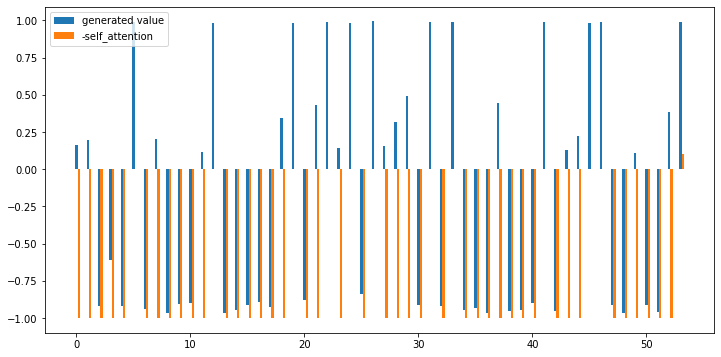

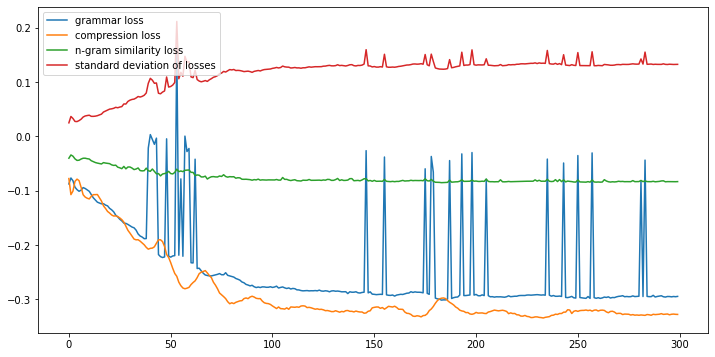

g 4.2866 	s 0.4173 	c 0.5388, score 2.0929, [또 유지와 통한 대여·반납 등이 혼란을 일으킨 공유 자전거업체와 달리 기업이 운영해 신뢰성도 확보했다고 설명했고 관계자는 시행하는 아니라 이용 활성화를 위한 새로운 청정도시 가겠다”고 말했다.]
g 4.9056 	s 0.4339 	c 0.5086, score 2.2429, [또 유지와 통한 자전거 대여·반납 등이 혼란을 일으킨 외국 공유 자전거업체와 달리 기업이 운영해 신뢰성도 확보했다고 설명했고 관계자는 시행하는 아니라 이용 활성화를 위한 새로운 청정도시 가겠다”고 말했다.]
g 4.9051 	s 0.4123 	c 0.5259, score 2.2040, [또 유지와 통한 자전거 대여·반납 등이 혼란을 일으킨 외국 공유 자전거업체와 달리 기업이 신뢰성도 확보했다고 설명했고 관계자는 시행하는 아니라 이용 활성화를 위한 새로운 청정도시 가겠다”고 말했다.]
g 2.6445 	s 0.3502 	c 0.5172, score 1.7738, [유지와 통한 자전거 대여·반납 등이 혼란을 일으킨 외국 공유 자전거업체와 달리 기업이 운영해 신뢰성도 확보했다고 설명했고 관계자는 시행하는 아니라 이용 활성화를 위한 새로운 청정도시 가겠다”고 말했다.]
g 4.6390 	s 0.3647 	c 0.5259, score 2.1120, [또 유지와 통한 대여·반납 등이 혼란을 일으킨 외국 공유 자전거업체와 달리 기업이 운영해 신뢰성도 확보했다고 설명했고 관계자는 시행하는 아니라 이용 활성화를 위한 새로운 청정도시 가겠다”고 말했다.]
g -1.0668 	s 0.3943 	c 0.5388, score 1.1777, [또 유지와 통한 자전거 대여·반납 등이 혼란을 일으킨 외국 공유 달리 기업이 운영해 신뢰성도 확보했다고 설명했고 관계자는 시행하는 아니라 이용 활성화를 위한 새로운 청정도시 가겠다”고 말했다.]
g 3.6912 	s 0.4140 	c 0.5345, score 1.9948, [또 유지와 통한 자전거

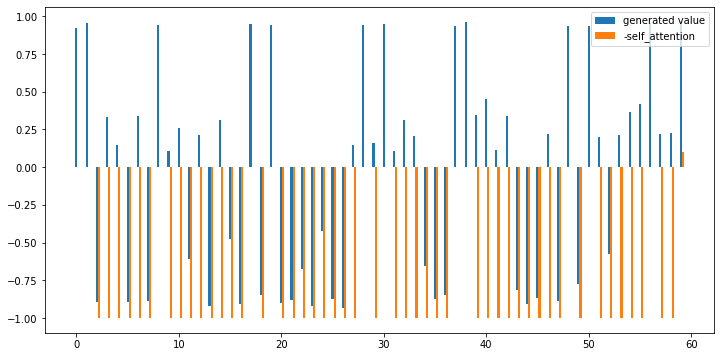

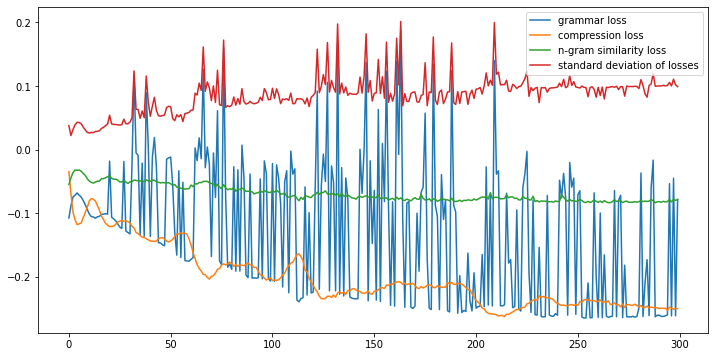

g -3.1163 	s 0.2679 	c 0.5019, score 0.7466, [게다가 대형 컨소시엄을 꾸린 플레이어들도 관심을 보이지 않고 상황이고 신한금융그룹이 수 것이란 떨어져 있어 낮은 한 수익을 내지 못하고 있는데다가 대표적인 당국이 추가적으로 등 유인책을 다양한 업체가 참여할 수 것이라고 설명했다.]
g 0.6151 	s 0.3134 	c 0.4436, score 1.3595, [게다가 대형 컨소시엄을 꾸린 플레이어들도 관심을 보이지 않고 상황이고 신한금융그룹이 수 것이란 떨어져 있어 낮은 상황이고 한 금융권 수익을 내지 못하고 있는데다가 대표적인 규제 당국이 추가적으로 등 유인책을 다양한 업체가 참여할 수 있을 것이라고 설명했다.]
g 4.5464 	s 0.3178 	c 0.4436, score 2.0191, [게다가 대형 컨소시엄을 꾸린 플레이어들도 관심을 보이지 않고 상황이고 신한금융그룹이 수 것이란 떨어져 있어 가능성이 낮은 한 금융권 수익을 내지 못하고 있는데다가 대표적인 규제 당국이 추가적으로 등 유인책을 다양한 업체가 참여할 수 있을 것이라고 설명했다.]
g 4.6925 	s 0.3045 	c 0.4708, score 2.0574, [게다가 대형 컨소시엄을 꾸린 플레이어들도 관심을 보이지 않고 상황이고 신한금융그룹이 수 것이란 떨어져 있어 낮은 금융권 수익을 내지 못하고 있는데다가 대표적인 규제 당국이 추가적으로 등 유인책을 다양한 업체가 참여할 수 있을 것이라고 설명했다.]
g 4.6303 	s 0.3179 	c 0.4436, score 2.0332, [게다가 대형 컨소시엄을 꾸린 플레이어들도 관심을 보이지 않고 신한금융그룹이 수 것이란 떨어져 있어 가능성이 낮은 상황이고 한 금융권 수익을 내지 못하고 있는데다가 대표적인 규제 당국이 추가적으로 등 유인책을 다양한 업체가 참여할 수 있을 것이라고 설명했다.]
g 3.3783 	s 0.3207 	c 0.4397, score 1.8234, [게다가 대형 컨소시엄을 꾸린 플레이어들도 관심을

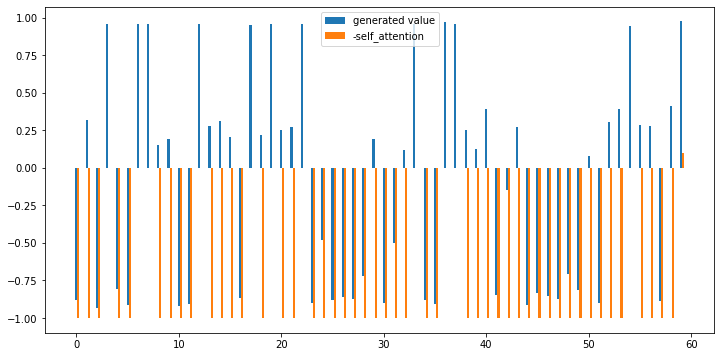

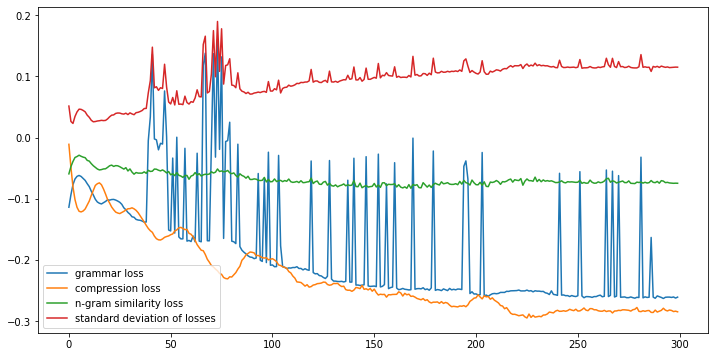

g 4.8651 	s 0.1381 	c 0.5859, score 1.8630, [시설현대화 대한 대해서도 설명했고 윤 시장은 이후 20년이 경과해 시설의 및 공간 부족으로 겪고 한다며 삭감될 경우 상 전액 시비로 사업을 토로했고 조속히 추진될 수 있도록 하겠다고 말했다.]
g 5.2137 	s 0.2473 	c 0.5195, score 2.0967, [시설현대화 대한 대해서도 설명했고 윤 시장은 이후 20년이 경과해 및 주차·저장 공간 부족으로 불편을 겪고 한다며 삭감될 경우 상 전액 시비로 사업을 추진하기에는 토로했고 조속히 추진될 수 있도록 최선을 하겠다고 말했다.]
g 5.1080 	s 0.1612 	c 0.5508, score 1.9618, [시설현대화 대한 대해서도 설명했고 윤 시장은 이후 20년이 경과해 및 주차·저장 공간 부족으로 불편을 겪고 한다며 삭감될 경우 상 전액 사업을 추진하기에는 토로했고 추진될 수 있도록 최선을 하겠다고 말했다.]
g 5.2432 	s 0.2535 	c 0.5039, score 2.1235, [시설현대화 대한 대해서도 설명했고 윤 시장은 이후 20년이 경과해 시설의 및 주차·저장 공간 부족으로 불편을 겪고 한다며 삭감될 경우 상 전액 시비로 사업을 추진하기에는 토로했고 조속히 추진될 수 있도록 최선을 하겠다고 말했다.]
g 5.1968 	s 0.2707 	c 0.5000, score 2.1369, [시설현대화 대한 대해서도 설명했고 윤 시장은 이후 20년이 경과해 및 주차·저장 공간 부족으로 불편을 겪고 한다며 삭감될 경우 상 전액 시비로 사업을 추진하기에는 토로했고 현안사항 조속히 추진될 수 있도록 최선을 하겠다고 말했다.]
g 5.0341 	s 0.1923 	c 0.5508, score 1.9805, [시설현대화 대한 대해서도 설명했고 시장은 이후 20년이 경과해 시설의 및 공간 부족으로 불편을 겪고 한다며 삭감될 경우 상 전액 시비로 사업을 추진하기에는 토로했고 추진될 수 있도록 최선을 하겠다고 말했다.]
g 4.

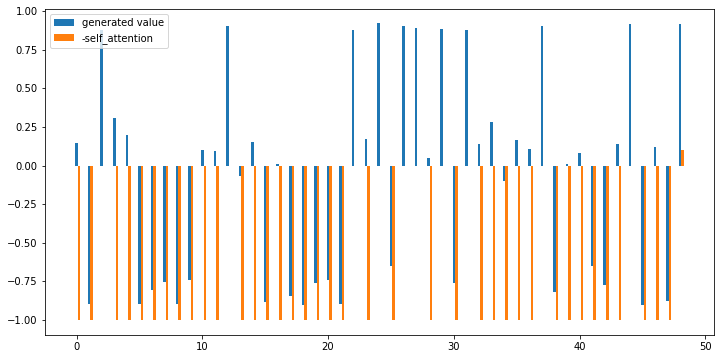

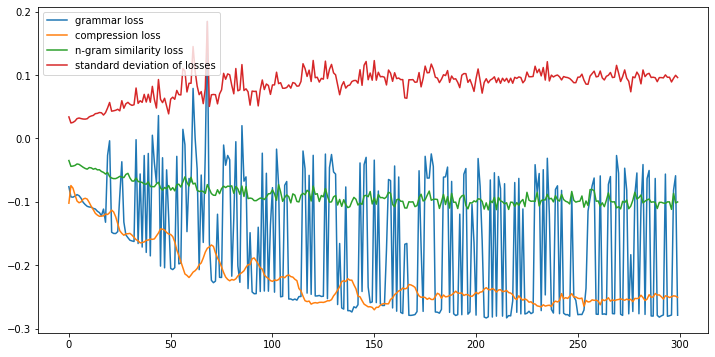

g 4.9771 	s 0.4626 	c 0.5023, score 2.2898, [소상공인·자영업 역시 고소득 자영업자가 다듬어야 한다는 게 요구고 소상공인들도 운영하는 김지원 사장은 자금을 받은 벤처캐피털 투자가 같은 특정 업종에만 치우치고 제조업 등 흘러갈 수 방안이 말했다.]
g 4.4294 	s 0.4788 	c 0.4253, score 2.1424, [소상공인·자영업 역시 고소득 자영업자가 다듬어야 한다는 게 소상공인연합회의 요구고 소상공인들도 운영하는 김지원 사장은 자금을 받은 벤처캐피털 투자가 같은 특정 업종에만 치우치고 있다며 제조업 등 업종의 흘러갈 수 방안이 말했다.]
g 3.8666 	s 0.4542 	c 0.4932, score 2.0919, [소상공인·자영업 역시 고소득 자영업자가 다듬어야 한다는 게 요구고 소상공인들도 운영하는 김지원 사장은 자금을 받은 벤처캐피털 투자가 같은 특정 업종에만 있다며 제조업 등 초기 흘러갈 수 방안이 말했다.]
g 4.7092 	s 0.4490 	c 0.4118, score 2.1456, [소상공인·자영업 역시 고소득 자영업자가 다듬어야 한다는 게 소상공인연합회의 요구고 소상공인들도 운영하는 김지원 사장은 자금을 받은 벤처캐피털 투자가 같은 특정 업종에만 치우치고 있다며 제조업 등 업종의 초기 흘러갈 수 방안이 말했다.]
g -1.0974 	s 0.4850 	c 0.4887, score 1.2908, [소상공인·자영업 역시 고소득 자영업자가 다듬어야 한다는 게 요구고 소상공인들도 운영하는 사장은 자금을 받은 벤처캐피털 투자가 같은 특정 업종에만 치우치고 있다며 등 업종의 초기 흘러갈 수 방안이 말했다.]
g 4.8814 	s 0.4690 	c 0.4932, score 2.2758, [소상공인·자영업 역시 고소득 자영업자가 다듬어야 한다는 게 소상공인연합회의 운영하는 김지원 사장은 자금을 받은 벤처캐피털 투자가 같은 특정 업종에만 치우치고 있다며 제조업 등 흘러갈 수 방안이 말했다.]
g -0.0107 	s 

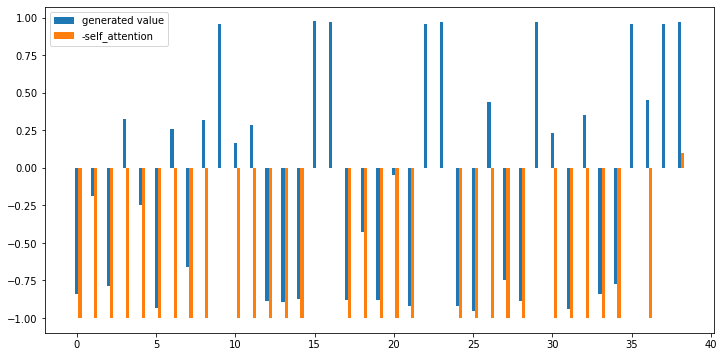

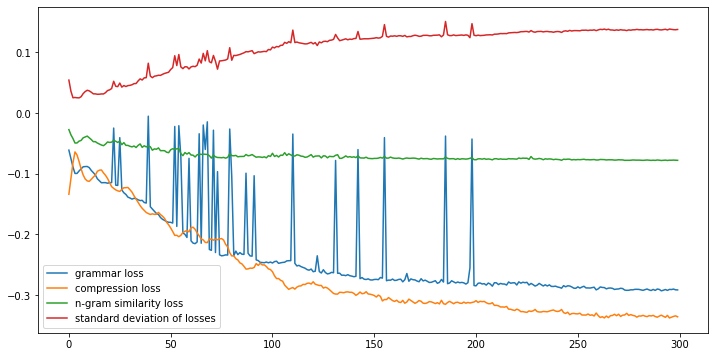

g 5.1837 	s 0.2967 	c 0.4863, score 2.1470, [중형 스포츠유틸리티차량(SUV)인 보증수리 기간을 연장했고 14만㎞가 사장은 지난 앞으로 한국에 이어갈 차원에서 매우 연구개발(R&D) 역할을 담당하고 있음을 언급했다.]
g 4.0132 	s 0.1377 	c 0.5137, score 1.7929, [중형 스포츠유틸리티차량(SUV)인 보증수리 기간을 14만㎞가 사장은 지난 앞으로 한국에 이어갈 차원에서 매우 연구개발(R&D) 역할을 담당하고 있음을 언급했다.]
g 5.1957 	s 0.2809 	c 0.4699, score 2.1168, [중형 스포츠유틸리티차량(SUV)인 보증수리 기간을 연장했고 14만㎞가 사장은 지난 만나 앞으로 한국에 이어갈 차원에서 매우 연구개발(R&D) 역할을 담당하고 있음을 언급했다.]
g 5.1866 	s 0.2672 	c 0.5191, score 2.1125, [중형 스포츠유틸리티차량(SUV)인 보증수리 기간을 연장했고 사장은 지난 앞으로 한국에 이어갈 차원에서 매우 연구개발(R&D) 역할을 담당하고 있음을 언급했다.]
g 5.2415 	s 0.3033 	c 0.5027, score 2.1741, [스포츠유틸리티차량(SUV)인 보증수리 기간을 연장했고 14만㎞가 사장은 지난 앞으로 한국에 이어갈 차원에서 매우 연구개발(R&D) 역할을 담당하고 있음을 언급했다.]
요약률 0.5027 유사성 0.3033 문법성 5.2415 요약 [스포츠유틸리티차량(SUV)인 보증수리 기간을 연장했고 14만㎞가 사장은 지난 앞으로 한국에 이어갈 차원에서 매우 연구개발(R&D) 역할을 담당하고 있음을 언급했다.]
--------------------------------------------------
스포츠유틸리티차량(SUV)인 보증수리 기간을 연장했고 14만㎞가 사장은 지난 앞으로 한국에 이어갈 차원에서 매우 연구개발(R&D) 역할을 담당하고 있음을 언급했다. 2.174143062751801 5.2414765357971

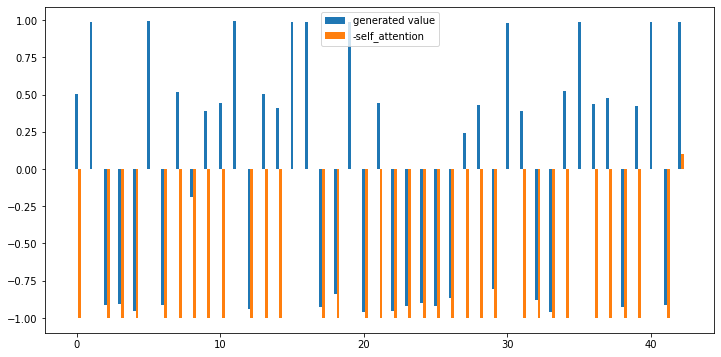

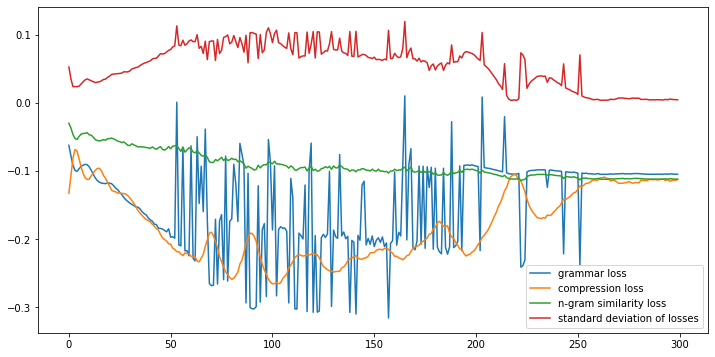

g 0.2988 	s 0.0100 	c 0.4785, score 1.0383, [송새벽은 그동안 화면을 시청자들의 자아냈고 특히 지난 방송에서는 마지막 남은 동료 대한 서정과 단념한듯한 필성의 고스란히 연기로 호평을 샀고 한편 빙의는 밤 11시 방송된다.]
요약률 0.4785 유사성 0.0100 문법성 0.2988 요약 [송새벽은 그동안 화면을 시청자들의 자아냈고 특히 지난 방송에서는 마지막 남은 동료 대한 서정과 단념한듯한 필성의 고스란히 연기로 호평을 샀고 한편 빙의는 밤 11시 방송된다.]
재시도 max score:1.0382595980960516 grammar:0.2987823188304901 text:송새벽은 그동안 화면을 시청자들의 자아냈고 특히 지난 방송에서는 마지막 남은 동료 대한 서정과 단념한듯한 필성의 고스란히 연기로 호평을 샀고 한편 빙의는 밤 11시 방송된다.
--------------------------------------------------
송새벽은 그동안 신들린 연기로 순식간에 화면을 장악해 시청자들의 감탄을 자아냈다. 특히 지난 24일 방송에서는 마지막 남은 동료 형사의 죽음에 대한 분노와 서정과 영미에게 총구를 거누는 장면에서 모든것을 단념한듯한 필성의 감정을 고스란히 연기로 녹여내 시청자들의 호평을 샀다. 한편 빙의는 오늘(25일) 밤 11시 최종화가 방송된다.
--------------------------------------------------
Length ------------------------------------| 43
{0: -1.0, 1: 0.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: 0.0, 6: -1.0, 7: -1.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: 0.0, 12: -1.0, 13: -1.0, 14: -1.0, 15: 0.0, 16: 0.0, 17: -1.0, 18: -1.0, 19: 0.0, 20: -1.0, 21: -1.0, 22: -1.0, 23: -

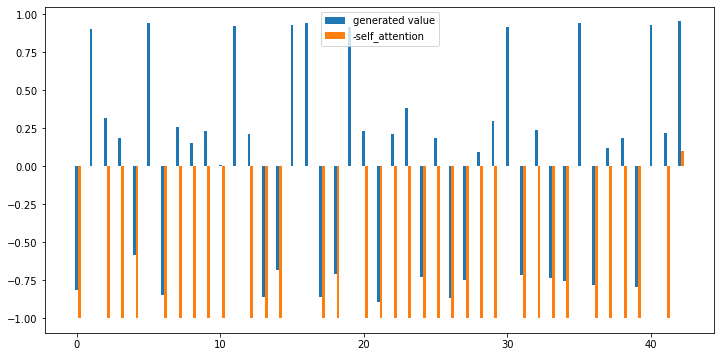

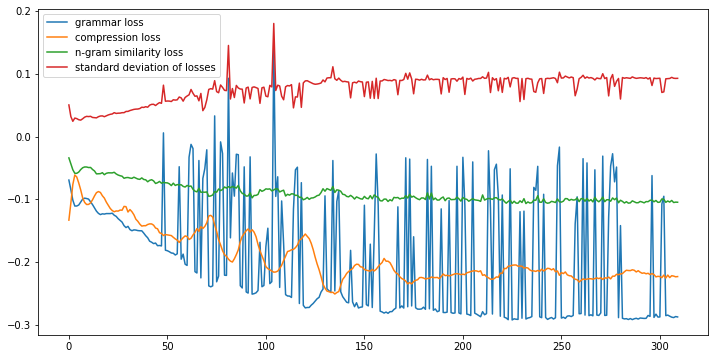

g 3.0186 	s -0.0097 	c 0.4301, score 1.4235, [그동안 신들린 연기로 화면을 시청자들의 감탄을 자아냈고 특히 지난 24일 남은 동료 대한 분노와 영미에게 총구를 장면에서 필성의 감정을 고스란히 녹여내 샀고 빙의는 11시 최종화가 방송된다.]
g 4.9173 	s -0.0207 	c 0.3871, score 1.6860, [그동안 신들린 연기로 화면을 시청자들의 감탄을 자아냈고 특히 지난 24일 남은 동료 대한 분노와 영미에게 총구를 장면에서 필성의 감정을 고스란히 녹여내 샀고 빙의는 오늘(25일) 11시 최종화가 방송된다.]
g -1.3773 	s 0.0476 	c 0.4677, score 0.7858, [그동안 연기로 화면을 시청자들의 감탄을 자아냈고 지난 남은 동료 대한 분노와 영미에게 총구를 장면에서 감정을 고스란히 녹여내 샀고 빙의는 오늘(25일) 11시 최종화가 방송된다.]
g 4.3778 	s -0.0347 	c 0.4032, score 1.5981, [그동안 신들린 연기로 화면을 시청자들의 감탄을 자아냈고 지난 24일 남은 동료 대한 분노와 영미에게 총구를 장면에서 필성의 감정을 고스란히 녹여내 샀고 빙의는 오늘(25일) 11시 최종화가 방송된다.]
g 2.6249 	s -0.0073 	c 0.4247, score 1.3549, [그동안 신들린 연기로 화면을 시청자들의 감탄을 자아냈고 지난 남은 동료 대한 분노와 영미에게 총구를 장면에서 필성의 감정을 고스란히 녹여내 샀고 빙의는 오늘(25일) 11시 최종화가 방송된다.]
g -0.5711 	s 0.1247 	c 0.5161, score 1.0134, [그동안 신들린 연기로 화면을 시청자들의 감탄을 자아냈고 지난 남은 동료 대한 영미에게 총구를 필성의 감정을 고스란히 녹여내 샀고 빙의는 11시 최종화가 방송된다.]
g -0.5231 	s -0.0149 	c 0.4731, score 0.8710, [그동안 신들린 화면을 시청자들의 감탄을 자아냈고 특히 지난 남은 동료

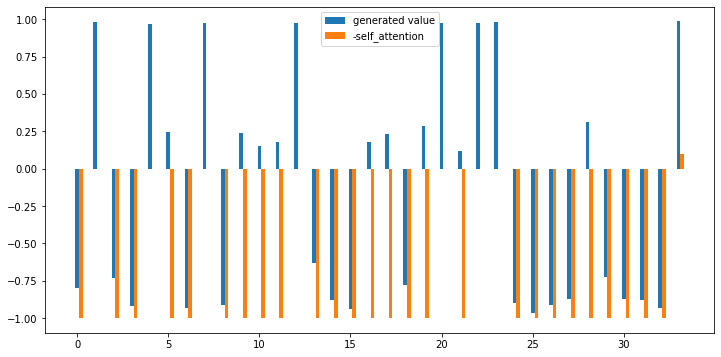

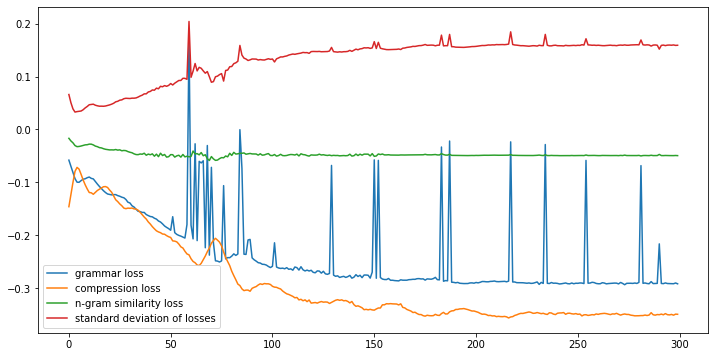

g 2.3149 	s 0.1117 	c 0.5143, score 1.4832, [같은 알리는 이번 방송을 전했고 첫 방송 만에 8% 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 56회는 방송된다.]
g -1.6791 	s 0.2212 	c 0.5571, score 0.8842, [같은 알리는 이번 방송을 전했고 첫 방송 만에 8% 최고시청률 코리아 기준)를 기록하며 많은 56회는 방송된다.]
g -2.2684 	s 0.0605 	c 0.5571, score 0.6253, [같은 알리는 이번 방송을 방송 만에 8% 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 56회는 방송된다.]
g -2.6781 	s 0.1227 	c 0.5500, score 0.6263, [같은 알리는 이번 방송을 전했고 첫 방송 만에 8% 최고시청률 3%(닐슨 코리아 기록하며 많은 56회는 방송된다.]
g -0.7012 	s 0.0674 	c 0.5429, score 0.9077, [같은 알리는 이번 방송을 첫 방송 만에 8% 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 56회는 방송된다.]
요약률 0.5143 유사성 0.1117 문법성 2.3149 요약 [같은 알리는 이번 방송을 전했고 첫 방송 만에 8% 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 56회는 방송된다.]
재시도 max score:1.4832328723300072 grammar:2.3149375915527344 text:같은 알리는 이번 방송을 전했고 첫 방송 만에 8% 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 56회는 방송된다.
--------------------------------------------------
폭풍 같은 스토리의 시작을 알리는 이번 주 방송을 기대해달라고 전했다. 첫 방송 만에 전국 시청률 13 8% 최고시청률 18 3%(닐슨 코리아 기준)를 기록하며 많은 화제를 모으고 있다. 열혈사제 56회는 오늘(22일) 밤 10시 SBS에서 방송된다.
---------

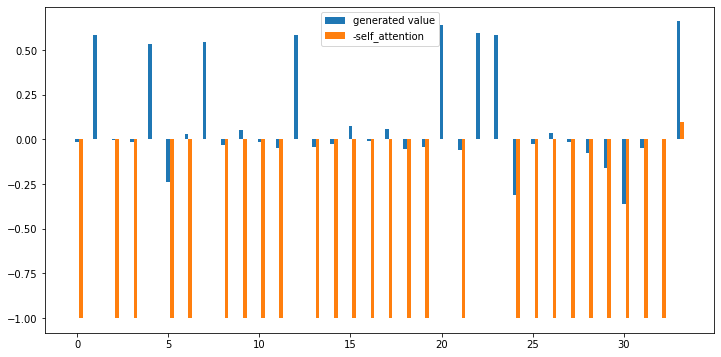

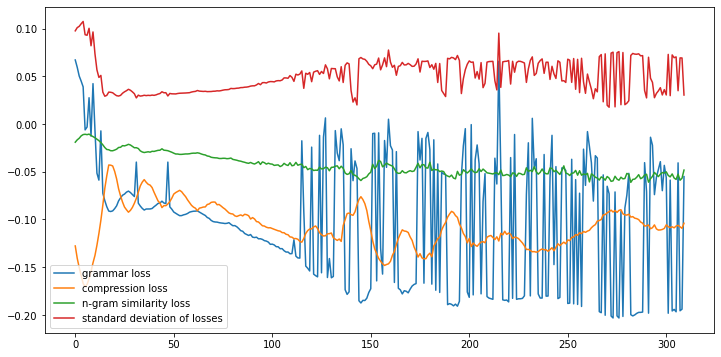

g 5.0078 	s -0.1819 	c 0.1500, score 1.3027, [폭풍 같은 스토리의 시작을 알리는 주 방송을 기대해달라고 전했고 방송 만에 전국 시청률 13 8% 최고시청률 18 3%(닐슨 코리아 기준)를 기록하며 많은 모으고 있고 열혈사제 56회는 10시 SBS에서 방송된다.]
g 5.1303 	s -0.1353 	c 0.1357, score 1.3555, [폭풍 같은 스토리의 시작을 알리는 주 방송을 기대해달라고 전했고 첫 방송 만에 전국 시청률 13 8% 최고시청률 18 3%(닐슨 코리아 기준)를 기록하며 많은 모으고 있고 열혈사제 56회는 10시 SBS에서 방송된다.]
g -1.9942 	s 0.1395 	c 0.4429, score 0.7500, [폭풍 같은 스토리의 시작을 알리는 주 방송을 전했고 방송 만에 13 8% 18 코리아 기준)를 기록하며 많은 모으고 있고 56회는 방송된다.]
g 3.3352 	s 0.1318 	c 0.3643, score 1.5520, [폭풍 같은 시작을 알리는 주 방송을 전했고 첫 방송 만에 전국 시청률 13 18 코리아 기록하며 많은 모으고 있고 열혈사제 56회는 10시 SBS에서 방송된다.]
g -1.5580 	s 0.0346 	c 0.3786, score 0.6535, [폭풍 같은 스토리의 알리는 주 방송을 기대해달라고 전했고 방송 만에 전국 시청률 13 최고시청률 코리아 기록하며 많은 모으고 있고 56회는 10시 방송된다.]
g 5.1675 	s -0.1072 	c 0.1786, score 1.4326, [폭풍 같은 스토리의 시작을 알리는 주 방송을 기대해달라고 전했고 첫 방송 만에 전국 시청률 13 8% 최고시청률 18 3%(닐슨 코리아 기준)를 기록하며 많은 모으고 있고 열혈사제 56회는 10시 방송된다.]
g 4.5345 	s -0.1370 	c 0.2500, score 1.3687, [폭풍 같은 스토리의 시작을 알리는 주 방송을 기대해달라고 전했고 방송 만에 전국 시청률 13 8% 최고시

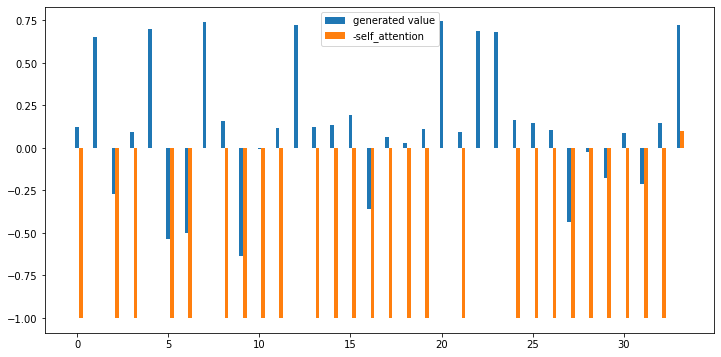

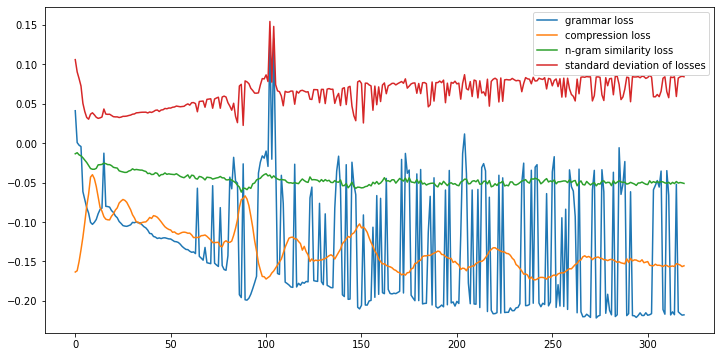

g 5.1144 	s -0.1532 	c 0.2929, score 1.4921, [폭풍 같은 시작을 알리는 방송을 기대해달라고 방송 만에 전국 시청률 13 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 화제를 모으고 있고 56회는 밤 SBS에서 방송된다.]
g 4.7733 	s 0.0205 	c 0.3571, score 1.6732, [폭풍 같은 시작을 알리는 방송을 기대해달라고 첫 방송 만에 전국 시청률 13 3%(닐슨 코리아 기준)를 기록하며 많은 화제를 모으고 있고 밤 SBS에서 방송된다.]
g 5.1704 	s -0.1538 	c 0.2786, score 1.4866, [폭풍 같은 시작을 알리는 방송을 기대해달라고 첫 방송 만에 전국 시청률 13 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 화제를 모으고 있고 56회는 밤 SBS에서 방송된다.]
g 3.2386 	s -0.1869 	c 0.3429, score 1.1957, [폭풍 같은 시작을 알리는 방송을 기대해달라고 첫 방송 만에 전국 시청률 13 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 모으고 있고 밤 SBS에서 방송된다.]
g 2.3648 	s 0.2167 	c 0.4571, score 1.5680, [폭풍 같은 시작을 알리는 방송을 방송 만에 전국 시청률 13 최고시청률 코리아 기준)를 기록하며 많은 화제를 모으고 SBS에서 방송된다.]
g 3.9493 	s 0.1245 	c 0.3714, score 1.6541, [폭풍 같은 시작을 알리는 방송을 기대해달라고 방송 만에 전국 시청률 13 최고시청률 3%(닐슨 코리아 기준)를 기록하며 많은 모으고 있고 SBS에서 방송된다.]
g 2.5560 	s -0.0049 	c 0.4143, score 1.3354, [폭풍 같은 시작을 알리는 방송을 기대해달라고 방송 만에 전국 시청률 3%(닐슨 코리아 기록하며 많은 화제를 모으고 56회는 밤 SBS에서 방송된다.]
g 5.2006 	s -0.1377 	c 0.3071, score 1.

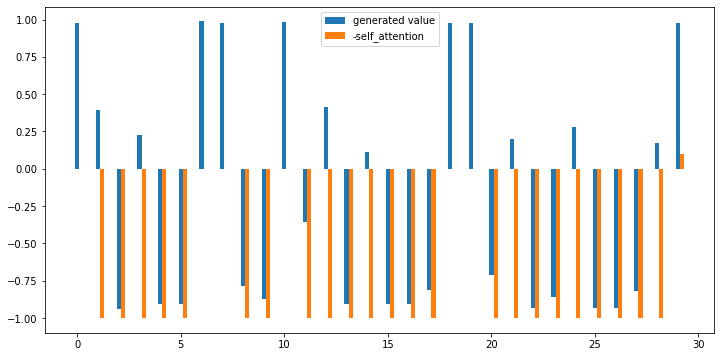

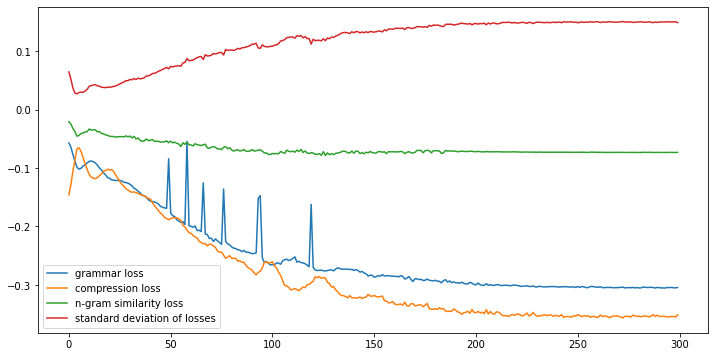

g 4.3884 	s 0.3751 	c 0.5532, score 2.0533, [한편 청파서계 산업은 시장을 중심으로 우수한 생산해왔고 수제화 지니고 있는 대표 최초의 서울미래유산으로 지정됐다.]
요약률 0.5532 유사성 0.3751 문법성 4.3884 요약 [한편 청파서계 산업은 시장을 중심으로 우수한 생산해왔고 수제화 지니고 있는 대표 최초의 서울미래유산으로 지정됐다.]
--------------------------------------------------
한편 청파서계 산업은 시장을 중심으로 우수한 생산해왔고 수제화 지니고 있는 대표 최초의 서울미래유산으로 지정됐다. 2.0532581345409366 4.388386249542236
================================================== Original Document 90==================================================
서울시가 오는 27일부터 약 5주 동안 서울로 7017 목련마당에서 서울역 일대 대표 제조 산업인 청파서계 봉제와 염천교 수제화 제품을 판매하는 팝업스토어를 운영한다.
'서울로팝 F/W'라는 명칭으로 열리는 이번 행사는 오후 12시부터 밤 9시까지 매일 운영된다.
이번 팝업스토어에서는 청파서계 봉제 산업의 대표 브랜드인 '어고잉(Agoing)'이 첫 선을 보인다.
Agoing은 서울시 지원을 토대로 한국봉제패션협회와 봉제이음디자인협동조합이 이 지역 봉제 업체와 협력해 개발한 지역 대표 브랜드이다.
서울시는 공동브랜드 개발을 통해 청파서계 지역 생산 제품의 인지도를 높이고 지역의 산업 활성화를 도모하고자 했다.
청파서계 봉제 업체의 80% 이상이 임가공 업체이며 자가 브랜드를 보유한 곳은 1%에 불과하기 때문이다.
이번 서울로팝에서는 봉제이음협동조합에 소속된 디자이너 지망생이 디자인하고 이 지역 봉제 장인이 제작한 20~30대 여성의류 33종이 Agoing 브랜드를 달고 고객을 맞이한다.
지난해 하반기 팝업스

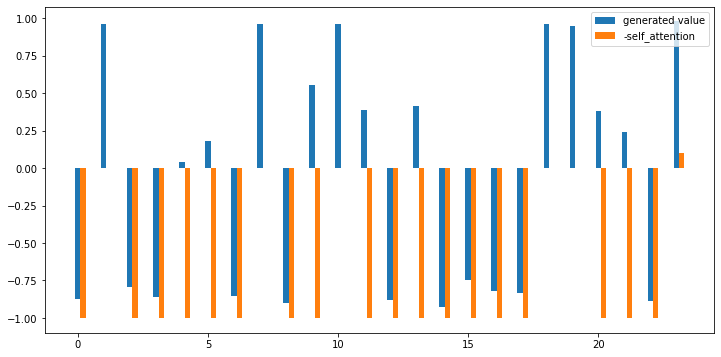

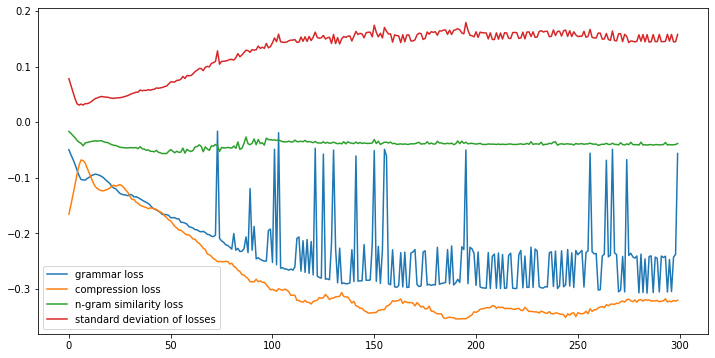

g 5.0508 	s 0.5637 	c 0.5408, score 2.3647, [시대의 이야기를 들어본고 달인 달인은 오는 04월 밤 방영 된고 인천 부평구 7.]
g 0.6166 	s 0.5517 	c 0.5918, score 1.5626, [시대의 이야기를 달인 달인은 오는 04월 밤 방영 된고 인천 부평구 7.]
g 5.1538 	s 0.5588 	c 0.6429, score 2.2749, [시대의 달인 달인은 오는 04월 밤 방영 된고 인천 부평구 7.]
g -1.0184 	s 0.5391 	c 0.6327, score 1.2367, [시대의 이야기를 달인 오는 04월 밤 방영 된고 인천 부평구 7.]
g 2.6525 	s 0.5803 	c 0.5918, score 1.9306, [시대의 들어본고 달인 달인은 오는 04월 밤 방영 된고 인천 부평구 7.]
g -1.4579 	s 0.5342 	c 0.6224, score 1.1688, [시대의 이야기를 달인 달인은 오는 04월 밤 방영 된고 부평구 7.]
g 3.1580 	s 0.5543 	c 0.5816, score 1.9990, [시대의 이야기를 들어본고 달인 오는 04월 밤 방영 된고 인천 부평구 7.]
g 4.9324 	s 0.5546 	c 0.6837, score 2.1930, [시대의 달인 달인은 오는 04월 밤 방영 된고 인천 7.]
요약률 0.5408 유사성 0.5637 문법성 5.0508 요약 [시대의 이야기를 들어본고 달인 달인은 오는 04월 밤 방영 된고 인천 부평구 7.]
--------------------------------------------------
시대의 이야기를 들어본고 달인 달인은 오는 04월 밤 방영 된고 인천 부평구 7. 2.3647120797715218 5.050792217254639
================================================== Original Document 92============================

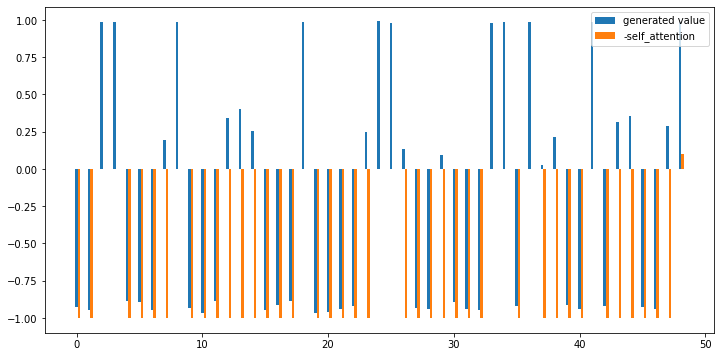

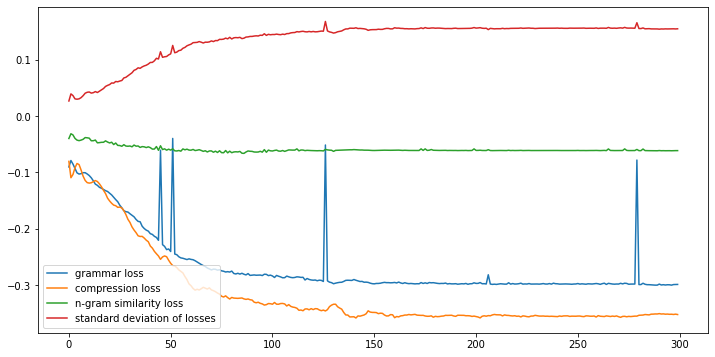

g 3.2873 	s 0.2589 	c 0.5833, score 1.7234, [단순 기피 머물게 되는데 극복하는 계기가 되고 직접 무엇과도 비교할 수가 없고 이날 현장을 찾아 대비해 안전사고에 유의해 현장 격려했고 이어 애로사항을 청취했다.]
g -1.0178 	s 0.2260 	c 0.6019, score 0.9545, [단순 기피 머물게 되는데 극복하는 되고 직접 무엇과도 비교할 수가 없고 이날 현장을 찾아 대비해 안전사고에 유의해 현장 격려했고 이어 애로사항을 청취했다.]
g 2.8037 	s 0.2522 	c 0.5972, score 1.6222, [단순 기피 머물게 되는데 극복하는 계기가 직접 무엇과도 비교할 수가 없고 이날 현장을 찾아 대비해 안전사고에 유의해 현장 격려했고 이어 애로사항을 청취했다.]
요약률 0.5833 유사성 0.2589 문법성 3.2873 요약 [단순 기피 머물게 되는데 극복하는 계기가 되고 직접 무엇과도 비교할 수가 없고 이날 현장을 찾아 대비해 안전사고에 유의해 현장 격려했고 이어 애로사항을 청취했다.]
--------------------------------------------------
단순 기피 머물게 되는데 극복하는 계기가 되고 직접 무엇과도 비교할 수가 없고 이날 현장을 찾아 대비해 안전사고에 유의해 현장 격려했고 이어 애로사항을 청취했다. 1.723416437705358 3.2873048782348633
================================================== Original Document 97==================================================
(동양일보 엄재천 기자) 조병옥 음성군수가 27일 건강가정·다문화가족지원센터 금왕분소를 방문해 결혼이주여성들을 대상으로 한국어 1일 교사로 활동했다.
조 군수는 이날 한국어 2단계 과정에 참여하고 있는 중국, 베트남, 캄보디아, 필리핀 출신 등 결혼이주여성 20명을 대상으로 교육을 진행했다.
교

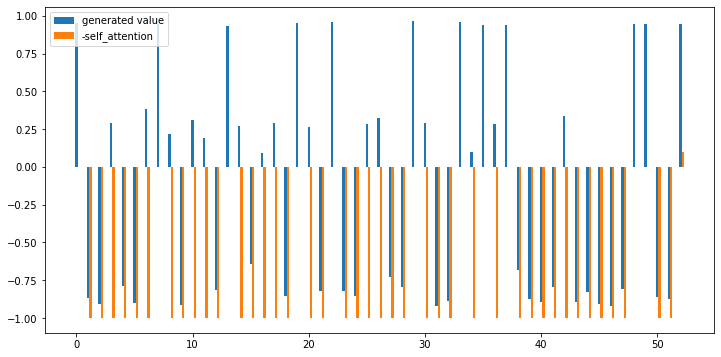

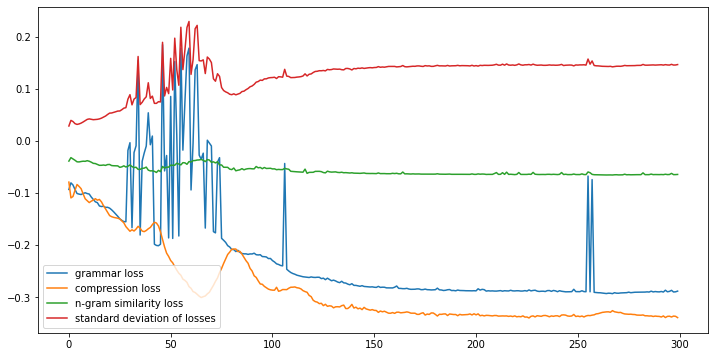

g 5.1530 	s 0.0371 	c 0.5371, score 1.8588, [이에 심각성을 예방하기 위해 학교와 등에 배포하고 각 세대에 실시했고 또 추억의 벨튀란 진행하는 범죄임을 명시하는 등 협조를 관계자는 청소년 시기에 법에 대한 낙인이 발생하지 않도록 밝혔다.]
g 5.0378 	s 0.0135 	c 0.5546, score 1.7985, [이에 심각성을 예방하기 위해 학교와 등에 배포하고 각 세대에 실시했고 또 추억의 벨튀란 진행하는 범죄임을 명시하는 등 협조를 관계자는 시기에 법에 대한 낙인이 발생하지 않도록 밝혔다.]
g -0.7279 	s 0.2820 	c 0.5546, score 1.1061, [이에 심각성을 예방하기 위해 학교와 등에 배포하고 각 세대에 실시했고 또 추억의 벨튀란 진행하는 범죄임을 명시하는 등 협조를 관계자는 청소년 시기에 법에 대한 발생하지 않도록 밝혔다.]
g 3.0710 	s 0.0349 	c 0.5546, score 1.4922, [이에 심각성을 예방하기 위해 학교와 등에 배포하고 각 실시했고 또 추억의 벨튀란 진행하는 범죄임을 명시하는 등 협조를 관계자는 청소년 시기에 법에 대한 낙인이 발생하지 않도록 밝혔다.]
g 5.1951 	s 0.0368 	c 0.5590, score 1.8437, [이에 예방하기 위해 학교와 등에 배포하고 각 세대에 실시했고 또 추억의 벨튀란 진행하는 범죄임을 명시하는 등 협조를 관계자는 청소년 시기에 법에 대한 낙인이 발생하지 않도록 밝혔다.]
g 5.2569 	s 0.0899 	c 0.5721, score 1.8940, [이에 심각성을 예방하기 위해 학교와 각 세대에 실시했고 또 추억의 벨튀란 진행하는 범죄임을 명시하는 등 협조를 관계자는 청소년 시기에 법에 대한 낙인이 발생하지 않도록 밝혔다.]
g -4.8617 	s -0.0527 	c 0.5895, score 0.0475, [이에 심각성을 예방하기 위해 등에 배포하고 각 실시했고 또 추억의 벨튀란 진행하는 범죄임을 명시하는 등 협

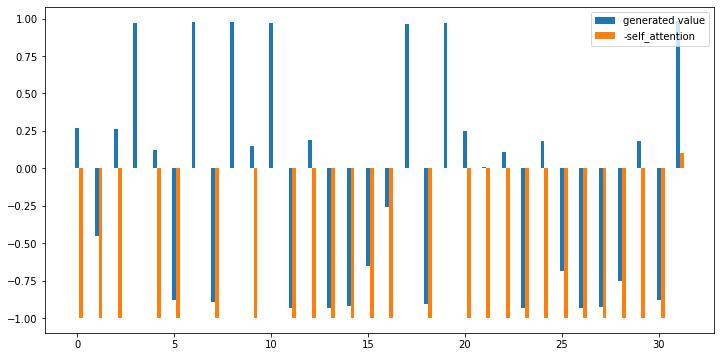

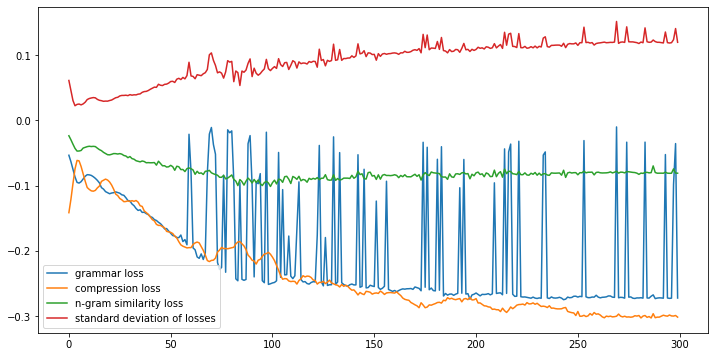

g 3.1590 	s 0.0250 	c 0.5257, score 1.5258, [원희룡 축사를 통해 제주도 Free 정책에 부응하고 에너지 기여하는 역할을 말했고 남제주복합발전소 건설은 한국전력기술이 GE와 포스코건설과 담당한다.]
g 4.1774 	s -0.0664 	c 0.5714, score 1.5584, [원희룡 축사를 통해 제주도 Free 정책에 부응하고 에너지 기여하는 역할을 말했고 남제주복합발전소 건설은 GE와 포스코건설과 담당한다.]
g 3.0046 	s 0.1143 	c 0.5486, score 1.5665, [원희룡 축사를 통해 제주도 Free 정책에 부응하고 에너지 기여하는 역할을 말했고 남제주복합발전소 건설은 한국전력기술이 포스코건설과 담당한다.]
g 2.9630 	s 0.0294 	c 0.5543, score 1.4690, [원희룡 축사를 통해 제주도 Free 정책에 부응하고 에너지 역할을 말했고 남제주복합발전소 건설은 한국전력기술이 GE와 포스코건설과 담당한다.]
g 2.7847 	s -0.0418 	c 0.4971, score 1.4194, [원희룡 축사를 통해 제주도 Free 정책에 부응하고 에너지 기여하는 발전소의 역할을 말했고 남제주복합발전소 건설은 한국전력기술이 GE와 포스코건설과 담당한다.]
g 3.4146 	s 0.4090 	c 0.6343, score 1.8438, [원희룡 축사를 통해 제주도 Free 정책에 부응하고 에너지 기여하는 역할을 말했고 남제주복합발전소 건설은 담당한다.]
g 4.1465 	s -0.0137 	c 0.5943, score 1.5831, [원희룡 축사를 통해 제주도 Free 정책에 부응하고 에너지 기여하는 역할을 말했고 남제주복합발전소 건설은 포스코건설과 담당한다.]
g -2.3747 	s -0.0825 	c 0.5486, score 0.4731, [원희룡 통해 제주도 Free 정책에 부응하고 에너지 기여하는 역할을 말했고 남제주복합발전소 건설은 한국전력기술이 GE와 포스코건설과 담당한다.]
g 

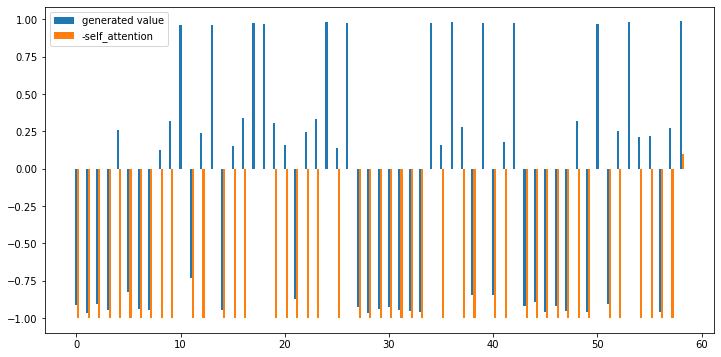

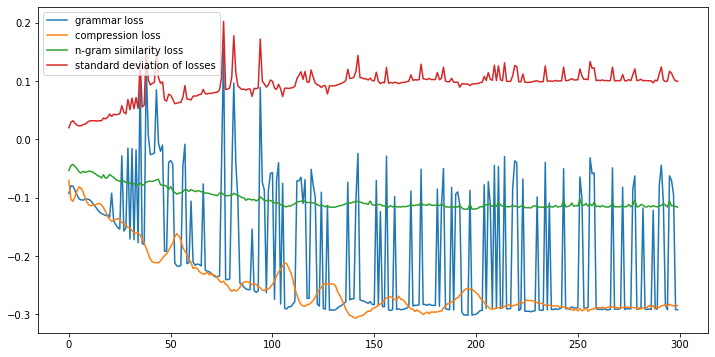

g 3.3646 	s 0.0732 	c 0.4419, score 1.5758, [행복한 위해 청년들을 위한 정책을 추진하고 지난해 청년기본조례를 제정 후 청년발전위원회를 구성했으며 19일에는 청년정책협의체를 공식 출범시킨 뒤 주관 청년을 위한 문화공간조성사업인 언덕 공모사업에 이어 각종 잇따라 청년이 돌아오는 괴산 만들기에 가하고 있다.]
g -0.9685 	s 0.1032 	c 0.4961, score 0.9379, [행복한 청년들을 위한 정책을 추진하고 지난해 청년기본조례를 제정 후 청년발전위원회를 구성했으며 19일에는 청년정책협의체를 공식 출범시킨 뒤 주관 위한 문화공간조성사업인 언덕 공모사업에 이어 각종 잇따라 청년이 돌아오는 만들기에 있다.]
g -4.1113 	s 0.0713 	c 0.5581, score 0.3280, [행복한 청년들을 위한 정책을 추진하고 청년기본조례를 제정 후 구성했으며 19일에는 청년정책협의체를 공식 뒤 주관 위한 문화공간조성사업인 언덕 공모사업에 이어 각종 잇따라 청년이 돌아오는 괴산 가하고 있다.]
g 5.2185 	s 0.0769 	c 0.4535, score 1.9001, [행복한 청년들을 위한 정책을 추진하고 지난해 청년기본조례를 제정 후 청년발전위원회를 구성했으며 19일에는 청년정책협의체를 공식 출범시킨 뒤 주관 청년을 위한 문화공간조성사업인 언덕 공모사업에 이어 각종 잇따라 청년이 돌아오는 괴산 만들기에 가하고 있다.]
g -1.8312 	s 0.0651 	c 0.5775, score 0.6823, [위한 정책을 추진하고 제정 후 청년발전위원회를 구성했으며 청년정책협의체를 공식 출범시킨 뒤 주관 청년을 위한 문화공간조성사업인 언덕 공모사업에 이어 각종 잇따라 청년이 돌아오는 괴산 가하고 있다.]
g 2.8897 	s 0.0633 	c 0.4729, score 1.5177, [행복한 위해 청년들을 위한 정책을 추진하고 지난해 제정 후 청년발전위원회를 구성했으며 19일에는 청년정책협의체를 공식 출범시킨 뒤 주관 청년을

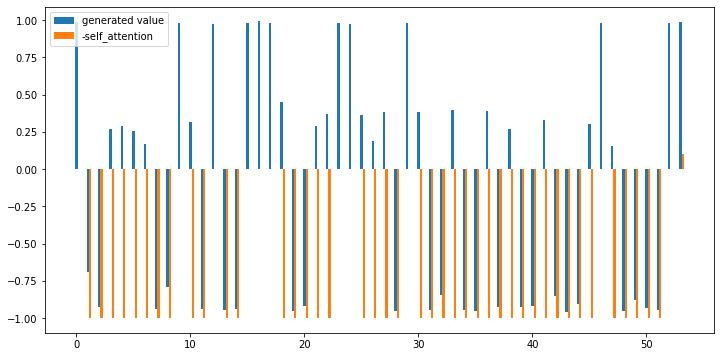

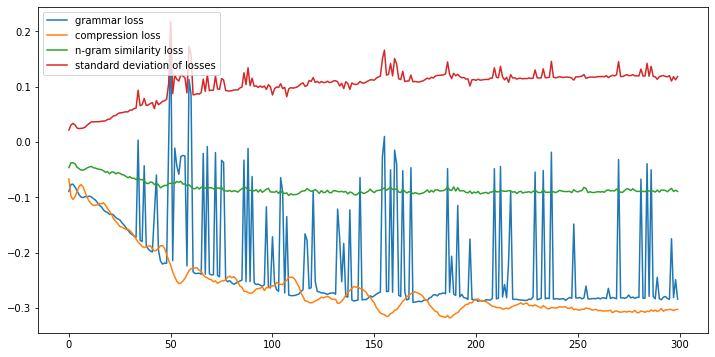

g 4.5832 	s 0.5689 	c 0.5065, score 2.3263, [일반적으로 옷감의 수축률이 때와 70도로 때의 가까워 큰 차이를 보인고 뒷부분 전면에 풍부한 바람을 분사하는 360개의 에어홀이 많은 양의 건조할 것이 건조기와 건조통이 꼬이지 않도록 도와줘 큰 특징이다.]
g 4.3784 	s 0.5541 	c 0.4848, score 2.2687, [일반적으로 상승하면 옷감의 수축률이 때와 70도로 때의 가까워 큰 차이를 보인고 뒷부분 전면에 풍부한 바람을 분사하는 360개의 에어홀이 많은 양의 건조할 것이 건조기와 건조통이 꼬이지 않도록 도와줘 큰 특징이다.]
g -2.2479 	s -0.2116 	c 0.5844, score 0.3293, [일반적으로 상승하면 옷감의 때와 70도로 때의 가까워 큰 차이를 보인고 전면에 풍부한 바람을 360개의 에어홀이 많은 양의 건조할 것이 건조통이 꼬이지 않도록 큰 특징이다.]
g -3.1932 	s 0.5413 	c 0.5411, score 0.9680, [일반적으로 상승하면 옷감의 수축률이 때와 70도로 때의 가까워 큰 차이를 뒷부분 전면에 풍부한 바람을 분사하는 360개의 에어홀이 많은 양의 건조할 것이 건조통이 꼬이지 않도록 큰 특징이다.]
g 4.5953 	s 0.5678 	c 0.5065, score 2.3272, [일반적으로 상승하면 옷감의 수축률이 때와 70도로 때의 가까워 큰 차이를 보인고 뒷부분 전면에 풍부한 바람을 분사하는 360개의 에어홀이 많은 양의 건조할 것이 건조통이 꼬이지 않도록 도와줘 큰 특징이다.]
g 5.2175 	s 0.5835 	c 0.4589, score 2.4120, [일반적으로 상승하면 옷감의 수축률이 증가하는데 때와 70도로 때의 가까워 큰 차이를 보인고 뒷부분 전면에 풍부한 바람을 분사하는 360개의 에어홀이 많은 양의 건조할 것이 건조기와 건조통이 꼬이지 않도록 도와줘 큰 특징이다.]
g -3.6733 	s 0.5414 	c 0.5714, score 0.85

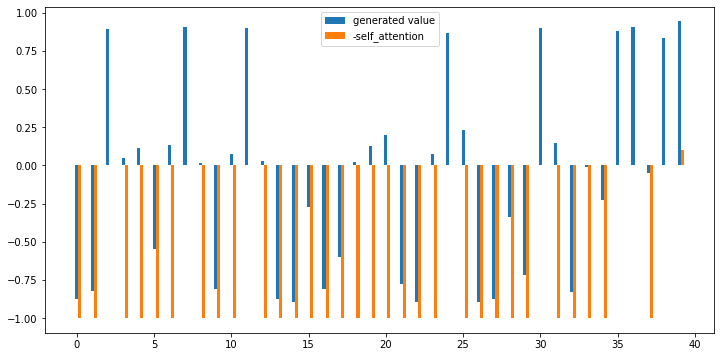

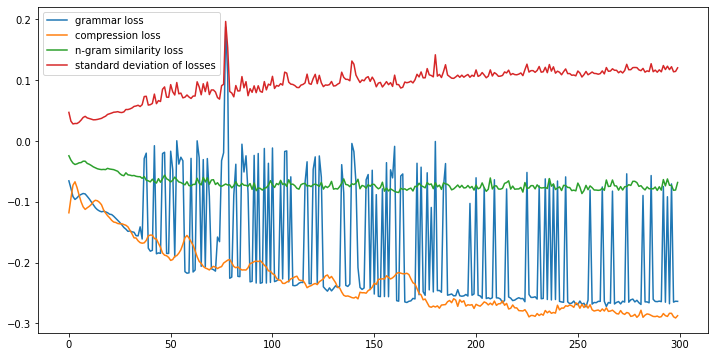

g 5.2415 	s 0.3331 	c 0.4731, score 2.1797, [기준 119경기를 소화해 있는 가운데 5경기 정도 호투 퍼레이드가 이어진다면 최다승 기록을 넘을 최고 투수로 린드블럼은 역사상 최고 외국인투수 자리도 노린다.]
g 5.1076 	s 0.4623 	c 0.5150, score 2.2985, [기준 119경기를 소화해 있는 가운데 5경기 정도 선발 호투 퍼레이드가 이어진다면 기록을 넘을 최고 투수로 린드블럼은 역사상 최고 자리도 노린다.]
g 5.2496 	s 0.1552 	c 0.4251, score 1.9553, [기준 119경기를 소화해 남겨두고 있는 가운데 5경기 정도 선발 호투 퍼레이드가 이어진다면 최다승 기록을 넘을 최고 투수로 린드블럼은 역사상 최고 외국인투수 자리도 노린다.]
g 5.2002 	s 0.4732 	c 0.5389, score 2.3010, [기준 119경기를 남겨두고 있는 가운데 5경기 정도 호투 퍼레이드가 최다승 기록을 넘을 최고 투수로 린드블럼은 역사상 최고 자리도 노린다.]
g 5.2347 	s 0.3374 	c 0.4551, score 2.1650, [기준 119경기를 소화해 있는 가운데 5경기 정도 선발 호투 퍼레이드가 이어진다면 최다승 기록을 넘을 최고 투수로 린드블럼은 역사상 최고 외국인투수 자리도 노린다.]
g 5.2007 	s 0.1864 	c 0.4910, score 2.0442, [기준 남겨두고 있는 가운데 5경기 정도 선발 호투 퍼레이드가 이어진다면 최다승 기록을 넘을 최고 투수로 린드블럼은 역사상 최고 외국인투수 자리도 노린다.]
g 5.1759 	s 0.4862 	c 0.5329, score 2.3160, [기준 119경기를 있는 가운데 5경기 정도 호투 퍼레이드가 이어진다면 최다승 기록을 넘을 최고 투수로 린드블럼은 역사상 최고 자리도 노린다.]
g 5.2534 	s 0.1764 	c 0.4431, score 1.9951, [기준 119경기를 소화해 남겨두고 있는 가운데 5경기 

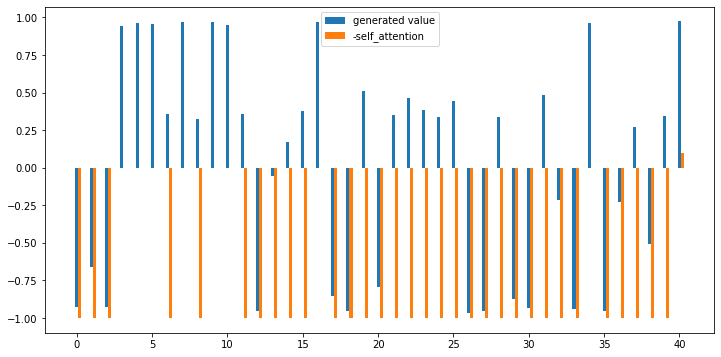

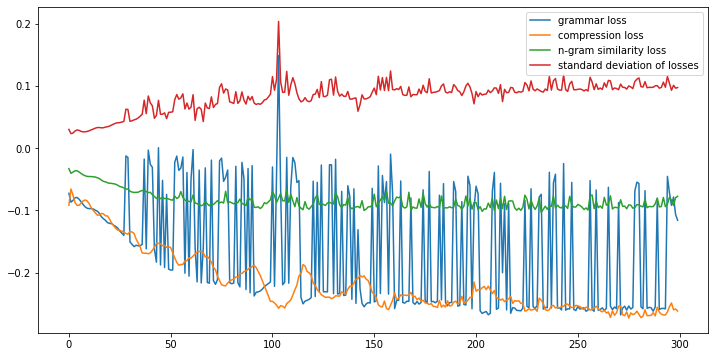

g 5.1153 	s 0.4179 	c 0.4922, score 2.2627, [열악한 실제 공장 생산설비 환경에 적용 중이고 이러한 현장 돌발정지를 예측하는 등 홍경표 연구소장은 기가사운드닥터는 AI를 선도하는 준비중인 핵심 바탕으로 선점하겠다고 밝혔다.]
g 5.2594 	s 0.4784 	c 0.4560, score 2.3110, [열악한 실제 공장 생산설비 환경에 적용 중이고 이러한 현장 기계의 돌발정지를 예측하는 등 홍경표 컨버젼스 기가사운드닥터는 AI를 선도하는 준비중인 핵심 바탕으로 시장을 선점하겠다고 밝혔다.]
g 4.9240 	s 0.3900 	c 0.5233, score 2.1873, [열악한 실제 공장 생산설비 환경에 적용 중이고 이러한 현장 예측하는 등 홍경표 컨버젼스 연구소장은 기가사운드닥터는 AI를 준비중인 핵심 바탕으로 선점하겠다고 밝혔다.]
g 5.2562 	s 0.4098 	c 0.4249, score 2.2107, [열악한 실제 공장 생산설비 환경에 적용 중이고 이러한 현장 기계의 돌발정지를 예측하는 등 홍경표 컨버젼스 연구소장은 기가사운드닥터는 AI를 선도하는 준비중인 핵심 바탕으로 시장을 선점하겠다고 밝혔다.]
g 4.9727 	s 0.3395 	c 0.6062, score 2.0621, [열악한 실제 공장 생산설비 환경에 적용 중이고 이러한 현장 돌발정지를 예측하는 등 컨버젼스 기가사운드닥터는 AI를 핵심 바탕으로 밝혔다.]
g 5.2366 	s 0.4332 	c 0.4456, score 2.2516, [열악한 실제 공장 생산설비 환경에 적용 중이고 이러한 현장 돌발정지를 예측하는 등 홍경표 컨버젼스 연구소장은 기가사운드닥터는 AI를 선도하는 준비중인 핵심 바탕으로 시장을 선점하겠다고 밝혔다.]
g 5.2103 	s 0.4397 	c 0.4611, score 2.2692, [열악한 실제 공장 생산설비 환경에 적용 중이고 이러한 돌발정지를 예측하는 등 홍경표 컨버젼스 연구소장은 기가사운드닥터는 AI를 선도하는 준비중인 핵심 

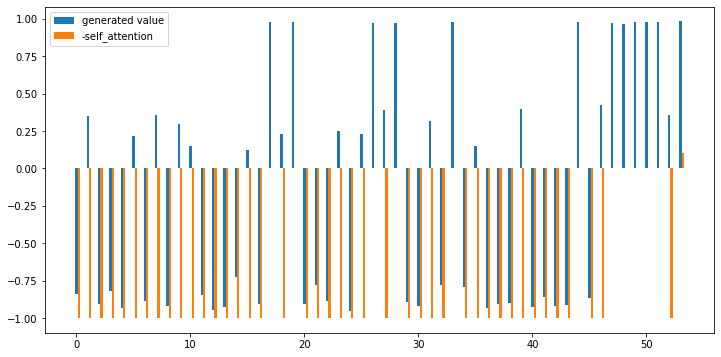

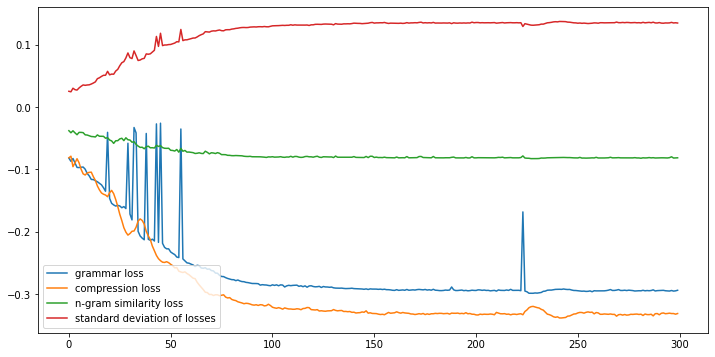

g 3.7075 	s 0.0926 	c 0.4530, score 1.6635, [어디서나 라임물티슈캡(70+2매) 쿠폰 8190원에 만나볼 옥션 내 먼데이옥션에서 확인할 옥션 실장은 이번주 먼데이옥션으로 다양한 아이템을 특히 간편하게 기저귀 선보이고 증정품까지 더해 좋은 반응을 얻을 것으로 기대한다고 말했다.]
g 3.3793 	s 0.1828 	c 0.4786, score 1.7246, [어디서나 라임물티슈캡(70+2매) 쿠폰 8190원에 만나볼 옥션 내 먼데이옥션에서 확인할 옥션 실장은 이번주 먼데이옥션으로 다양한 아이템을 특히 간편하게 기저귀 선보이고 더해 좋은 반응을 얻을 것으로 기대한다고 말했다.]
g 2.9864 	s 0.1216 	c 0.4786, score 1.5980, [어디서나 라임물티슈캡(70+2매) 쿠폰 8190원에 만나볼 옥션 내 먼데이옥션에서 확인할 옥션 실장은 이번주 먼데이옥션으로 다양한 아이템을 특히 간편하게 기저귀 선보이고 증정품까지 더해 좋은 반응을 얻을 것으로 말했다.]
g 4.3974 	s 0.0693 	c 0.4658, score 1.7680, [어디서나 라임물티슈캡(70+2매) 8190원에 만나볼 옥션 내 먼데이옥션에서 확인할 옥션 실장은 이번주 먼데이옥션으로 다양한 아이템을 특히 간편하게 기저귀 선보이고 증정품까지 더해 좋은 반응을 얻을 것으로 기대한다고 말했다.]
g 2.7654 	s 0.1776 	c 0.4829, score 1.6214, [어디서나 라임물티슈캡(70+2매) 쿠폰 만나볼 옥션 내 먼데이옥션에서 확인할 옥션 실장은 이번주 먼데이옥션으로 다양한 아이템을 특히 간편하게 기저귀 선보이고 증정품까지 더해 좋은 반응을 얻을 것으로 기대한다고 말했다.]
g 3.4563 	s 0.0327 	c 0.4872, score 1.5959, [어디서나 라임물티슈캡(70+2매) 8190원에 만나볼 옥션 내 먼데이옥션에서 확인할 옥션 실장은 이번주 먼데이옥션으로 다양한 아이템을 특히 기저귀 선보이고 증정품까지 더해 좋은 반응을

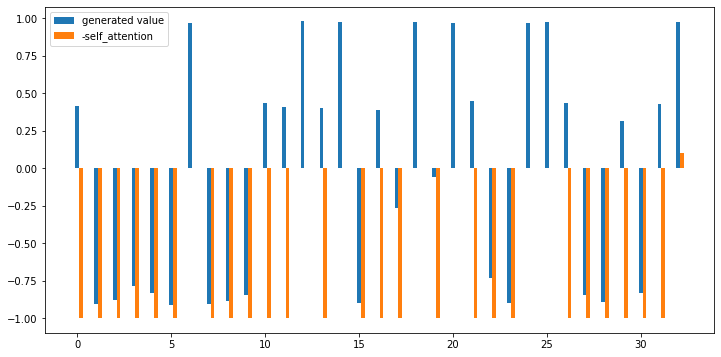

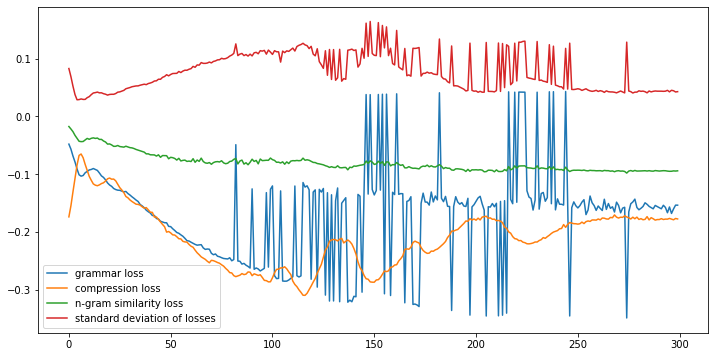

g 5.2016 	s 0.5831 	c 0.5000, score 2.4500, [스타벅스는 함께 카드는 저금통과 함께 주변의 고마운 새해 함께 선물할 수 있도록 그려진 점이 특징이고 최초 충전이 가능하다.]
g -0.1274 	s 0.5261 	c 0.5290, score 1.4759, [스타벅스는 함께 카드는 저금통과 함께 주변의 고마운 새해 함께 수 있도록 그려진 점이 특징이고 최초 충전이 가능하다.]
요약률 0.5000 유사성 0.5831 문법성 5.2016 요약 [스타벅스는 함께 카드는 저금통과 함께 주변의 고마운 새해 함께 선물할 수 있도록 그려진 점이 특징이고 최초 충전이 가능하다.]
--------------------------------------------------
스타벅스는 함께 카드는 저금통과 함께 주변의 고마운 새해 함께 선물할 수 있도록 그려진 점이 특징이고 최초 충전이 가능하다. 2.449993888537089 5.201632499694824
================================================== Original Document 120==================================================
스타벅스가 황금돼지의 해인 기해년을 맞아 귀여운 돼지 옷을 입은 베어리스타 저금통을 선보인다.
스타벅스커피 코리아는 오는 18일부터 뉴이어 프로모션 음료 4종과 '2019 베어리스타 저금통'을 함께 구매할 수 있는 '럭키 뉴이어 세트' 이벤트를 전국 매장에서 진행(단, 미군 부대 매장 제외)한다고 16일 밝혔다.
뉴이어 프로모션 음료인 '럭키 뉴이어 세트'는 '이천 햅쌀 라떼', '이천 햅쌀 크림 프라푸치노', '바닐라 블랙 티 라떼', '체스트넛 블랙 티 라떼' 중 톨 사이즈 1잔과 '2019 베어리스타 저금통' 1종을 선택해 총 13,000원에 세트로 구매할 수 있다.
선착순으로 판매되며 색상에 따라 조기 소진될 수 있다.
2019베어리스타 저금통은 스타벅스의 마스코트인 '

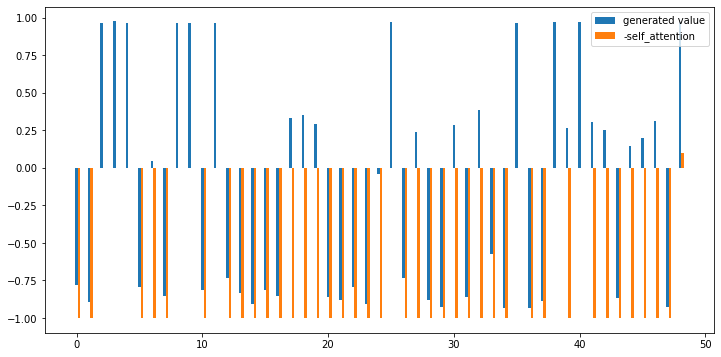

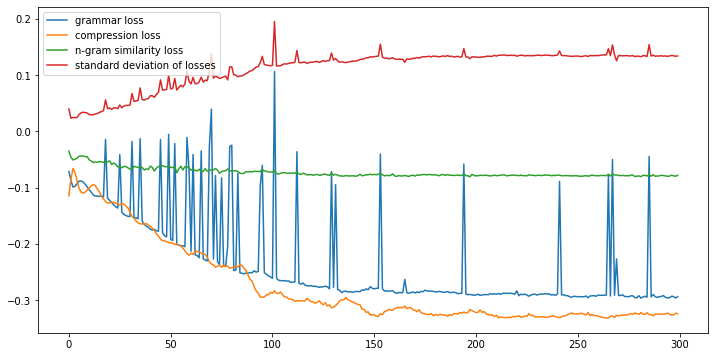

g 5.1083 	s 0.2034 	c 0.5450, score 2.0097, [이슈가 되고 있는 파트너사와의 갈등 문제를 위한 중·장기 비전인 2025년 및 넘버원 있고 뷰티 등으로 바탕으로 대상 및 제품 특징에 다양한 라인을 지속 예정이다.]
g 5.2509 	s 0.1912 	c 0.5600, score 2.0064, [이슈가 되고 있는 파트너사와의 갈등 문제를 위한 중·장기 비전인 2025년 및 넘버원 뷰티 등으로 바탕으로 대상 및 제품 특징에 다양한 라인을 지속 예정이다.]
g 4.6570 	s 0.2095 	c 0.5300, score 1.9556, [이슈가 되고 있는 파트너사와의 갈등 문제를 위한 중·장기 비전인 2025년 육성 및 넘버원 있고 뷰티 등으로 바탕으로 대상 및 제품 특징에 다양한 라인을 지속 예정이다.]
g 4.1800 	s 0.1797 	c 0.5800, score 1.7963, [이슈가 되고 있는 파트너사와의 갈등 문제를 위한 중·장기 2025년 및 넘버원 뷰티 등으로 바탕으로 대상 및 제품 특징에 다양한 라인을 지속 예정이다.]
g -0.0784 	s 0.2637 	c 0.5650, score 1.1857, [이슈가 되고 있는 파트너사와의 갈등 문제를 위한 중·장기 비전인 2025년 및 있고 뷰티 등으로 바탕으로 대상 및 제품 특징에 다양한 라인을 지속 예정이다.]
g -3.7100 	s 0.1483 	c 0.5950, score 0.4350, [이슈가 되고 있는 파트너사와의 갈등 문제를 위한 중·장기 비전인 2025년 및 넘버원 뷰티 등으로 바탕으로 및 제품 특징에 다양한 지속 예정이다.]
g 5.2249 	s 0.1868 	c 0.5750, score 1.9827, [이슈가 되고 있는 파트너사와의 갈등 문제를 위한 중·장기 비전인 2025년 및 넘버원 뷰티 등으로 바탕으로 대상 및 특징에 다양한 라인을 지속 예정이다.]
g -0.6863 	s 0.1327 	c 0.5800, score 0.9383, [이슈가 되고 있는 갈등 

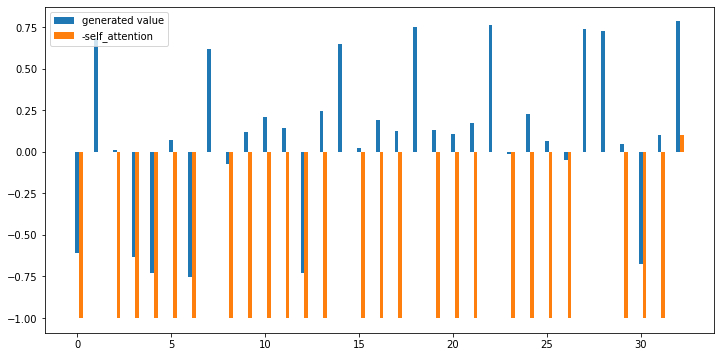

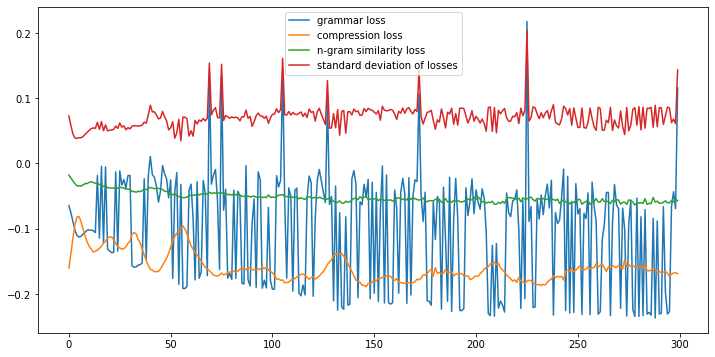

g -0.6969 	s 0.3278 	c 0.3030, score 1.0147, [비롯한 국정 성과를 게 국민의 신뢰를 회복하고 뒷받침될 때 가능한 일이고 그런 측면에서 기강 해이에 대한 안이한 인식이 야권에 적극적으로 손을 내밀지 대목은 아쉽다.]
g 4.5665 	s 0.3033 	c 0.2045, score 1.7690, [비롯한 국정 성과를 게 절실하고 국민의 신뢰를 회복하고 뒷받침될 때 가능한 일이고 그런 측면에서 청와대 기강 해이에 대한 안이한 인식이 읽히고 야권에 적극적으로 손을 내밀지 대목은 아쉽다.]
g -1.5655 	s 0.3282 	c 0.2955, score 0.8627, [비롯한 국정 성과를 게 국민의 회복하고 뒷받침될 때 가능한 일이고 그런 측면에서 청와대 해이에 대한 안이한 인식이 읽히고 야권에 적극적으로 손을 내밀지 대목은 아쉽다.]
g 4.4616 	s 0.3215 	c 0.2424, score 1.8075, [비롯한 국정 성과를 게 국민의 신뢰를 회복하고 뒷받침될 때 가능한 일이고 그런 측면에서 청와대 기강 해이에 대한 안이한 인식이 읽히고 야권에 적극적으로 손을 내밀지 대목은 아쉽다.]
g 3.6113 	s 0.3295 	c 0.2727, score 1.7041, [비롯한 국정 성과를 게 국민의 신뢰를 회복하고 뒷받침될 때 가능한 일이고 그런 측면에서 기강 해이에 대한 안이한 인식이 읽히고 야권에 적극적으로 손을 내밀지 대목은 아쉽다.]
g -2.4439 	s 0.3126 	c 0.4091, score 0.8144, [비롯한 게 절실하고 국민의 신뢰를 회복하고 뒷받침될 때 가능한 일이고 그런 측면에서 기강 대한 야권에 적극적으로 손을 내밀지 대목은 아쉽다.]
g -0.7148 	s 0.3115 	c 0.3712, score 1.0636, [비롯한 국정 성과를 게 국민의 신뢰를 회복하고 때 가능한 일이고 그런 측면에서 청와대 기강 해이에 대한 인식이 야권에 적극적으로 손을 내밀지 아쉽다.]
g -5.3927 	s 0.2470 

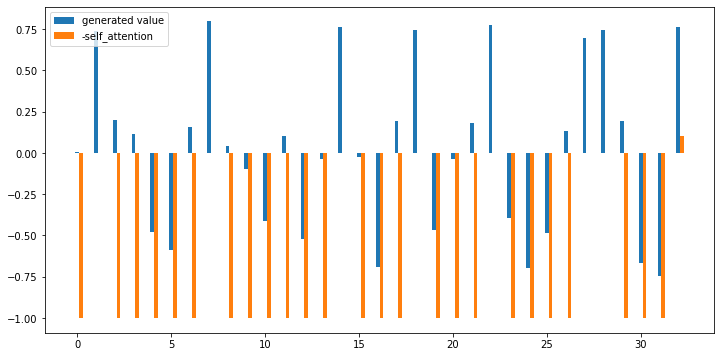

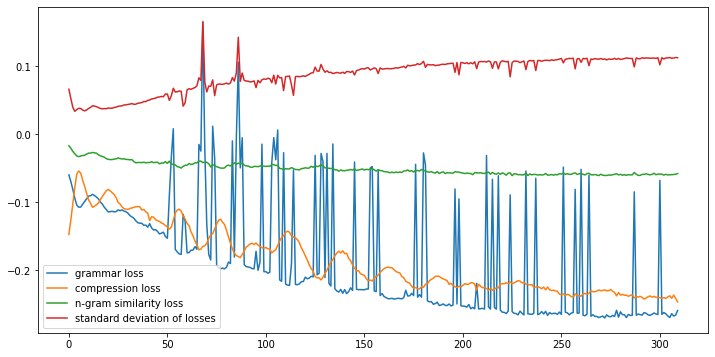

g 4.8531 	s 0.3012 	c 0.4091, score 2.0192, [경제를 비롯한 국정 전반에서 창출하는 게 절실하고 회복하고 때 가능한 그런 측면에서 기강 해이에 대한 야권에 적극적으로 손을 내밀지 아쉽다.]
g 4.8262 	s 0.2823 	c 0.4394, score 2.0260, [경제를 비롯한 국정 전반에서 창출하는 게 절실하고 회복하고 때 그런 측면에서 기강 해이에 대한 야권에 적극적으로 손을 내밀지 아쉽다.]
g -1.4711 	s 0.2909 	c 0.4697, score 1.0154, [비롯한 국정 전반에서 창출하는 게 절실하고 회복하고 때 그런 측면에서 기강 해이에 대한 야권에 적극적으로 손을 내밀지 아쉽다.]
g 5.2151 	s 0.2964 	c 0.3939, score 2.0595, [경제를 비롯한 국정 전반에서 창출하는 게 절실하고 회복하고 뒷받침될 때 가능한 그런 측면에서 해이에 대한 야권에 적극적으로 손을 내밀지 아쉽다.]
g -2.7313 	s 0.2437 	c 0.5606, score 0.7279, [경제를 비롯한 창출하는 게 절실하고 때 그런 측면에서 해이에 대한 야권에 적극적으로 손을 내밀지 아쉽다.]
g 5.2429 	s 0.2991 	c 0.4015, score 2.0744, [경제를 비롯한 국정 전반에서 창출하는 게 절실하고 회복하고 뒷받침될 때 그런 측면에서 기강 해이에 대한 야권에 적극적으로 손을 내밀지 아쉽다.]
g 5.2286 	s 0.3116 	c 0.3712, score 2.0542, [경제를 비롯한 국정 전반에서 창출하는 게 절실하고 회복하고 뒷받침될 때 가능한 그런 측면에서 기강 해이에 대한 야권에 적극적으로 손을 내밀지 아쉽다.]
g 4.4942 	s 0.2556 	c 0.4545, score 1.9592, [경제를 비롯한 국정 전반에서 창출하는 게 절실하고 회복하고 뒷받침될 때 그런 측면에서 대한 야권에 적극적으로 손을 내밀지 아쉽다.]
g 5.2573 	s 0.2749 	c 0.4394

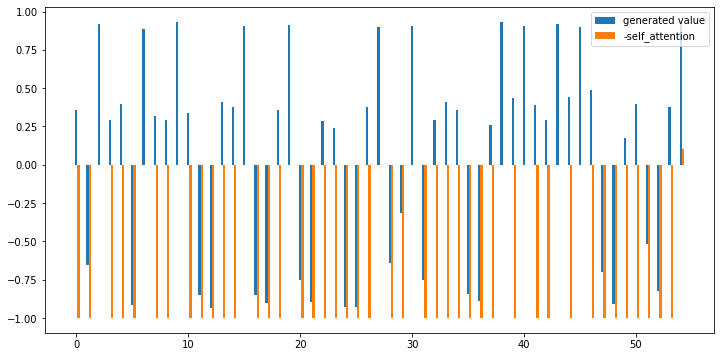

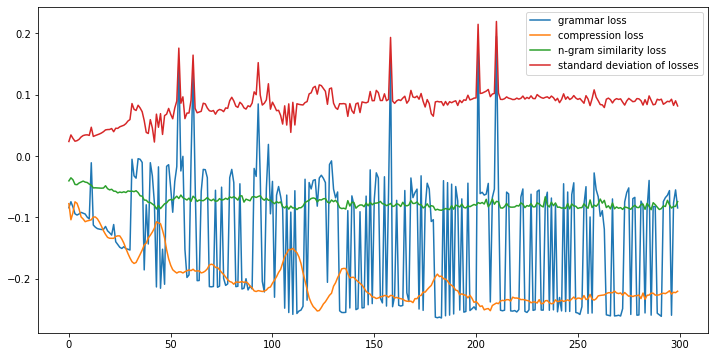

g 5.2379 	s 0.3178 	c 0.4328, score 2.1235, [인사청문회 측은 청문회 전까지 계획이 없다고 밝혔고 앞서 조 아동범죄자에 대한 방안 등 지난 26일엔 법제화 및 등 정책을 발표했고 후보자 발표하는 게 이례적인 데다 본인과 가족을 둘러싼 의혹이 쏟아지는 와중에 전환을 시도하는 비판이 일었다.]
g 5.2369 	s 0.3038 	c 0.4790, score 2.1556, [인사청문회 측은 청문회 전까지 계획이 없다고 밝혔고 앞서 조 20일 아동범죄자에 대한 등 법제화 및 등 정책을 발표했고 발표하는 게 이례적인 데다 본인과 가족을 둘러싼 의혹이 쏟아지는 와중에 전환을 시도하는 비판이 일었다.]
g 5.1359 	s 0.1781 	c 0.4832, score 2.0173, [인사청문회 측은 전까지 계획이 없다고 밝혔고 앞서 조 20일 아동범죄자에 대한 방안 등 법제화 및 등 정책을 발표했고 발표하는 게 이례적인 데다 본인과 가족을 둘러싼 의혹이 쏟아지는 와중에 전환을 시도하는 비판이 일었다.]
g 5.2349 	s 0.3350 	c 0.4160, score 2.1234, [인사청문회 측은 청문회 전까지 계획이 없다고 밝혔고 앞서 조 20일 아동범죄자에 대한 방안 등 지난 26일엔 법제화 및 등 정책을 발표했고 후보자 발표하는 게 이례적인 데다 본인과 가족을 둘러싼 의혹이 쏟아지는 와중에 전환을 시도하는 비판이 일었다.]
g -1.4909 	s 0.2667 	c 0.5630, score 0.9552, [인사청문회 측은 청문회 계획이 없다고 앞서 조 아동범죄자에 대한 방안 등 지난 법제화 및 등 정책을 게 이례적인 데다 가족을 둘러싼 의혹이 쏟아지는 와중에 전환을 시도하는 비판이 일었다.]
g -1.2095 	s 0.3245 	c 0.4916, score 1.1146, [인사청문회 측은 계획이 없다고 밝혔고 앞서 조 20일 아동범죄자에 대한 방안 등 지난 법제화 및 등 정책을 발표했고 후보자 발표하는 게 이례적인 데다 본인과 가족을 둘

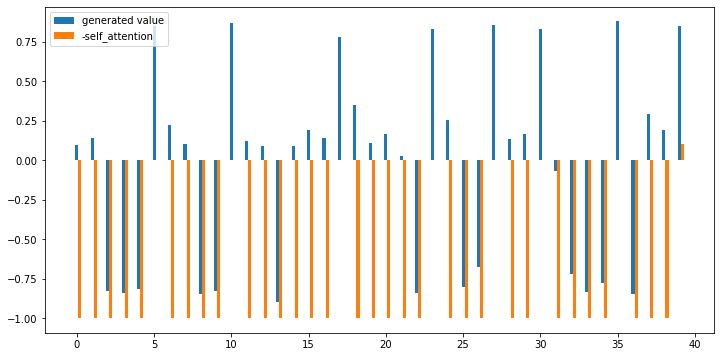

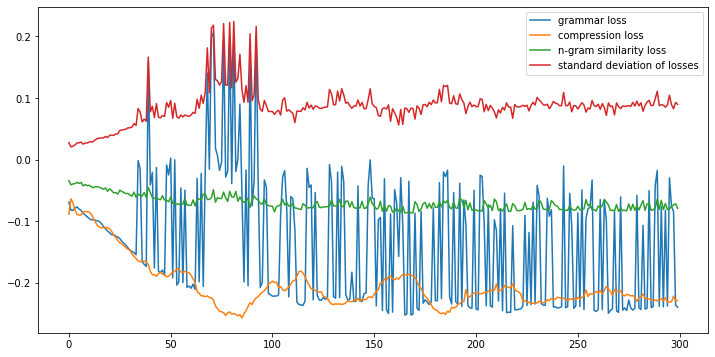

g 4.7329 	s 0.2714 	c 0.3855, score 1.9456, [정부는 지난해 구성해 공시가격 상승이 등에 미치는 영향을 밝혔고 건강보험료를 산정할 때도 재산보험료 비중을 줄이는 방향을 특히 정부는 등에 적용하는 것에 대한 유예기간을 등 최소화에 부심하고 있다.]
g 5.1563 	s 0.2814 	c 0.4078, score 2.0486, [정부는 지난해 구성해 공시가격 등에 미치는 영향을 밝혔고 건강보험료를 산정할 때도 재산보험료 비중을 줄이는 방향을 특히 정부는 등에 적용하는 것에 대한 유예기간을 등 최소화에 부심하고 있다.]
g 1.0868 	s 0.2736 	c 0.4581, score 1.4129, [정부는 지난해 구성해 공시가격 상승이 등에 미치는 영향을 밝혔고 산정할 때도 비중을 줄이는 방향을 특히 정부는 등에 적용하는 것에 대한 유예기간을 등 최소화에 부심하고 있다.]
g -4.7770 	s 0.0822 	c 0.5419, score 0.2441, [지난해 구성해 공시가격 등에 미치는 영향을 밝혔고 건강보험료를 산정할 때도 재산보험료 비중을 방향을 특히 정부는 등에 것에 대한 등 부심하고 있다.]
g 5.2613 	s 0.2548 	c 0.4525, score 2.0842, [정부는 지난해 구성해 공시가격 상승이 등에 미치는 영향을 밝혔고 건강보험료를 산정할 때도 비중을 줄이는 방향을 특히 정부는 등에 적용하는 것에 대한 등 최소화에 부심하고 있다.]
g -1.9769 	s 0.2050 	c 0.4860, score 0.8615, [정부는 지난해 구성해 공시가격 상승이 등에 미치는 영향을 밝혔고 산정할 때도 비중을 줄이는 방향을 특히 정부는 등에 적용하는 것에 대한 유예기간을 등 부심하고 있다.]
g 5.2119 	s 0.2710 	c 0.4581, score 2.0977, [정부는 지난해 구성해 공시가격 상승이 등에 미치는 영향을 밝혔고 산정할 때도 재산보험료 비중을 줄이는 방향을 특히 정부는 등에 적용하는 것에 대한 등 최소

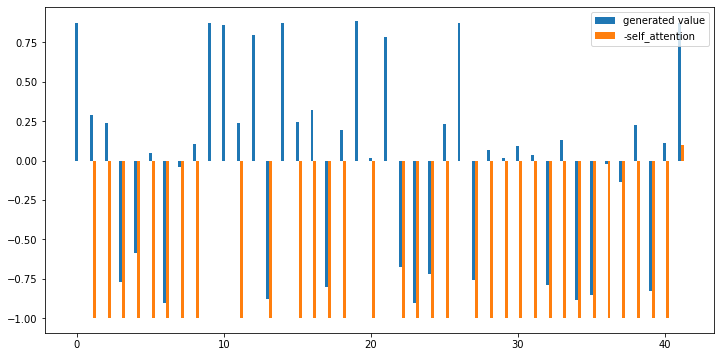

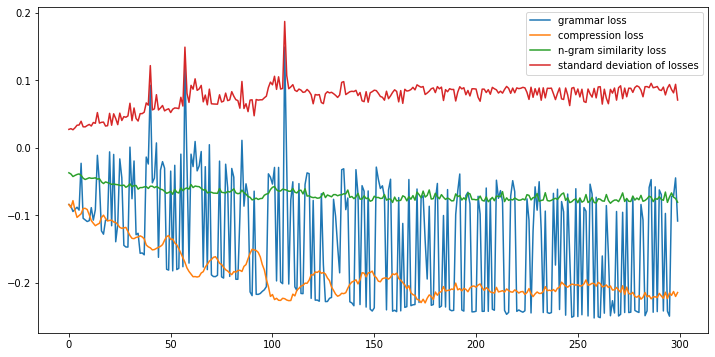

g 5.2361 	s 0.2433 	c 0.4157, score 2.0317, [최근 집값 상승세가 144 치솟으며 서울을 제외한 16개 시ㆍ도 중 높은 수치를 기록했고 주택을 포함한 전국 대비 4 오른 112 7을 기록했고 심리지수도 전달 6보다 4포인트 상승했다.]
g 5.2603 	s 0.2388 	c 0.4831, score 2.0987, [최근 집값 상승세가 치솟으며 서울을 제외한 16개 시ㆍ도 중 높은 수치를 기록했고 주택을 포함한 10월 전국 대비 4 오른 7을 기록했고 심리지수도 6보다 상승했다.]
g 4.9461 	s 0.2373 	c 0.4382, score 1.9998, [최근 상승세가 144 치솟으며 서울을 제외한 16개 시ㆍ도 중 높은 수치를 기록했고 주택을 포함한 10월 전국 대비 4 오른 112 7을 기록했고 심리지수도 전달 6보다 상승했다.]
g 3.5453 	s 0.2187 	c 0.4494, score 1.7590, [최근 상승세가 144 치솟으며 서울을 제외한 16개 시ㆍ도 중 높은 수치를 기록했고 주택을 포함한 전국 4 오른 112 7을 기록했고 심리지수도 전달 6보다 4포인트 상승했다.]
g 5.1849 	s 0.2280 	c 0.3933, score 1.9854, [최근 집값 상승세가 144 치솟으며 서울을 제외한 16개 시ㆍ도 중 높은 수치를 기록했고 주택을 포함한 10월 전국 대비 4 오른 112 7을 기록했고 심리지수도 전달 6보다 4포인트 상승했다.]
g -0.4575 	s 0.3635 	c 0.5449, score 1.2423, [최근 집값 상승세가 144 치솟으며 서울을 제외한 16개 중 높은 수치를 기록했고 주택을 포함한 전국 대비 4 7을 심리지수도 4포인트 상승했다.]
g 0.2215 	s 0.2457 	c 0.6011, score 1.1815, [최근 상승세가 144 서울을 제외한 16개 시ㆍ도 중 높은 수치를 포함한 전국 4 7을 기록했고 전달 6보다 4포인트 상승했다.]
g -4.7505 	s 0.2

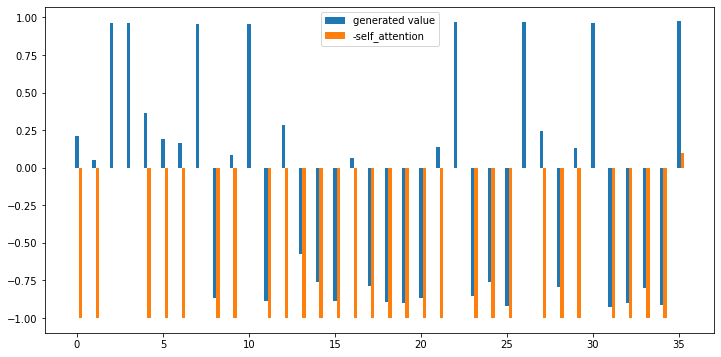

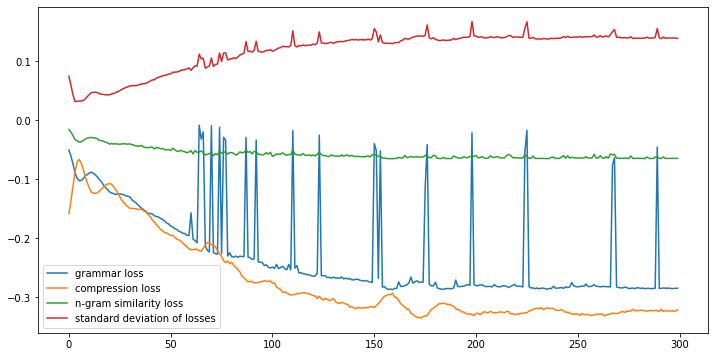

g 2.9104 	s 0.2279 	c 0.5658, score 1.6472, [8월 한 달 동안 수요예측에 나섰던 6곳 가운데 낮은 받았고 나노브릭이 증권사 관계자는 안 좋았다며 몰린 점도 말했다.]
g 3.0935 	s 0.2277 	c 0.5197, score 1.7236, [8월 한 달 동안 수요예측에 나섰던 6곳 가운데 희망범위보다 낮은 받았고 나노브릭이 증권사 관계자는 안 좋았다며 몰린 점도 말했다.]
g 3.2270 	s 0.2938 	c 0.5592, score 1.7725, [8월 한 달 동안 나섰던 6곳 가운데 희망범위보다 낮은 받았고 나노브릭이 증권사 관계자는 안 좋았다며 몰린 점도 말했다.]
g 2.5870 	s 0.2220 	c 0.5395, score 1.6137, [8월 한 달 동안 수요예측에 나섰던 가운데 희망범위보다 낮은 받았고 나노브릭이 증권사 관계자는 안 좋았다며 몰린 점도 말했다.]
g 5.0503 	s 0.2906 	c 0.5592, score 2.0731, [8월 한 달 동안 수요예측에 나섰던 6곳 가운데 희망범위보다 낮은 받았고 증권사 관계자는 안 좋았다며 몰린 점도 말했다.]
g 1.9132 	s 0.2936 	c 0.5395, score 1.5730, [8월 한 달 동안 수요예측에 나섰던 6곳 가운데 희망범위보다 낮은 받았고 나노브릭이 증권사 관계자는 안 좋았다며 점도 말했다.]
g 2.6486 	s 0.2799 	c 0.5855, score 1.6358, [8월 한 달 동안 6곳 가운데 희망범위보다 낮은 받았고 나노브릭이 증권사 관계자는 안 좋았다며 몰린 점도 말했다.]
g 3.2198 	s 0.3101 	c 0.5526, score 1.7941, [8월 한 달 동안 수요예측에 나섰던 6곳 가운데 희망범위보다 낮은 받았고 나노브릭이 증권사 관계자는 안 몰린 점도 말했다.]
요약률 0.5592 유사성 0.2906 문법성 5.0503 요약 [8월 한 달 동안 수요예측에 나섰던 6곳 가운데 희망범위보다 낮은 받았고 증권

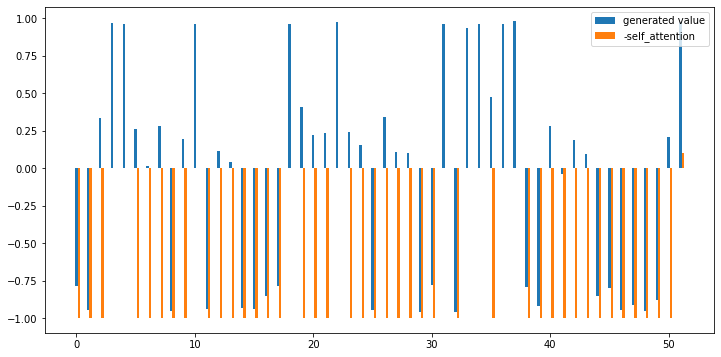

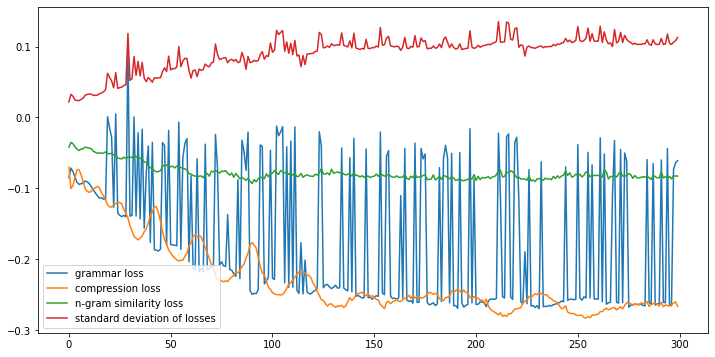

g 4.8307 	s 0.4741 	c 0.4882, score 2.2674, [공공교통 개념을 최초로 도입한 도시철도론을 저술하고 역할과 중요성을 또한 IMF이후 필요성을 제기하고 급행노선 신설 등 이용자 중심의 운영모델을 제시했고 KAIST와 무선 무선 트램 연구개발에 참여하는 등 지원했고 자문활동을 펼쳤다.]
g -5.4115 	s 0.3469 	c 0.7913, score 0.1537, [공공교통 개념을 최초로 역할과 중요성을 필요성을 등 이용자 무선 무선 트램 참여하는 등 펼쳤다.]
g -5.2352 	s 0.3522 	c 0.7126, score 0.2671, [공공교통 개념을 최초로 저술하고 역할과 중요성을 필요성을 제기하고 급행노선 등 중심의 제시했고 무선 무선 트램 참여하는 등 펼쳤다.]
g 4.8217 	s 0.2866 	c 0.4449, score 2.0351, [공공교통 개념을 최초로 도입한 도시철도론을 저술하고 역할과 중요성을 또한 IMF이후 필요성을 제기하고 급행노선 신설 등 이용자 중심의 운영모델을 제시했고 KAIST와 무선 무선 트램 연구개발에 참여하는 등 지원했고 국제기구 활동시에는 자문활동을 펼쳤다.]
g 4.9805 	s 0.4471 	c 0.4685, score 2.2457, [공공교통 개념을 최초로 도입한 도시철도론을 저술하고 역할과 중요성을 또한 IMF이후 필요성을 제기하고 급행노선 신설 등 이용자 중심의 운영모델을 제시했고 KAIST와 무선 무선 트램 연구개발에 참여하는 등 지원했고 국제기구 자문활동을 펼쳤다.]
g 4.9342 	s 0.5197 	c 0.4724, score 2.3145, [공공교통 개념을 최초로 도입한 도시철도론을 저술하고 역할과 중요성을 또한 IMF이후 필요성을 제기하고 급행노선 신설 등 이용자 중심의 운영모델을 제시했고 무선 무선 트램 연구개발에 참여하는 등 지원했고 국제기구 활동시에는 자문활동을 펼쳤다.]
g -1.1142 	s 0.4034 	c 0.5827, score 1.1350, [공공교통

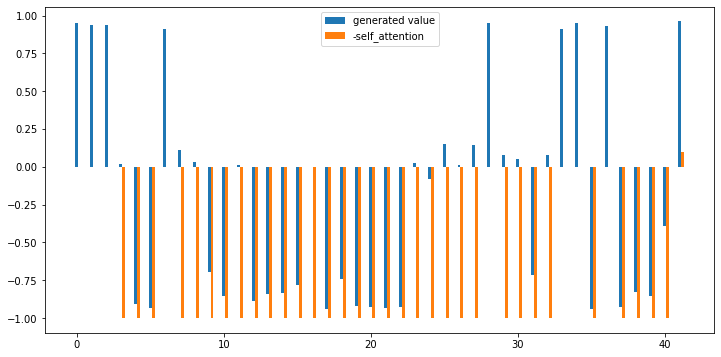

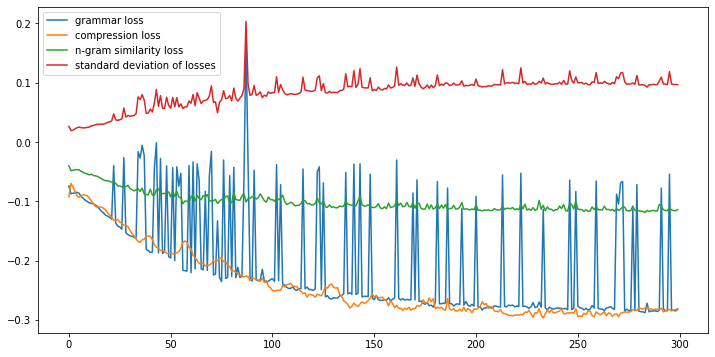

g 5.0233 	s 0.4001 	c 0.5054, score 2.2319, [또 단지 도보 3분 있으며 대구지하철 3호선 3분 가로주택정비사업 준공 예정은 2024년 8월이고 한국토지신탁 관계자는 연내 시공사 완료하는 것을 목표로 등 밝혔다.]
g 5.2038 	s 0.1312 	c 0.4731, score 1.9716, [또 단지 도보 3분 있으며 대구지하철 3호선 3분 가로주택정비사업 준공 예정은 2024년 8월이고 한국토지신탁 관계자는 연내 시공사 완료하는 것을 목표로 등 방침이라고 밝혔다.]
g -2.0368 	s 0.3584 	c 0.6344, score 0.8845, [또 단지 도보 3분 있으며 3호선 3분 준공 예정은 8월이고 한국토지신탁 관계자는 시공사 완료하는 것을 목표로 등 밝혔다.]
g 5.1478 	s 0.3741 	c 0.5269, score 2.2051, [또 단지 도보 3분 있으며 대구지하철 3호선 3분 가로주택정비사업 준공 예정은 2024년 8월이고 한국토지신탁 관계자는 연내 완료하는 것을 목표로 등 밝혔다.]
g -2.5218 	s 0.3648 	c 0.6613, score 0.7833, [또 단지 도보 있으며 대구지하철 3호선 3분 준공 예정은 8월이고 관계자는 연내 완료하는 것을 목표로 등 밝혔다.]
g 2.7090 	s 0.3618 	c 0.5215, score 1.7918, [또 단지 도보 있으며 대구지하철 3호선 3분 가로주택정비사업 준공 예정은 2024년 8월이고 한국토지신탁 관계자는 연내 시공사 완료하는 것을 목표로 등 밝혔다.]
g 4.8134 	s 0.3770 	c 0.6129, score 2.0663, [또 단지 도보 3분 있으며 대구지하철 3분 예정은 2024년 8월이고 한국토지신탁 관계자는 연내 완료하는 것을 목표로 등 밝혔다.]
g -4.9472 	s 0.3384 	c 0.7258, score 0.2881, [또 단지 도보 있으며 예정은 8월이고 한국토지신탁 관계자는 완료하는 것을 목표로 등 밝혔다.]


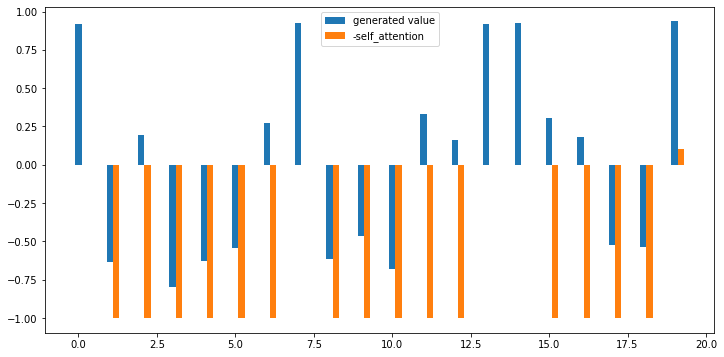

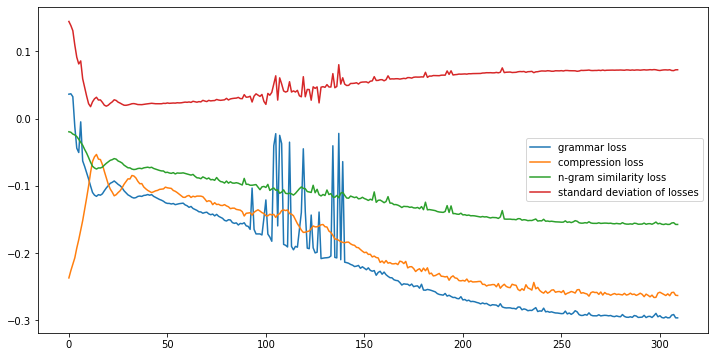

g 2.7265 	s 0.3347 	c 0.5229, score 1.7662, [해당 매수호가는 등락률 3위 9040원에 거래되고 있고 해당 종목의 매수호가는 9050원이다.]
g 2.5981 	s 0.3144 	c 0.5688, score 1.6787, [해당 매수호가는 등락률 3위 9040원에 있고 해당 종목의 매수호가는 9050원이다.]
요약률 0.5229 유사성 0.3347 문법성 2.7265 요약 [해당 매수호가는 등락률 3위 9040원에 거래되고 있고 해당 종목의 매수호가는 9050원이다.]
재시도 max score:1.7662034214272047 grammar:2.72648024559021 text:해당 매수호가는 등락률 3위 9040원에 거래되고 있고 해당 종목의 매수호가는 9050원이다.
--------------------------------------------------
해당 종목의 매수호가는 2345원 매도호가는 2350원이다. 등락률 3위 EG종목의 등락률은-0 77%이며 9040원에 거래되고 있다. 해당 종목의 매수호가는 9040원 매도호가는 9050원이다.
--------------------------------------------------
Length ------------------------------------| 20
{0: 0.0, 1: -1.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: -1.0, 7: 0.0, 8: -1.0, 9: -1.0, 10: -1.0, 11: -1.0, 12: -1.0, 13: 0.0, 14: 0.0, 15: -1.0, 16: -1.0, 17: -1.0, 18: -1.0, 19: 0.1}
Train... |||||||||||||||||||||| 100.0%   320/320 epochs, gl:0.00737615  sl:-0.0034 ll:-0.0089


--------------------------------------------------
해당 종목의 

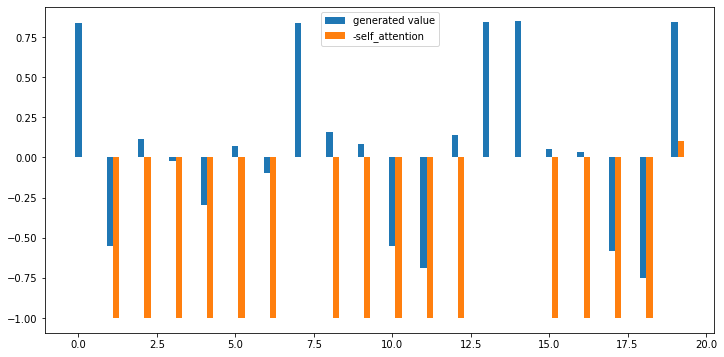

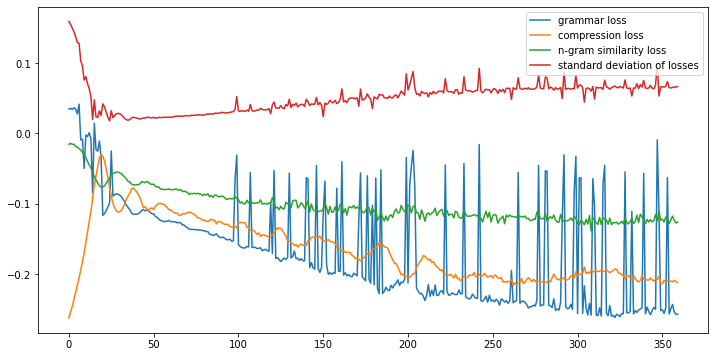

g 2.7994 	s 0.2540 	c 0.3394, score 1.5601, [해당 매수호가는 2345원 2350원이고 등락률 3위 EG종목의 등락률은-0 거래되고 있고 해당 종목의 매수호가는 9050원이다.]
g 1.9059 	s 0.2297 	c 0.4128, score 1.4602, [해당 매수호가는 2345원 2350원이고 3위 EG종목의 등락률은-0 거래되고 있고 해당 매수호가는 9050원이다.]
g 2.4167 	s 0.2505 	c 0.3761, score 1.5294, [해당 매수호가는 2345원 2350원이고 3위 EG종목의 등락률은-0 거래되고 있고 해당 종목의 매수호가는 9050원이다.]
g -4.0286 	s 0.3427 	c 0.5780, score 0.5933, [해당 2350원이고 3위 EG종목의 등락률은-0 거래되고 있고 해당 9050원이다.]
g 2.6408 	s 0.2261 	c 0.3761, score 1.5424, [해당 매수호가는 2345원 2350원이고 등락률 3위 EG종목의 등락률은-0 거래되고 있고 해당 매수호가는 9050원이다.]
g -1.4401 	s 0.2959 	c 0.5229, score 1.0329, [해당 매수호가는 2350원이고 3위 EG종목의 등락률은-0 거래되고 있고 해당 9050원이다.]
g 2.2940 	s 0.2612 	c 0.4679, score 1.6114, [해당 매수호가는 2350원이고 3위 EG종목의 등락률은-0 거래되고 있고 해당 매수호가는 9050원이다.]
g -0.2216 	s 0.2916 	c 0.4312, score 1.1858, [해당 매수호가는 2345원 2350원이고 등락률 3위 EG종목의 등락률은-0 거래되고 있고 해당 9050원이다.]
g 2.3873 	s 0.2387 	c 0.4220, score 1.5586, [해당 매수호가는 2345원 2350원이고 등락률 3위 EG종목의 등락률은-0 있고 해당 매수호가는 9050원이다.]
g 0.6199 	s 0.3612 	c

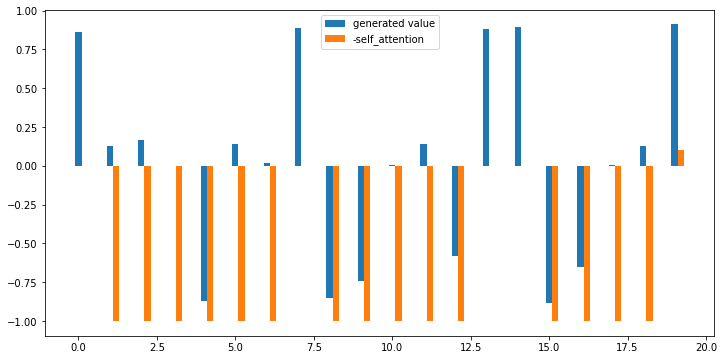

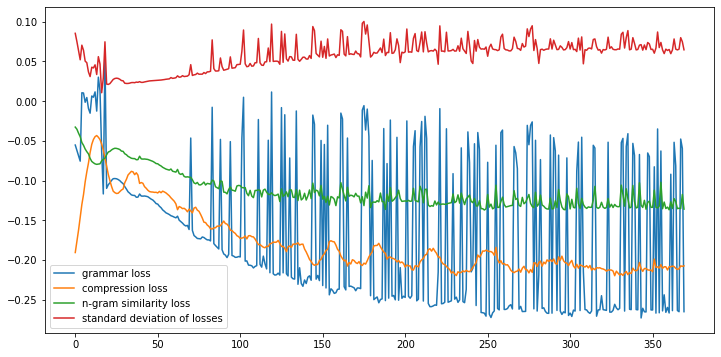

g -0.7584 	s 0.3052 	c 0.4771, score 1.1558, [해당 종목의 매수호가는 2350원이고 3위 77%이며 9040원에 있고 해당 9040원 9050원이다.]
g 2.0276 	s 0.1193 	c 0.3303, score 1.2875, [해당 종목의 매수호가는 2345원 2350원이고 등락률 3위 77%이며 9040원에 있고 해당 9040원 매도호가는 9050원이다.]
g -1.2927 	s 0.4567 	c 0.6881, score 1.0531, [해당 매수호가는 2350원이고 3위 있고 해당 9050원이다.]
g -0.6060 	s 0.1610 	c 0.3670, score 0.9270, [해당 매수호가는 2345원 2350원이고 등락률 3위 77%이며 9040원에 있고 해당 9040원 매도호가는 9050원이다.]
g -3.4163 	s 0.4542 	c 0.7064, score 0.6784, [해당 2350원이고 등락률 3위 있고 해당 9050원이다.]
g 1.8811 	s 0.1783 	c 0.3853, score 1.3771, [해당 종목의 매수호가는 2350원이고 등락률 3위 77%이며 9040원에 있고 해당 9040원 매도호가는 9050원이다.]
g -5.2471 	s 0.4154 	c 0.5596, score 0.4812, [해당 종목의 2345원 2350원이고 등락률 3위 77%이며 있고 해당 9050원이다.]
g 2.5908 	s 0.2559 	c 0.5046, score 1.6831, [해당 종목의 매수호가는 2345원 2350원이고 등락률 3위 있고 해당 매도호가는 9050원이다.]
g 3.0864 	s 0.3086 	c 0.5321, score 1.7909, [해당 종목의 매수호가는 2350원이고 3위 9040원에 있고 해당 매도호가는 9050원이다.]
g 2.1369 	s 0.2907 	c 0.4771, score 1.6239, [해당 종목의 매수호가는 2350원이고 3위 9040원에 있고 해당 9040원

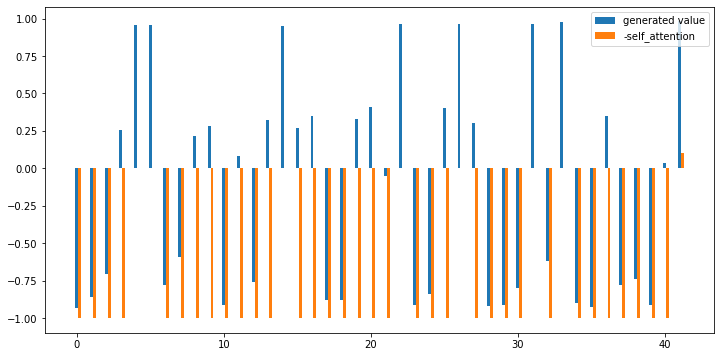

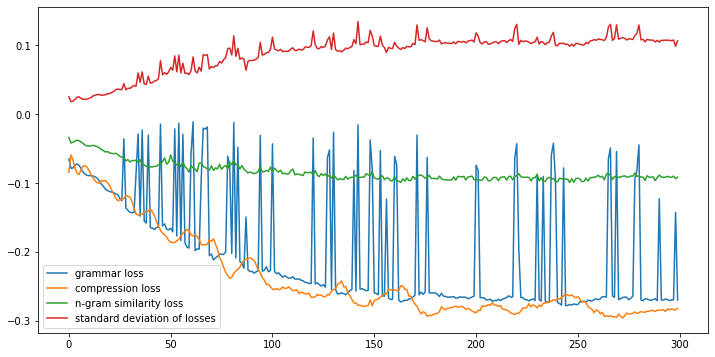

g 2.9533 	s 0.1461 	c 0.5085, score 1.6298, [홀더가 된 것은 아시아 투수가 1위에 것도 처음이고 사이영상 투표에서 아시아 투수도 류현진이 처음이고 다르빗슈 유 이와쿠마 등 대표하는 특급’ 받지 못했다.]
g 3.7989 	s 0.3802 	c 0.5367, score 1.9767, [홀더가 된 것은 아시아 투수가 1위에 것도 처음이고 사이영상 투표에서 아시아 투수도 처음이고 다르빗슈 유 이와쿠마 등 대표하는 특급’ 받지 못했다.]
g 2.2674 	s 0.4828 	c 0.5593, score 1.8013, [홀더가 된 것은 아시아 투수가 것도 처음이고 사이영상 투표에서 아시아 투수도 처음이고 다르빗슈 유 이와쿠마 등 대표하는 특급’ 받지 못했다.]
g 2.5729 	s 0.4069 	c 0.5367, score 1.7990, [홀더가 된 것은 아시아 투수가 1위에 것도 처음이고 사이영상 투표에서 아시아 투수도 류현진이 처음이고 유 이와쿠마 등 대표하는 특급’ 받지 못했다.]
g 2.4651 	s 0.4542 	c 0.5650, score 1.8000, [홀더가 된 것은 아시아 투수가 1위에 것도 처음이고 사이영상 투표에서 아시아 투수도 처음이고 유 이와쿠마 등 대표하는 특급’ 받지 못했다.]
g 5.2325 	s 0.5029 	c 0.5763, score 2.2987, [홀더가 된 것은 아시아 투수가 처음이고 사이영상 투표에서 아시아 투수도 처음이고 다르빗슈 유 이와쿠마 등 대표하는 특급’ 받지 못했다.]
g -1.3181 	s 0.5206 	c 0.5593, score 1.2416, [된 것은 아시아 투수가 1위에 것도 처음이고 사이영상 투표에서 아시아 투수도 처음이고 다르빗슈 유 이와쿠마 등 대표하는 특급’ 받지 못했다.]
g -1.2769 	s 0.0811 	c 0.6215, score 0.7468, [홀더가 된 것은 아시아 처음이고 사이영상 투표에서 투수도 처음이고 다르빗슈 유 이와쿠마 등 대표하는 특급’ 받지 못했

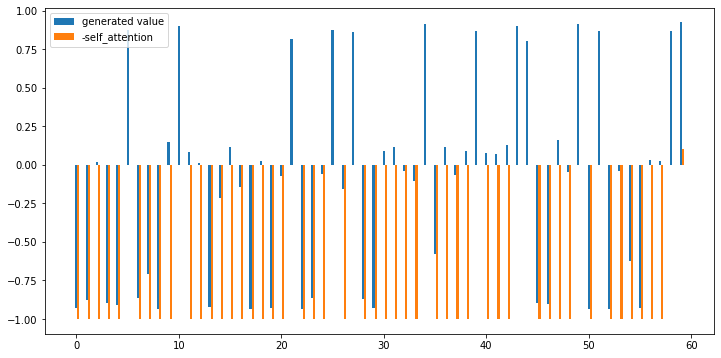

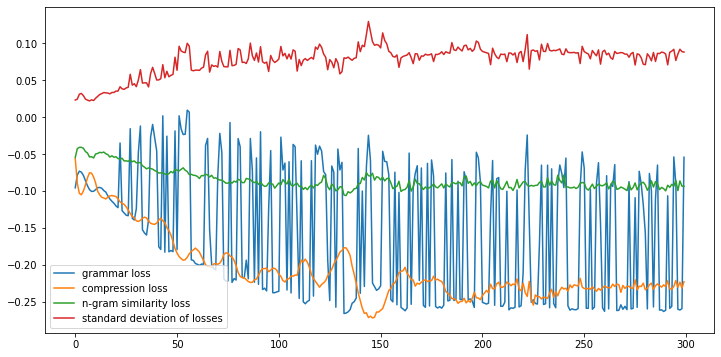

g 5.2348 	s 0.3984 	c 0.4398, score 2.2107, [군에게 뒤 주먹과 발로 때리다 사망케 파악하고 직업학교에서 만난 심부름을 시키고 ‘말을 듣지 것으로 조사됐고 경찰은 최군의 방에서 청소 도구나 우산·목발 등이 발견된데다 A군의 시신 여러 곳에서 발견된 점 등을 사망 보고 수사를 할 방침이다.]
g -5.0252 	s 0.2704 	c 0.5851, score 0.3478, [군에게 뒤 발로 사망케 파악하고 있고 만난 시키고 ‘말을 듣지 조사됐고 경찰은 방에서 청소 도구나 등이 발견된데다 A군의 여러 곳에서 점 등을 사망 상습폭행이 수사를 할 방침이다.]
g -1.8053 	s 0.1799 	c 0.5975, score 0.7815, [뒤 주먹과 발로 때리다 파악하고 있고 만난 심부름을 시키고 듣지 경찰은 최군의 방에서 청소 도구나 우산·목발 등이 A군의 시신 여러 곳에서 발견된 점 등을 사망 할 방침이다.]
g -1.0527 	s 0.3406 	c 0.5104, score 1.1548, [군에게 뒤 주먹과 발로 때리다 사망케 파악하고 지난 만난 시키고 ‘말을 듣지 것으로 조사됐고 경찰은 방에서 청소 도구나 우산·목발 등이 A군의 시신 여러 곳에서 발견된 점 등을 사망 상습폭행이 보고 할 방침이다.]
g 5.2131 	s 0.3695 	c 0.4564, score 2.1948, [군에게 뒤 주먹과 발로 사망케 파악하고 있고 지난 직업학교에서 만난 심부름을 시키고 ‘말을 듣지 것으로 조사됐고 경찰은 최군의 방에서 청소 도구나 우산·목발 등이 발견된데다 A군의 여러 곳에서 발견된 점 등을 사망 수사를 할 방침이다.]
g 5.1895 	s 0.3470 	c 0.3900, score 2.1020, [군에게 뒤 주먹과 발로 때리다 사망케 파악하고 있고 지난 직업학교에서 만난 심부름을 시키고 ‘말을 듣지 것으로 조사됐고 경찰은 최군의 방에서 청소 도구나 우산·목발 등이 발견된데다 A군의 시신 여러 곳에서 발견된 점 등을 사망 상습폭행이 보고 

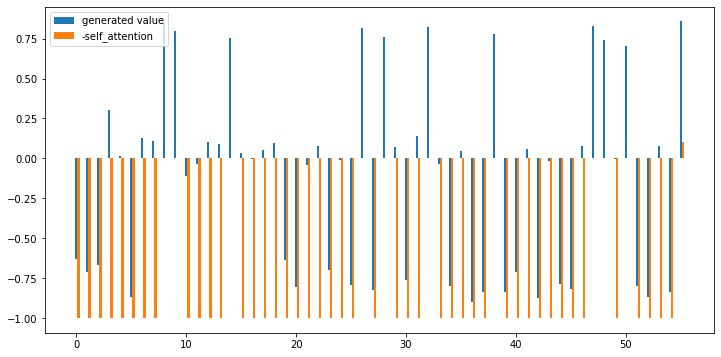

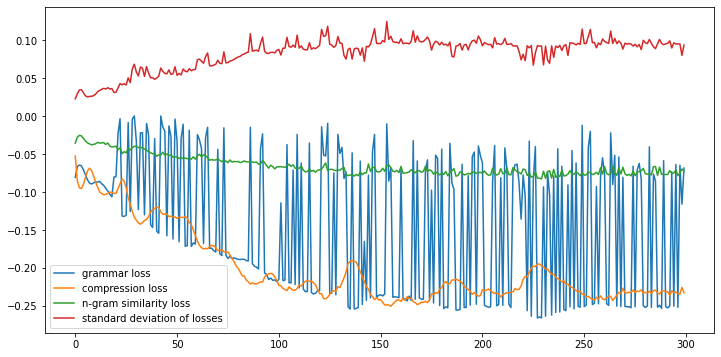

g 4.8090 	s 0.6500 	c 0.4444, score 2.3959, [결정을 강요하는 결정장애를 부추길 뿐이고 이제 선택을 하지 않은 것 또한 생각할 수 있는 때이다 2016년부터 M 인기 프로그램 프로듀스 인해 대국민 되면서 하나의 원픽족은 파생된 상황 속에서 당당하게 자신이 원하는 행동하는 뜻한다.]
g -2.8195 	s 0.4648 	c 0.6068, score 0.8880, [결정을 강요하는 부추길 뿐이고 이제 선택을 않은 것 또한 생각할 있는 인기 프로그램 프로듀스 시리즈로 인해 대국민 되면서 하나의 상황 속에서 당당하게 원하는 뜻한다.]
g -1.2647 	s 0.4594 	c 0.4957, score 1.2444, [결정을 강요하는 결정장애를 부추길 뿐이고 이제 하지 않은 것 또한 선택이라 생각할 있는 2016년부터 M 인기 프로그램 프로듀스 시리즈로 인해 되면서 하나의 원픽족은 상황 속에서 당당하게 원하는 행동하는 뜻한다.]
g 5.2421 	s 0.6074 	c 0.4017, score 2.3828, [결정을 강요하는 결정장애를 부추길 뿐이고 이제 선택을 하지 않은 것 또한 선택이라 생각할 수 있는 때이다 2016년부터 M 인기 프로그램 프로듀스 시리즈로 인해 대국민 되면서 하나의 원픽족은 파생된 상황 속에서 당당하게 자신이 원하는 행동하는 뜻한다.]
g 5.2465 	s 0.6350 	c 0.4103, score 2.4197, [결정을 강요하는 결정장애를 부추길 뿐이고 이제 선택을 하지 않은 것 또한 선택이라 생각할 수 있는 때이다 2016년부터 인기 프로그램 프로듀스 시리즈로 인해 대국민 되면서 하나의 원픽족은 파생된 상황 속에서 당당하게 자신이 원하는 행동하는 뜻한다.]
g 5.2595 	s 0.4972 	c 0.4188, score 2.2926, [결정을 강요하는 결정장애를 부추길 뿐이고 이제 선택을 하지 않은 것 또한 선택이라 생각할 수 있는 2016년부터 M 인기 프로그램 프로듀스 시리즈로 인해 대국민 되면서 하나의 원픽

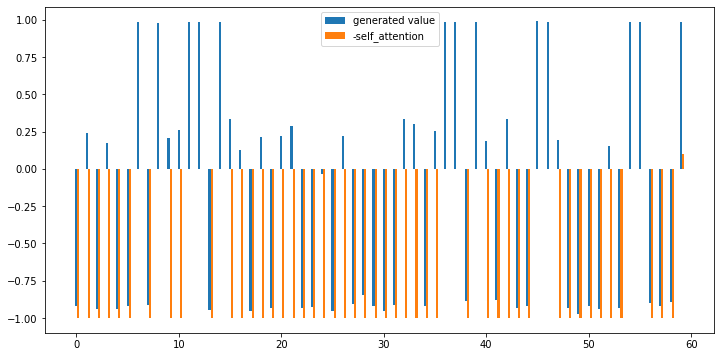

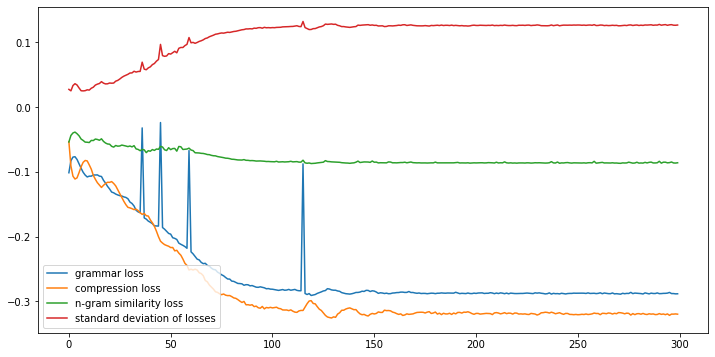

g 5.2549 	s 0.2817 	c 0.5191, score 2.1384, [공수처설치법과 수사권 묶어 처리 안건)으로 처리하려는 데 대해 불만을 표시한 것이고 대표는 자신의 페이스북 글에서도 정권의 이들 인맥은 좌파 언론 시민단체 등 우리 곳곳에 시대에 필요한 발상과 뿌리에서는 피지 않는고 비판했다.]
g 5.2241 	s 0.3683 	c 0.5344, score 2.2046, [공수처설치법과 묶어 처리 안건)으로 처리하려는 데 대해 불만을 표시한 것이고 대표는 자신의 페이스북 글에서도 정권의 이들 인맥은 좌파 언론 시민단체 등 우리 곳곳에 시대에 필요한 발상과 뿌리에서는 피지 않는고 비판했다.]
g 5.2388 	s 0.2995 	c 0.5305, score 2.1421, [공수처설치법과 수사권 묶어 처리 안건)으로 처리하려는 데 대해 불만을 표시한 것이고 대표는 자신의 페이스북 글에서도 정권의 이들 인맥은 좌파 언론 시민단체 등 곳곳에 시대에 필요한 발상과 뿌리에서는 피지 않는고 비판했다.]
g 5.0143 	s 0.3609 	c 0.5458, score 2.1509, [공수처설치법과 수사권 묶어 처리 안건)으로 처리하려는 데 대해 불만을 표시한 것이고 대표는 자신의 페이스북 글에서도 정권의 이들 좌파 언론 시민단체 등 곳곳에 시대에 필요한 발상과 뿌리에서는 피지 않는고 비판했다.]
g 5.2469 	s 0.0043 	c 0.5534, score 1.8253, [공수처설치법과 수사권 묶어 처리 안건)으로 처리하려는 데 대해 불만을 표시한 것이고 대표는 자신의 페이스북 정권의 이들 인맥은 좌파 언론 시민단체 등 우리 곳곳에 시대에 필요한 뿌리에서는 피지 않는고 비판했다.]
g 5.2535 	s 0.1128 	c 0.5496, score 1.9387, [공수처설치법과 묶어 처리 안건)으로 처리하려는 데 대해 불만을 표시한 대표는 자신의 페이스북 글에서도 정권의 이들 인맥은 좌파 언론 시민단체 등 우리 곳곳에 시대에 필요한 발상과 뿌리에서는 피지 않는고 

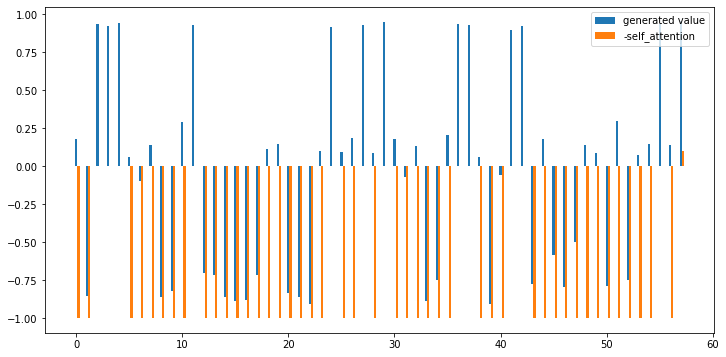

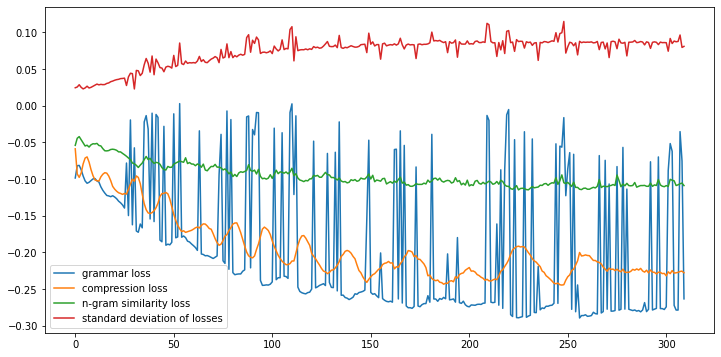

g 5.2566 	s 0.2436 	c 0.3794, score 1.9992, [변호인들도 비밀을 아직 모르는 제3자에게 알리는 행위를 비위 상황을 누설에 해당하지 보호해야할 것은 비밀 자체가 아니라 국가이익이기 때문에 국익이 침해되지 않았다면 혐의로 볼 수 없다고 공모 관계에 대해선 부장판사는) 사실이 없고 부장판사는) 지시를 전달받은 적이 없다고 부인했다.]
g 5.2456 	s 0.2284 	c 0.3913, score 1.9940, [변호인들도 비밀을 아직 모르는 제3자에게 알리는 행위를 비위 상황을 누설에 해당하지 보호해야할 것은 비밀 자체가 아니라 국가이익이기 때문에 국익이 침해되지 않았다면 혐의로 볼 수 없다고 관계에 대해선 부장판사는) 사실이 없고 부장판사는) 지시를 전달받은 적이 없다고 부인했다.]
g -2.1252 	s 0.3025 	c 0.5415, score 0.9068, [변호인들도 비밀을 아직 모르는 행위를 상황을 해당하지 보호해야할 것은 비밀 자체가 아니라 때문에 국익이 침해되지 않았다면 혐의로 볼 수 관계에 대해선 사실이 부장판사는) 지시를 전달받은 적이 없다고 부인했다.]
g 5.0948 	s 0.2140 	c 0.4150, score 1.9782, [변호인들도 비밀을 아직 모르는 알리는 행위를 비위 상황을 누설에 해당하지 보호해야할 것은 비밀 자체가 아니라 국가이익이기 때문에 국익이 침해되지 않았다면 혐의로 볼 수 없다고 관계에 대해선 부장판사는) 사실이 없고 부장판사는) 지시를 전달받은 적이 없다고 부인했다.]
g 4.9821 	s 0.4079 	c 0.5336, score 2.2047, [비밀을 아직 모르는 행위를 상황을 보호해야할 것은 비밀 자체가 아니라 국가이익이기 때문에 국익이 침해되지 않았다면 볼 수 없다고 관계에 대해선 부장판사는) 사실이 없고 부장판사는) 지시를 전달받은 적이 부인했다.]
g 5.0097 	s 0.2443 	c 0.4071, score 1.9864, [변호인들도 비밀을 아직 모르는 제3자에게 행위를

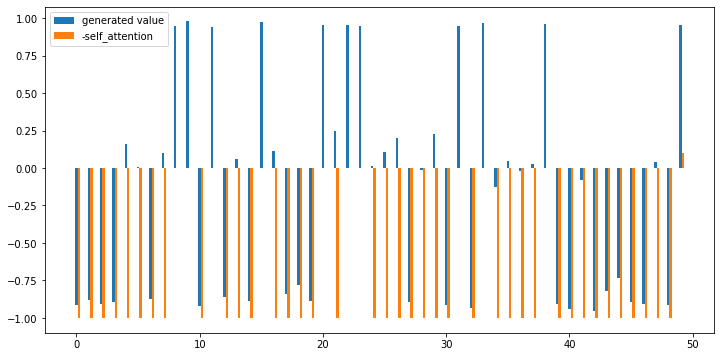

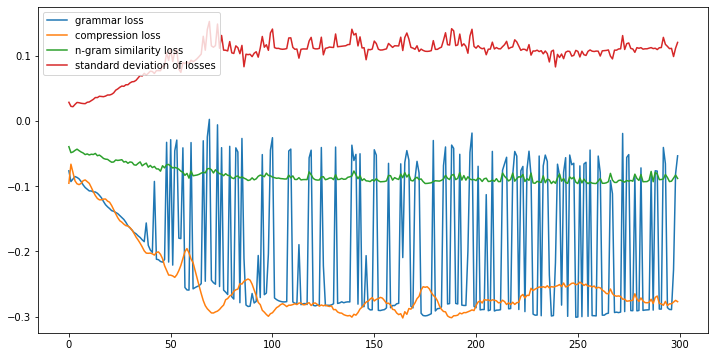

g -2.5429 	s 0.4477 	c 0.5404, score 0.9835, [터널 본 것으로 추정되는 대해 정밀 진단을 요구했고 통해 정밀안전 진단을 할 계획이나 입회하에 정밀 진단을 한동안 진통이 이어질 전망이고 29일 열린 축사를 있다.]
g 4.3295 	s 0.4881 	c 0.4495, score 2.1592, [터널 개통으로 본 것으로 추정되는 대해 정밀 진단을 요구했고 통해 정밀안전 진단을 할 계획이나 주민들은 법원 입회하에 정밀 진단을 한동안 진통이 이어질 전망이고 29일 열린 개통식에 축사를 있다.]
g 3.2879 	s 0.5016 	c 0.4747, score 2.0243, [터널 개통으로 본 것으로 추정되는 대해 정밀 진단을 요구했고 통해 진단을 할 계획이나 주민들은 법원 입회하에 정밀 진단을 한동안 진통이 이어질 전망이고 29일 열린 개통식에 축사를 있다.]
g 3.7868 	s 0.5330 	c 0.4646, score 2.1288, [개통으로 본 것으로 추정되는 대해 정밀 진단을 요구했고 통해 정밀안전 진단을 할 계획이나 주민들은 법원 입회하에 정밀 진단을 한동안 진통이 이어질 전망이고 29일 열린 개통식에 축사를 있다.]
g 3.6075 	s 0.5128 	c 0.4697, score 2.0838, [터널 개통으로 본 것으로 추정되는 대해 정밀 진단을 요구했고 통해 정밀안전 진단을 할 계획이나 주민들은 법원 입회하에 정밀 진단을 한동안 이어질 전망이고 29일 열린 개통식에 축사를 있다.]
g -4.2142 	s 0.4780 	c 0.6667, score 0.6090, [개통으로 본 것으로 추정되는 대해 정밀 진단을 통해 진단을 할 진단을 한동안 진통이 이어질 전망이고 29일 열린 있다.]
g 1.9627 	s 0.2542 	c 0.5707, score 1.5107, [개통으로 본 것으로 추정되는 대해 정밀 진단을 요구했고 통해 진단을 할 계획이나 주민들은 법원 진단을 한동안 이어질 전망이고 29일 열린 개통식에 있다.]
g 3

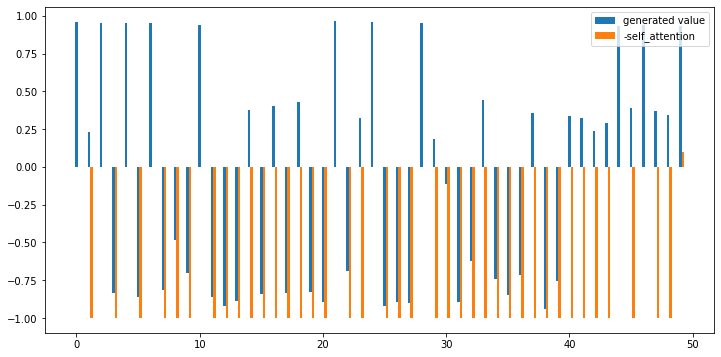

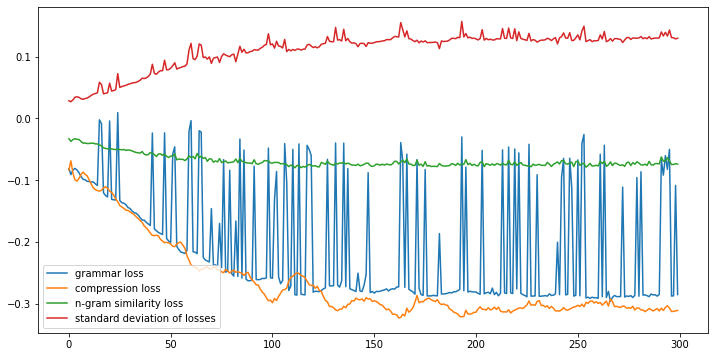

g 4.5702 	s 0.1123 	c 0.5251, score 1.8488, [또한 수술 후에도 결과를 유지하고 위해 최병준 양악수술은 요구하는 치료이기 때문에 돼야 한다라면서 개선되는 안 효과는 교합이 개선되면서 안모 비율 개선이 함께 따라오는 것이라고 강조한다.]
g 4.6541 	s 0.1563 	c 0.4886, score 1.9206, [또한 수술 후에도 결과를 유지하고 위해 최병준 구강악안면외과 양악수술은 요구하는 치료이기 때문에 돼야 한다라면서 개선되는 안 효과는 교합이 개선되면서 안모 비율 개선이 함께 따라오는 것이라고 강조한다.]
g -2.7395 	s 0.3119 	c 0.5708, score 0.7845, [또한 수술 후에도 결과를 유지하고 위해 최병준 양악수술은 요구하는 때문에 돼야 한다라면서 개선되는 안 효과는 교합이 개선되면서 안모 비율 개선이 함께 따라오는 강조한다.]
g 4.6203 	s 0.0237 	c 0.4749, score 1.7686, [또한 수술 후에도 결과를 유지하고 위해 최병준 구강악안면외과 양악수술은 요구하는 치료이기 때문에 돼야 한다라면서 수술 개선되는 안 효과는 교합이 개선되면서 안모 비율 개선이 함께 따라오는 것이라고 강조한다.]
g 3.8408 	s 0.1340 	c 0.5708, score 1.7033, [또한 수술 후에도 결과를 유지하고 위해 최병준 요구하는 치료이기 때문에 돼야 한다라면서 개선되는 안 효과는 개선되면서 안모 비율 개선이 함께 따라오는 것이라고 강조한다.]
g -2.8258 	s 0.1282 	c 0.5616, score 0.5956, [또한 수술 후에도 결과를 유지하고 위해 최병준 구강악안면외과 양악수술은 요구하는 치료이기 때문에 돼야 개선되는 안 효과는 교합이 안모 비율 함께 따라오는 것이라고 강조한다.]
g 3.0109 	s 0.0906 	c 0.5890, score 1.5033, [또한 수술 후에도 결과를 유지하고 위해 최병준 요구하는 치료이기 때문에 돼야 개선되는 효과는 교합이 

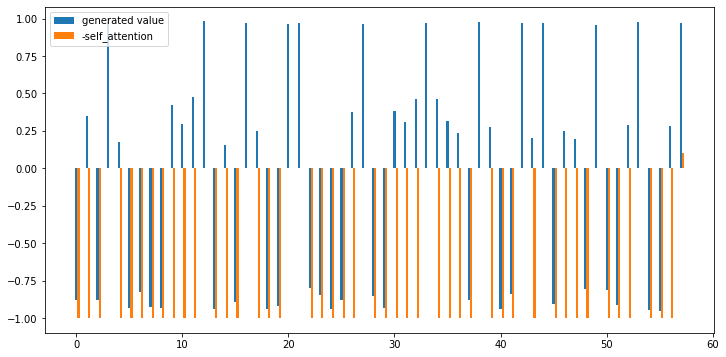

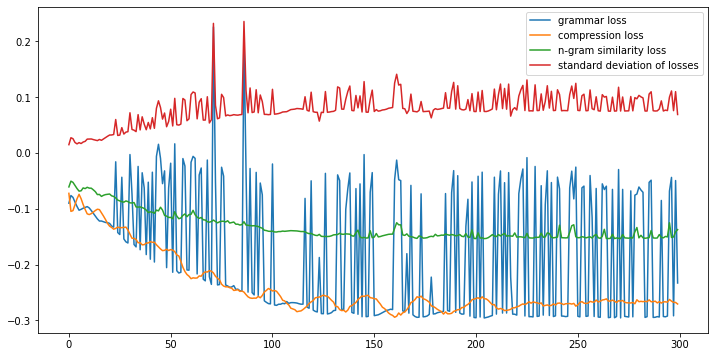

g 4.8509 	s 0.0189 	c 0.4702, score 1.7975, [국선대리인제도를 위해 행정청의 신청방법을 안내토록 했고 또 안내하는 등을 각급 영상을 통해 게시할 계획이고 행정심판국장은 행정심판 국선대리인제도를 통해 힘없고 소외된 서민들의 한층 강화될 적극적인 제도운영을 통해 국선대리인이 사회적 위한 자리매김할 수 나가겠다고 말했다.]
g -5.4579 	s -0.0470 	c 0.7053, score -0.1619, [위해 행정청의 안내토록 또 등을 영상을 통해 계획이고 행정심판 국선대리인제도를 통해 서민들의 한층 적극적인 제도운영을 통해 위한 수 나가겠다고 말했다.]
g -3.0131 	s 0.3843 	c 0.5333, score 0.8488, [국선대리인제도를 위해 행정청의 안내토록 했고 또 안내하는 등을 각급 영상을 통해 게시할 계획이고 행정심판국장은 행정심판 국선대리인제도를 통해 힘없고 소외된 서민들의 한층 강화될 적극적인 제도운영을 통해 국선대리인이 사회적 위한 수 말했다.]
g 5.0889 	s 0.0050 	c 0.4982, score 1.8514, [국선대리인제도를 위해 행정청의 신청방법을 안내토록 했고 또 안내하는 등을 각급 영상을 통해 게시할 계획이고 행정심판 국선대리인제도를 통해 힘없고 소외된 서민들의 한층 강화될 적극적인 제도운영을 통해 국선대리인이 사회적 위한 자리매김할 수 나가겠다고 말했다.]
g 3.5278 	s 0.0368 	c 0.4842, score 1.6090, [국선대리인제도를 위해 행정청의 신청방법을 안내토록 했고 또 안내하는 등을 각급 영상을 통해 게시할 계획이고 행정심판국장은 행정심판 국선대리인제도를 통해 힘없고 서민들의 한층 강화될 적극적인 제도운영을 통해 국선대리인이 사회적 위한 자리매김할 수 나가겠다고 말했다.]
g -5.3008 	s 0.0544 	c 0.5649, score 0.1060, [국선대리인제도를 위해 행정청의 신청방법을 안내토록 했고 또 등을 각급 영상을 통해 계획이고 행정심판 국

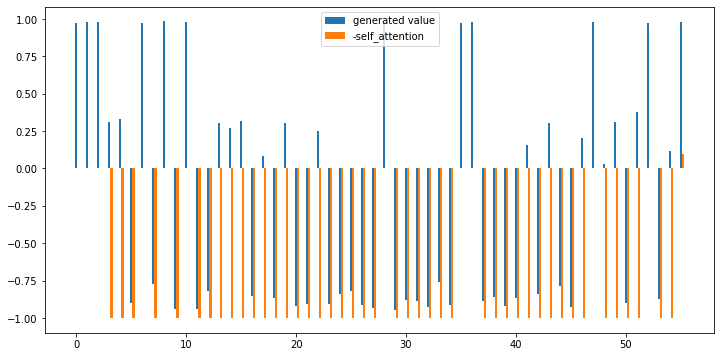

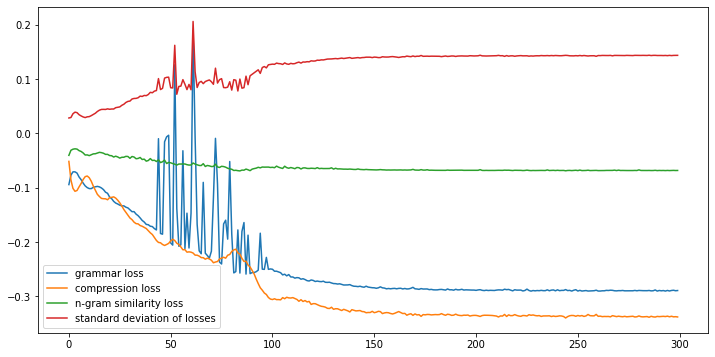

g -0.6161 	s 0.1082 	c 0.5932, score 0.9124, [아울러 이미 국내 항공사들이 신청한 노선 모두 의해 나타났고 노선은 부산·무안~장자제 △티웨이항공 부산~옌지 등 등 다른 아쉽다”며 기존 올라가는 등 반드시 나쁜 있는 것은 것”이라고 말했다.]
g 4.6280 	s 0.1054 	c 0.5779, score 1.7988, [아울러 이미 국내 항공사들이 신청한 노선 모두 의해 나타났고 반려된 노선은 부산·무안~장자제 △티웨이항공 부산~옌지 등 등 다른 아쉽다”며 기존 올라가는 등 반드시 나쁜 있는 것은 것”이라고 말했다.]
g 4.2513 	s 0.0894 	c 0.5970, score 1.7010, [아울러 이미 국내 항공사들이 신청한 노선 모두 의해 나타났고 반려된 노선은 부산·무안~장자제 △티웨이항공 부산~옌지 등 등 다른 아쉽다”며 기존 등 반드시 나쁜 있는 것은 것”이라고 말했다.]
g -1.0721 	s 0.1274 	c 0.5932, score 0.8556, [아울러 이미 국내 항공사들이 노선 모두 의해 나타났고 반려된 노선은 부산·무안~장자제 △티웨이항공 부산~옌지 등 등 다른 아쉽다”며 기존 올라가는 등 반드시 나쁜 있는 것은 것”이라고 말했다.]
g 4.3437 	s 0.0539 	c 0.5932, score 1.6847, [아울러 이미 국내 항공사들이 신청한 노선 모두 의해 나타났고 반려된 노선은 부산·무안~장자제 △티웨이항공 부산~옌지 등 등 다른 아쉽다”며 기존 올라가는 등 나쁜 있는 것은 것”이라고 말했다.]
g 5.1899 	s 0.0693 	c 0.5894, score 1.8449, [아울러 이미 국내 항공사들이 신청한 노선 모두 의해 나타났고 반려된 노선은 부산·무안~장자제 △티웨이항공 부산~옌지 등 등 다른 아쉽다”며 기존 올라가는 등 반드시 있는 것은 것”이라고 말했다.]
요약률 0.5894 유사성 0.0693 문법성 5.1899 요약 [아울러 이미 국내 항공사들이 신청한 노선 모두 의해 나타났고

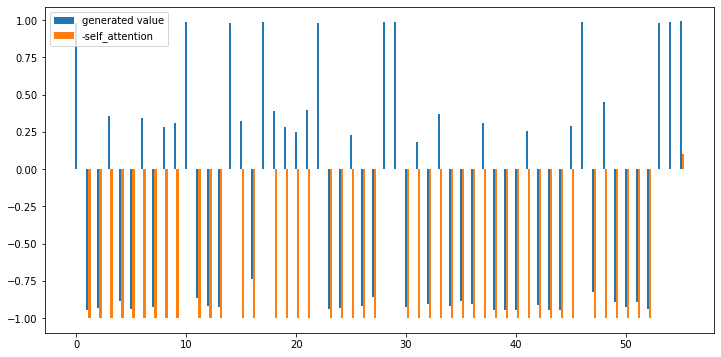

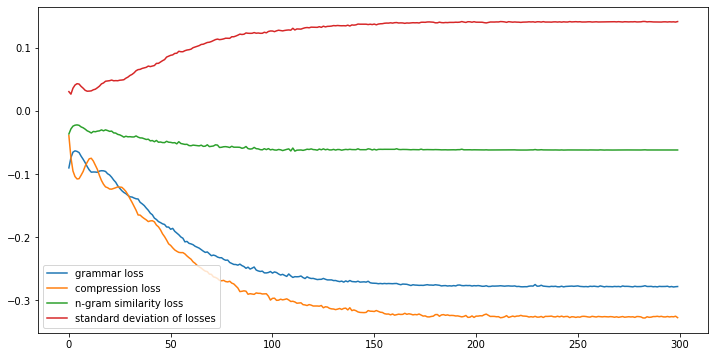

g 5.2325 	s -0.1194 	c 0.5402, score 1.7125, [한편 19일 홈경기에서 김주공의 멀티골에 힘입어 데 성공한데 라이벌 부산이 안산에게 0-2 패배함에 따라 남겨두고 모두 하나로 뭉쳐 2년만의 최다득점 필두로 최소실점(26실점)에 빛나는 K리그2 등의 기록을 남겼다.]
요약률 0.5402 유사성 -0.1194 문법성 5.2325 요약 [한편 19일 홈경기에서 김주공의 멀티골에 힘입어 데 성공한데 라이벌 부산이 안산에게 0-2 패배함에 따라 남겨두고 모두 하나로 뭉쳐 2년만의 최다득점 필두로 최소실점(26실점)에 빛나는 K리그2 등의 기록을 남겼다.]
--------------------------------------------------
한편 19일 홈경기에서 김주공의 멀티골에 힘입어 데 성공한데 라이벌 부산이 안산에게 0-2 패배함에 따라 남겨두고 모두 하나로 뭉쳐 2년만의 최다득점 필두로 최소실점(26실점)에 빛나는 K리그2 등의 기록을 남겼다. 1.7124814557275552 5.232484817504883
================================================== Original Document 156==================================================
“우승 기쁨 함께 누려요 ” 구단 사상 처음으로 우승을 확정지은 프로축구 광주FC가 11월 3일 오후 3시 광주월드컵경기장에서 우승 세리머니로 팬들과 기쁨을 함께 나눈다.
광주는 최근 “광주월드컵경기장에서 열리는 전남드래곤즈와의 홈폐막전에서 K리그2 우승을 기념하는 행사를 연다”고 밝혔다.
광주는 홈 폐막전을 맞아 다채로운 이벤트를 준비했다.
남문광장에서 KT&G 상상유니브와 함께하는 플리마켓을 통해 선수단 애장품을 판매, 수익금은 국민 재산과 신체 보호에 힘쓰는 소방관들의 방화복 및 건조기 기증을 위해 쓰여진다.
또 남문출입구 MD샵에서 1만원 이상 구매 시 2019사인볼 무료 증정과 함께 K리그2 

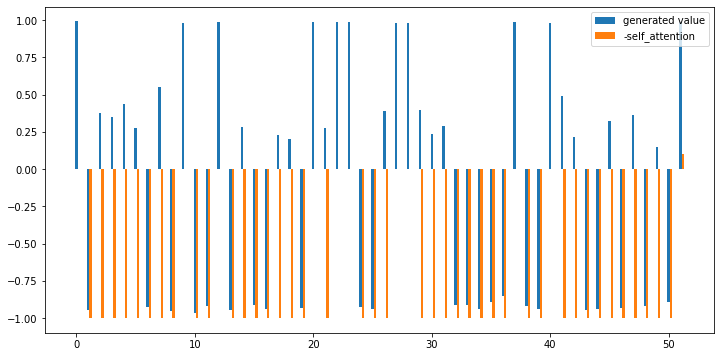

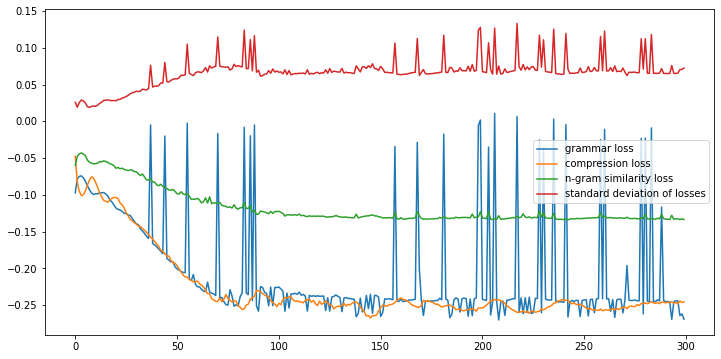

g 1.1809 	s -0.0568 	c 0.4043, score 1.0443, [삼성전자는 벽걸이형이 패키지로 판매되는 홈멀티 기준 이상 시장에서 갤러리의 1~2월에 전년 대비 2배 이상 판매하는 캔버스 그레이 색상의 무풍에어컨 갤러리는 56 패널 총 3모델로 출시되며 세트 400만원~420만원이고 기준 345만원~365만원이다.]
g 5.0905 	s -0.0602 	c 0.4298, score 1.7180, [삼성전자는 벽걸이형이 패키지로 판매되는 홈멀티 이상 시장에서 갤러리의 1~2월에 전년 대비 2배 이상 판매하는 캔버스 그레이 색상의 무풍에어컨 갤러리는 56 패널 총 3모델로 출시되며 400만원~420만원이고 기준 345만원~365만원이다.]
g -3.4700 	s -0.0236 	c 0.4383, score 0.3364, [삼성전자는 벽걸이형이 패키지로 판매되는 홈멀티 기준 이상 시장에서 갤러리의 1~2월에 대비 2배 이상 판매하는 캔버스 그레이 색상의 무풍에어컨 갤러리는 56 패널 총 출시되며 세트 400만원~420만원이고 기준 345만원~365만원이다.]
g 4.3100 	s 0.0124 	c 0.4255, score 1.6563, [삼성전자는 벽걸이형이 패키지로 판매되는 홈멀티 기준 이상 시장에서 갤러리의 1~2월에 전년 대비 2배 이상 판매하는 캔버스 그레이 색상의 무풍에어컨 56 패널 총 3모델로 출시되며 세트 400만원~420만원이고 기준 345만원~365만원이다.]
g 2.0086 	s -0.0434 	c 0.4170, score 1.2084, [삼성전자는 벽걸이형이 패키지로 판매되는 홈멀티 기준 이상 시장에서 갤러리의 1~2월에 전년 대비 2배 이상 판매하는 캔버스 그레이 색상의 무풍에어컨 갤러리는 56 패널 총 3모델로 출시되며 400만원~420만원이고 기준 345만원~365만원이다.]
g 5.2168 	s -0.0849 	c 0.4638, score 1.7484, [삼성전자는 벽걸이형이 패키지로 판매되는 홈멀티 기준 이상 시장에서

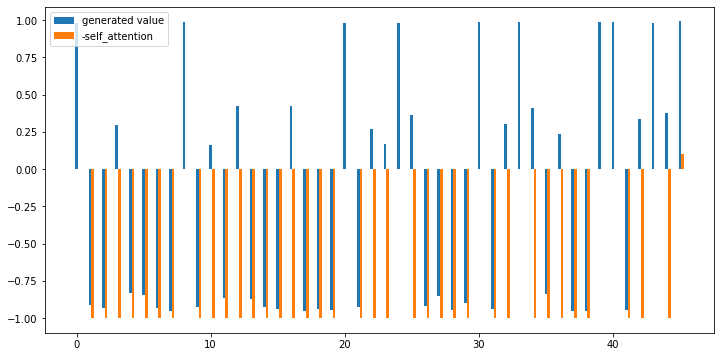

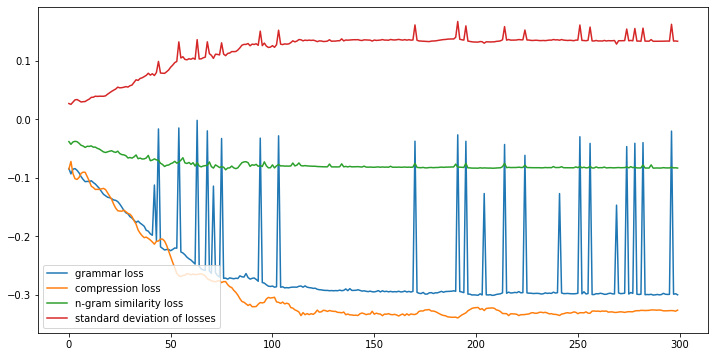

g 3.4430 	s 0.1696 	c 0.5455, score 1.6980, [이번 스포츠토토 방문해 응원하는 댓글로 팬들 통해 구매할 수 있는 기프티콘을 사항은 페이스북을 통해 확인할 있으며 댓글 및 메신저를 통해 개별 공지한다.]
g 3.2074 	s 0.1869 	c 0.5775, score 1.6439, [이번 방문해 응원하는 댓글로 팬들 통해 구매할 수 있는 기프티콘을 사항은 페이스북을 통해 확인할 있으며 댓글 및 메신저를 통해 개별 공지한다.]
g 4.1867 	s 0.1466 	c 0.5722, score 1.7722, [이번 스포츠토토 방문해 댓글로 팬들 통해 구매할 수 있는 기프티콘을 사항은 페이스북을 통해 확인할 있으며 댓글 및 메신저를 통해 개별 공지한다.]
g 0.4619 	s 0.1984 	c 0.5615, score 1.2139, [이번 스포츠토토 방문해 응원하는 댓글로 팬들 통해 구매할 수 있는 기프티콘을 사항은 페이스북을 통해 확인할 있으며 댓글 및 메신저를 통해 공지한다.]
요약률 0.5722 유사성 0.1466 문법성 4.1867 요약 [이번 스포츠토토 방문해 댓글로 팬들 통해 구매할 수 있는 기프티콘을 사항은 페이스북을 통해 확인할 있으며 댓글 및 메신저를 통해 개별 공지한다.]
--------------------------------------------------
이번 스포츠토토 방문해 댓글로 팬들 통해 구매할 수 있는 기프티콘을 사항은 페이스북을 통해 확인할 있으며 댓글 및 메신저를 통해 개별 공지한다. 1.7721918737665217 4.186715126037598
================================================== Original Document 158==================================================
국민체육진흥공단 체육진흥투표권 스포츠토토 수탁사업자 ㈜케이토토가 공식 페이스북을 통해 오는 11일 자정까지 2019 KBO 와일드카드 

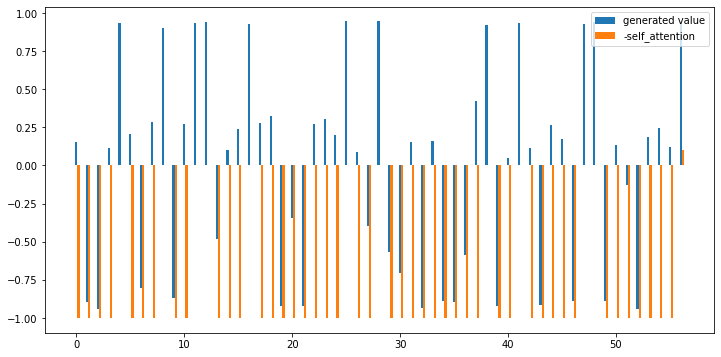

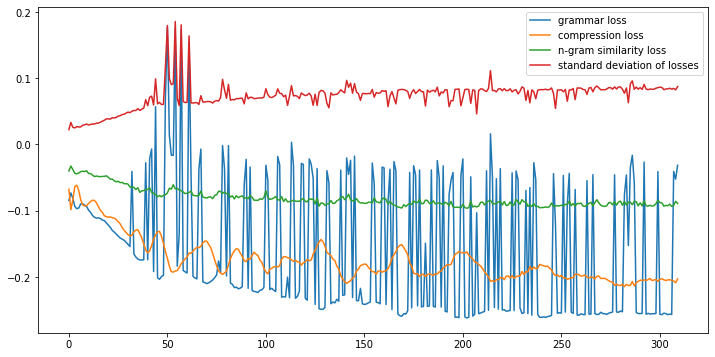

g 4.7642 	s 0.2493 	c 0.3373, score 1.8807, [이밖에 리플 같은 주요 자산에 큰 미치지 않는 반면 소매결제에 특화된BCH(비트코인캐시) 같은 암호화폐는 리브라에 수 있다고 설명했고 또 리브라는 같은 카드업체에 타격을 언급했고 특히 소셜데이터를 활용해 소비자들에게 금융 서비스를 경우 이는 은행들이 제공하기 서비스일 것이라고 보고서는 예측했다.]
g -5.4328 	s 0.2716 	c 0.5904, score 0.2758, [같은 주요 큰 미치지 않는 반면 소매결제에 특화된BCH(비트코인캐시) 같은 리브라에 수 또 리브라는 같은 특히 소셜데이터를 활용해 금융 서비스를 경우 이는 것이라고 보고서는 예측했다.]
g 4.1023 	s 0.2773 	c 0.4297, score 1.8907, [이밖에 같은 주요 자산에 큰 미치지 않는 반면 소매결제에 특화된BCH(비트코인캐시) 같은 암호화폐는 리브라에 수 있다고 설명했고 또 리브라는 같은 카드업체에 타격을 언급했고 특히 소셜데이터를 활용해 소비자들에게 금융 서비스를 경우 이는 서비스일 예측했다.]
g -1.4433 	s 0.1793 	c 0.3775, score 0.8162, [이밖에 리플 같은 주요 자산에 큰 미치지 않는 반면 소매결제에 특화된BCH(비트코인캐시) 같은 암호화폐는 리브라에 수 있다고 설명했고 또 리브라는 같은 카드업체에 타격을 특히 소셜데이터를 활용해 소비자들에게 금융 서비스를 경우 이는 제공하기 서비스일 것이라고 보고서는 예측했다.]
g 5.1067 	s 0.2319 	c 0.3976, score 1.9806, [이밖에 리플 같은 주요 자산에 큰 미치지 않는 반면 소매결제에 특화된BCH(비트코인캐시) 같은 암호화폐는 리브라에 수 있다고 설명했고 또 리브라는 같은 카드업체에 타격을 언급했고 특히 소셜데이터를 활용해 서비스를 경우 이는 은행들이 서비스일 것이라고 보고서는 예측했다.]
g -0.0560 	s 0.2093 	c 0.4217, score 1.1216, [이밖에

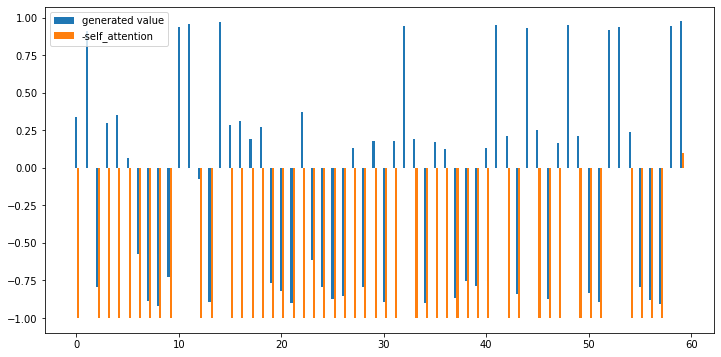

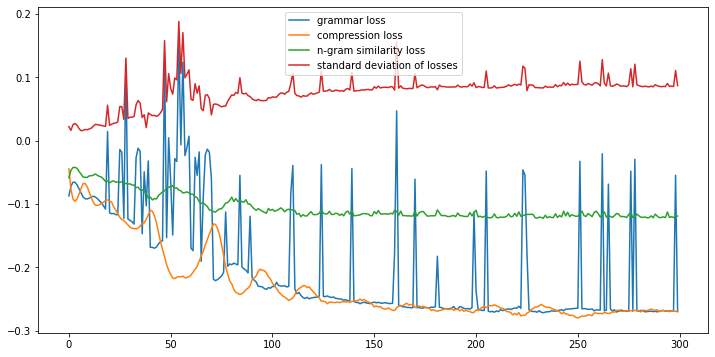

g 5.1577 	s 0.4201 	c 0.4744, score 2.2541, [대회 결과 네이밍을 기획한 ‘우리동네 데 이어 ‘틀모시에’와 각각 최우수상을 받았으며 ‘당진형이음센터’와 ‘정리의 수상은 못했지만 정성가득한방카페 등도 심사위원들로부터 사업성을 인정받았으며 사회목적성이 크다고 인정받았고 이들이 사회적기업 실현할 수 있도록 원 나머지 7개팀에게 지원할 예정이다.]
g 0.3208 	s 0.4867 	c 0.4936, score 1.5337, [대회 결과 네이밍을 기획한 ‘우리동네 데 이어 ‘틀모시에’와 각각 최우수상을 받았으며 ‘당진형이음센터’와 ‘정리의 놀이심리센터’와 수상은 못했지만 등도 심사위원들로부터 사업성을 인정받았으며 사회목적성이 크다고 인정받았고 이들이 사회적기업 실현할 수 있도록 원 나머지 지원할 예정이다.]
g 5.1334 	s 0.5135 	c 0.4455, score 2.3146, [대회 결과 네이밍을 기획한 ‘우리동네 데 이어 ‘틀모시에’와 각각 최우수상을 받았으며 ‘당진형이음센터’와 ‘정리의 놀이심리센터’와 수상은 못했지만 정성가득한방카페 등도 심사위원들로부터 사업성을 인정받았으며 사회목적성이 크다고 인정받았고 이들이 사회적기업 실현할 수 있도록 원 나머지 7개팀에게 지원할 예정이다.]
g 5.2471 	s 0.2000 	c 0.5417, score 2.0328, [대회 결과 네이밍을 기획한 ‘우리동네 데 이어 각각 최우수상을 받았으며 ‘당진형이음센터’와 ‘정리의 수상은 못했지만 정성가득한방카페 등도 심사위원들로부터 사업성을 인정받았으며 크다고 인정받았고 이들이 실현할 수 있도록 원 나머지 7개팀에게 지원할 예정이다.]
g 5.1106 	s 0.4259 	c 0.4712, score 2.2488, [대회 결과 네이밍을 기획한 ‘우리동네 데 이어 각각 최우수상을 받았으며 ‘당진형이음센터’와 ‘정리의 놀이심리센터’와 수상은 못했지만 정성가득한방카페 등도 심사위원들로부터 사업성을 인정받았으며 사회목적성이 크다고 인정받았고 이들이 사

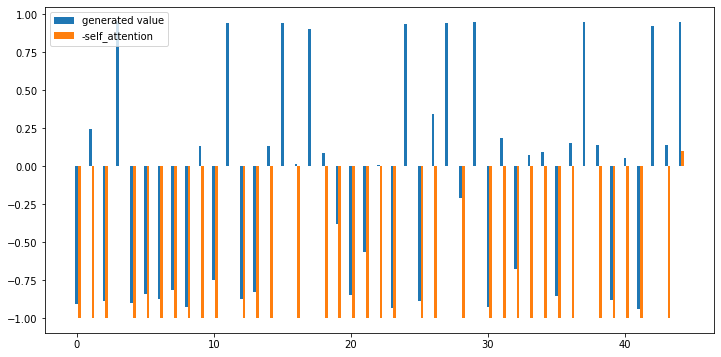

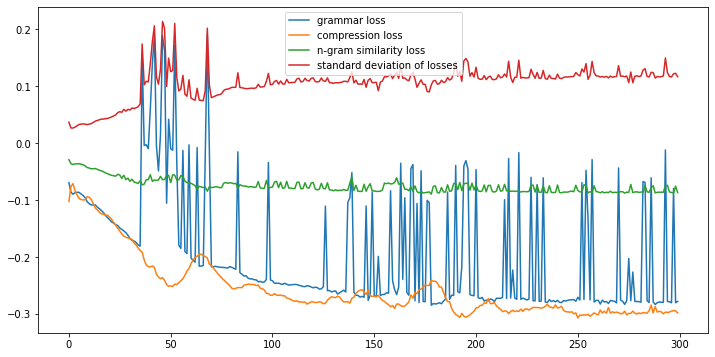

g 4.8274 	s -0.0391 	c 0.4947, score 1.7602, [통합은 나뉜 과정으로 각 고용뿐만 아니라 업무환경 또한 그대로 돌아가는 역시 없다는 게 측 홈플러스는 홈플러스홀딩스 이사회와 결의 등을 거쳐 법인 작업을 마무리할 계획이다.]
g 5.0683 	s 0.0968 	c 0.5053, score 1.9363, [통합은 나뉜 과정으로 각 고용뿐만 아니라 또한 그대로 돌아가는 역시 없다는 게 회사 측 홈플러스는 홈플러스홀딩스 이사회와 결의 등을 거쳐 법인 작업을 마무리할 계획이다.]
g -3.8578 	s 0.0880 	c 0.5579, score 0.3871, [통합은 나뉜 과정으로 각 고용뿐만 아니라 또한 돌아가는 역시 없다는 게 측 홈플러스는 홈플러스홀딩스 이사회와 결의 등을 법인 작업을 마무리할 계획이다.]
g 5.2255 	s 0.0706 	c 0.4789, score 1.9205, [통합은 나뉜 과정으로 각 고용뿐만 아니라 업무환경 또한 그대로 돌아가는 역시 없다는 게 회사 측 홈플러스는 홈플러스홀딩스 이사회와 결의 등을 거쳐 법인 작업을 마무리할 계획이다.]
g -2.4347 	s 0.0897 	c 0.5316, score 0.6523, [통합은 나뉜 과정으로 각 고용뿐만 아니라 업무환경 또한 돌아가는 역시 없다는 게 측 홈플러스는 홈플러스홀딩스 이사회와 결의 등을 법인 작업을 마무리할 계획이다.]
g 3.1039 	s 0.0922 	c 0.5211, score 1.5884, [통합은 나뉜 과정으로 각 고용뿐만 아니라 또한 그대로 돌아가는 역시 없다는 게 측 홈플러스는 홈플러스홀딩스 이사회와 결의 등을 거쳐 법인 작업을 마무리할 계획이다.]
g -4.1895 	s 0.0666 	c 0.5842, score 0.2842, [통합은 나뉜 과정으로 각 고용뿐만 아니라 또한 돌아가는 역시 없다는 게 측 홈플러스는 홈플러스홀딩스 결의 등을 법인 작업을 마무리할 계획이다.]
g 3.2626 	s 0.0865 	c 0.5474, score

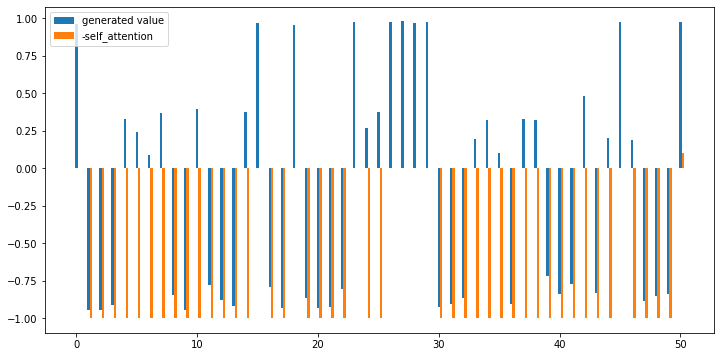

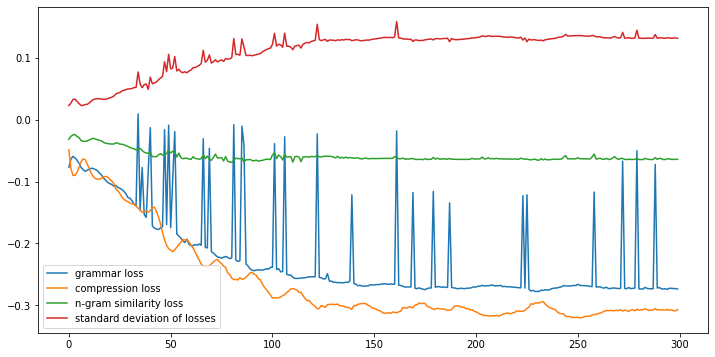

g 3.7527 	s 0.3420 	c 0.5176, score 1.9499, [이러한 열정으로 케이는 비중은 적지만 남기며 오르는 등 큰 자살 세리 하버드 실화 우주 감옥 등 에피소드로 화제를 일으켰던 마지막 회만을 20회는 이번 주 금요일 예정이다.]
g 3.8914 	s 0.3013 	c 0.5377, score 1.9122, [이러한 열정으로 케이는 적지만 남기며 오르는 등 큰 자살 세리 하버드 실화 우주 감옥 등 에피소드로 화제를 일으켰던 마지막 회만을 20회는 이번 주 금요일 예정이다.]
g 5.1719 	s 0.1089 	c 0.5578, score 1.9131, [이러한 열정으로 케이는 적지만 남기며 오르는 등 큰 자살 세리 하버드 실화 우주 감옥 등 에피소드로 화제를 일으켰던 마지막 20회는 이번 주 금요일 예정이다.]
g -0.0413 	s 0.3509 	c 0.5578, score 1.2862, [이러한 열정으로 케이는 비중은 남기며 등 큰 자살 세리 하버드 실화 우주 감옥 등 에피소드로 화제를 일으켰던 마지막 회만을 20회는 이번 주 금요일 예정이다.]
g 3.2858 	s 0.3327 	c 0.5628, score 1.8175, [이러한 열정으로 케이는 비중은 남기며 오르는 등 큰 자살 세리 하버드 실화 우주 감옥 등 에피소드로 화제를 일으켰던 마지막 회만을 이번 주 금요일 예정이다.]
g 4.9206 	s 0.3054 	c 0.5829, score 2.0426, [이러한 열정으로 케이는 적지만 남기며 오르는 등 큰 자살 세리 실화 우주 감옥 등 에피소드로 화제를 일으켰던 마지막 회만을 이번 주 금요일 예정이다.]
g 4.1955 	s 0.3220 	c 0.5427, score 1.9785, [이러한 케이는 비중은 적지만 남기며 오르는 등 큰 자살 세리 하버드 실화 우주 감옥 등 에피소드로 화제를 일으켰던 마지막 회만을 20회는 이번 주 금요일 예정이다.]
g 4.9332 	s 0.1502 	c 0.5427, score 1.9297, [

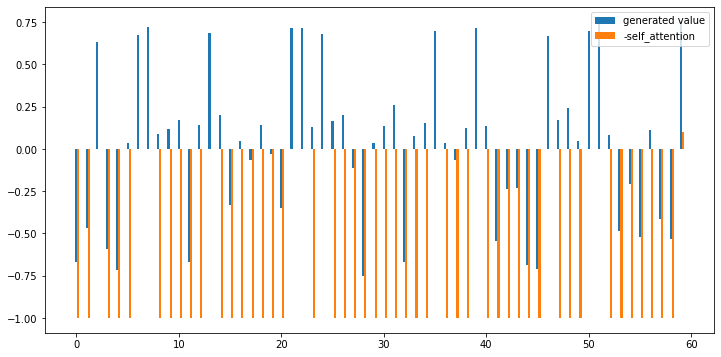

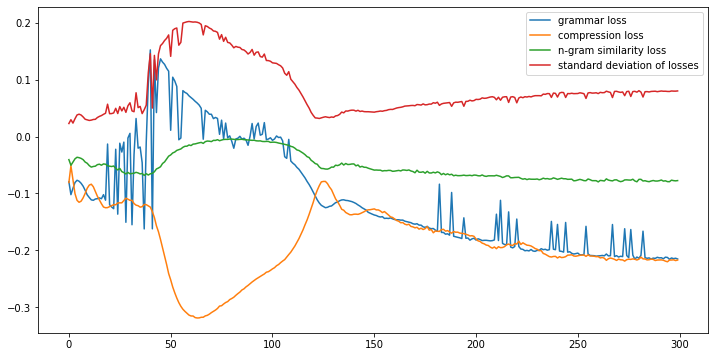

g 3.3148 	s 0.2248 	c 0.3658, score 1.6430, [전보다 발주 모두 감소했고 신규주택 학교·병원 관공서 기타건축 등의 발주 공공부문에서 3 3% 신규주택 점포 오락 숙박시설 등의 수주 감소로 8% 줄었고 동북지방통계청 “광공업 생산의 경우 대구는 흐름과 비슷하게 흘러가지만 많이 안좋다”며 “대기업 유치 등 다른 돌파구를 경기전망도 예상했다.]
g 3.7542 	s 0.2378 	c 0.3230, score 1.6865, [전보다 발주 모두 감소했고 신규주택 학교·병원 관공서 기타건축 등의 발주 공공부문에서 3 3% 신규주택 점포 오락 숙박시설 등의 수주 감소로 민간부문에서 8% 줄었고 동북지방통계청 “광공업 생산의 경우 대구는 전국의 흐름과 비슷하게 흘러가지만 많이 안좋다”며 “대기업 유치 등 다른 돌파구를 경기전망도 예상했다.]
g 4.9991 	s 0.1452 	c 0.3696, score 1.8480, [전보다 발주 모두 감소했고 신규주택 학교·병원 관공서 기타건축 등의 발주 신규주택 점포 오락 숙박시설 등의 수주 감소로 민간부문에서 8% 줄었고 동북지방통계청 “광공업 생산의 경우 대구는 전국의 흐름과 비슷하게 흘러가지만 많이 안좋다”며 “대기업 유치 등 다른 돌파구를 경기전망도 예상했다.]
g 3.3809 	s 0.2094 	c 0.3696, score 1.6426, [전보다 발주 모두 감소했고 신규주택 학교·병원 관공서 기타건축 등의 발주 3 3% 점포 오락 숙박시설 등의 수주 감소로 민간부문에서 8% 줄었고 동북지방통계청 “광공업 생산의 경우 대구는 전국의 흐름과 비슷하게 흘러가지만 많이 안좋다”며 “대기업 유치 등 다른 돌파구를 경기전망도 예상했다.]
g 4.0914 	s 0.1829 	c 0.3502, score 1.7150, [전보다 발주 모두 감소했고 신규주택 학교·병원 관공서 기타건축 등의 발주 3 3% 신규주택 점포 오락 숙박시설 등의 수주 감소로 민간부문에서 8% 줄었고 동북지방통계청 “광공업 생산의 경우 

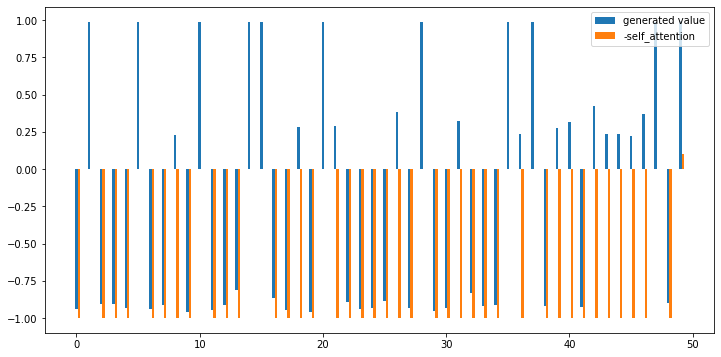

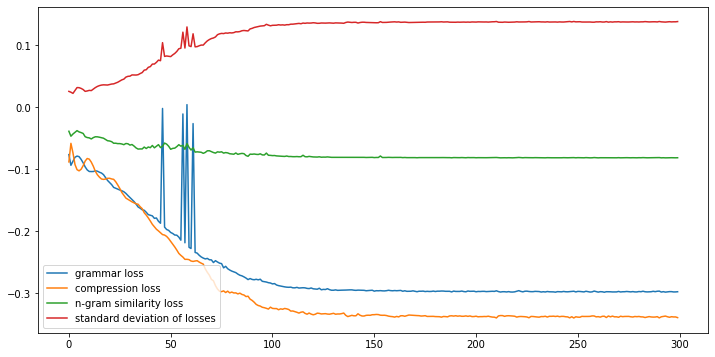

g 5.1270 	s 0.0075 	c 0.5438, score 1.8182, [기준 자는 주 이하로 이상인 자는 주 이하로 근무한고 간식비 별도로 경주시장은 지역이 상생발전 할 있는 일자리사업을 발굴하여 취약계층의 소득안정과 지역경제 활성화를 위해 밝혔다.]
요약률 0.5438 유사성 0.0075 문법성 5.1270 요약 [기준 자는 주 이하로 이상인 자는 주 이하로 근무한고 간식비 별도로 경주시장은 지역이 상생발전 할 있는 일자리사업을 발굴하여 취약계층의 소득안정과 지역경제 활성화를 위해 밝혔다.]
--------------------------------------------------
기준 자는 주 이하로 이상인 자는 주 이하로 근무한고 간식비 별도로 경주시장은 지역이 상생발전 할 있는 일자리사업을 발굴하여 취약계층의 소득안정과 지역경제 활성화를 위해 밝혔다. 1.8181857180684382 5.126957893371582
================================================== Original Document 167==================================================
[경주=환경일보] 강광태 기자 = 경주시는 미취업 취약계층과 청년층을 대상으로 제2단계 공공근로사업 및 하반기 지역공동체일자리사업 참여자를 지난 27일부터 오는 31일까지 모집한다.
2단계 공공근로사업은 환경정화, 정보화추진 등 3개 분야로 문화재과 등 27개 사업장에 32명, 지역공동체일자리사업은 지역자원활용형 사업 등 3개 분야로 안강읍 총무과 등 6개의 사업장에 42명을 선발할 예정이다.
참여대상은 신청일 현재 만 18세 이상의 근로능력자로서 재산이 2억 원 이하이며 기준중위소득이 65%이하인 경주시민이다.
다만, 공공근로사업의 경우 신청일 현재 만 34세 이하인 청년 미취업자는 소득 및 재산과 무관하게 참여가 가능하다.
신청은 주소지 읍면동 행정복지센터에서 가능하며 선발된 공공근로자는 7월 1일부터 10월 3

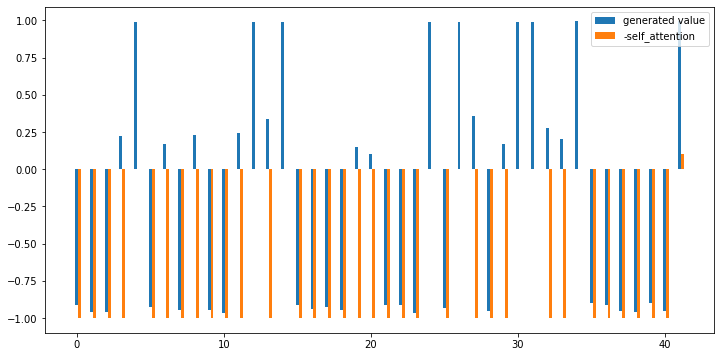

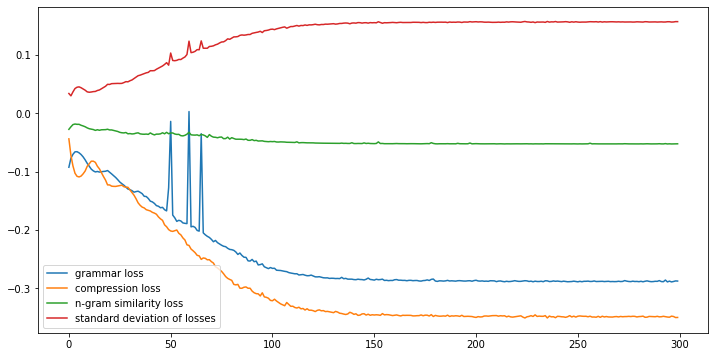

g 5.1569 	s -0.0689 	c 0.5503, score 1.7403, [20일 소련 군법재판소의 복권됐고 하바로프스크 등 연해주 지역의 59인’의 한사람으로 3 및 임시정부 100주년을 맞는 올해 조국 독립을 위해 수여했다.]
g 4.9460 	s -0.0553 	c 0.5714, score 1.6976, [소련 군법재판소의 복권됐고 하바로프스크 등 연해주 지역의 59인’의 한사람으로 3 및 임시정부 100주년을 맞는 올해 조국 독립을 위해 수여했다.]
요약률 0.5503 유사성 -0.0689 문법성 5.1569 요약 [20일 소련 군법재판소의 복권됐고 하바로프스크 등 연해주 지역의 59인’의 한사람으로 3 및 임시정부 100주년을 맞는 올해 조국 독립을 위해 수여했다.]
--------------------------------------------------
20일 소련 군법재판소의 복권됐고 하바로프스크 등 연해주 지역의 59인’의 한사람으로 3 및 임시정부 100주년을 맞는 올해 조국 독립을 위해 수여했다. 1.7402993758361807 5.15687370300293
================================================== Original Document 168==================================================
지난 13일 열린 17회 전국시낭송경연대회 예선.
전국 각지에서 온 시낭송 애호가들이 열띤 경연을 벌이고 있다.
(동양일보 박장미 기자) 전국 시낭송 애호가들이 한자리에 모여 실력을 겨루는 ‘시낭송가 등용문’ 17회 전국시낭송경연대회 본선이 26일 오전 10시 진천 포석조명희문학관(진천읍 포석길 37-14) 세미나실에서 열린다.
‘포석 조명희 문학제’를 기념해 열리는 전국시낭송경연대회는 동양일보가 주최하고 전국시낭송경연대회 조직위원회가 주관하며 진천군·포석기념사업회·(사)한국시낭송전문가협회가 후원한다.
지난 13일 예선을 통해 전국각지에서 몰린 참가자 중 35명

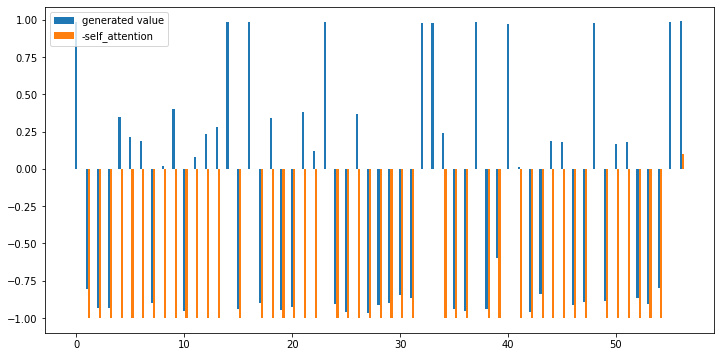

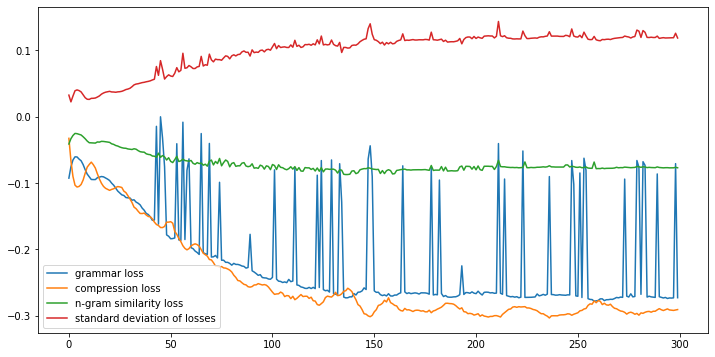

g 2.6636 	s -0.0721 	c 0.5265, score 1.3453, [한편 교육청은 6월 중으로 꾸려 유치원 법령과 제도 개선 방안 과제를 했고 유치원 관계자ㆍ학부모ㆍ전문가 등으로 구성하고 이를 지원한고 유은혜 중앙에 통해 공ㆍ사립유치원 경청하고 소통하겠다면서 방안 교사 처우 것이라고 말했다.]
g 2.0127 	s -0.0462 	c 0.5379, score 1.2514, [한편 교육청은 6월 중으로 유치원 법령과 제도 개선 방안 과제를 했고 유치원 관계자ㆍ학부모ㆍ전문가 등으로 구성하고 이를 지원한고 유은혜 중앙에 통해 공ㆍ사립유치원 경청하고 소통하겠다면서 방안 교사 처우 것이라고 말했다.]
g -0.3428 	s -0.0074 	c 0.5758, score 0.8597, [한편 6월 중으로 꾸려 유치원 법령과 제도 개선 방안 과제를 했고 유치원 관계자ㆍ학부모ㆍ전문가 등으로 구성하고 이를 지원한고 유은혜 중앙에 통해 경청하고 소통하겠다면서 방안 교사 처우 것이라고 말했다.]
g 2.8315 	s -0.0732 	c 0.5455, score 1.3532, [한편 교육청은 6월 중으로 꾸려 유치원 법령과 제도 개선 방안 과제를 했고 유치원 관계자ㆍ학부모ㆍ전문가 등으로 구성하고 이를 지원한고 유은혜 중앙에 통해 공ㆍ사립유치원 소통하겠다면서 방안 교사 처우 것이라고 말했다.]
g 0.5133 	s -0.0395 	c 0.5606, score 0.9854, [한편 교육청은 6월 중으로 꾸려 유치원 제도 개선 방안 과제를 했고 유치원 관계자ㆍ학부모ㆍ전문가 등으로 구성하고 이를 지원한고 유은혜 중앙에 통해 공ㆍ사립유치원 소통하겠다면서 방안 교사 처우 것이라고 말했다.]
g 3.1318 	s 0.1043 	c 0.6023, score 1.5240, [한편 6월 중으로 유치원 법령과 제도 개선 방안 과제를 했고 관계자ㆍ학부모ㆍ전문가 등으로 구성하고 이를 지원한고 유은혜 중앙에 통해 경청하고 소통하겠다면서 방안 교사 처우 것이라고 말했다.]
g 5.0519 	s 

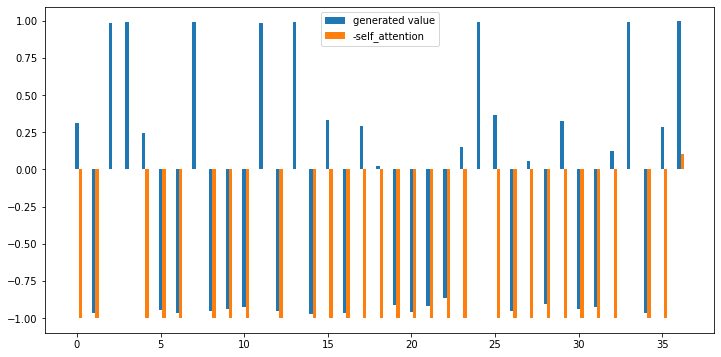

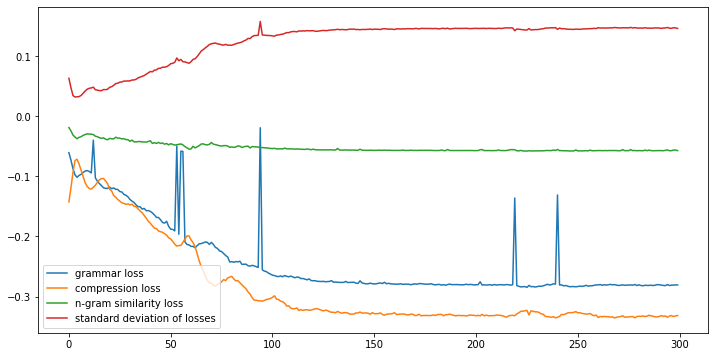

g 2.7900 	s 0.1214 	c 0.5128, score 1.5735, [6부작씩 파트 모두 18부작으로 먼저 이후 만에 복귀한 사람족과 뇌안탈의 은섬 역을 맡았고 대칸부대의 타곤을 갖고 있는 탄야를 연기한다.]
g 2.8807 	s 0.4828 	c 0.5513, score 1.9116, [6부작씩 파트 모두 18부작으로 먼저 이후 만에 복귀한 사람족과 뇌안탈의 은섬 역을 맡았고 타곤을 갖고 있는 탄야를 연기한다.]
g -2.5361 	s 0.4491 	c 0.5385, score 0.9880, [6부작씩 파트 모두 18부작으로 먼저 이후 만에 복귀한 사람족과 뇌안탈의 은섬 역을 맡았고 대칸부대의 타곤을 갖고 있는 연기한다.]
g 2.8222 	s 0.0391 	c 0.5449, score 1.4646, [6부작씩 파트 모두 18부작으로 먼저 이후 만에 복귀한 사람족과 은섬 역을 맡았고 대칸부대의 타곤을 갖고 있는 탄야를 연기한다.]
g -0.1021 	s 0.3430 	c 0.5321, score 1.2940, [6부작씩 파트 모두 18부작으로 먼저 이후 만에 복귀한 사람족과 뇌안탈의 은섬 역을 맡았고 대칸부대의 타곤을 있는 탄야를 연기한다.]
g 2.5933 	s 0.4866 	c 0.5833, score 1.8355, [6부작씩 파트 모두 18부작으로 먼저 이후 만에 복귀한 사람족과 은섬 역을 맡았고 타곤을 갖고 있는 탄야를 연기한다.]
요약률 0.5513 유사성 0.4828 문법성 2.8807 요약 [6부작씩 파트 모두 18부작으로 먼저 이후 만에 복귀한 사람족과 뇌안탈의 은섬 역을 맡았고 타곤을 갖고 있는 탄야를 연기한다.]
재시도 max score:1.9115834702283907 grammar:2.880659341812134 text:6부작씩 파트 모두 18부작으로 먼저 이후 만에 복귀한 사람족과 뇌안탈의 은섬 역을 맡았고 타곤을 갖고 있는 탄야를 연기한다.
---------------------------------------------

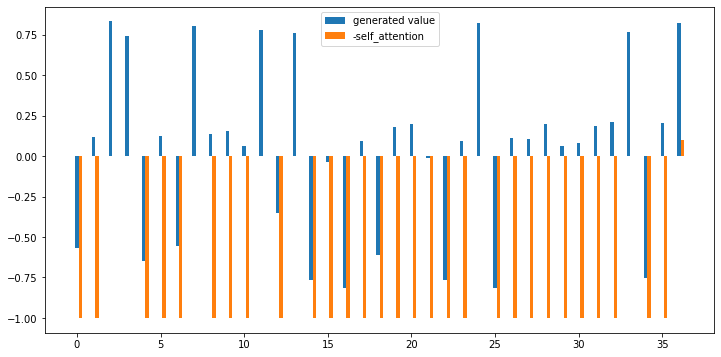

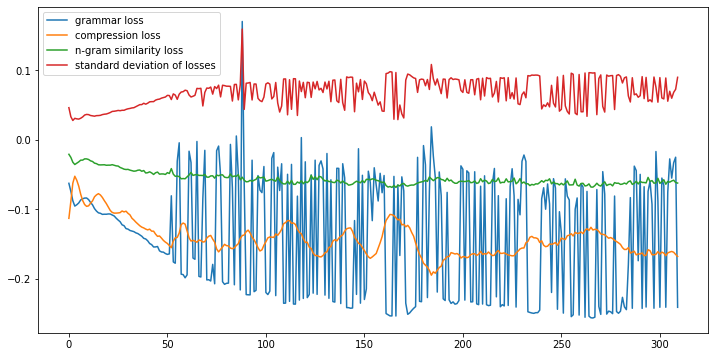

g 3.7306 	s -0.1133 	c 0.3654, score 1.3738, [세 파트 모두 그중 먼저 방송된고 태양의 후예 이후 만에 복귀한 사람족과 혼혈로 태어나 은섬 역을 장동건은 대칸부대의 수장 타곤을 김지원은 예언능력을 갖고 있는 탄야를 연기한다.]
g 2.9665 	s -0.1299 	c 0.4103, score 1.2748, [세 파트 모두 그중 먼저 방송된고 태양의 후예 이후 만에 복귀한 사람족과 혼혈로 은섬 역을 장동건은 대칸부대의 타곤을 김지원은 예언능력을 갖고 있는 탄야를 연기한다.]
g 0.0816 	s -0.0893 	c 0.4167, score 0.8410, [세 파트 모두 그중 먼저 방송된고 태양의 후예 이후 만에 복귀한 사람족과 혼혈로 태어나 은섬 역을 대칸부대의 타곤을 김지원은 예언능력을 갖고 있는 탄야를 연기한다.]
g 3.2397 	s -0.1086 	c 0.3910, score 1.3224, [세 파트 모두 그중 먼저 방송된고 후예 이후 만에 복귀한 사람족과 혼혈로 태어나 은섬 역을 장동건은 대칸부대의 수장 타곤을 김지원은 예언능력을 갖고 있는 탄야를 연기한다.]
g -5.4469 	s 0.0267 	c 0.5321, score 0.0869, [세 파트 모두 그중 먼저 방송된고 태양의 후예 이후 만에 태어나 은섬 역을 장동건은 수장 타곤을 김지원은 예언능력을 있는 연기한다.]
g 3.3607 	s -0.1302 	c 0.3333, score 1.2633, [세 파트 모두 그중 먼저 방송된고 태양의 후예 이후 만에 복귀한 사람족과 혼혈로 태어나 영웅으로 은섬 역을 장동건은 대칸부대의 수장 타곤을 김지원은 예언능력을 갖고 있는 탄야를 연기한다.]
g -5.4421 	s -0.0466 	c 0.5833, score -0.0369, [파트 모두 먼저 방송된고 태양의 후예 이후 만에 사람족과 혼혈로 은섬 역을 장동건은 대칸부대의 타곤을 있는 연기한다.]
g -4.0811 	s -0.0016 	c 0.4808, score 0.299

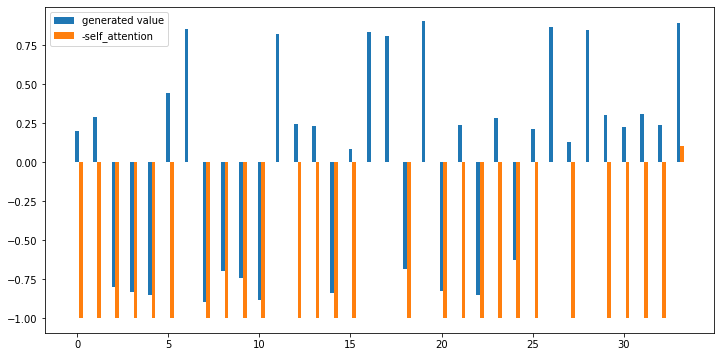

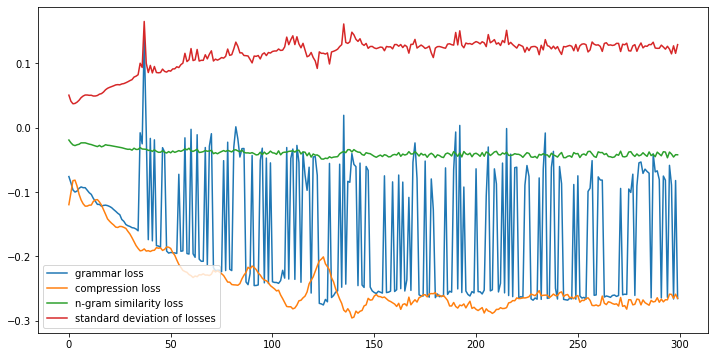

g -5.4271 	s 0.3961 	c 0.7402, score 0.2514, [섬 게 물론 구해 함께 있습니고 섬이 돼 많은 곳이 합니다.]
g 3.8153 	s 0.3851 	c 0.4409, score 1.9619, [섬 거주민들의 찾는 게 물론 일하는 어렵게 구해 함께 있습니고 섬이 더 환경이 돼 보다 많은 사람들이 사는 곳이 됐으면 합니다.]
g 5.0304 	s 0.2764 	c 0.3937, score 2.0084, [섬 거주민들의 찾는 게 물론 판매장에서 일하는 어렵게 구해 함께 있습니고 섬이 더 환경이 돼 보다 많은 사람들이 사는 곳이 됐으면 합니다.]
g 5.1994 	s 0.4288 	c 0.4646, score 2.2600, [섬 거주민들의 찾는 게 물론 판매장에서 어렵게 구해 함께 있습니고 섬이 더 환경이 돼 보다 많은 사는 곳이 됐으면 합니다.]
g 2.3991 	s 0.3451 	c 0.5669, score 1.6780, [섬 게 물론 판매장에서 어렵게 구해 함께 있습니고 섬이 더 돼 보다 많은 사는 곳이 됐으면 합니다.]
g -3.3982 	s 0.4728 	c 0.4646, score 0.8710, [섬 거주민들의 찾는 게 물론 일하는 어렵게 구해 함께 있습니고 섬이 더 환경이 돼 보다 많은 사람들이 사는 됐으면 합니다.]
g 5.0916 	s 0.4565 	c 0.4961, score 2.3011, [섬 거주민들의 찾는 게 물론 판매장에서 구해 함께 있습니고 섬이 환경이 돼 많은 사람들이 사는 곳이 됐으면 합니다.]
g -5.4760 	s 0.4078 	c 0.7795, score 0.2156, [게 물론 구해 함께 있습니고 돼 보다 많은 합니다.]
g -5.2311 	s 0.3982 	c 0.6693, score 0.3570, [게 물론 일하는 구해 함께 있습니고 환경이 돼 많은 사람들이 됐으면 합니다.]
g 3.0299 	s 0.4773 	c 0.4646, score 1.9468, [섬 거주민들의 찾는 게 물론 일하는 어렵

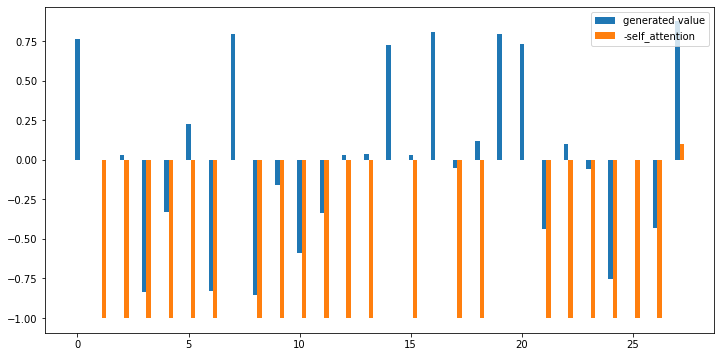

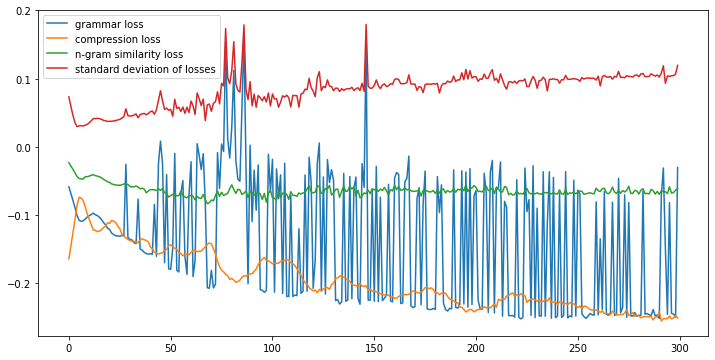

g 3.4369 	s 0.0737 	c 0.3882, score 1.5347, [정부는 외환위기 직후인 금융기관의 위해 한일·상업은행을 합병해 옛 한빛은행을 만들고 평화·광주·경남은행과 하나로종금을 더해 2001년 출범시켰고 현재 회수율은 3%다.]
g 3.1143 	s -0.0411 	c 0.3355, score 1.3135, [정부는 외환위기 직후인 금융기관의 위해 8000억원의 한일·상업은행을 합병해 옛 한빛은행을 만들고 평화·광주·경남은행과 하나로종금을 더해 2001년 출범시켰고 현재 회수율은 3%다.]
g 2.7846 	s -0.0614 	c 0.3553, score 1.2580, [정부는 외환위기 직후인 금융기관의 위해 8000억원의 한일·상업은행을 합병해 옛 한빛은행을 만들고 평화·광주·경남은행과 하나로종금을 더해 2001년 출범시켰고 회수율은 3%다.]
g -5.2219 	s 0.1740 	c 0.5592, score 0.2445, [정부는 직후인 금융기관의 위해 한일·상업은행을 합병해 옛 만들고 하나로종금을 더해 2001년 출범시켰고 회수율은 3%다.]
g -1.3093 	s 0.1073 	c 0.4013, score 0.7904, [정부는 외환위기 직후인 금융기관의 위해 8000억원의 한일·상업은행을 합병해 옛 한빛은행을 만들고 평화·광주·경남은행과 더해 2001년 출범시켰고 회수율은 3%다.]
g -1.5866 	s 0.2225 	c 0.5724, score 0.8857, [정부는 외환위기 위해 한일·상업은행을 옛 만들고 평화·광주·경남은행과 하나로종금을 더해 2001년 출범시켰고 3%다.]
g 2.6803 	s 0.1279 	c 0.4079, score 1.4826, [정부는 외환위기 직후인 금융기관의 위해 한일·상업은행을 합병해 옛 한빛은행을 만들고 평화·광주·경남은행과 하나로종금을 더해 2001년 출범시켰고 회수율은 3%다.]
g -0.5514 	s 0.0795 	c 0.4539, score 0.9416, [정부는 외환위기 직후인 금융

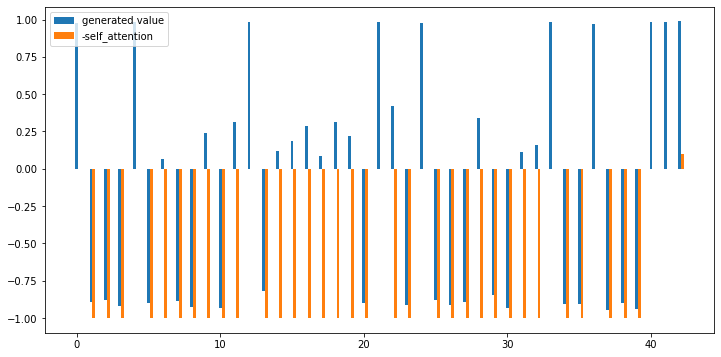

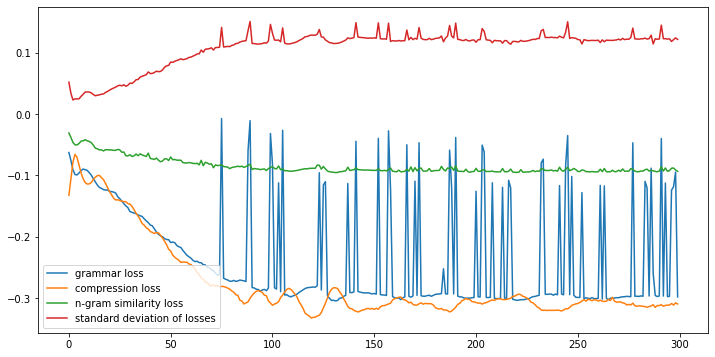

g 2.6752 	s -0.0478 	c 0.5209, score 1.3771, [한편 처음으로 지역상생박람회는 서울시 무교로·프레스센터 광장 열렸고 박람회에는 협의회 회원군 40개 지자체가 각 지역의 우수한 저렴하게 구미를 당겼고 정책 우수한 대한 정보를 제공했다.]
g 2.6958 	s 0.0414 	c 0.5395, score 1.4512, [한편 처음으로 지역상생박람회는 서울시 무교로·프레스센터 광장 박람회에는 협의회 회원군 40개 지자체가 각 지역의 우수한 저렴하게 구미를 당겼고 정책 우수한 대한 정보를 제공했다.]
g 4.3243 	s -0.1883 	c 0.5442, score 1.4882, [한편 처음으로 지역상생박람회는 서울시 무교로·프레스센터 광장 열렸고 박람회에는 협의회 회원군 40개 지자체가 각 지역의 우수한 구미를 당겼고 정책 우수한 대한 정보를 제공했다.]
g -0.9976 	s -0.0598 	c 0.5581, score 0.7158, [한편 처음으로 지역상생박람회는 서울시 무교로·프레스센터 광장 열렸고 박람회에는 회원군 40개 지자체가 각 지역의 우수한 저렴하게 당겼고 정책 우수한 대한 정보를 제공했다.]
g 2.7600 	s 0.0662 	c 0.5674, score 1.4587, [한편 처음으로 지역상생박람회는 서울시 무교로·프레스센터 광장 협의회 회원군 40개 지자체가 각 지역의 우수한 저렴하게 구미를 당겼고 정책 우수한 대한 정보를 제공했다.]
g 2.4127 	s 0.0140 	c 0.5581, score 1.3580, [한편 처음으로 지역상생박람회는 서울시 무교로·프레스센터 광장 박람회에는 협의회 40개 지자체가 각 지역의 우수한 저렴하게 구미를 당겼고 정책 우수한 대한 정보를 제공했다.]
g 0.7679 	s 0.0134 	c 0.5581, score 1.0833, [한편 처음으로 지역상생박람회는 서울시 무교로·프레스센터 광장 박람회에는 협의회 회원군 40개 지자체가 각 지역의 우수한 저렴하게 당겼고 정책 우수한 대한 

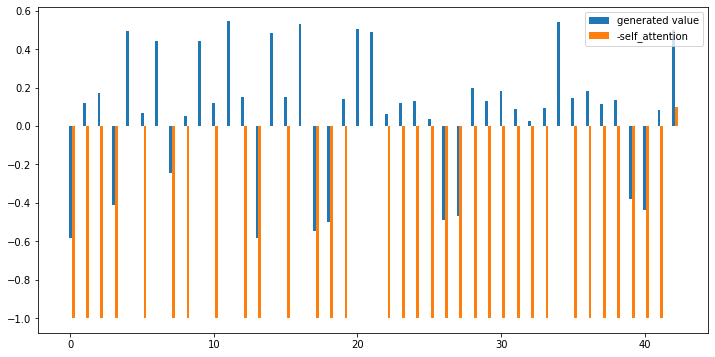

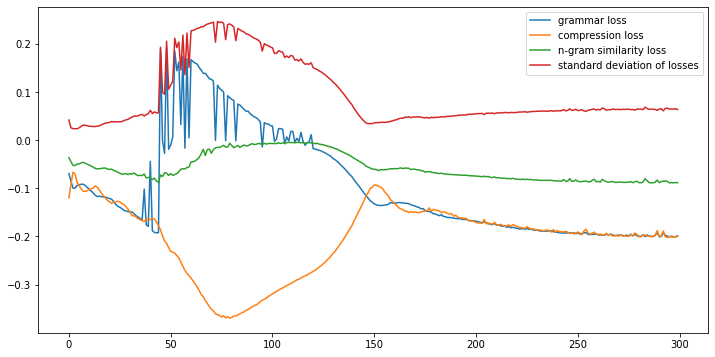

g 5.2656 	s 0.5232 	c 0.2902, score 2.1910, [세종시장은 세종대왕의 주제로 여는 올해 우리 시의 정체성을 잘 살린 알찬 축제가 되도록 세종시민의 관심과 많은 참여를 부탁한다고 일곱번째 10월 5일부터 9일까지 세종호수고원과 조치원 일원에서 열린고 사진은 지난해 열렸던 세종축제 걷기대회 모습.]
g 5.2629 	s 0.5059 	c 0.3005, score 2.1836, [세종대왕의 주제로 여는 올해 우리 시의 정체성을 잘 살린 알찬 축제가 되도록 세종시민의 관심과 많은 참여를 부탁한다고 말했고 일곱번째 10월 5일부터 9일까지 세종호수고원과 조치원 일원에서 열린고 사진은 지난해 열렸던 세종축제 걷기대회 모습.]
g 5.2570 	s 0.4937 	c 0.2902, score 2.1601, [세종시장은 세종대왕의 주제로 여는 올해 우리 시의 정체성을 잘 살린 알찬 축제가 되도록 세종시민의 관심과 많은 참여를 부탁한다고 말했고 일곱번째 5일부터 9일까지 세종호수고원과 조치원 일원에서 열린고 사진은 지난해 열렸던 세종축제 걷기대회 모습.]
g 5.2350 	s 0.4758 	c 0.2953, score 2.1436, [세종시장은 세종대왕의 주제로 여는 올해 우리 시의 정체성을 잘 살린 알찬 축제가 되도록 세종시민의 관심과 많은 참여를 부탁한다고 말했고 10월 5일부터 9일까지 세종호수고원과 조치원 일원에서 열린고 사진은 지난해 열렸던 세종축제 걷기대회 모습.]
g 5.2591 	s 0.4935 	c 0.2902, score 2.1602, [세종시장은 세종대왕의 주제로 여는 올해 우리 시의 정체성을 잘 살린 알찬 축제가 되도록 세종시민의 관심과 많은 참여를 부탁한다고 말했고 일곱번째 10월 5일부터 9일까지 세종호수고원과 일원에서 열린고 사진은 지난해 열렸던 세종축제 걷기대회 모습.]
g 5.2626 	s 0.4971 	c 0.3212, score 2.1955, [세종대왕의 주제로 여는 올해 우리 시의 정체성을 잘 살린 알찬 축제가

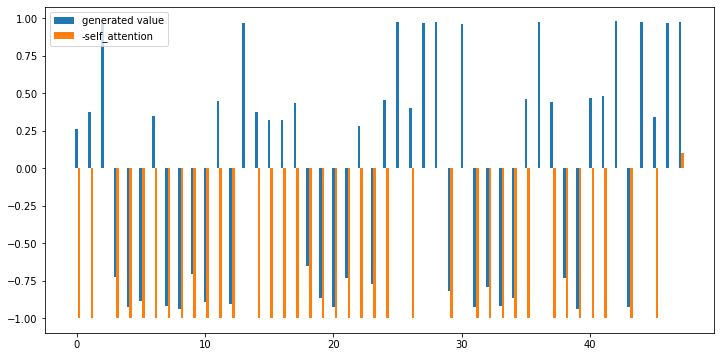

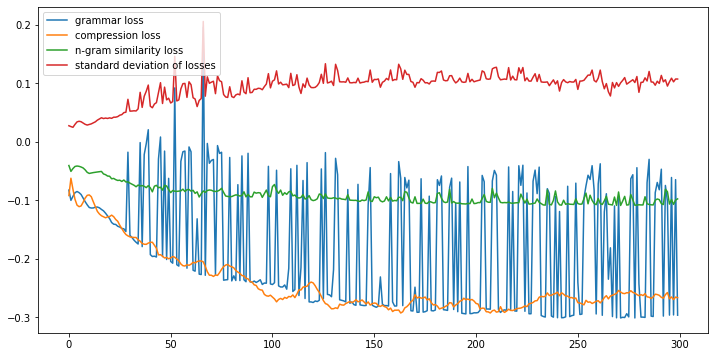

g 4.9841 	s 0.3666 	c 0.4757, score 2.1730, [신차와 비교 시 대형 에쿠스 등이 있고 화물 중고차에 대한 2 5톤카고트럭과 함께 중고내장탑차 등이 가장 좋은 중고차매입을 도와주는 중고차전액할부업체 자세한 정보는 해당 통해서 확인할 수 있다.]
g 4.6602 	s 0.3877 	c 0.4903, score 2.1547, [신차와 비교 시 대형 에쿠스 등이 있고 화물 중고차에 2 5톤카고트럭과 함께 중고내장탑차 등이 가장 좋은 중고차매입을 도와주는 중고차전액할부업체 자세한 정보는 해당 통해서 확인할 수 있다.]
g 2.7367 	s 0.3289 	c 0.5485, score 1.7365, [신차와 비교 시 대형 등이 있고 화물 중고차에 2 함께 중고내장탑차 등이 가장 좋은 중고차매입을 도와주는 중고차전액할부업체 자세한 정보는 해당 통해서 확인할 수 있다.]
g 4.8189 	s 0.3798 	c 0.4903, score 2.1733, [신차와 비교 시 에쿠스 등이 있고 화물 중고차에 대한 2 5톤카고트럭과 함께 중고내장탑차 등이 가장 좋은 중고차매입을 도와주는 중고차전액할부업체 자세한 정보는 해당 통해서 확인할 수 있다.]
g -5.4680 	s 0.2910 	c 0.8155, score 0.0642, [신차와 시 등이 함께 등이 가장 좋은 도와주는 해당 통해서 수 있다.]
g 3.4381 	s 0.3679 	c 0.5146, score 1.9264, [신차와 비교 시 대형 에쿠스 등이 있고 대한 2 5톤카고트럭과 함께 중고내장탑차 등이 가장 좋은 중고차매입을 도와주는 중고차전액할부업체 자세한 정보는 해당 통해서 확인할 수 있다.]
g 3.7849 	s 0.3544 	c 0.5534, score 1.9318, [신차와 시 에쿠스 등이 있고 화물 중고차에 대한 함께 중고내장탑차 등이 가장 좋은 중고차매입을 도와주는 중고차전액할부업체 자세한 정보는 해당 통해서 확인할 수 있다.]
g -0.9344 	s 0.3579 	c 0.5097

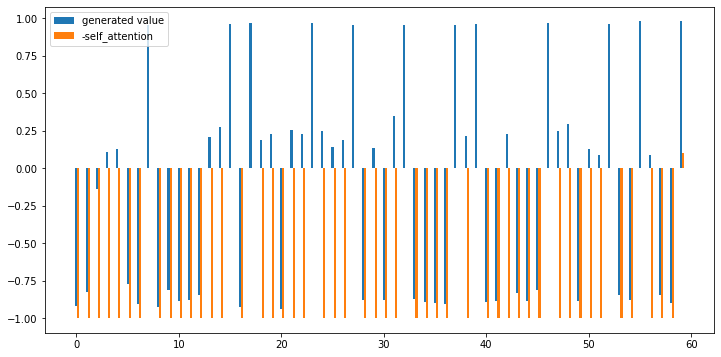

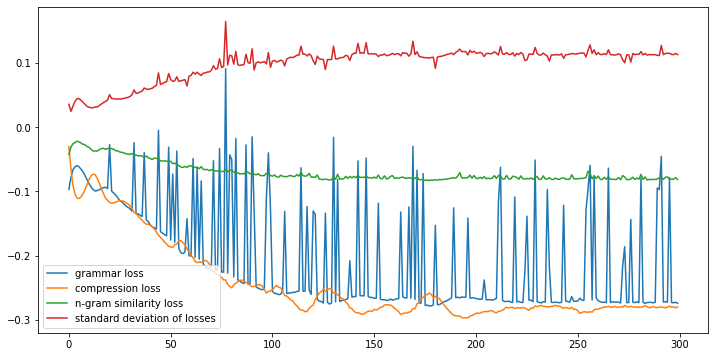

g 5.0549 	s -0.2181 	c 0.4822, score 1.6066, [감정선이 엇갈린 댄스 완성됐고 제작진 측은 대한 감정이 피어나는 천우빈이 각각 다른 파트너인 이혁과 소진공주와 함께 될 것이라며 더불어 예상치 못했던 드러나게 관심을 부탁드린다고 전했고 SBS 황후의 품격 분은 17일(오늘) 방송된다.]
g 5.0901 	s -0.1276 	c 0.4980, score 1.7188, [각각 엇갈린 댄스 완성됐고 제작진 측은 대한 감정이 피어나는 천우빈이 각각 다른 파트너인 이혁과 함께 심쿵을 될 것이라며 더불어 예상치 못했던 드러나게 관심을 부탁드린다고 전했고 SBS 황후의 품격 분은 17일(오늘) 방송된다.]
g 4.6935 	s -0.2400 	c 0.4545, score 1.4968, [감정선이 각각 엇갈린 댄스 완성됐고 제작진 측은 대한 감정이 피어나는 천우빈이 각각 다른 파트너인 이혁과 소진공주와 함께 심쿵을 될 것이라며 더불어 예상치 못했던 드러나게 관심을 부탁드린다고 전했고 SBS 황후의 품격 분은 17일(오늘) 방송된다.]
g -0.3215 	s -0.1497 	c 0.5138, score 0.7828, [감정선이 엇갈린 댄스 완성됐고 제작진 측은 대한 피어나는 천우빈이 각각 다른 파트너인 이혁과 소진공주와 함께 심쿵을 될 것이라며 더불어 예상치 못했던 드러나게 관심을 부탁드린다고 전했고 SBS 황후의 품격 분은 방송된다.]
g 3.7598 	s -0.1900 	c 0.4862, score 1.4228, [감정선이 각각 엇갈린 댄스 완성됐고 제작진 측은 대한 감정이 피어나는 다른 파트너인 이혁과 소진공주와 함께 심쿵을 될 것이라며 더불어 예상치 못했던 드러나게 관심을 부탁드린다고 전했고 SBS 황후의 품격 분은 17일(오늘) 방송된다.]
g 4.9465 	s -0.0959 	c 0.4941, score 1.7226, [각각 엇갈린 댄스 완성됐고 제작진 측은 대한 감정이 피어나는 각각 다른 파트너인 이혁과 소진공주와 함께 심쿵을 될 

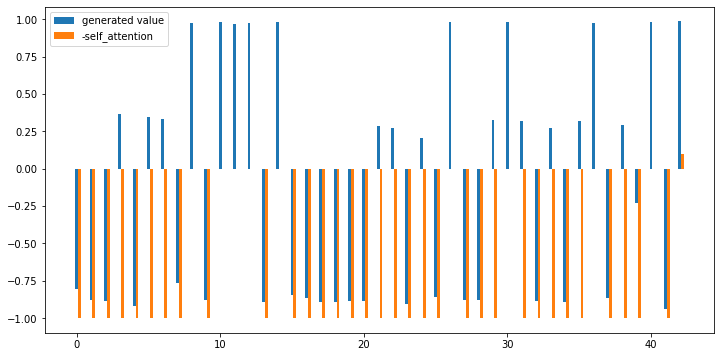

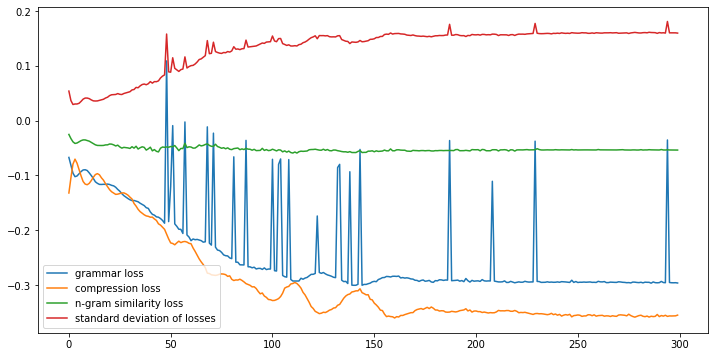

g 4.8977 	s -0.1356 	c 0.5569, score 1.6238, [상무는 이하 연구자의 비율이 이를 정도로 신진 좋은 연구 과제엔 난치병 등 해결을 위한 과제도 포함됐고 좀 더 두겠다는 뜻이 결과다.]
g 4.3120 	s -0.1191 	c 0.5689, score 1.5307, [상무는 이하 연구자의 비율이 이를 정도로 신진 좋은 연구 과제엔 난치병 등 해결을 위한 과제도 포함됐고 더 두겠다는 뜻이 결과다.]
g 4.7585 	s -0.1099 	c 0.5749, score 1.6083, [상무는 연구자의 비율이 이를 정도로 신진 좋은 연구 과제엔 난치병 등 해결을 위한 과제도 포함됐고 좀 더 두겠다는 뜻이 결과다.]
요약률 0.5569 유사성 -0.1356 문법성 4.8977 요약 [상무는 이하 연구자의 비율이 이를 정도로 신진 좋은 연구 과제엔 난치병 등 해결을 위한 과제도 포함됐고 좀 더 두겠다는 뜻이 결과다.]
--------------------------------------------------
상무는 이하 연구자의 비율이 이를 정도로 신진 좋은 연구 과제엔 난치병 등 해결을 위한 과제도 포함됐고 좀 더 두겠다는 뜻이 결과다. 1.6237532579732274 4.897724628448486
================================================== Original Document 184==================================================
[ 황정수 기자 ] "떠나온 해안이 눈에서 사라지는 것을 감수할 용기가 없는 자는 새로운 바다를 발견할 수 없다 ".
삼성미래기술육성재단 이사장에 내정된 김성근 서울대 교수는 10일 서울 세종대로 삼성전자 기자실에서 열린 '2019년 상반기 삼성미래기술육성사업 선정' 브리핑에서 소설가 앙드레 지드의 경구를 인용했다.
'안전한 육로'로 예정된 목적지에 가는 것보다 '험한 바다'에 과감히 도전하는 연구 풍토를 조성하는 데 힘쓰겠

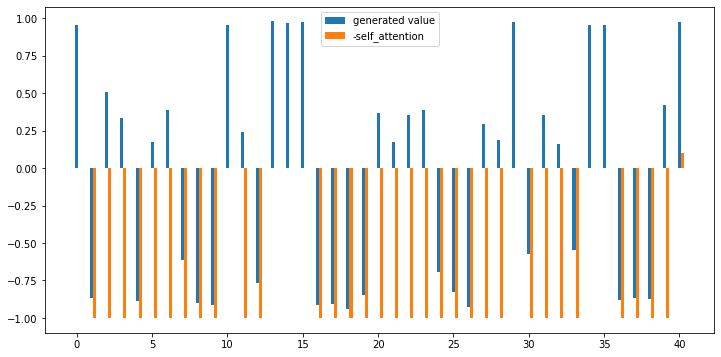

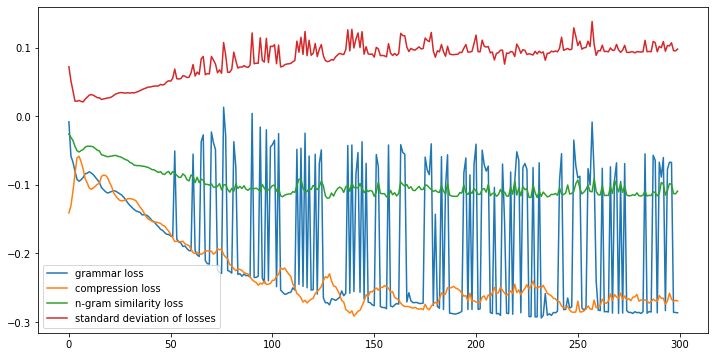

g -1.5718 	s 0.0627 	c 0.6230, score 0.6777, [단 이사장은 시절 새로운 인물을 대한 여부에 관심이 것으로 보인고 산하기관장 후보에 대해서는 부터 철저한 것이다”고 말했다.]
g 5.1351 	s -0.0123 	c 0.4481, score 1.7916, [단 신용보증재단 이사장은 전남지사 시절 새로운 인물을 대한 여부에 관심이 중 결정될 것으로 보인고 산하기관장 후보에 대해서는 인사청문회가 진행된다”며 부터 철저한 것이다”고 말했다.]
g 0.7081 	s 0.0617 	c 0.6284, score 1.0513, [단 신용보증재단 전남지사 새로운 인물을 대한 여부에 관심이 중 후보에 대해서는 인사청문회가 부터 철저한 것이다”고 말했다.]
g 4.9191 	s 0.3107 	c 0.5246, score 2.1060, [단 이사장은 전남지사 시절 새로운 인물을 대한 여부에 관심이 중 결정될 것으로 보인고 산하기관장 후보에 대해서는 인사청문회가 부터 철저한 것이다”고 말했다.]
g 5.2651 	s 0.0360 	c 0.4590, score 1.8725, [단 신용보증재단 이사장은 전남지사 시절 새로운 인물을 대한 여부에 관심이 결정될 것으로 보인고 산하기관장 후보에 대해서는 인사청문회가 진행된다”며 부터 철저한 것이다”고 말했다.]
g 5.1438 	s 0.1950 	c 0.5246, score 2.0277, [단 신용보증재단 이사장은 전남지사 시절 새로운 인물을 대한 여부에 관심이 중 결정될 것으로 보인고 산하기관장 후보에 대해서는 부터 철저한 것이다”고 말했다.]
g -4.2378 	s 0.2139 	c 0.6230, score 0.3846, [단 신용보증재단 새로운 대한 여부에 관심이 중 것으로 보인고 산하기관장 대해서는 인사청문회가 부터 철저한 것이다”고 말했다.]
g -5.1712 	s -0.1713 	c 0.5956, score -0.1288, [단 신용보증재단 이사장은 전남지사 시절 새로운 인물을 대한 여부에 관심이

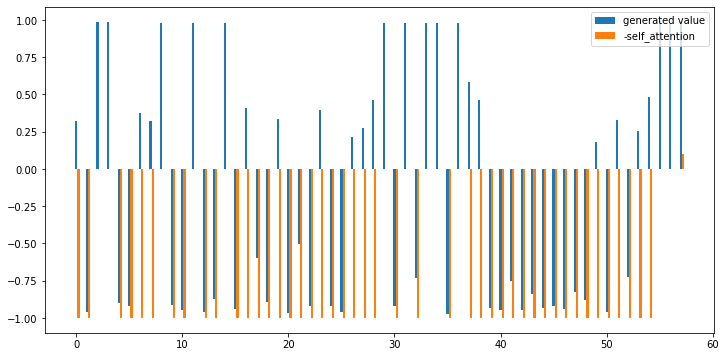

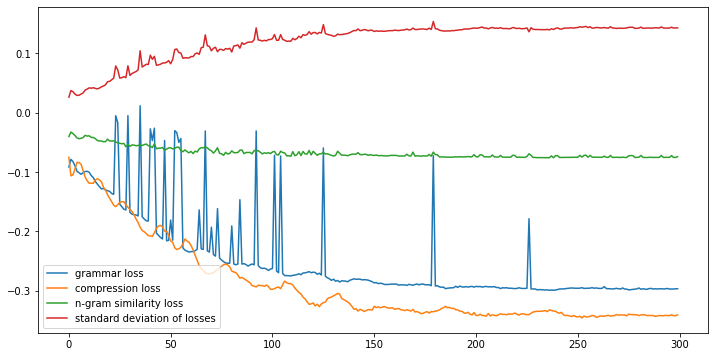

g 5.1990 	s 0.1930 	c 0.5268, score 2.0327, [조 나이가 올해 신한지주 내부규범에서 정한 제한 선임 만 연임 이하와도 연임 가능성을 높인고 다만 1월 앞두고 있는 관여 혐의 1심 연임하는데 없겠지만 인정된다면 부담이 될 것이라고 말했다.]
g 4.6182 	s 0.1670 	c 0.5402, score 1.8965, [조 나이가 올해 신한지주 내부규범에서 정한 제한 선임 만 연임 이하와도 가능성을 높인고 다만 1월 앞두고 있는 관여 혐의 1심 연임하는데 없겠지만 인정된다면 부담이 될 것이라고 말했다.]
g -1.9671 	s 0.2513 	c 0.5446, score 0.8788, [조 나이가 올해 신한지주 내부규범에서 정한 제한 선임 만 연임 이하와도 연임 가능성을 다만 1월 앞두고 있는 관여 혐의 1심 연임하는데 없겠지만 인정된다면 부담이 될 것이라고 말했다.]
g 5.1167 	s 0.2028 	c 0.5402, score 2.0154, [조 나이가 올해 신한지주 내부규범에서 정한 제한 선임 만 이하와도 연임 가능성을 높인고 다만 1월 앞두고 있는 관여 혐의 1심 연임하는데 없겠지만 인정된다면 부담이 될 것이라고 말했다.]
g 5.2371 	s 0.1452 	c 0.5670, score 1.9511, [조 나이가 올해 신한지주 내부규범에서 정한 제한 선임 만 연임 이하와도 가능성을 높인고 다만 1월 앞두고 있는 관여 혐의 1심 연임하는데 없겠지만 부담이 될 것이라고 말했다.]
g 4.8918 	s 0.1869 	c 0.5491, score 1.9531, [조 나이가 올해 신한지주 내부규범에서 정한 제한 선임 연임 이하와도 가능성을 높인고 다만 1월 앞두고 있는 관여 혐의 1심 연임하는데 없겠지만 인정된다면 부담이 될 것이라고 말했다.]
요약률 0.5268 유사성 0.1930 문법성 5.1990 요약 [조 나이가 올해 신한지주 내부규범에서 정한 제한 선임 만 연임 이하와도 연임 가능성을 높인고 다만 1월 앞두고 있는 관여 

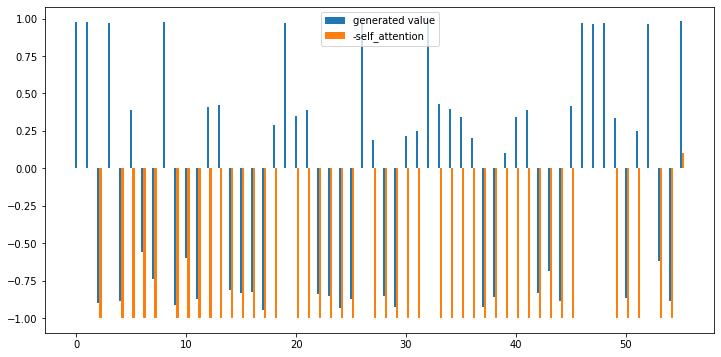

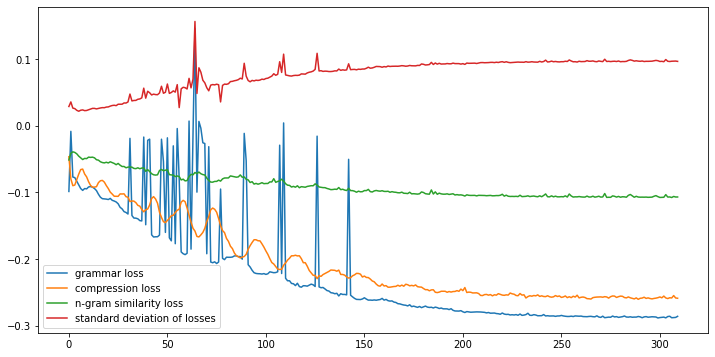

g 5.1033 	s -0.1255 	c 0.4766, score 1.7017, [뿐만 아니라 특별한 도전이 바로 게임으로 평소 성공할 수 있을지 신서유기7 수 있을지 매회 빈틈 없는 웃음을 선사하며 방송 2주만에 6% 최고 8 큰 사랑을 받고 있는 신서유기7은 금요일 밤 방송된다.]
g 5.2071 	s -0.0887 	c 0.5000, score 1.7791, [뿐만 아니라 특별한 도전이 바로 평소 성공할 수 있을지 신서유기7 수 있을지 매회 빈틈 없는 웃음을 선사하며 방송 2주만에 6% 최고 8 큰 사랑을 받고 있는 신서유기7은 금요일 밤 방송된다.]
g -1.4243 	s -0.1487 	c 0.5140, score 0.5999, [뿐만 아니라 특별한 바로 게임으로 평소 성공할 수 있을지 신서유기7 수 있을지 매회 빈틈 없는 선사하며 방송 2주만에 6% 최고 8 큰 사랑을 받고 있는 신서유기7은 금요일 밤 방송된다.]
g 5.0768 	s -0.1332 	c 0.4953, score 1.7083, [뿐만 아니라 특별한 도전이 바로 게임으로 평소 성공할 수 있을지 신서유기7 수 매회 빈틈 없는 웃음을 선사하며 방송 2주만에 6% 최고 8 큰 사랑을 받고 있는 신서유기7은 금요일 밤 방송된다.]
g 5.2036 	s -0.1408 	c 0.4907, score 1.7171, [뿐만 아니라 특별한 도전이 바로 게임으로 평소 성공할 수 있을지 신서유기7 수 있을지 매회 빈틈 없는 웃음을 선사하며 방송 2주만에 최고 8 큰 사랑을 받고 있는 신서유기7은 금요일 밤 방송된다.]
g 5.0111 	s -0.1191 	c 0.4907, score 1.7068, [뿐만 아니라 특별한 도전이 바로 게임으로 평소 성공할 수 있을지 신서유기7 수 있을지 매회 빈틈 없는 웃음을 선사하며 2주만에 6% 최고 8 큰 사랑을 받고 있는 신서유기7은 금요일 밤 방송된다.]
g 5.2186 	s -0.1064 	c 0.4907, score 1.7541, [뿐만 아니라 특별한 도전이 바

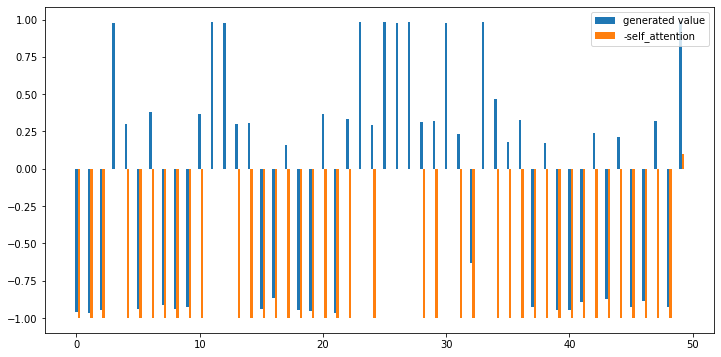

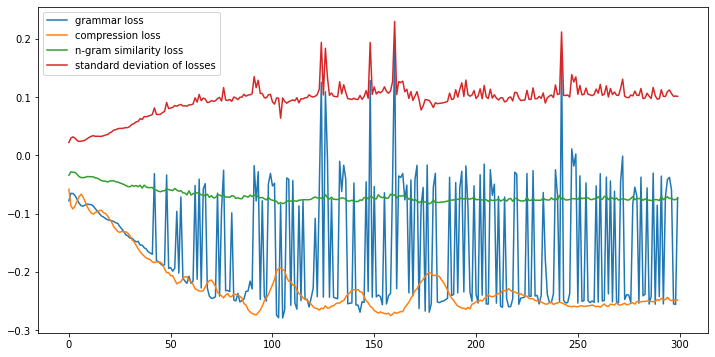

g 2.9739 	s 0.0686 	c 0.5023, score 1.5620, [축적 인허가 자료를 활용할 방침이고 아울러 올 가동 시·군으로 공무원뿐 아니라 농민도 직접 활용할 수 있도록 할 계획이고 이번 시스템 개발로 경기도가 4차 제시했다면서 분석대상 확대할 말했다.]
g -0.4776 	s 0.0635 	c 0.4558, score 0.9397, [축적 중장기적으로는 인허가 자료를 활용할 방침이고 아울러 가동 시·군으로 공무원뿐 아니라 농민도 직접 활용할 수 있도록 할 계획이고 경기도 이번 시스템 개발로 경기도가 4차 제시했다면서 분석대상 확대할 말했다.]
g 1.4157 	s 0.0814 	c 0.4465, score 1.2639, [축적 중장기적으로는 인허가 자료를 활용할 방침이고 아울러 올 가동 시·군으로 공무원뿐 아니라 농민도 직접 활용할 수 있도록 할 계획이고 경기도 이번 시스템 개발로 경기도가 4차 제시했다면서 분석대상 확대할 말했다.]
g 4.3159 	s 0.1998 	c 0.4977, score 1.9168, [축적 중장기적으로는 인허가 자료를 활용할 방침이고 아울러 올 가동 시·군으로 공무원뿐 아니라 농민도 직접 활용할 수 있도록 할 계획이고 경기도 이번 시스템 개발로 경기도가 4차 분석대상 말했다.]
g 2.7991 	s 0.0845 	c 0.4837, score 1.5348, [축적 인허가 자료를 활용할 방침이고 아울러 올 가동 시·군으로 공무원뿐 아니라 농민도 직접 활용할 수 있도록 할 계획이고 경기도 이번 시스템 개발로 경기도가 4차 제시했다면서 분석대상 확대할 말했다.]
g 2.8698 	s 0.0520 	c 0.5023, score 1.5280, [축적 인허가 자료를 활용할 방침이고 아울러 올 가동 시·군으로 공무원뿐 아니라 농민도 직접 활용할 수 있도록 할 계획이고 경기도 이번 개발로 경기도가 4차 제시했다면서 분석대상 확대할 말했다.]
g -0.3478 	s 0.0475 	c 0.4930, score 0.9826, [축적

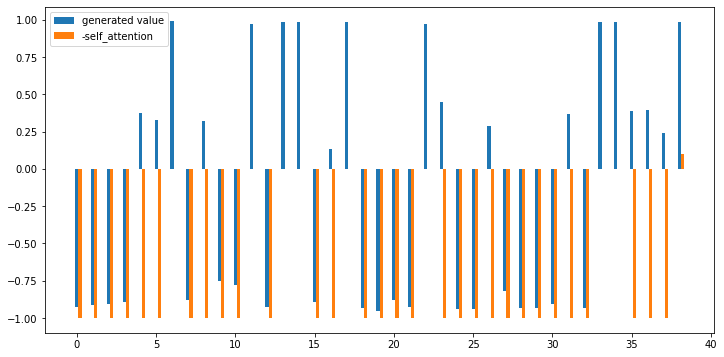

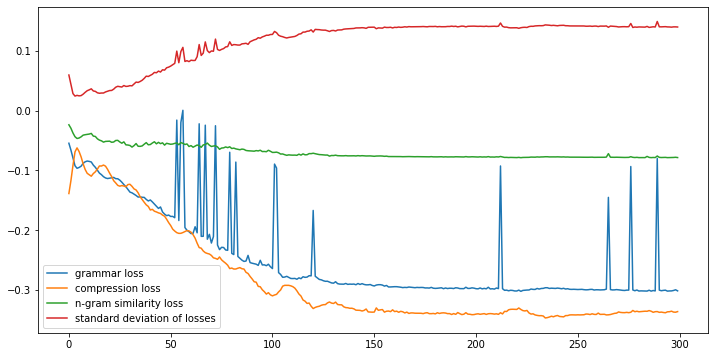

g 2.8169 	s 0.1381 	c 0.5247, score 1.5829, [확정 지으며 열일 예고하고 안정적인 바탕으로 다양한 출연해온 만큼 모으고 있고 분다’는 오는 27일 밤 9시 30분 JTBC에서 방송된다.]
g -0.4299 	s 0.1617 	c 0.5432, score 1.0469, [지으며 열일 예고하고 안정적인 바탕으로 다양한 출연해온 만큼 모으고 있고 분다’는 오는 27일 밤 9시 30분 JTBC에서 방송된다.]
g -0.9545 	s 0.1724 	c 0.5432, score 0.9701, [확정 지으며 열일 예고하고 안정적인 바탕으로 다양한 출연해온 만큼 모으고 있고 분다’는 27일 밤 9시 30분 JTBC에서 방송된다.]
요약률 0.5247 유사성 0.1381 문법성 2.8169 요약 [확정 지으며 열일 예고하고 안정적인 바탕으로 다양한 출연해온 만큼 모으고 있고 분다’는 오는 27일 밤 9시 30분 JTBC에서 방송된다.]
재시도 max score:1.582925593043551 grammar:2.816873550415039 text:확정 지으며 열일 예고하고 안정적인 바탕으로 다양한 출연해온 만큼 모으고 있고 분다’는 오는 27일 밤 9시 30분 JTBC에서 방송된다.
--------------------------------------------------
여기에 ‘바람이 분다’의 출연까지 확정 지으며 열일 행보를 예고하고 있다. 그동안 안정적인 연기력을 바탕으로 다양한 작품에 출연해온 만큼 이번 연기 변신도 기대를 모으고 있다. 한편 ‘바람이 분다’는 ‘으라차차 와이키키 2’ 후속으로 오는 5월 27일 밤 9시 30분 JTBC에서 방송된다.
--------------------------------------------------
Length ------------------------------------| 39
{0: -1.0, 1: -1.0, 2: -1.0, 3: -1.0, 4: -1.0, 5: -1.0, 6: 0.0,

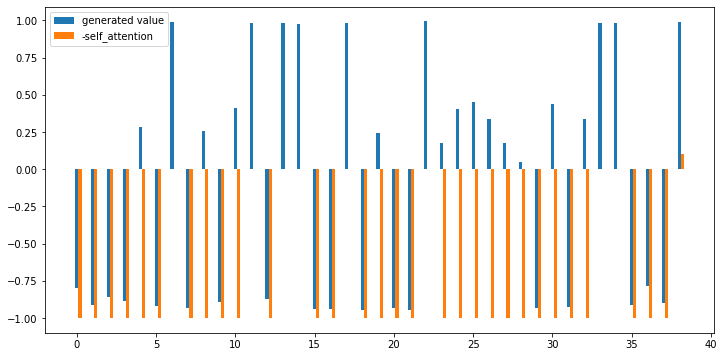

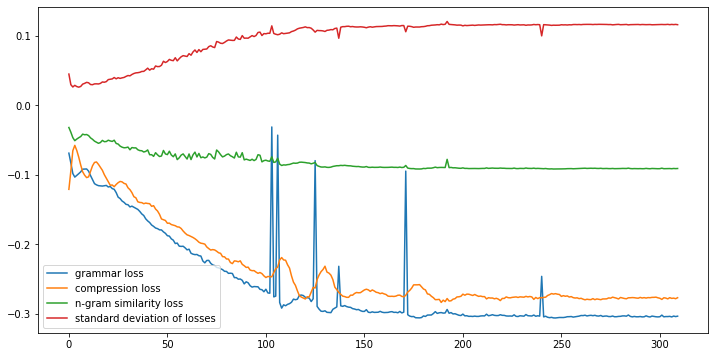

g 2.5261 	s -0.0387 	c 0.4753, score 1.3577, [확정 열일 예고하고 그동안 안정적인 바탕으로 다양한 만큼 연기 모으고 있고 한편 ‘바람이 분다’는 ‘으라차차 와이키키 후속으로 5월 27일 밤 방송된다.]
g 2.2429 	s 0.0908 	c 0.5062, score 1.4585, [확정 열일 예고하고 그동안 안정적인 바탕으로 다양한 만큼 연기 모으고 있고 한편 ‘바람이 분다’는 ‘으라차차 후속으로 5월 27일 밤 방송된다.]
g 4.5165 	s 0.0336 	c 0.4938, score 1.7802, [열일 예고하고 그동안 안정적인 바탕으로 다양한 만큼 연기 모으고 있고 한편 ‘바람이 분다’는 ‘으라차차 와이키키 후속으로 5월 27일 밤 방송된다.]
g -0.9937 	s 0.0174 	c 0.4938, score 0.8456, [확정 열일 예고하고 그동안 안정적인 바탕으로 다양한 만큼 연기 모으고 있고 한편 ‘바람이 분다’는 ‘으라차차 와이키키 후속으로 27일 밤 방송된다.]
요약률 0.4938 유사성 0.0336 문법성 4.5165 요약 [열일 예고하고 그동안 안정적인 바탕으로 다양한 만큼 연기 모으고 있고 한편 ‘바람이 분다’는 ‘으라차차 와이키키 후속으로 5월 27일 밤 방송된다.]
--------------------------------------------------
열일 예고하고 그동안 안정적인 바탕으로 다양한 만큼 연기 모으고 있고 한편 ‘바람이 분다’는 ‘으라차차 와이키키 후속으로 5월 27일 밤 방송된다. 1.7802005572083557 4.516487121582031
================================================== Original Document 198==================================================
배우 김영재가 JTBC 새 월화드라마 ‘바람이 분다’에 캐스팅됐다.
JTBC 새 월화드라마 ‘바람이 분다’(극본 황주하

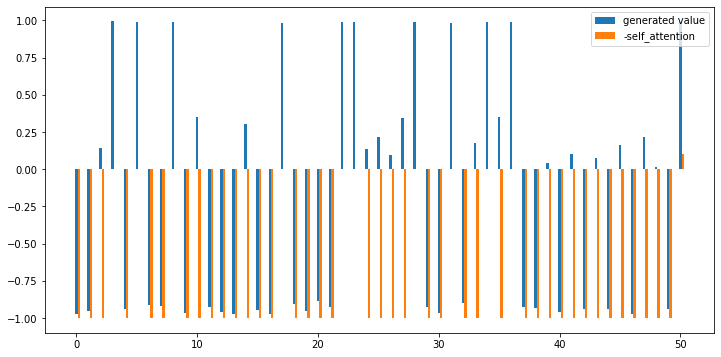

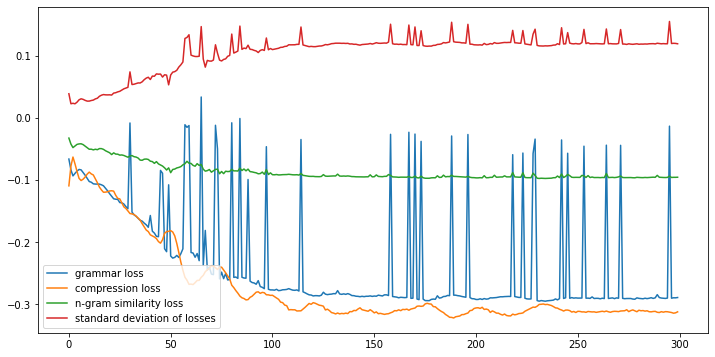

g 3.0606 	s 0.2165 	c 0.4829, score 1.7096, [쉬고 있다면 수밖에 움직임이 정지된 상태는 아니고 전제로 하며 굳이 육체적인 것에만 한정되는 것은 완전한 생명을 부여 받기 전 창조물들 평등과 겸손함이며 최고임을 인본주의적 가치에 비판이다.]
g 3.1271 	s 0.2915 	c 0.4976, score 1.8103, [쉬고 있다면 수밖에 움직임이 정지된 상태는 아니고 전제로 하며 육체적인 것에만 한정되는 것은 완전한 생명을 부여 받기 전 창조물들 평등과 겸손함이며 최고임을 인본주의적 가치에 비판이다.]
g 0.1075 	s 0.0435 	c 0.5415, score 1.0200, [있다면 수밖에 움직임이 정지된 아니고 전제로 하며 굳이 육체적인 것에만 한정되는 것은 완전한 생명을 부여 받기 전 창조물들 평등과 겸손함이며 인본주의적 가치에 비판이다.]
g -2.6616 	s 0.3198 	c 0.5463, score 0.8299, [쉬고 있다면 수밖에 움직임이 아니고 전제로 하며 굳이 것에만 한정되는 것은 완전한 생명을 부여 받기 전 창조물들 평등과 겸손함이며 최고임을 인본주의적 가치에 비판이다.]
g 4.0103 	s 0.0377 	c 0.5268, score 1.6793, [쉬고 있다면 수밖에 움직임이 정지된 아니고 전제로 하며 굳이 육체적인 것에만 한정되는 것은 완전한 생명을 부여 받기 전 창조물들 평등과 겸손함이며 인본주의적 가치에 비판이다.]
g -5.3784 	s 0.3917 	c 0.5268, score 0.4685, [쉬고 있다면 수밖에 움직임이 정지된 상태는 아니고 전제로 하며 굳이 육체적인 것에만 것은 완전한 부여 받기 전 창조물들 평등과 겸손함이며 최고임을 인본주의적 가치에 비판이다.]
g -1.8310 	s 0.2899 	c 0.5122, score 0.9725, [있다면 수밖에 움직임이 정지된 상태는 아니고 전제로 하며 굳이 육체적인 것에만 한정되는 것은 완전한 생명을 부여 전 창조물들 평등과 겸손함이며 

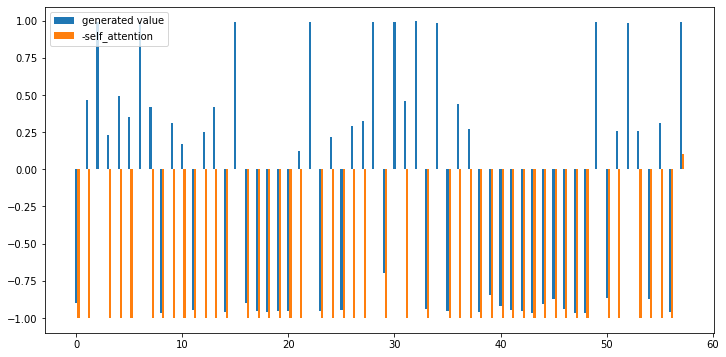

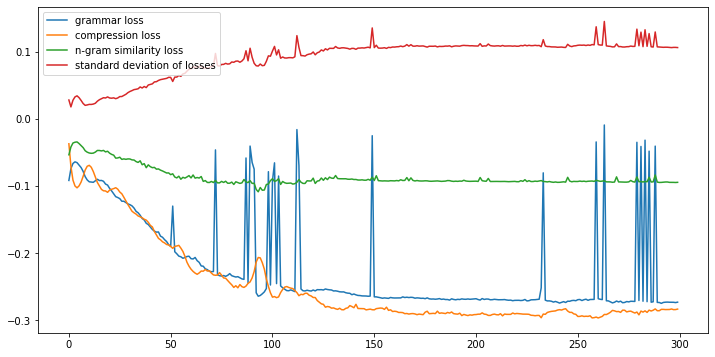

g 5.2350 	s 0.2610 	c 0.5314, score 2.1021, [창업도전 등 공동체 활동과 청년모임 간 협력사업 등을 위한 강사료 진행비 등으로 생활권을 두고 만 만 39세 이하 구성된 3인 이상의 지원할 있고 서남권 만큼 아이디어를 가진 청년들이 참여하길 말했다.]
g -1.0770 	s 0.2638 	c 0.5607, score 1.0236, [창업도전 등 활동과 청년모임 간 협력사업 등을 강사료 진행비 등으로 생활권을 두고 만 만 39세 이하 구성된 3인 이상의 지원할 있고 서남권 만큼 아이디어를 가진 청년들이 참여하길 말했다.]
g 3.4525 	s 0.2233 	c 0.5439, score 1.7548, [창업도전 등 공동체 활동과 청년모임 간 협력사업 등을 강사료 진행비 등으로 생활권을 두고 만 만 39세 이하 구성된 3인 이상의 지원할 있고 서남권 만큼 아이디어를 가진 청년들이 참여하길 말했다.]
g 5.2190 	s 0.2547 	c 0.5481, score 2.0765, [창업도전 등 공동체 활동과 청년모임 간 협력사업 등을 위한 강사료 진행비 등으로 생활권을 두고 만 만 이하 구성된 3인 이상의 지원할 있고 서남권 만큼 아이디어를 가진 청년들이 참여하길 말했다.]
g 1.3315 	s 0.2606 	c 0.5523, score 1.4302, [창업도전 등 공동체 활동과 청년모임 간 등을 위한 강사료 진행비 등으로 생활권을 두고 만 만 39세 이하 구성된 3인 이상의 지원할 있고 서남권 만큼 아이디어를 가진 청년들이 참여하길 말했다.]
g 4.7550 	s 0.2604 	c 0.5649, score 1.9880, [창업도전 등 공동체 활동과 청년모임 간 협력사업 등을 강사료 진행비 등으로 두고 만 만 39세 이하 구성된 3인 이상의 지원할 있고 서남권 만큼 아이디어를 가진 청년들이 참여하길 말했다.]
g 5.0275 	s 0.2641 	c 0.5523, score 2.0497, [등 공동체 활동과 청년모임 간 협력사업 등을 위한

,ID,S1.R1,S1.R2,S1.RL,S1.Similarity,S1.Grammar,S2.R1,S2.R2,S2.RL,S2.Similarity,S2.Grammar,S3.R1,S3.R2,S3.RL,S3.Similarity,S3.Grammar
0,CNN/DM-0,0.053333,0.000000,0.053333,0.901448,0.999943,0.041667,0.000000,0.041667,0.819156,0.999943,0.034483,0.000000,0.034483,0.792388,0.999940
1,CNN/DM-3,0.024691,0.000000,0.024691,0.917508,0.999922,0.030769,0.000000,0.030769,0.716004,0.999926,0.026316,0.000000,0.026316,0.732391,0.999943
2,CNN/DM-4,0.244444,0.204545,0.244444,0.942656,0.999944,0.147059,0.090909,0.147059,0.924793,0.999944,0.135135,0.083333,0.135135,0.910650,0.999937
3,CNN/DM-5,0.000000,0.000000,0.000000,0.914846,0.999944,0.047619,0.000000,0.047619,0.882576,0.999890,0.040000,0.000000,0.040000,0.880501,0.999946
4,CNN/DM-6,0.157895,0.027027,0.131579,0.900561,0.999651,0.142857,0.000000,0.107143,0.874212,0.999646,0.125000,0.000000,0.093750,0.866223,0.999946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,CNN/DM-194,0.105263,0.000000,0.052632,0.894780,0.999931,0.040000,0.000000,0.040000,0.876210,0.999940,0.031746,0.000000,0.031746,0.864594,0.999941
97,CNN/DM-195,0.030769,0.000000,0.030769,0.917797,0.999943,0.047619,0.000000,0.047619,0.874786,0.999643,0.038462,0.000000,0.038462,0.893296,0.999940
98,CNN/DM-198,0.054054,0.027778,0.054054,0.935063,0.999945,0.072727,0.037736,0.072727,0.906848,0.999761,0.000000,0.000000,0.000000,0.893752,0.999946
99,CNN/DM-200,0.000000,0.000000,0.000000,0.932715,0.999946,0.000000,0.000000,0.000000,0.899053,0.999841,0.000000,0.000000,0.000000,0.907876,0.999936


In [52]:
import io

result_data = {}

result_data['ID'] = []
result_data['Original'] = []
result_data['Step1'] = []
result_data['Step2'] = []
result_data['Step3'] = []
result_data['Ground Truth'] = []

result_data['S1.R1'] = []
result_data['S1.R2'] = []
result_data['S1.RL'] = []
result_data['S1.Similarity'] = []
result_data['S1.Grammar'] = []

result_data['S2.R1'] = []
result_data['S2.R2'] = []
result_data['S2.RL'] = []
result_data['S2.Similarity'] = []
result_data['S2.Grammar'] = []

result_data['S3.R1'] = []
result_data['S3.R2'] = []
result_data['S3.RL'] = []
result_data['S3.Similarity'] = []
result_data['S3.Grammar'] = []

statistics_columns = ['S1.R1','S1.R2','S1.RL','S1.Similarity','S1.Grammar','S2.R1','S2.R2','S2.RL','S2.Similarity','S2.Grammar','S3.R1','S3.R2','S3.RL','S3.Similarity','S3.Grammar']

atten_rate = 0.2
similarity = 1.0
std_factor = 3.0

#es = ExtactiveSummarizer()

pd.set_option('display.max_columns', 100)

cnt = 0

logout = True
for rate in range(0,1):
    comp_rate=1.5
    #result_data['comp_rate'].append(comp_rate)
    for try_count in range(1000):

        full_text = get_prepared_doc(sentences_dataset[try_count])
        '''
        try:
            del model
            print('delete model')
        except Exception as ex:
            pass
        model = EncoderDecoderModel.from_pretrained("/content/drive/MyDrive/GAN_ENDE/en_sentence_complete_model")
        '''
        try:

            #org_text = besm(full_text,num_sentences=9)
            step1 = es.generate_summary(full_text,top_n=3,min_length=0)[0]
            
            if len(step1.replace('\n',' ').split(' ')) > 60:
                raise Exception('Too much sentence length...')

            org_sentences = np.array(nltk.sent_tokenize(step1.strip()))
            if logout:
                print('BESM Summary sentance length:',len(org_sentences))
            (step2,step3),grammar,simil = summary(full_text,step1,steps=3,top_rank=3,comp_rate=comp_rate)
            '''
            tmp = []
            for txt in np.array(nltk.sent_tokenize(step2.strip())):
                tmp.append(sentence_correct(txt))         
            step3 = ' '.join(tmp)
            '''

            ground_trouth = gold_summary[try_count]
            
            print('='*50 + ' Original Document ' + str(try_count) + '='*50)
            for txt in np.array(nltk.sent_tokenize(full_text)):
                print(txt)
            print('-'*50 + ' Step1 ' + str(try_count) + '-'*50)
            for txt in np.array(nltk.sent_tokenize(step1.strip())):
                print(txt)                
            print('-'*50 + ' Step2 ' + str(try_count) + '-'*50)
            for txt in np.array(nltk.sent_tokenize(step2.strip())):
                print(txt)
            print('-'*50 + ' Step3 ' + str(try_count) + '-'*50)
            for txt in np.array(nltk.sent_tokenize(step3.strip())):
                print(txt)                
            print('-'*50 + ' Ground truth' + '-'*50)
            print(ground_trouth)
            print('-'*120)

            #with io.open('/content/drive/MyDrive/GAN_ENDE/CNN_Daily_summary_result.txt','a',encoding='utf8') as f:
            #    f.write(org_text + '\r\n\r\n')
            s1_rouge = scorer.score(ground_trouth,step1)
            s2_rouge = scorer.score(ground_trouth,step2)
            s3_rouge = scorer.score(ground_trouth,step3)
            s1_simil = similarity3(full_text,step1)
            s2_simil = similarity3(full_text,step2)
            s3_simil = similarity3(full_text,step3)
            s1_gramm = grammar3(full_text,step1)
            s2_gramm = grammar3(full_text,step2) 
            s3_gramm = grammar3(full_text,step3)  
            #print(scores['rouge1'].fmeasure)
            #if s2_rouge['rouge1'].fmeasure > 0.1:

            result_data['ID'].append('CNN/DM-'+str(try_count))
            result_data['Original'].append(full_text)
            result_data['Step1'].append(step1)
            result_data['Step2'].append(step2)
            result_data['Step3'].append(step3)
            result_data['Ground Truth'].append(ground_trouth)

            result_data['S1.R1'].append(s1_rouge['rouge1'].fmeasure)
            result_data['S1.R2'].append(s1_rouge['rouge2'].fmeasure)
            result_data['S1.RL'].append(s1_rouge['rougeL'].fmeasure)
            result_data['S1.Similarity'].append(s1_simil)
            result_data['S1.Grammar'].append(s1_gramm)

            result_data['S2.R1'].append(s2_rouge['rouge1'].fmeasure)
            result_data['S2.R2'].append(s2_rouge['rouge2'].fmeasure)
            result_data['S2.RL'].append(s2_rouge['rougeL'].fmeasure)
            result_data['S2.Similarity'].append(s2_simil)
            result_data['S2.Grammar'].append(s2_gramm)

            result_data['S3.R1'].append(s3_rouge['rouge1'].fmeasure)
            result_data['S3.R2'].append(s3_rouge['rouge2'].fmeasure)
            result_data['S3.RL'].append(s3_rouge['rougeL'].fmeasure)
            result_data['S3.Similarity'].append(s3_simil)
            result_data['S3.Grammar'].append(s3_gramm)

            print()
            df_result_data = pd.DataFrame(result_data)
            print(df_result_data[statistics_columns].iloc[-1])
            print()
            df_mean = df_result_data[statistics_columns].mean()
            print('** Mean result **')
            print(df_mean)
            del df_mean
            del df_result_data

            cnt+=1
            if cnt > 100:
                break

        except Exception as ex:
            print(ex)

print('** Total mean result **')
df_result_data = pd.DataFrame(result_data)
df_mean = df_result_data[statistics_columns].mean()
print(df_mean)
df_result_data.to_pickle("/content/drive/MyDrive/GAN_ENDE/df_result_93.pkl")

df_result_data[['ID']+statistics_columns]